In [1]:
import os
import boto3
from dotenv import load_dotenv
import pandas as pd
import numpy as np
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import lightgbm as lgb
from catboost import CatBoostClassifier, Pool
from bayes_opt import BayesianOptimization

In [2]:
load_dotenv()

True

In [23]:
# Custom function to reduce memory usage of data

def reduce_mem_usage(df, verbose=True):
    numerics = ['int8','int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float32)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [21]:
AWS_S3_BUCKET = os.getenv("AWS_S3_BUCKET")
AWS_ACCESS_KEY_ID = os.getenv("AWS_ACCESS_KEY_ID")
AWS_SECRET_ACCESS_KEY = os.getenv("AWS_SECRET_ACCESS_KEY")

In [24]:
s3_client = boto3.client(
    "s3",
    aws_access_key_id=AWS_ACCESS_KEY_ID,
    aws_secret_access_key=AWS_SECRET_ACCESS_KEY
)

response = s3_client.get_object(Bucket=AWS_S3_BUCKET, Key="processed/tcga_processed.csv")

status = response.get("ResponseMetadata", {}).get("HTTPStatusCode")

if status == 200:
    print(f"Successful S3 get_object response. Status - {status}")
    input_df = reduce_mem_usage(pd.read_csv(response.get("Body")))
    print(input_df.info())
else:
    print(f"Unsuccessful S3 get_object response. Status - {status}")

Successful S3 get_object response. Status - 200
Mem. usage decreased to  0.57 Mb (86.1% reduction)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10017 entries, 0 to 10016
Data columns (total 54 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Primary_Site                                    10017 non-null  int8   
 1   Deceased_Status                                 10017 non-null  int8   
 2   Age_At_Diagnosis                                10017 non-null  float32
 3   Prior_Malignancy                                10017 non-null  int8   
 4   Synchronous_Malignancy                          10017 non-null  int8   
 5   TP53                                            10017 non-null  int8   
 6   PIK3CA                                          10017 non-null  int8   
 7   TTN                                             10017 non-null  int8   
 8   CDH1             

In [25]:
print(input_df.shape)
input_df.head()

(10017, 54)


,Primary_Site,Deceased_Status,Age_At_Diagnosis,Prior_Malignancy,Synchronous_Malignancy,TP53,PIK3CA,TTN,CDH1,GATA3,...,ICE1,SMAD4,CDKN2A,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_native hawaiian or other pacific islander,Race_other,Race_white,Weight
0,0,0,9.602739,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0.231201
1,0,0,6.375342,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201
2,0,0,16.753426,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201
3,0,0,16.038357,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201
4,0,0,14.052054,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.231201


In [26]:
# Splitting training and testing data

target = input_df['Primary_Site']
features = input_df.drop('Primary_Site', axis=1)

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.1, random_state=42)

X_train.shape, X_test.shape

((9015, 53), (1002, 53))

## LightGBM Algorithm

In [10]:
# Creating lightgbm datasets

lgb_train = lgb.Dataset(X_train.drop('Weight', axis=1), label=y_train, weight=X_train['Weight'])
lgb_test = lgb.Dataset(X_test.drop('Weight', axis=1), label=y_test, weight=X_test['Weight'], reference=lgb_train)

In [11]:
def bayes_parameter_opt_lgb(X, y, init_round=15, opt_round=25, n_folds=3, random_seed=6,n_estimators=10000, output_process=False):
    # prepare data
    train_data = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
    # parameters
    def lgb_eval(num_class, learning_rate,num_leaves, feature_fraction, bagging_fraction, max_depth, max_bin, min_data_in_leaf,min_sum_hessian_in_leaf,subsample):
        params = {'objective':'multiclass', 'metric':'multi_logloss'}
        params['num_class'] = 9
        params['learning_rate'] = max(min(learning_rate, 1), 0)
        params["num_leaves"] = int(round(num_leaves))
        params['feature_fraction'] = max(min(feature_fraction, 1), 0)
        params['bagging_fraction'] = max(min(bagging_fraction, 1), 0)
        params['max_depth'] = int(round(max_depth))
        params['max_bin'] = int(round(max_depth))
        params['min_data_in_leaf'] = int(round(min_data_in_leaf))
        params['min_sum_hessian_in_leaf'] = min_sum_hessian_in_leaf
        params['subsample'] = max(min(subsample, 1), 0)
        
        cv_result = lgb.cv(params, train_data, nfold=n_folds, seed=random_seed, stratified=True, verbose_eval =200, metrics=['multi_logloss'])
        return max(cv_result['multi_logloss-mean'])
     
    lgbBO = BayesianOptimization(lgb_eval, {
                                            'num_class': (9, 9),
                                            'learning_rate': (0.01, 1.0),
                                            'num_leaves': (24, 80),
                                            'feature_fraction': (0.1, 0.9),
                                            'bagging_fraction': (0.8, 1),
                                            'max_depth': (5, 30),
                                            'max_bin':(20,90),
                                            'min_data_in_leaf': (20, 80),
                                            'min_sum_hessian_in_leaf':(0,100),
                                            'subsample': (0.01, 1.0)
                                            }, random_state=200)

    
    #n_iter: How many steps of bayesian optimization you want to perform. The more steps the more likely to find a good maximum you are.
    #init_points: How many steps of random exploration you want to perform. Random exploration can help by diversifying the exploration space.
    
    lgbBO.maximize(init_points=init_round, n_iter=opt_round)
    
    model_acc=[]
    for model in range(len(lgbBO.res)):
        model_acc.append(lgbBO.res[model]['target'])
    
    # return best parameters
    return lgbBO.res[pd.Series(model_acc).idxmax()]['target'],lgbBO.res[pd.Series(model_acc).idxmax()]['params']

opt_params = bayes_parameter_opt_lgb(X_train, y_train, init_round=5, opt_round=10, n_folds=3, random_seed=6,n_estimators=10000)

|   iter    |  target   | baggin... | featur... | learni... |  max_bin  | max_depth | min_da... | min_su... | num_class | num_le... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------------------
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] bagging_fraction is set=0.9895264513703341, subsample=0.9819846820667453 will be ignored. Current value: bagging_fraction=0.9895264513703341
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000945 seconds.
You can set `force_row_wise=true` t

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] bagging_fraction is set=0.9652100294394654, subsample=0.11437976620936573 will be ignored. Current value: bagging_fraction=0.9652100294394654
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 48
[LightGBM] [Warning] bagging_fraction is set=0.9652100294394654, subsample=0.11437976620936573 will be ignored. Current value: bagging_fraction=0.9652100294394654
[LightGBM] [Info] Start training from score -0.734247
[LightGBM] [Info] Start training from score -2.213496
[LightGBM] [Info] Start training from score -2.249131
[LightGBM] [Info] Start training from score -2.373243
[LightGBM] [Info] Start training from score -2.675314
[LightGBM] [Info] Start training from score -2.740

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

| 3         | 0.7962    | 0.9652    | 0.5147    | 0.8748    | 60.49     | 16.25     | 60.81     | 41.94     | 9.0       | 58.08     | 0.1144    |
[LightGBM] [Warning] bagging_fraction is set=0.9652100294394654, subsample=0.11437976620936573 will be ignored. Current value: bagging_fraction=0.9652100294394654
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current value: bagging_fraction=0.9932089178072061
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current value: bagging_fraction=0.9932089178072061
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current value: bagging_fraction=0.9932089178072061
[LightGBM] [Warning] bagging_fraction is set=0.9932089178072061, subsample=0.27291934875629753 will be ignored. Current va

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000557 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 51
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.837537828398457

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8790411164946128, subsample=0.31034307775929715 will be ignored. Current value: bagging_fraction=0.8790411164946128
[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=0.8790411164946128, subsample=0.31034307775929715 will be ignored. Current value: bagging_fraction=0.8790411164946128
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features:

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] bagging_fraction is set=0.8375378283984576, subsample=0.7937470590911849 will be ignored. Current value: bagging_fraction=0.8375378283984576
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000470 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 141
[LightGBM] [Info] Number of 

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000528 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves 

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000479 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 129
[LightGBM] [Info] Number of data points in the train set: 6010, numbe

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number o

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 6010, number of used features: 53
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 6010, numbe

D:\anaconda3\Lib\site-packages\lightgbm\engine.py:620: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [12]:
opt_params[1]["num_leaves"] = int(round(opt_params[1]["num_leaves"]))
opt_params[1]['max_depth'] = int(round(opt_params[1]['max_depth']))
opt_params[1]['min_data_in_leaf'] = int(round(opt_params[1]['min_data_in_leaf']))
opt_params[1]['max_bin'] = int(round(opt_params[1]['max_bin']))
opt_params[1]['objective']='multiclass'
opt_params[1]['metric']='multi_logloss'
opt_params[1]['num_class'] = 9
opt_params[1]['boost_from_average']=False
lgb_params=opt_params[1]

lgb_params

{'bagging_fraction': 0.8,
 'feature_fraction': 0.1,
 'learning_rate': 0.01,
 'max_bin': 20,
 'max_depth': 5,
 'min_data_in_leaf': 20,
 'min_sum_hessian_in_leaf': 34.281493471663694,
 'num_class': 9,
 'num_leaves': 70,
 'subsample': 0.01,
 'objective': 'multiclass',
 'metric': 'multi_logloss',
 'boost_from_average': False}

In [13]:
# Training the model

lgb_clf = lgb.train(lgb_params, lgb_train, 15000, valid_sets=[lgb_train, lgb_test])

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000925 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 122
[LightGBM] [Info] Number of data points in the train set: 9015, number of used features: 52
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.01 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	training's multi_logloss: 1.92617	valid_1's multi_logloss: 1.94385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[128]	training's multi_logloss: 1.71843	valid_1's multi_logloss: 1.75476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	training's multi_logloss: 1.7169	valid_1's multi_logloss: 1.75348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	training's multi_logloss: 1.57257	valid_1's multi_logloss: 1.62002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[261]	training's multi_logloss: 1.47556	valid_1's multi_logloss: 1.5299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	training's multi_logloss: 1.40192	valid_1's multi_logloss: 1.46207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	training's multi_logloss: 1.33631	valid_1's multi_logloss: 1.40226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[378]	training's multi_logloss: 1.33561	valid_1's multi_logloss: 1.40173
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[441]	training's multi_logloss: 1.27564	valid_1's multi_logloss: 1.34771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[528]	training's multi_logloss: 1.2113	valid_1's multi_logloss: 1.28818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[614]	training's multi_logloss: 1.16031	valid_1's multi_logloss: 1.24298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[691]	training's multi_logloss: 1.12583	valid_1's multi_logloss: 1.21106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[692]	training's multi_logloss: 1.12525	valid_1's multi_logloss: 1.21057
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[779]	training's multi_logloss: 1.0914	valid_1's multi_logloss: 1.17997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[864]	training's multi_logloss: 1.06454	valid_1's multi_logloss: 1.15823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[865]	training's multi_logloss: 1.06427	valid_1's multi_logloss: 1.15798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[935]	training's multi_logloss: 1.04643	valid_1's multi_logloss: 1.14175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[988]	training's multi_logloss: 1.0352	valid_1's multi_logloss: 1.13206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furt

[1045]	training's multi_logloss: 1.02277	valid_1's multi_logloss: 1.12153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1046]	training's multi_logloss: 1.02263	valid_1's multi_logloss: 1.12144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1135]	training's multi_logloss: 1.00571	valid_1's multi_logloss: 1.10808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1213]	training's multi_logloss: 0.993101	valid_1's multi_logloss: 1.0979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1214]	training's multi_lo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1290]	training's multi_logloss: 0.982958	valid_1's multi_logloss: 1.08909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1374]	training's multi_logloss: 0.973652	valid_1's multi_logloss: 1.08202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1430]	training's multi_logloss: 0.967751	valid_1's multi_logloss: 1.07759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1431]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1513]	training's multi_logloss: 0.958864	valid_1's multi_logloss: 1.07179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1584]	training's multi_logloss: 0.953058	valid_1's multi_logloss: 1.06779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1670]	training's multi_logloss: 0.946689	valid_1's multi_logloss: 1.06356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1761]	training's multi_logloss: 0.940605	valid_1's multi_logloss: 1.06017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1838]	training's multi_logloss: 0.936383	valid_1's multi_logloss: 1.05765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1914]	training's multi_logloss: 0.931833	valid_1's multi_logloss: 1.05489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1915]	training's multi_logloss: 0.931782	valid_1's multi_logloss: 1.05486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[2010]	training's multi_logloss: 0.92727	valid_1's multi_logloss: 1.05297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2011]	training's multi_logloss: 0.927211	valid_1's multi_logloss: 1.05294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2103]	training's multi_logloss: 0.922831	valid_1's multi_logloss: 1.05074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2203]	training's multi_logloss: 0.919079	valid_1's multi_logloss: 1.04892
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2204]	training's multi_logloss: 0.91906	valid_1's multi_logloss: 1.0489
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2297]	training's multi_logloss: 0.915382	valid_1's multi_logloss: 1.0478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[2389]	training's multi_logloss: 0.912178	valid_1's multi_logloss: 1.04674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2390]	training's multi_logloss: 0.912161	valid_1's multi_logloss: 1.04669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2484]	training's multi_logloss: 0.90878	valid_1's multi_logloss: 1.04518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2577]	training's multi_logloss: 0.905804	valid_1's multi_logloss: 1.04503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2578]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2665]	training's multi_logloss: 0.903423	valid_1's multi_logloss: 1.04424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2758]	training's multi_logloss: 0.900822	valid_1's multi_logloss: 1.0437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2759]	training's multi_logloss: 0.900803	valid_1's multi_logloss: 1.04368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2855]	training's multi_logloss: 0.898491	valid_1's multi_logloss: 1.04272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2954]	training's multi_logloss: 0.896121	valid_1's multi_logloss: 1.04203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3049]	training's multi_logloss: 0.893719	valid_1's multi_logloss: 1.04166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3050]	training's multi_logloss: 0.893692	valid_1's multi_logloss: 1.04167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3143]	training's multi_logloss: 0.891759	valid_1's multi_logloss: 1.04115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3144]	training's multi_logloss: 0.891728	valid_1's multi_logloss: 1.04119
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3237]	training's multi_logloss: 0.889667	valid_1's multi_logloss: 1.04064
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3328]	training's multi_logloss: 0.887687	valid_1's multi_logloss: 1.04025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3418]	training's multi_logloss: 0.886101	valid_1's multi_logloss: 1.03958
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3514]	training's multi_logloss: 0.884279	valid_1's multi_logloss: 1.03929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3587]	training's multi_logloss: 0.883063	valid_1's multi_logloss: 1.03925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3658]	training's multi_logloss: 0.881925	valid_1's multi_logloss: 1.03902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3746]	training's multi_logloss: 0.880647	valid_1's multi_logloss: 1.03886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3747]	training's multi_logloss: 0.880632	valid_1's multi_logloss: 1.03885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3844]	training's multi_logloss: 0.879104	valid_1's multi_logloss: 1.03855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3933]	training's multi_logloss: 0.877437	valid_1's multi_logloss: 1.03904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3934]	training's multi_logloss: 0.877424	valid_1's multi_logloss: 1.03904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4027]	training's multi_logloss: 0.876132	valid_1's multi_logloss: 1.03903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4154]	training's multi_logloss: 0.874208	valid_1's multi_logloss: 1.03866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[4278]	training's multi_logloss: 0.872457	valid_1's multi_logloss: 1.03841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4279]	training's multi_logloss: 0.872403	valid_1's multi_logloss: 1.03843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4406]	training's multi_logloss: 0.870766	valid_1's multi_logloss: 1.03838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4517]	training's multi_logloss: 0.869529	valid_1's multi_logloss: 1.0381
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4518]	training's multi_logloss: 0.869518	valid_1's multi_logloss: 1.0381
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4646]	training's multi_logloss: 0.867932	valid_1's multi_logloss: 1.03801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4761]	training's multi_logloss: 0.866757	valid_1's multi_logloss: 1.03795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4867]	training's multi_logloss: 0.865324	valid_1's multi_logloss: 1.03796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4967]	training's multi_logloss: 0.86431	valid_1's multi_logloss: 1.03785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[5077]	training's multi_logloss: 0.86316	valid_1's multi_logloss: 1.03784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5078]	training's multi_logloss: 0.863155	valid_1's multi_logloss: 1.03785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[5155]	training's multi_logloss: 0.862268	valid_1's multi_logloss: 1.03792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5156]	training's multi_logloss: 0.862262	valid_1's multi_logloss: 1.0379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5217]	training's multi_logloss: 0.861593	valid_1's multi_logloss: 1.03779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5218]	training's multi_logloss: 0.861592	valid_1's multi_logloss: 1.03779
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5320]	training's multi_logloss: 0.860451	valid_1's multi_logloss: 1.03786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5321]	training's multi_logloss: 0.86044	valid_1's multi_logloss: 1.03786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5415]	training's multi_logloss: 0.859357	valid_1's multi_logloss: 1.03823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[5544]	training's multi_logloss: 0.857945	valid_1's multi_logloss: 1.03814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5545]	training's multi_logloss: 0.857936	valid_1's multi_logloss: 1.03812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5669]	training's multi_logloss: 0.85668	valid_1's multi_logloss: 1.03788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[5768]	training's multi_logloss: 0.855701	valid_1's multi_logloss: 1.03797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5769]	training's multi_logloss: 0.855696	valid_1's multi_logloss: 1.03797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5890]	training's multi_logloss: 0.85457	valid_1's multi_logloss: 1.03816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5891]	training's multi_lo

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6014]	training's multi_logloss: 0.853431	valid_1's multi_logloss: 1.03866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[6125]	training's multi_logloss: 0.85254	valid_1's multi_logloss: 1.03862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6126]	training's multi_logloss: 0.852532	valid_1's multi_logloss: 1.03862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6232]	training's multi_logloss: 0.851667	valid_1's multi_logloss: 1.03899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6328]	training's multi_logloss: 0.850895	valid_1's multi_logloss: 1.03904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6329]	training's multi_logloss: 0.850889	valid_1's multi_logloss: 1.03906
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6447]	training's multi_logloss: 0.849997	valid_1's multi_logloss: 1.03933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6448]	training's multi_l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6580]	training's multi_logloss: 0.849013	valid_1's multi_logloss: 1.03948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[6692]	training's multi_logloss: 0.848147	valid_1's multi_logloss: 1.03967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6693]	training's multi_logloss: 0.848143	valid_1's multi_logloss: 1.03966
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6817]	training's multi_logloss: 0.847174	valid_1's multi_logloss: 1.04013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6937]	training's multi_logloss: 0.846346	valid_1's multi_logloss: 1.04054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7045]	training's multi_logloss: 0.845583	valid_1's multi_logloss: 1.04065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7140]	training's multi_logloss: 0.844948	valid_1's multi_logloss: 1.04089
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7234]	training's multi_logloss: 0.844289	valid_1's multi_logloss: 1.04106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7332]	training's multi_logloss: 0.843652	valid_1's multi_logloss: 1.04122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7417]	training's multi_logloss: 0.843063	valid_1's multi_logloss: 1.0414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7418]	training's multi_logloss: 0.843061	valid_1's multi_logloss: 1.04141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[7498]	training's multi_logloss: 0.842427	valid_1's multi_logloss: 1.04162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7499]	training's multi_logloss: 0.842423	valid_1's multi_logloss: 1.04163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7589]	training's multi_logloss: 0.841808	valid_1's multi_logloss: 1.04195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7682]	training's multi_logloss: 0.841182	valid_1's multi_logloss: 1.04209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[7776]	training's multi_logloss: 0.840584	valid_1's multi_logloss: 1.04234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7777]	training's multi_logloss: 0.840582	valid_1's multi_logloss: 1.04233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7892]	training's multi_logloss: 0.83993	valid_1's multi_logloss: 1.04289
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8012]	training's multi_logloss: 0.839231	valid_1's multi_logloss: 1.04303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[8142]	training's multi_logloss: 0.838339	valid_1's multi_logloss: 1.04356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8143]	training's multi_logloss: 0.838336	valid_1's multi_logloss: 1.04355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[8277]	training's multi_logloss: 0.837399	valid_1's multi_logloss: 1.04364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8278]	training's multi_logloss: 0.837381	valid_1's multi_logloss: 1.04362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8409]	training's multi_logloss: 0.836566	valid_1's multi_logloss: 1.04368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8542]	training's multi_logloss: 0.835733	valid_1's multi_logloss: 1.0442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[8670]	training's multi_logloss: 0.834932	valid_1's multi_logloss: 1.0448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8671]	training's multi_logloss: 0.834919	valid_1's multi_logloss: 1.0448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8804]	training's multi_logloss: 0.834173	valid_1's multi_logloss: 1.04542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8936]	training's multi_logloss: 0.833289	valid_1's multi_logloss: 1.04562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9070]	training's multi_logloss: 0.832531	valid_1's multi_logloss: 1.04578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9202]	training's multi_logloss: 0.831804	valid_1's multi_logloss: 1.04631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9319]	training's multi_logloss: 0.831153	valid_1's multi_logloss: 1.04685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9451]	training's multi_logloss: 0.830397	valid_1's multi_logloss: 1.04719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9584]	training's multi_logloss: 0.829842	valid_1's multi_logloss: 1.04738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9716]	training's multi_logloss: 0.829172	valid_1's multi_logloss: 1.04778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9844]	training's multi_logloss: 0.828536	valid_1's multi_logloss: 1.04801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9958]	training's multi_logloss: 0.828029	valid_1's multi_logloss: 1.04843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10061]	training's multi_logloss: 0.827483	valid_1's multi_logloss: 1.04893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10062]	training's multi_logloss: 0.827481	valid_1's multi_logloss: 1.04893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10148]	training's multi_logloss: 0.827034	valid_1's multi_logloss: 1.04927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10234]	training's multi_logloss: 0.826613	valid_1's multi_logloss: 1.04956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10333]	training's multi_logloss: 0.826221	valid_1's multi_logloss: 1.04969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10334]	training's multi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10418]	training's multi_logloss: 0.825831	valid_1's multi_logloss: 1.04985
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10517]	training's multi_logloss: 0.825336	valid_1's multi_logloss: 1.05018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10518]	training's multi_logloss: 0.825326	valid_1's multi_logloss: 1.05017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[10632]	training's multi_logloss: 0.8248	valid_1's multi_logloss: 1.05029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10633]	training's multi_logloss: 0.824794	valid_1's multi_logloss: 1.05028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[10752]	training's multi_logloss: 0.824236	valid_1's multi_logloss: 1.05075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10753]	training's multi_logloss: 0.824228	valid_1's multi_logloss: 1.05076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10890]	training's multi_logloss: 0.82363	valid_1's multi_logloss: 1.05118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11022]	training's multi_logloss: 0.823	valid_1's multi_logloss: 1.05171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11023]	training's multi_logloss: 0.822996	valid_1's multi_logloss: 1.0517
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11155]	training's multi_logloss: 0.822457	valid_1's multi_logloss: 1.05221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[11288]	training's multi_logloss: 0.821879	valid_1's multi_logloss: 1.05263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11289]	training's multi_logloss: 0.821877	valid_1's multi_logloss: 1.05262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11420]	training's multi_logloss: 0.821367	valid_1's multi_logloss: 1.05273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11421]	training's multi_logloss: 0.821364	valid_1's multi_logloss: 1.05273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[11548]	training's multi_logloss: 0.820843	valid_1's multi_logloss: 1.05289
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11549]	training's multi_logloss: 0.82084	valid_1's multi_logloss: 1.0529
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11679]	training's multi_logloss: 0.820354	valid_1's multi_logloss: 1.05316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11801]	training's multi_logloss: 0.819893	valid_1's multi_logloss: 1.05346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[11920]	training's multi_logloss: 0.819398	valid_1's multi_logloss: 1.05382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11921]	training's multi_logloss: 0.819372	valid_1's multi_logloss: 1.0538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12045]	training's multi_logloss: 0.81895	valid_1's multi_logloss: 1.05414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[12152]	training's multi_logloss: 0.818527	valid_1's multi_logloss: 1.05413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12153]	training's multi_logloss: 0.818524	valid_1's multi_logloss: 1.05414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12267]	training's multi_logloss: 0.818114	valid_1's multi_logloss: 1.05456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[12381]	training's multi_logloss: 0.817676	valid_1's multi_logloss: 1.05511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12382]	training's multi_logloss: 0.817674	valid_1's multi_logloss: 1.05511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12503]	training's multi_logloss: 0.817172	valid_1's multi_logloss: 1.05562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12590]	training's multi_logloss: 0.81684	valid_1's multi_logloss: 1.05575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12715]	training's multi_logloss: 0.816344	valid_1's multi_logloss: 1.0562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12848]	training's multi_logloss: 0.815873	valid_1's multi_logloss: 1.05653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12959]	training's multi_logloss: 0.815432	valid_1's multi_logloss: 1.05681
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13074]	training's multi_logloss: 0.814973	valid_1's multi_logloss: 1.05722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13075]	training's multi_logloss: 0.81497	valid_1's multi_logloss: 1.05723
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13208]	training's multi_logloss: 0.814507	valid_1's multi_logloss: 1.05775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13345]	training's multi_logloss: 0.814061	valid_1's multi_logloss: 1.05835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13346]	training's multi_logloss: 0.81406	valid_1's multi_logloss: 1.05835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13479]	training's multi_logloss: 0.813621	valid_1's multi_logloss: 1.05859
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13613]	training's multi_logloss: 0.813204	valid_1's multi_logloss: 1.05922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13614]	training's multi_logloss: 0.813196	valid_1's multi_logloss: 1.05921
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13743]	training's multi_logloss: 0.812754	valid_1's multi_logloss: 1.05967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13744]	training's multi_logloss: 0.812751	valid_1's multi_logloss: 1.05971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13878]	training's multi_logloss: 0.812357	valid_1's multi_logloss: 1.05991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14009]	training's multi_logloss: 0.811865	valid_1's multi_logloss: 1.06036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[14139]	training's multi_logloss: 0.81146	valid_1's multi_logloss: 1.06069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14140]	training's multi_logloss: 0.811453	valid_1's multi_logloss: 1.0607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[14273]	training's multi_logloss: 0.811015	valid_1's multi_logloss: 1.06122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14274]	training's multi_logloss: 0.811014	valid_1's multi_logloss: 1.06122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14409]	training's multi_logloss: 0.810586	valid_1's multi_logloss: 1.06153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14542]	training's multi_logloss: 0.810127	valid_1's multi_logloss: 1.06185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14665]	training's multi_logloss: 0.809753	valid_1's multi_logloss: 1.06243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14666]	training's multi_logloss: 0.809753	valid_1's multi_logloss: 1.06244
[LightGBM] [Warning] No

[14779]	training's multi_logloss: 0.809467	valid_1's multi_logloss: 1.06266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14780]	training's multi_logloss: 0.809463	valid_1's multi_logloss: 1.06266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14911]	training's multi_logloss: 0.809052	valid_1's multi_logloss: 1.06318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

In [14]:
lgb_pred = lgb_clf.predict(X_test.drop('Weight', axis=1), num_iteration = lgb_clf.best_iteration)
lgb_pred.shape
lgb_pred[:4]

array([[0.17379164, 0.05566178, 0.25500166, 0.22814174, 0.04766524,
        0.03203768, 0.00693967, 0.18160251, 0.01915808],
       [0.09614006, 0.08857273, 0.33415842, 0.16372547, 0.03442101,
        0.15687388, 0.01369345, 0.10546693, 0.00694806],
       [0.05336418, 0.02360879, 0.41462302, 0.12334705, 0.00850613,
        0.19445336, 0.00950388, 0.10236912, 0.07022448],
       [0.04291462, 0.08986122, 0.23699145, 0.19698624, 0.00486137,
        0.25302329, 0.07808101, 0.04844869, 0.04883211]])

In [15]:
lgb_pred = np.argmax(lgb_pred, axis=1)
lgb_pred[:10]

array([2, 2, 2, 5, 2, 3, 8, 0, 0, 0], dtype=int64)

In [16]:
lgb_f1 = f1_score(y_test, lgb_pred, average='macro')
print(f'F1 Score: {lgb_f1}')

F1 Score: 0.5982955549138259


In [17]:
# Classification report for the LGBM prediction
lgb_report = classification_report(y_test, lgb_pred)
print(lgb_report)

              precision    recall  f1-score   support

           0       0.99      0.71      0.83       488
           1       0.71      0.65      0.68       100
           2       0.38      0.72      0.50       108
           3       0.47      0.44      0.46        93
           4       0.76      0.74      0.75        76
           5       0.61      0.65      0.63        52
           6       0.55      0.72      0.62        32
           7       0.46      0.72      0.56        36
           8       0.27      0.59      0.37        17

    accuracy                           0.68      1002
   macro avg       0.58      0.66      0.60      1002
weighted avg       0.76      0.68      0.70      1002



In [18]:
lgbm_feature_importance_df = pd.DataFrame()
lgbm_feature_importance_df["Feature"] = [c for c in X_train.columns if c not in ['Primary_Site', 'Weight']]
lgbm_feature_importance_df['Importance'] = lgb_clf.feature_importance()
lgbm_feature_importance_df = lgbm_feature_importance_df.sort_values(by =['Importance'], ascending=False)

lgbm_feature_importance_df

,Feature,Importance
51,Age_At_Diagnosis,145502
5,TTN,14330
50,Race_white,13515
3,TP53,13130
0,Deceased_Status,11677
12,MUC16,11399
47,Race_black or african american,9085
13,RYR2,8039
4,PIK3CA,7903
10,SYNE1,7535


<Axes: title={'center': 'LightGBM Feature Importance'}, xlabel='Feature'>

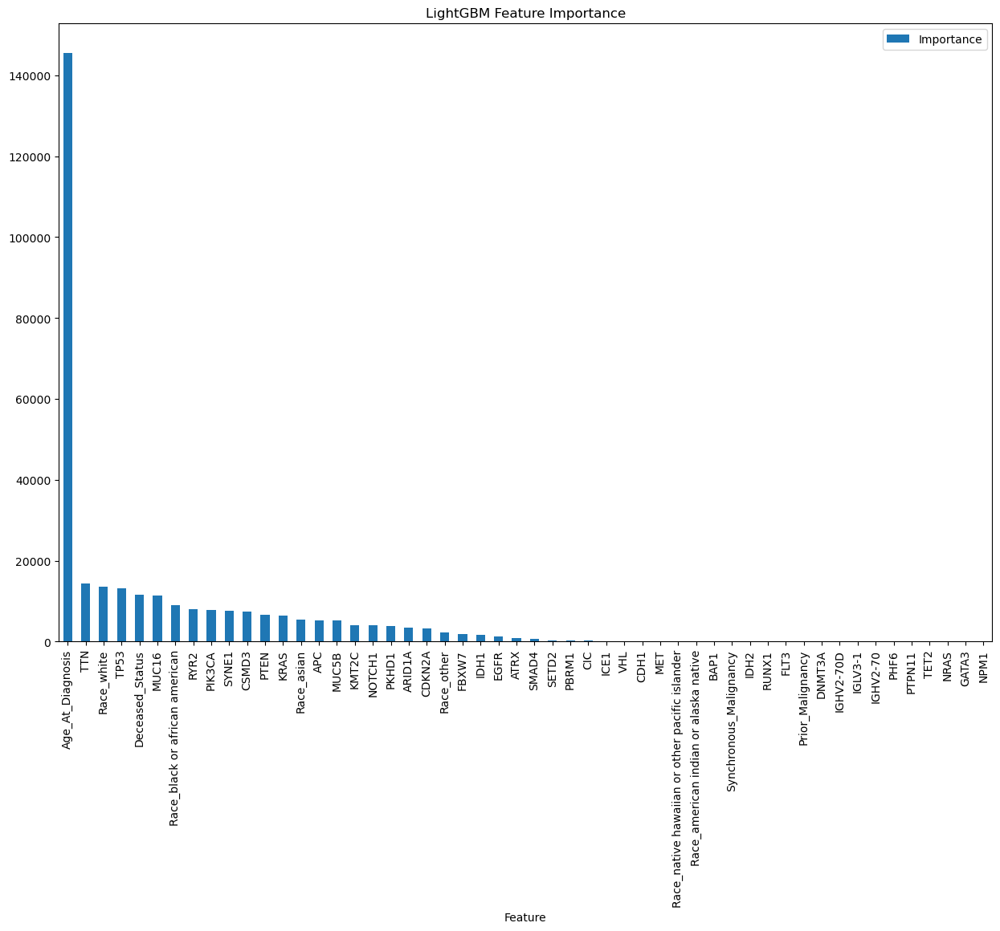

In [19]:
lgbm_feature_importance_df.plot(kind='bar', 
                                title='LightGBM Feature Importance', 
                                x='Feature', 
                                y='Importance', 
                                figsize=(15,10))

## CatBoost Algorithm

In [27]:
# Creating training and evaluating data sets

cat_train = X_train.drop('Weight', axis=1)
cat_eval = X_test.drop('Weight', axis=1)
train_label = y_train
eval_label = y_test
cat_features=[var for var in cat_train.columns if cat_train[var].dtype == "int8"]
print(cat_features)

['Deceased_Status', 'Prior_Malignancy', 'Synchronous_Malignancy', 'TP53', 'PIK3CA', 'TTN', 'CDH1', 'GATA3', 'APC', 'KRAS', 'SYNE1', 'CSMD3', 'MUC16', 'RYR2', 'PTEN', 'NRAS', 'MUC5B', 'TET2', 'PTPN11', 'NOTCH1', 'FBXW7', 'PHF6', 'IGHV2-70', 'IGLV3-1', 'IGHV2-70D', 'DNMT3A', 'NPM1', 'FLT3', 'IDH2', 'RUNX1', 'EGFR', 'IDH1', 'ATRX', 'CIC', 'ARID1A', 'VHL', 'PBRM1', 'SETD2', 'BAP1', 'MET', 'KMT2C', 'PKHD1', 'ICE1', 'SMAD4', 'CDKN2A', 'Race_american indian or alaska native', 'Race_asian', 'Race_black or african american', 'Race_native hawaiian or other pacific islander', 'Race_other', 'Race_white']


In [28]:
cat_index_list = []
for feature in cat_features:
    cat_index_list.append(input_df.columns.get_loc(feature))
    
print(cat_index_list)

[1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52]


In [29]:
# Tuning hyperparameters using GridSearch

cat_model = CatBoostClassifier()

cat_grid_params = {'learning_rate': [0.05, 0.07, 0.1, 0.3],
                  'depth': [4,5,6],
                   'l2_leaf_reg': [1,5,7],
                   'random_strength': [2,4,6,8],
                  'iterations': [30,70,100]}

cat_grid_search = cat_model.grid_search(cat_grid_params, X=X_train.drop('Weight', axis=1), y=y_train, cv=4, plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 2.0296663	test: 2.0271191	best: 2.0271191 (0)	total: 5.2ms	remaining: 151ms
1:	learn: 1.9277467	test: 1.9255378	best: 1.9255378 (1)	total: 9.68ms	remaining: 136ms
2:	learn: 1.8398979	test: 1.8347747	best: 1.8347747 (2)	total: 14.1ms	remaining: 127ms
3:	learn: 1.7722954	test: 1.7678113	best: 1.7678113 (3)	total: 18.7ms	remaining: 121ms
4:	learn: 1.7072284	test: 1.7016069	best: 1.7016069 (4)	total: 22.9ms	remaining: 115ms
5:	learn: 1.6464436	test: 1.6422209	best: 1.6422209 (5)	total: 27.6ms	remaining: 111ms
6:	learn: 1.5968461	test: 1.5941579	best: 1.5941579 (6)	total: 33.9ms	remaining: 111ms
7:	learn: 1.5558987	test: 1.5549598	best: 1.5549598 (7)	total: 40.1ms	remaining: 110ms
8:	learn: 1.5178205	test: 1.5187664	best: 1.5187664 (8)	total: 45.9ms	remaining: 107ms
9:	learn: 1.4740962	test: 1.4754291	best: 1.4754291 (9)	total: 56.4ms	remaining: 113ms
10:	learn: 1.4420931	test: 1.4422748	best: 1.4422748 (10)	total: 62.2ms	remaining: 107ms
11:	learn: 1.4074247	test: 1.4059351	best:

0:	learn: 2.0352720	test: 2.0333467	best: 2.0333467 (0)	total: 4.38ms	remaining: 127ms
1:	learn: 1.9357526	test: 1.9341470	best: 1.9341470 (1)	total: 8ms	remaining: 112ms
2:	learn: 1.8495212	test: 1.8449134	best: 1.8449134 (2)	total: 11.5ms	remaining: 104ms
3:	learn: 1.7832273	test: 1.7795250	best: 1.7795250 (3)	total: 15.6ms	remaining: 102ms
4:	learn: 1.7188518	test: 1.7141293	best: 1.7141293 (4)	total: 19.1ms	remaining: 95.6ms
5:	learn: 1.6589541	test: 1.6554257	best: 1.6554257 (5)	total: 23.2ms	remaining: 92.9ms
6:	learn: 1.6072785	test: 1.6042957	best: 1.6042957 (6)	total: 27.9ms	remaining: 91.8ms
7:	learn: 1.5664154	test: 1.5650736	best: 1.5650736 (7)	total: 31.7ms	remaining: 87.1ms
8:	learn: 1.5291011	test: 1.5296358	best: 1.5296358 (8)	total: 35.7ms	remaining: 83.2ms
9:	learn: 1.4893465	test: 1.4891174	best: 1.4891174 (9)	total: 39.3ms	remaining: 78.6ms
10:	learn: 1.4578633	test: 1.4566476	best: 1.4566476 (10)	total: 43.1ms	remaining: 74.5ms
11:	learn: 1.4236488	test: 1.4208378	

11:	learn: 0.8196172	test: 0.8348607	best: 0.8348607 (11)	total: 56.3ms	remaining: 84.4ms
12:	learn: 0.8110400	test: 0.8269519	best: 0.8269519 (12)	total: 59.9ms	remaining: 78.4ms
13:	learn: 0.8028081	test: 0.8179696	best: 0.8179696 (13)	total: 63.7ms	remaining: 72.8ms
14:	learn: 0.7930087	test: 0.8094019	best: 0.8094019 (14)	total: 68.8ms	remaining: 68.8ms
15:	learn: 0.7825167	test: 0.8008534	best: 0.8008534 (15)	total: 75.7ms	remaining: 66.3ms
16:	learn: 0.7718063	test: 0.7894179	best: 0.7894179 (16)	total: 82.5ms	remaining: 63.1ms
17:	learn: 0.7590620	test: 0.7736230	best: 0.7736230 (17)	total: 87.3ms	remaining: 58.2ms
18:	learn: 0.7509743	test: 0.7658612	best: 0.7658612 (18)	total: 91.9ms	remaining: 53.2ms
19:	learn: 0.7445626	test: 0.7592193	best: 0.7592193 (19)	total: 96.3ms	remaining: 48.1ms
20:	learn: 0.7337977	test: 0.7496668	best: 0.7496668 (20)	total: 100ms	remaining: 42.8ms
21:	learn: 0.7270582	test: 0.7436467	best: 0.7436467 (21)	total: 105ms	remaining: 38ms
22:	learn: 0.7

13:	learn: 1.1050958	test: 1.1066529	best: 1.1066529 (13)	total: 63.3ms	remaining: 72.3ms
14:	learn: 1.0846418	test: 1.0863301	best: 1.0863301 (14)	total: 67ms	remaining: 67ms
15:	learn: 1.0589172	test: 1.0621468	best: 1.0621468 (15)	total: 70.7ms	remaining: 61.8ms
16:	learn: 1.0430131	test: 1.0456616	best: 1.0456616 (16)	total: 74.5ms	remaining: 56.9ms
17:	learn: 1.0263326	test: 1.0290393	best: 1.0290393 (17)	total: 78.3ms	remaining: 52.2ms
18:	learn: 1.0084900	test: 1.0115711	best: 1.0115711 (18)	total: 81.8ms	remaining: 47.4ms
19:	learn: 0.9934763	test: 0.9970172	best: 0.9970172 (19)	total: 85.6ms	remaining: 42.8ms
20:	learn: 0.9762242	test: 0.9800254	best: 0.9800254 (20)	total: 89.8ms	remaining: 38.5ms
21:	learn: 0.9691781	test: 0.9734172	best: 0.9734172 (21)	total: 94ms	remaining: 34.2ms
22:	learn: 0.9514329	test: 0.9565584	best: 0.9565584 (22)	total: 99.3ms	remaining: 30.2ms
23:	learn: 0.9421693	test: 0.9473350	best: 0.9473350 (23)	total: 104ms	remaining: 26ms
24:	learn: 0.932605

52:	learn: 0.9039489	test: 0.9168144	best: 0.9168144 (52)	total: 220ms	remaining: 70.5ms
53:	learn: 0.8993627	test: 0.9125499	best: 0.9125499 (53)	total: 224ms	remaining: 66.2ms
54:	learn: 0.8953875	test: 0.9086609	best: 0.9086609 (54)	total: 228ms	remaining: 62.3ms
55:	learn: 0.8908246	test: 0.9047268	best: 0.9047268 (55)	total: 233ms	remaining: 58.1ms
56:	learn: 0.8854868	test: 0.8993824	best: 0.8993824 (56)	total: 237ms	remaining: 54.1ms
57:	learn: 0.8805687	test: 0.8939999	best: 0.8939999 (57)	total: 241ms	remaining: 49.9ms
58:	learn: 0.8762224	test: 0.8899041	best: 0.8899041 (58)	total: 245ms	remaining: 45.6ms
59:	learn: 0.8699400	test: 0.8835445	best: 0.8835445 (59)	total: 249ms	remaining: 41.4ms
60:	learn: 0.8676596	test: 0.8811812	best: 0.8811812 (60)	total: 253ms	remaining: 37.3ms
61:	learn: 0.8651409	test: 0.8785067	best: 0.8785067 (61)	total: 257ms	remaining: 33.1ms
62:	learn: 0.8598056	test: 0.8739993	best: 0.8739993 (62)	total: 261ms	remaining: 29ms
63:	learn: 0.8562794	te

33:	learn: 0.8282745	test: 0.8420724	best: 0.8420724 (33)	total: 188ms	remaining: 199ms
34:	learn: 0.8237328	test: 0.8384023	best: 0.8384023 (34)	total: 192ms	remaining: 192ms
35:	learn: 0.8184338	test: 0.8332452	best: 0.8332452 (35)	total: 196ms	remaining: 185ms
36:	learn: 0.8130975	test: 0.8284833	best: 0.8284833 (36)	total: 200ms	remaining: 178ms
37:	learn: 0.8049358	test: 0.8211095	best: 0.8211095 (37)	total: 204ms	remaining: 171ms
38:	learn: 0.8002033	test: 0.8159452	best: 0.8159452 (38)	total: 208ms	remaining: 165ms
39:	learn: 0.7935538	test: 0.8086016	best: 0.8086016 (39)	total: 212ms	remaining: 159ms
40:	learn: 0.7887365	test: 0.8035106	best: 0.8035106 (40)	total: 217ms	remaining: 154ms
41:	learn: 0.7843958	test: 0.7996491	best: 0.7996491 (41)	total: 223ms	remaining: 148ms
42:	learn: 0.7797877	test: 0.7951929	best: 0.7951929 (42)	total: 227ms	remaining: 143ms
43:	learn: 0.7750132	test: 0.7904947	best: 0.7904947 (43)	total: 231ms	remaining: 137ms
44:	learn: 0.7718605	test: 0.788

21:	learn: 1.2035200	test: 1.2028586	best: 1.2028586 (21)	total: 103ms	remaining: 226ms
22:	learn: 1.1826833	test: 1.1830840	best: 1.1830840 (22)	total: 107ms	remaining: 219ms
23:	learn: 1.1678124	test: 1.1680254	best: 1.1680254 (23)	total: 111ms	remaining: 213ms
24:	learn: 1.1562369	test: 1.1562306	best: 1.1562306 (24)	total: 115ms	remaining: 206ms
25:	learn: 1.1410229	test: 1.1417012	best: 1.1417012 (25)	total: 118ms	remaining: 200ms
26:	learn: 1.1277197	test: 1.1294698	best: 1.1294698 (26)	total: 122ms	remaining: 194ms
27:	learn: 1.1170532	test: 1.1190204	best: 1.1190204 (27)	total: 125ms	remaining: 188ms
28:	learn: 1.1005794	test: 1.1033332	best: 1.1033332 (28)	total: 129ms	remaining: 182ms
29:	learn: 1.0889525	test: 1.0928315	best: 1.0928315 (29)	total: 133ms	remaining: 177ms
30:	learn: 1.0786208	test: 1.0824832	best: 1.0824832 (30)	total: 137ms	remaining: 172ms
31:	learn: 1.0697878	test: 1.0740697	best: 1.0740697 (31)	total: 142ms	remaining: 169ms
32:	learn: 1.0617904	test: 1.065

46:	learn: 0.8699617	test: 0.8825637	best: 0.8825637 (46)	total: 202ms	remaining: 99ms
47:	learn: 0.8631760	test: 0.8758685	best: 0.8758685 (47)	total: 206ms	remaining: 94.5ms
48:	learn: 0.8600371	test: 0.8725650	best: 0.8725650 (48)	total: 210ms	remaining: 90ms
49:	learn: 0.8557670	test: 0.8689442	best: 0.8689442 (49)	total: 214ms	remaining: 85.5ms
50:	learn: 0.8520686	test: 0.8657508	best: 0.8657508 (50)	total: 217ms	remaining: 81ms
51:	learn: 0.8455479	test: 0.8595461	best: 0.8595461 (51)	total: 221ms	remaining: 76.6ms
52:	learn: 0.8400051	test: 0.8546480	best: 0.8546480 (52)	total: 225ms	remaining: 72.3ms
53:	learn: 0.8363143	test: 0.8515488	best: 0.8515488 (53)	total: 230ms	remaining: 68.2ms
54:	learn: 0.8306607	test: 0.8462707	best: 0.8462707 (54)	total: 235ms	remaining: 64.1ms
55:	learn: 0.8261280	test: 0.8414092	best: 0.8414092 (55)	total: 240ms	remaining: 60ms
56:	learn: 0.8220885	test: 0.8372932	best: 0.8372932 (56)	total: 245ms	remaining: 55.8ms
57:	learn: 0.8178680	test: 0.

37:	learn: 0.6432314	test: 0.6658875	best: 0.6658875 (37)	total: 184ms	remaining: 155ms
38:	learn: 0.6397742	test: 0.6631105	best: 0.6631105 (38)	total: 189ms	remaining: 150ms
39:	learn: 0.6369071	test: 0.6620505	best: 0.6620505 (39)	total: 193ms	remaining: 145ms
40:	learn: 0.6337299	test: 0.6593855	best: 0.6593855 (40)	total: 197ms	remaining: 140ms
41:	learn: 0.6310659	test: 0.6573308	best: 0.6573308 (41)	total: 202ms	remaining: 135ms
42:	learn: 0.6266493	test: 0.6522583	best: 0.6522583 (42)	total: 210ms	remaining: 132ms
43:	learn: 0.6228369	test: 0.6488878	best: 0.6488878 (43)	total: 218ms	remaining: 129ms
44:	learn: 0.6204505	test: 0.6467618	best: 0.6467618 (44)	total: 225ms	remaining: 125ms
45:	learn: 0.6184597	test: 0.6444836	best: 0.6444836 (45)	total: 230ms	remaining: 120ms
46:	learn: 0.6167397	test: 0.6433186	best: 0.6433186 (46)	total: 234ms	remaining: 114ms
47:	learn: 0.6148817	test: 0.6421095	best: 0.6421095 (47)	total: 239ms	remaining: 110ms
48:	learn: 0.6128185	test: 0.640

10:	learn: 1.3378581	test: 1.3372654	best: 1.3372654 (10)	total: 46.4ms	remaining: 249ms
11:	learn: 1.3039755	test: 1.3017317	best: 1.3017317 (11)	total: 50.2ms	remaining: 242ms
12:	learn: 1.2736946	test: 1.2709505	best: 1.2709505 (12)	total: 53.9ms	remaining: 236ms
13:	learn: 1.2502908	test: 1.2478123	best: 1.2478123 (13)	total: 57.7ms	remaining: 231ms
14:	learn: 1.2252924	test: 1.2226447	best: 1.2226447 (14)	total: 62ms	remaining: 227ms
15:	learn: 1.1969363	test: 1.1954210	best: 1.1954210 (15)	total: 65.5ms	remaining: 221ms
16:	learn: 1.1791150	test: 1.1770590	best: 1.1770590 (16)	total: 69ms	remaining: 215ms
17:	learn: 1.1587035	test: 1.1564951	best: 1.1564951 (17)	total: 73.3ms	remaining: 212ms
18:	learn: 1.1415417	test: 1.1401195	best: 1.1401195 (18)	total: 77.7ms	remaining: 208ms
19:	learn: 1.1272147	test: 1.1265329	best: 1.1265329 (19)	total: 81.8ms	remaining: 205ms
20:	learn: 1.1066212	test: 1.1081232	best: 1.1081232 (20)	total: 85.7ms	remaining: 200ms
21:	learn: 1.0913084	test

42:	learn: 0.8087766	test: 0.8219462	best: 0.8219462 (42)	total: 169ms	remaining: 106ms
43:	learn: 0.8048469	test: 0.8176497	best: 0.8176497 (43)	total: 173ms	remaining: 102ms
44:	learn: 0.8022159	test: 0.8155649	best: 0.8155649 (44)	total: 176ms	remaining: 97.8ms
45:	learn: 0.7997911	test: 0.8133381	best: 0.8133381 (45)	total: 180ms	remaining: 93.7ms
46:	learn: 0.7961610	test: 0.8098967	best: 0.8098967 (46)	total: 183ms	remaining: 89.6ms
47:	learn: 0.7912201	test: 0.8049111	best: 0.8049111 (47)	total: 187ms	remaining: 85.5ms
48:	learn: 0.7882669	test: 0.8017144	best: 0.8017144 (48)	total: 190ms	remaining: 81.5ms
49:	learn: 0.7838384	test: 0.7980078	best: 0.7980078 (49)	total: 194ms	remaining: 77.5ms
50:	learn: 0.7812020	test: 0.7959888	best: 0.7959888 (50)	total: 197ms	remaining: 73.4ms
51:	learn: 0.7764624	test: 0.7913609	best: 0.7913609 (51)	total: 201ms	remaining: 69.6ms
52:	learn: 0.7732174	test: 0.7881660	best: 0.7881660 (52)	total: 205ms	remaining: 65.8ms
53:	learn: 0.7699354	te

3:	learn: 1.7722954	test: 1.7678113	best: 1.7678113 (3)	total: 15.8ms	remaining: 378ms
4:	learn: 1.7072284	test: 1.7016069	best: 1.7016069 (4)	total: 19.6ms	remaining: 372ms
5:	learn: 1.6464436	test: 1.6422209	best: 1.6422209 (5)	total: 23.2ms	remaining: 363ms
6:	learn: 1.5968461	test: 1.5941579	best: 1.5941579 (6)	total: 27.9ms	remaining: 370ms
7:	learn: 1.5558987	test: 1.5549598	best: 1.5549598 (7)	total: 31.5ms	remaining: 362ms
8:	learn: 1.5178205	test: 1.5187664	best: 1.5187664 (8)	total: 35ms	remaining: 354ms
9:	learn: 1.4740962	test: 1.4754291	best: 1.4754291 (9)	total: 38.9ms	remaining: 350ms
10:	learn: 1.4420931	test: 1.4422748	best: 1.4422748 (10)	total: 42.6ms	remaining: 345ms
11:	learn: 1.4074247	test: 1.4059351	best: 1.4059351 (11)	total: 46.1ms	remaining: 338ms
12:	learn: 1.3793091	test: 1.3773267	best: 1.3773267 (12)	total: 50ms	remaining: 335ms
13:	learn: 1.3542154	test: 1.3520660	best: 1.3520660 (13)	total: 53.8ms	remaining: 330ms
14:	learn: 1.3274366	test: 1.3249502	be

8:	learn: 1.3896889	test: 1.3919922	best: 1.3919922 (8)	total: 34ms	remaining: 344ms
9:	learn: 1.3489804	test: 1.3502237	best: 1.3502237 (9)	total: 37.6ms	remaining: 338ms
10:	learn: 1.3128279	test: 1.3131468	best: 1.3131468 (10)	total: 41.7ms	remaining: 337ms
11:	learn: 1.2794624	test: 1.2782738	best: 1.2782738 (11)	total: 46.4ms	remaining: 340ms
12:	learn: 1.2489893	test: 1.2472959	best: 1.2472959 (12)	total: 49.9ms	remaining: 334ms
13:	learn: 1.2256603	test: 1.2242247	best: 1.2242247 (13)	total: 53.8ms	remaining: 331ms
14:	learn: 1.2013650	test: 1.1998567	best: 1.1998567 (14)	total: 57.7ms	remaining: 327ms
15:	learn: 1.1707821	test: 1.1707689	best: 1.1707689 (15)	total: 61.9ms	remaining: 325ms
16:	learn: 1.1527976	test: 1.1523037	best: 1.1523037 (16)	total: 65.4ms	remaining: 319ms
17:	learn: 1.1321841	test: 1.1317147	best: 1.1317147 (17)	total: 69ms	remaining: 314ms
18:	learn: 1.1144091	test: 1.1148333	best: 1.1148333 (18)	total: 73ms	remaining: 311ms
19:	learn: 1.0997305	test: 1.10

17:	learn: 1.0001653	test: 1.0059043	best: 1.0059043 (17)	total: 73.6ms	remaining: 335ms
18:	learn: 0.9853414	test: 0.9918716	best: 0.9918716 (18)	total: 77.3ms	remaining: 329ms
19:	learn: 0.9671237	test: 0.9747637	best: 0.9747637 (19)	total: 81ms	remaining: 324ms
20:	learn: 0.9482511	test: 0.9558673	best: 0.9558673 (20)	total: 85.4ms	remaining: 321ms
21:	learn: 0.9407158	test: 0.9487221	best: 0.9487221 (21)	total: 89.2ms	remaining: 316ms
22:	learn: 0.9234559	test: 0.9321458	best: 0.9321458 (22)	total: 93.1ms	remaining: 312ms
23:	learn: 0.9138545	test: 0.9226581	best: 0.9226581 (23)	total: 96.5ms	remaining: 306ms
24:	learn: 0.9068738	test: 0.9154341	best: 0.9154341 (24)	total: 100ms	remaining: 300ms
25:	learn: 0.8957739	test: 0.9053822	best: 0.9053822 (25)	total: 104ms	remaining: 295ms
26:	learn: 0.8865471	test: 0.8966948	best: 0.8966948 (26)	total: 109ms	remaining: 294ms
27:	learn: 0.8777228	test: 0.8877112	best: 0.8877112 (27)	total: 114ms	remaining: 293ms
28:	learn: 0.8650728	test: 

20:	learn: 0.6961477	test: 0.7142449	best: 0.7142449 (20)	total: 80.9ms	remaining: 304ms
21:	learn: 0.6900715	test: 0.7087106	best: 0.7087106 (21)	total: 84.6ms	remaining: 300ms
22:	learn: 0.6784508	test: 0.6974281	best: 0.6974281 (22)	total: 88.5ms	remaining: 296ms
23:	learn: 0.6733486	test: 0.6923621	best: 0.6923621 (23)	total: 92.6ms	remaining: 293ms
24:	learn: 0.6695657	test: 0.6898254	best: 0.6898254 (24)	total: 96.1ms	remaining: 288ms
25:	learn: 0.6631821	test: 0.6839475	best: 0.6839475 (25)	total: 99.5ms	remaining: 283ms
26:	learn: 0.6592319	test: 0.6813742	best: 0.6813742 (26)	total: 103ms	remaining: 278ms
27:	learn: 0.6540089	test: 0.6773662	best: 0.6773662 (27)	total: 106ms	remaining: 273ms
28:	learn: 0.6471621	test: 0.6705305	best: 0.6705305 (28)	total: 110ms	remaining: 269ms
29:	learn: 0.6375459	test: 0.6641350	best: 0.6641350 (29)	total: 114ms	remaining: 266ms
30:	learn: 0.6339900	test: 0.6611092	best: 0.6611092 (30)	total: 118ms	remaining: 262ms
31:	learn: 0.6307270	test:

21:	learn: 1.2035200	test: 1.2028586	best: 1.2028586 (21)	total: 86.5ms	remaining: 307ms
22:	learn: 1.1826833	test: 1.1830840	best: 1.1830840 (22)	total: 90.1ms	remaining: 301ms
23:	learn: 1.1678124	test: 1.1680254	best: 1.1680254 (23)	total: 94.4ms	remaining: 299ms
24:	learn: 1.1562369	test: 1.1562306	best: 1.1562306 (24)	total: 98.4ms	remaining: 295ms
25:	learn: 1.1410229	test: 1.1417012	best: 1.1417012 (25)	total: 102ms	remaining: 290ms
26:	learn: 1.1277197	test: 1.1294698	best: 1.1294698 (26)	total: 106ms	remaining: 288ms
27:	learn: 1.1170532	test: 1.1190204	best: 1.1190204 (27)	total: 111ms	remaining: 286ms
28:	learn: 1.1005794	test: 1.1033332	best: 1.1033332 (28)	total: 115ms	remaining: 283ms
29:	learn: 1.0889525	test: 1.0928315	best: 1.0928315 (29)	total: 121ms	remaining: 283ms
30:	learn: 1.0786208	test: 1.0824832	best: 1.0824832 (30)	total: 127ms	remaining: 284ms
31:	learn: 1.0697878	test: 1.0740697	best: 1.0740697 (31)	total: 135ms	remaining: 287ms
32:	learn: 1.0617904	test: 1

40:	learn: 0.8999715	test: 0.9121037	best: 0.9121037 (40)	total: 175ms	remaining: 253ms
41:	learn: 0.8929115	test: 0.9056563	best: 0.9056563 (41)	total: 179ms	remaining: 248ms
42:	learn: 0.8863683	test: 0.8987187	best: 0.8987187 (42)	total: 183ms	remaining: 243ms
43:	learn: 0.8825791	test: 0.8948179	best: 0.8948179 (43)	total: 187ms	remaining: 238ms
44:	learn: 0.8792725	test: 0.8920645	best: 0.8920645 (44)	total: 191ms	remaining: 234ms
45:	learn: 0.8749456	test: 0.8879241	best: 0.8879241 (45)	total: 195ms	remaining: 229ms
46:	learn: 0.8699617	test: 0.8825637	best: 0.8825637 (46)	total: 198ms	remaining: 223ms
47:	learn: 0.8631760	test: 0.8758685	best: 0.8758685 (47)	total: 202ms	remaining: 218ms
48:	learn: 0.8600371	test: 0.8725650	best: 0.8725650 (48)	total: 205ms	remaining: 214ms
49:	learn: 0.8557670	test: 0.8689442	best: 0.8689442 (49)	total: 209ms	remaining: 209ms
50:	learn: 0.8520686	test: 0.8657508	best: 0.8657508 (50)	total: 213ms	remaining: 204ms
51:	learn: 0.8455479	test: 0.859

33:	learn: 0.8534862	test: 0.8643506	best: 0.8643506 (33)	total: 168ms	remaining: 326ms
34:	learn: 0.8490637	test: 0.8607593	best: 0.8607593 (34)	total: 172ms	remaining: 320ms
35:	learn: 0.8436749	test: 0.8548299	best: 0.8548299 (35)	total: 176ms	remaining: 313ms
36:	learn: 0.8388806	test: 0.8505708	best: 0.8505708 (36)	total: 179ms	remaining: 306ms
37:	learn: 0.8308150	test: 0.8430607	best: 0.8430607 (37)	total: 184ms	remaining: 299ms
38:	learn: 0.8264961	test: 0.8386522	best: 0.8386522 (38)	total: 188ms	remaining: 293ms
39:	learn: 0.8197140	test: 0.8311768	best: 0.8311768 (39)	total: 192ms	remaining: 288ms
40:	learn: 0.8135478	test: 0.8251206	best: 0.8251206 (40)	total: 196ms	remaining: 282ms
41:	learn: 0.8092385	test: 0.8212395	best: 0.8212395 (41)	total: 201ms	remaining: 278ms
42:	learn: 0.8045137	test: 0.8167887	best: 0.8167887 (42)	total: 206ms	remaining: 273ms
43:	learn: 0.8005074	test: 0.8123519	best: 0.8123519 (43)	total: 211ms	remaining: 269ms
44:	learn: 0.7968932	test: 0.809

31:	learn: 0.6652551	test: 0.6869997	best: 0.6869997 (31)	total: 122ms	remaining: 259ms
32:	learn: 0.6607895	test: 0.6837716	best: 0.6837716 (32)	total: 126ms	remaining: 255ms
33:	learn: 0.6582623	test: 0.6809074	best: 0.6809074 (33)	total: 129ms	remaining: 251ms
34:	learn: 0.6527937	test: 0.6743073	best: 0.6743073 (34)	total: 133ms	remaining: 248ms
35:	learn: 0.6501912	test: 0.6715349	best: 0.6715349 (35)	total: 137ms	remaining: 244ms
36:	learn: 0.6465488	test: 0.6691808	best: 0.6691808 (36)	total: 141ms	remaining: 240ms
37:	learn: 0.6432314	test: 0.6658875	best: 0.6658875 (37)	total: 145ms	remaining: 236ms
38:	learn: 0.6397742	test: 0.6631105	best: 0.6631105 (38)	total: 148ms	remaining: 232ms
39:	learn: 0.6369071	test: 0.6620505	best: 0.6620505 (39)	total: 152ms	remaining: 228ms
40:	learn: 0.6337299	test: 0.6593855	best: 0.6593855 (40)	total: 156ms	remaining: 225ms
41:	learn: 0.6310659	test: 0.6573308	best: 0.6573308 (41)	total: 160ms	remaining: 221ms
42:	learn: 0.6266493	test: 0.652

74:	learn: 0.8535283	test: 0.8658230	best: 0.8658230 (74)	total: 320ms	remaining: 107ms
75:	learn: 0.8513653	test: 0.8635760	best: 0.8635760 (75)	total: 323ms	remaining: 102ms
76:	learn: 0.8484061	test: 0.8606502	best: 0.8606502 (76)	total: 327ms	remaining: 97.6ms
77:	learn: 0.8439291	test: 0.8568924	best: 0.8568924 (77)	total: 331ms	remaining: 93.2ms
78:	learn: 0.8415717	test: 0.8540820	best: 0.8540820 (78)	total: 334ms	remaining: 88.8ms
79:	learn: 0.8393144	test: 0.8517629	best: 0.8517629 (79)	total: 337ms	remaining: 84.4ms
80:	learn: 0.8369071	test: 0.8491147	best: 0.8491147 (80)	total: 341ms	remaining: 80ms
81:	learn: 0.8346108	test: 0.8468745	best: 0.8468745 (81)	total: 344ms	remaining: 75.6ms
82:	learn: 0.8325315	test: 0.8448985	best: 0.8448985 (82)	total: 348ms	remaining: 71.3ms
83:	learn: 0.8301138	test: 0.8424478	best: 0.8424478 (83)	total: 351ms	remaining: 66.9ms
84:	learn: 0.8272639	test: 0.8397330	best: 0.8397330 (84)	total: 356ms	remaining: 62.7ms
85:	learn: 0.8256616	test

69:	learn: 0.7947956	test: 0.8103330	best: 0.8103330 (69)	total: 313ms	remaining: 134ms
70:	learn: 0.7918208	test: 0.8074120	best: 0.8074120 (70)	total: 317ms	remaining: 130ms
71:	learn: 0.7881597	test: 0.8035704	best: 0.8035704 (71)	total: 322ms	remaining: 125ms
72:	learn: 0.7864533	test: 0.8017273	best: 0.8017273 (72)	total: 325ms	remaining: 120ms
73:	learn: 0.7840844	test: 0.7996099	best: 0.7996099 (73)	total: 329ms	remaining: 116ms
74:	learn: 0.7817837	test: 0.7974887	best: 0.7974887 (74)	total: 333ms	remaining: 111ms
75:	learn: 0.7796986	test: 0.7953440	best: 0.7953440 (75)	total: 336ms	remaining: 106ms
76:	learn: 0.7770947	test: 0.7929903	best: 0.7929903 (76)	total: 340ms	remaining: 101ms
77:	learn: 0.7736392	test: 0.7899571	best: 0.7899571 (77)	total: 344ms	remaining: 97.1ms
78:	learn: 0.7716187	test: 0.7874018	best: 0.7874018 (78)	total: 349ms	remaining: 92.7ms
79:	learn: 0.7682575	test: 0.7842183	best: 0.7842183 (79)	total: 353ms	remaining: 88.1ms
80:	learn: 0.7660513	test: 0.

9:	learn: 0.8665229	test: 0.8820180	best: 0.8820180 (9)	total: 45.7ms	remaining: 411ms
10:	learn: 0.8422187	test: 0.8567494	best: 0.8567494 (10)	total: 49.5ms	remaining: 401ms
11:	learn: 0.8299356	test: 0.8449118	best: 0.8449118 (11)	total: 53.9ms	remaining: 395ms
12:	learn: 0.8215843	test: 0.8372152	best: 0.8372152 (12)	total: 57.5ms	remaining: 385ms
13:	learn: 0.8137455	test: 0.8286993	best: 0.8286993 (13)	total: 61.1ms	remaining: 375ms
14:	learn: 0.8039113	test: 0.8199503	best: 0.8199503 (14)	total: 65.1ms	remaining: 369ms
15:	learn: 0.7931276	test: 0.8110526	best: 0.8110526 (15)	total: 70.2ms	remaining: 369ms
16:	learn: 0.7804718	test: 0.7969145	best: 0.7969145 (16)	total: 75ms	remaining: 366ms
17:	learn: 0.7714603	test: 0.7855683	best: 0.7855683 (17)	total: 79.7ms	remaining: 363ms
18:	learn: 0.7634302	test: 0.7777950	best: 0.7777950 (18)	total: 83.7ms	remaining: 357ms
19:	learn: 0.7524123	test: 0.7664277	best: 0.7664277 (19)	total: 88ms	remaining: 352ms
20:	learn: 0.7424728	test: 

15:	learn: 1.2212048	test: 1.2195241	best: 1.2195241 (15)	total: 72.8ms	remaining: 63.7ms
16:	learn: 1.2056821	test: 1.2044809	best: 1.2044809 (16)	total: 76ms	remaining: 58.1ms
17:	learn: 1.1931644	test: 1.1926640	best: 1.1926640 (17)	total: 79.7ms	remaining: 53.1ms
18:	learn: 1.1731539	test: 1.1726976	best: 1.1726976 (18)	total: 84.2ms	remaining: 48.7ms
19:	learn: 1.1554167	test: 1.1554543	best: 1.1554543 (19)	total: 87.8ms	remaining: 43.9ms
20:	learn: 1.1390864	test: 1.1399023	best: 1.1399023 (20)	total: 91.4ms	remaining: 39.2ms
21:	learn: 1.1265263	test: 1.1263325	best: 1.1263325 (21)	total: 95ms	remaining: 34.5ms
22:	learn: 1.1049542	test: 1.1067926	best: 1.1067926 (22)	total: 98.3ms	remaining: 29.9ms
23:	learn: 1.0824295	test: 1.0857933	best: 1.0857933 (23)	total: 102ms	remaining: 25.5ms
24:	learn: 1.0721858	test: 1.0761813	best: 1.0761813 (24)	total: 105ms	remaining: 21.1ms
25:	learn: 1.0614108	test: 1.0665201	best: 1.0665201 (25)	total: 110ms	remaining: 17ms
26:	learn: 1.048460

17:	learn: 1.3058538	test: 1.3047467	best: 1.3047467 (17)	total: 77.6ms	remaining: 51.7ms
18:	learn: 1.2898186	test: 1.2889632	best: 1.2889632 (18)	total: 81.3ms	remaining: 47ms
19:	learn: 1.2736057	test: 1.2732469	best: 1.2732469 (19)	total: 85.8ms	remaining: 42.9ms
20:	learn: 1.2509018	test: 1.2525952	best: 1.2525952 (20)	total: 89.4ms	remaining: 38.3ms
21:	learn: 1.2368869	test: 1.2390651	best: 1.2390651 (21)	total: 92.9ms	remaining: 33.8ms
22:	learn: 1.2153335	test: 1.2185786	best: 1.2185786 (22)	total: 96.4ms	remaining: 29.3ms
23:	learn: 1.1982256	test: 1.2012011	best: 1.2012011 (23)	total: 101ms	remaining: 25.2ms
24:	learn: 1.1869926	test: 1.1895771	best: 1.1895771 (24)	total: 105ms	remaining: 21ms
25:	learn: 1.1726348	test: 1.1757239	best: 1.1757239 (25)	total: 110ms	remaining: 16.9ms
26:	learn: 1.1555944	test: 1.1593889	best: 1.1593889 (26)	total: 115ms	remaining: 12.8ms
27:	learn: 1.1462229	test: 1.1502890	best: 1.1502890 (27)	total: 119ms	remaining: 8.49ms
28:	learn: 1.133657

27:	learn: 0.7022740	test: 0.7208443	best: 0.7208443 (27)	total: 106ms	remaining: 7.6ms
28:	learn: 0.6948436	test: 0.7150374	best: 0.7150374 (28)	total: 110ms	remaining: 3.79ms
29:	learn: 0.6885644	test: 0.7097151	best: 0.7097151 (29)	total: 114ms	remaining: 0us

bestTest = 0.7097151075
bestIteration = 29

0:	learn: 2.0375045	test: 2.0357570	best: 2.0357570 (0)	total: 3.92ms	remaining: 114ms
1:	learn: 1.9388847	test: 1.9374569	best: 1.9374569 (1)	total: 8.47ms	remaining: 119ms
2:	learn: 1.8585227	test: 1.8550451	best: 1.8550451 (2)	total: 13ms	remaining: 117ms
3:	learn: 1.8041303	test: 1.8007113	best: 1.8007113 (3)	total: 16.6ms	remaining: 108ms
4:	learn: 1.7387486	test: 1.7343372	best: 1.7343372 (4)	total: 20.7ms	remaining: 103ms
5:	learn: 1.6855314	test: 1.6817748	best: 1.6817748 (5)	total: 24.4ms	remaining: 97.4ms
6:	learn: 1.6369210	test: 1.6346949	best: 1.6346949 (6)	total: 28ms	remaining: 92.2ms
7:	learn: 1.5959411	test: 1.5953241	best: 1.5953241 (7)	total: 31.6ms	remaining: 86.8

5:	learn: 1.0092930	test: 1.0179242	best: 1.0179242 (5)	total: 23.6ms	remaining: 94.5ms
6:	learn: 0.9704143	test: 0.9776898	best: 0.9776898 (6)	total: 27.5ms	remaining: 90.2ms
7:	learn: 0.9423727	test: 0.9504881	best: 0.9504881 (7)	total: 32.4ms	remaining: 89.2ms
8:	learn: 0.9072866	test: 0.9194905	best: 0.9194905 (8)	total: 36.5ms	remaining: 85.1ms
9:	learn: 0.8855040	test: 0.8993863	best: 0.8993863 (9)	total: 39.9ms	remaining: 79.9ms
10:	learn: 0.8690944	test: 0.8829266	best: 0.8829266 (10)	total: 43.7ms	remaining: 75.4ms
11:	learn: 0.8589396	test: 0.8718717	best: 0.8718717 (11)	total: 47.2ms	remaining: 70.7ms
12:	learn: 0.8487466	test: 0.8612322	best: 0.8612322 (12)	total: 50.4ms	remaining: 65.9ms
13:	learn: 0.8378296	test: 0.8493357	best: 0.8493357 (13)	total: 53.8ms	remaining: 61.4ms
14:	learn: 0.8287465	test: 0.8424878	best: 0.8424878 (14)	total: 57.2ms	remaining: 57.2ms
15:	learn: 0.8199223	test: 0.8346793	best: 0.8346793 (15)	total: 60.8ms	remaining: 53.2ms
16:	learn: 0.8115127

10:	learn: 1.3530931	test: 1.3529311	best: 1.3529311 (10)	total: 45.2ms	remaining: 243ms
11:	learn: 1.3211873	test: 1.3202373	best: 1.3202373 (11)	total: 49.6ms	remaining: 240ms
12:	learn: 1.2845770	test: 1.2838782	best: 1.2838782 (12)	total: 53.6ms	remaining: 235ms
13:	learn: 1.2589631	test: 1.2576842	best: 1.2576842 (13)	total: 57.4ms	remaining: 230ms
14:	learn: 1.2392625	test: 1.2378663	best: 1.2378663 (14)	total: 61.4ms	remaining: 225ms
15:	learn: 1.2212048	test: 1.2195241	best: 1.2195241 (15)	total: 65.3ms	remaining: 220ms
16:	learn: 1.2056821	test: 1.2044809	best: 1.2044809 (16)	total: 68.3ms	remaining: 213ms
17:	learn: 1.1931644	test: 1.1926640	best: 1.1926640 (17)	total: 71.5ms	remaining: 207ms
18:	learn: 1.1731539	test: 1.1726976	best: 1.1726976 (18)	total: 75.3ms	remaining: 202ms
19:	learn: 1.1554167	test: 1.1554543	best: 1.1554543 (19)	total: 79.1ms	remaining: 198ms
20:	learn: 1.1390864	test: 1.1399023	best: 1.1399023 (20)	total: 83ms	remaining: 194ms
21:	learn: 1.1265263	te

46:	learn: 0.7930393	test: 0.8135312	best: 0.8135312 (46)	total: 179ms	remaining: 87.6ms
47:	learn: 0.7903948	test: 0.8108075	best: 0.8108075 (47)	total: 182ms	remaining: 83.6ms
48:	learn: 0.7876279	test: 0.8081172	best: 0.8081172 (48)	total: 186ms	remaining: 79.7ms
49:	learn: 0.7822710	test: 0.8028631	best: 0.8028631 (49)	total: 190ms	remaining: 75.9ms
50:	learn: 0.7766601	test: 0.7962318	best: 0.7962318 (50)	total: 194ms	remaining: 72.2ms
51:	learn: 0.7721865	test: 0.7917829	best: 0.7917829 (51)	total: 197ms	remaining: 68.3ms
52:	learn: 0.7674994	test: 0.7873316	best: 0.7873316 (52)	total: 201ms	remaining: 64.6ms
53:	learn: 0.7629675	test: 0.7823442	best: 0.7823442 (53)	total: 206ms	remaining: 60.9ms
54:	learn: 0.7591033	test: 0.7789783	best: 0.7789783 (54)	total: 210ms	remaining: 57.2ms
55:	learn: 0.7554206	test: 0.7751574	best: 0.7751574 (55)	total: 213ms	remaining: 53.4ms
56:	learn: 0.7526732	test: 0.7727250	best: 0.7727250 (56)	total: 217ms	remaining: 49.5ms
57:	learn: 0.7453334	

7:	learn: 1.5886029	test: 1.5875605	best: 1.5875605 (7)	total: 31.6ms	remaining: 245ms
8:	learn: 1.5496437	test: 1.5503388	best: 1.5503388 (8)	total: 35.3ms	remaining: 239ms
9:	learn: 1.5040606	test: 1.5054299	best: 1.5054299 (9)	total: 39.6ms	remaining: 238ms
10:	learn: 1.4689286	test: 1.4699561	best: 1.4699561 (10)	total: 43.1ms	remaining: 231ms
11:	learn: 1.4392016	test: 1.4400264	best: 1.4400264 (11)	total: 46.6ms	remaining: 225ms
12:	learn: 1.4126287	test: 1.4123918	best: 1.4123918 (12)	total: 50.1ms	remaining: 219ms
13:	learn: 1.3886993	test: 1.3885754	best: 1.3885754 (13)	total: 53.4ms	remaining: 214ms
14:	learn: 1.3610334	test: 1.3603048	best: 1.3603048 (14)	total: 56.8ms	remaining: 208ms
15:	learn: 1.3407081	test: 1.3405999	best: 1.3405999 (15)	total: 60.4ms	remaining: 204ms
16:	learn: 1.3225064	test: 1.3222137	best: 1.3222137 (16)	total: 64.2ms	remaining: 200ms
17:	learn: 1.3058538	test: 1.3047467	best: 1.3047467 (17)	total: 68.3ms	remaining: 197ms
18:	learn: 1.2898186	test: 

40:	learn: 0.9501129	test: 0.9603283	best: 0.9603283 (40)	total: 159ms	remaining: 112ms
41:	learn: 0.9407965	test: 0.9518917	best: 0.9518917 (41)	total: 162ms	remaining: 108ms
42:	learn: 0.9308615	test: 0.9424060	best: 0.9424060 (42)	total: 166ms	remaining: 104ms
43:	learn: 0.9213104	test: 0.9330878	best: 0.9330878 (43)	total: 170ms	remaining: 101ms
44:	learn: 0.9130678	test: 0.9260300	best: 0.9260300 (44)	total: 174ms	remaining: 96.5ms
45:	learn: 0.9104247	test: 0.9235923	best: 0.9235923 (45)	total: 177ms	remaining: 92.4ms
46:	learn: 0.9058938	test: 0.9191004	best: 0.9191004 (46)	total: 181ms	remaining: 88.4ms
47:	learn: 0.9031824	test: 0.9163906	best: 0.9163906 (47)	total: 184ms	remaining: 84.3ms
48:	learn: 0.9000677	test: 0.9134692	best: 0.9134692 (48)	total: 188ms	remaining: 80.4ms
49:	learn: 0.8951864	test: 0.9089093	best: 0.9089093 (49)	total: 191ms	remaining: 76.4ms
50:	learn: 0.8905010	test: 0.9037312	best: 0.9037312 (50)	total: 194ms	remaining: 72.3ms
51:	learn: 0.8849658	test

10:	learn: 0.8574189	test: 0.8713227	best: 0.8713227 (10)	total: 40.2ms	remaining: 216ms
11:	learn: 0.8471922	test: 0.8603098	best: 0.8603098 (11)	total: 44.1ms	remaining: 213ms
12:	learn: 0.8347430	test: 0.8489218	best: 0.8489218 (12)	total: 47.6ms	remaining: 209ms
13:	learn: 0.8230769	test: 0.8362053	best: 0.8362053 (13)	total: 51.8ms	remaining: 207ms
14:	learn: 0.8137264	test: 0.8291349	best: 0.8291349 (14)	total: 55.8ms	remaining: 204ms
15:	learn: 0.8054485	test: 0.8224344	best: 0.8224344 (15)	total: 59.3ms	remaining: 200ms
16:	learn: 0.7984735	test: 0.8148573	best: 0.8148573 (16)	total: 62.8ms	remaining: 196ms
17:	learn: 0.7878198	test: 0.8015708	best: 0.8015708 (17)	total: 66.5ms	remaining: 192ms
18:	learn: 0.7788900	test: 0.7930032	best: 0.7930032 (18)	total: 70.1ms	remaining: 188ms
19:	learn: 0.7716879	test: 0.7865119	best: 0.7865119 (19)	total: 73.8ms	remaining: 184ms
20:	learn: 0.7612228	test: 0.7768318	best: 0.7768318 (20)	total: 77.3ms	remaining: 180ms
21:	learn: 0.7540485	

43:	learn: 1.0179413	test: 1.0253132	best: 1.0253132 (43)	total: 180ms	remaining: 106ms
44:	learn: 1.0134571	test: 1.0213041	best: 1.0213041 (44)	total: 184ms	remaining: 102ms
45:	learn: 1.0104688	test: 1.0185875	best: 1.0185875 (45)	total: 188ms	remaining: 97.8ms
46:	learn: 1.0050465	test: 1.0134955	best: 1.0134955 (46)	total: 192ms	remaining: 93.9ms
47:	learn: 0.9963794	test: 1.0052183	best: 1.0052183 (47)	total: 196ms	remaining: 89.7ms
48:	learn: 0.9921735	test: 1.0007767	best: 1.0007767 (48)	total: 200ms	remaining: 85.5ms
49:	learn: 0.9867443	test: 0.9957863	best: 0.9957863 (49)	total: 204ms	remaining: 81.4ms
50:	learn: 0.9823407	test: 0.9916627	best: 0.9916627 (50)	total: 207ms	remaining: 77.3ms
51:	learn: 0.9769111	test: 0.9863848	best: 0.9863848 (51)	total: 211ms	remaining: 73.1ms
52:	learn: 0.9728538	test: 0.9826347	best: 0.9826347 (52)	total: 215ms	remaining: 68.9ms
53:	learn: 0.9686619	test: 0.9791565	best: 0.9791565 (53)	total: 219ms	remaining: 64.8ms
54:	learn: 0.9625417	te

7:	learn: 1.3521894	test: 1.3536843	best: 1.3536843 (7)	total: 28.7ms	remaining: 223ms
8:	learn: 1.2995735	test: 1.3030110	best: 1.3030110 (8)	total: 32.8ms	remaining: 222ms
9:	learn: 1.2644613	test: 1.2693724	best: 1.2693724 (9)	total: 36.8ms	remaining: 221ms
10:	learn: 1.2314362	test: 1.2350437	best: 1.2350437 (10)	total: 41.3ms	remaining: 221ms
11:	learn: 1.2072163	test: 1.2121837	best: 1.2121837 (11)	total: 45.3ms	remaining: 219ms
12:	learn: 1.1697164	test: 1.1747494	best: 1.1747494 (12)	total: 49.3ms	remaining: 216ms
13:	learn: 1.1475002	test: 1.1512795	best: 1.1512795 (13)	total: 53.5ms	remaining: 214ms
14:	learn: 1.1253405	test: 1.1287107	best: 1.1287107 (14)	total: 57.2ms	remaining: 210ms
15:	learn: 1.1097958	test: 1.1126454	best: 1.1126454 (15)	total: 60.6ms	remaining: 204ms
16:	learn: 1.0802316	test: 1.0840898	best: 1.0840898 (16)	total: 64.9ms	remaining: 202ms
17:	learn: 1.0571439	test: 1.0624686	best: 1.0624686 (17)	total: 68.8ms	remaining: 199ms
18:	learn: 1.0426860	test: 

48:	learn: 0.6232924	test: 0.6517674	best: 0.6517674 (48)	total: 186ms	remaining: 79.6ms
49:	learn: 0.6217747	test: 0.6511132	best: 0.6511132 (49)	total: 189ms	remaining: 75.6ms
50:	learn: 0.6193741	test: 0.6481830	best: 0.6481830 (50)	total: 193ms	remaining: 71.7ms
51:	learn: 0.6153725	test: 0.6457565	best: 0.6457565 (51)	total: 205ms	remaining: 70.9ms
52:	learn: 0.6139477	test: 0.6449567	best: 0.6449567 (52)	total: 210ms	remaining: 67.4ms
53:	learn: 0.6122761	test: 0.6442848	best: 0.6442848 (53)	total: 214ms	remaining: 63.4ms
54:	learn: 0.6103735	test: 0.6427161	best: 0.6427161 (54)	total: 217ms	remaining: 59.3ms
55:	learn: 0.6084857	test: 0.6410647	best: 0.6410647 (55)	total: 221ms	remaining: 55.3ms
56:	learn: 0.6064037	test: 0.6401007	best: 0.6401007 (56)	total: 225ms	remaining: 51.3ms
57:	learn: 0.6045816	test: 0.6381392	best: 0.6381392 (57)	total: 229ms	remaining: 47.3ms
58:	learn: 0.6026782	test: 0.6369453	best: 0.6369453 (58)	total: 232ms	remaining: 43.3ms
59:	learn: 0.6015067	

81:	learn: 0.8318988	test: 0.8483227	best: 0.8483227 (81)	total: 317ms	remaining: 69.6ms
82:	learn: 0.8295883	test: 0.8460820	best: 0.8460820 (82)	total: 321ms	remaining: 65.7ms
83:	learn: 0.8263990	test: 0.8431723	best: 0.8431723 (83)	total: 325ms	remaining: 62ms
84:	learn: 0.8234540	test: 0.8401263	best: 0.8401263 (84)	total: 330ms	remaining: 58.3ms
85:	learn: 0.8208064	test: 0.8374478	best: 0.8374478 (85)	total: 334ms	remaining: 54.4ms
86:	learn: 0.8189374	test: 0.8356299	best: 0.8356299 (86)	total: 338ms	remaining: 50.5ms
87:	learn: 0.8156408	test: 0.8328187	best: 0.8328187 (87)	total: 341ms	remaining: 46.5ms
88:	learn: 0.8132339	test: 0.8303660	best: 0.8303660 (88)	total: 344ms	remaining: 42.6ms
89:	learn: 0.8101919	test: 0.8273399	best: 0.8273399 (89)	total: 348ms	remaining: 38.7ms
90:	learn: 0.8092161	test: 0.8264805	best: 0.8264805 (90)	total: 351ms	remaining: 34.8ms
91:	learn: 0.8070620	test: 0.8242364	best: 0.8242364 (91)	total: 355ms	remaining: 30.9ms
92:	learn: 0.8036462	te

90:	learn: 0.7330298	test: 0.7532858	best: 0.7532858 (90)	total: 349ms	remaining: 34.5ms
91:	learn: 0.7311609	test: 0.7514763	best: 0.7514763 (91)	total: 352ms	remaining: 30.6ms
92:	learn: 0.7288501	test: 0.7488114	best: 0.7488114 (92)	total: 357ms	remaining: 26.8ms
93:	learn: 0.7267531	test: 0.7472064	best: 0.7472064 (93)	total: 363ms	remaining: 23.2ms
94:	learn: 0.7236425	test: 0.7438519	best: 0.7438519 (94)	total: 367ms	remaining: 19.3ms
95:	learn: 0.7218141	test: 0.7424539	best: 0.7424539 (95)	total: 370ms	remaining: 15.4ms
96:	learn: 0.7200637	test: 0.7410409	best: 0.7410409 (96)	total: 374ms	remaining: 11.6ms
97:	learn: 0.7188722	test: 0.7397687	best: 0.7397687 (97)	total: 378ms	remaining: 7.71ms
98:	learn: 0.7175906	test: 0.7386103	best: 0.7386103 (98)	total: 382ms	remaining: 3.86ms
99:	learn: 0.7163101	test: 0.7373202	best: 0.7373202 (99)	total: 386ms	remaining: 0us

bestTest = 0.7373201632
bestIteration = 99

0:	learn: 1.8735069	test: 1.8686782	best: 1.8686782 (0)	total: 3.54m

93:	learn: 0.6596407	test: 0.6844376	best: 0.6844376 (93)	total: 370ms	remaining: 23.6ms
94:	learn: 0.6568546	test: 0.6817313	best: 0.6817313 (94)	total: 373ms	remaining: 19.6ms
95:	learn: 0.6548052	test: 0.6802454	best: 0.6802454 (95)	total: 377ms	remaining: 15.7ms
96:	learn: 0.6527243	test: 0.6781257	best: 0.6781257 (96)	total: 381ms	remaining: 11.8ms
97:	learn: 0.6511182	test: 0.6766173	best: 0.6766173 (97)	total: 384ms	remaining: 7.84ms
98:	learn: 0.6494578	test: 0.6752782	best: 0.6752782 (98)	total: 388ms	remaining: 3.92ms
99:	learn: 0.6477511	test: 0.6737869	best: 0.6737869 (99)	total: 391ms	remaining: 0us

bestTest = 0.6737869039
bestIteration = 99

0:	learn: 1.4182828	test: 1.4083684	best: 1.4083684 (0)	total: 4.21ms	remaining: 417ms
1:	learn: 1.2950042	test: 1.2833421	best: 1.2833421 (1)	total: 8.38ms	remaining: 411ms
2:	learn: 1.1910729	test: 1.1894218	best: 1.1894218 (2)	total: 11.9ms	remaining: 386ms
3:	learn: 1.0962356	test: 1.0962632	best: 1.0962632 (3)	total: 15.6ms	rema

99:	learn: 0.5078624	test: 0.5875102	best: 0.5871001 (98)	total: 385ms	remaining: 0us

bestTest = 0.5871000541
bestIteration = 98

0:	learn: 2.0352720	test: 2.0333467	best: 2.0333467 (0)	total: 5.67ms	remaining: 562ms
1:	learn: 1.9357526	test: 1.9341470	best: 1.9341470 (1)	total: 11ms	remaining: 541ms
2:	learn: 1.8547069	test: 1.8510914	best: 1.8510914 (2)	total: 14.7ms	remaining: 476ms
3:	learn: 1.7982361	test: 1.7942632	best: 1.7942632 (3)	total: 18.6ms	remaining: 446ms
4:	learn: 1.7324497	test: 1.7274258	best: 1.7274258 (4)	total: 22.7ms	remaining: 432ms
5:	learn: 1.6789748	test: 1.6746473	best: 1.6746473 (5)	total: 27ms	remaining: 424ms
6:	learn: 1.6299466	test: 1.6272148	best: 1.6272148 (6)	total: 31.7ms	remaining: 421ms
7:	learn: 1.5886029	test: 1.5875605	best: 1.5875605 (7)	total: 35.8ms	remaining: 412ms
8:	learn: 1.5496437	test: 1.5503388	best: 1.5503388 (8)	total: 40.2ms	remaining: 406ms
9:	learn: 1.5040606	test: 1.5054299	best: 1.5054299 (9)	total: 44.1ms	remaining: 397ms
10:

6:	learn: 1.5366179	test: 1.5336705	best: 1.5336705 (6)	total: 27.8ms	remaining: 370ms
7:	learn: 1.4987908	test: 1.4971841	best: 1.4971841 (7)	total: 31.6ms	remaining: 364ms
8:	learn: 1.4460624	test: 1.4460887	best: 1.4460887 (8)	total: 35.5ms	remaining: 359ms
9:	learn: 1.4057362	test: 1.4069003	best: 1.4069003 (9)	total: 41.5ms	remaining: 374ms
10:	learn: 1.3703081	test: 1.3700535	best: 1.3700535 (10)	total: 45.5ms	remaining: 368ms
11:	learn: 1.3382436	test: 1.3370562	best: 1.3370562 (11)	total: 50.2ms	remaining: 368ms
12:	learn: 1.3019853	test: 1.3009375	best: 1.3009375 (12)	total: 54ms	remaining: 361ms
13:	learn: 1.2766187	test: 1.2749200	best: 1.2749200 (13)	total: 57.6ms	remaining: 354ms
14:	learn: 1.2574861	test: 1.2554874	best: 1.2554874 (14)	total: 61.4ms	remaining: 348ms
15:	learn: 1.2395375	test: 1.2371692	best: 1.2371692 (15)	total: 65.1ms	remaining: 342ms
16:	learn: 1.2237898	test: 1.2218704	best: 1.2218704 (16)	total: 68.3ms	remaining: 333ms
17:	learn: 1.2116021	test: 1.21

8:	learn: 1.2918014	test: 1.2952862	best: 1.2952862 (8)	total: 35ms	remaining: 354ms
9:	learn: 1.2562235	test: 1.2613118	best: 1.2613118 (9)	total: 38.5ms	remaining: 346ms
10:	learn: 1.2233585	test: 1.2271843	best: 1.2271843 (10)	total: 42.5ms	remaining: 344ms
11:	learn: 1.1989591	test: 1.2041937	best: 1.2041937 (11)	total: 46.2ms	remaining: 339ms
12:	learn: 1.1613584	test: 1.1667206	best: 1.1667206 (12)	total: 49.8ms	remaining: 333ms
13:	learn: 1.1392132	test: 1.1433131	best: 1.1433131 (13)	total: 53.2ms	remaining: 327ms
14:	learn: 1.1181859	test: 1.1226330	best: 1.1226330 (14)	total: 56.8ms	remaining: 322ms
15:	learn: 1.1016661	test: 1.1055483	best: 1.1055483 (15)	total: 60.2ms	remaining: 316ms
16:	learn: 1.0876594	test: 1.0921744	best: 1.0921744 (16)	total: 63ms	remaining: 308ms
17:	learn: 1.0773426	test: 1.0825510	best: 1.0825510 (17)	total: 66.5ms	remaining: 303ms
18:	learn: 1.0585667	test: 1.0637333	best: 1.0637333 (18)	total: 70ms	remaining: 299ms
19:	learn: 1.0441624	test: 1.04

13:	learn: 0.8230769	test: 0.8362053	best: 0.8362053 (13)	total: 55.4ms	remaining: 340ms
14:	learn: 0.8137264	test: 0.8291349	best: 0.8291349 (14)	total: 59.1ms	remaining: 335ms
15:	learn: 0.8054485	test: 0.8224344	best: 0.8224344 (15)	total: 62.8ms	remaining: 329ms
16:	learn: 0.7984735	test: 0.8148573	best: 0.8148573 (16)	total: 67ms	remaining: 327ms
17:	learn: 0.7878198	test: 0.8015708	best: 0.8015708 (17)	total: 70.7ms	remaining: 322ms
18:	learn: 0.7788900	test: 0.7930032	best: 0.7930032 (18)	total: 74.5ms	remaining: 318ms
19:	learn: 0.7716879	test: 0.7865119	best: 0.7865119 (19)	total: 79.3ms	remaining: 317ms
20:	learn: 0.7612228	test: 0.7768318	best: 0.7768318 (20)	total: 82.9ms	remaining: 312ms
21:	learn: 0.7540485	test: 0.7703821	best: 0.7703821 (21)	total: 87ms	remaining: 308ms
22:	learn: 0.7407967	test: 0.7566957	best: 0.7566957 (22)	total: 90.8ms	remaining: 304ms
23:	learn: 0.7312844	test: 0.7457235	best: 0.7457235 (23)	total: 94.3ms	remaining: 298ms
24:	learn: 0.7301218	test

15:	learn: 1.3499185	test: 1.3500164	best: 1.3500164 (15)	total: 63.9ms	remaining: 336ms
16:	learn: 1.3318955	test: 1.3317581	best: 1.3317581 (16)	total: 67.6ms	remaining: 330ms
17:	learn: 1.3152929	test: 1.3142764	best: 1.3142764 (17)	total: 71.2ms	remaining: 324ms
18:	learn: 1.2992489	test: 1.2984626	best: 1.2984626 (18)	total: 75.3ms	remaining: 321ms
19:	learn: 1.2830341	test: 1.2826954	best: 1.2826954 (19)	total: 79ms	remaining: 316ms
20:	learn: 1.2611800	test: 1.2627660	best: 1.2627660 (20)	total: 82.4ms	remaining: 310ms
21:	learn: 1.2472865	test: 1.2493064	best: 1.2493064 (21)	total: 85.8ms	remaining: 304ms
22:	learn: 1.2258048	test: 1.2288810	best: 1.2288810 (22)	total: 89.3ms	remaining: 299ms
23:	learn: 1.2074154	test: 1.2103177	best: 1.2103177 (23)	total: 93.3ms	remaining: 296ms
24:	learn: 1.1962400	test: 1.1987046	best: 1.1987046 (24)	total: 97.1ms	remaining: 291ms
25:	learn: 1.1818232	test: 1.1847656	best: 1.1847656 (25)	total: 101ms	remaining: 288ms
26:	learn: 1.1652880	tes

19:	learn: 1.1821028	test: 1.1804587	best: 1.1804587 (19)	total: 73.1ms	remaining: 292ms
20:	learn: 1.1664978	test: 1.1654656	best: 1.1654656 (20)	total: 76.6ms	remaining: 288ms
21:	learn: 1.1541907	test: 1.1521810	best: 1.1521810 (21)	total: 81.1ms	remaining: 287ms
22:	learn: 1.1347612	test: 1.1344352	best: 1.1344352 (22)	total: 84.5ms	remaining: 283ms
23:	learn: 1.1141816	test: 1.1150502	best: 1.1150502 (23)	total: 87.9ms	remaining: 278ms
24:	learn: 1.1036018	test: 1.1051969	best: 1.1051969 (24)	total: 91.3ms	remaining: 274ms
25:	learn: 1.0936081	test: 1.0960458	best: 1.0960458 (25)	total: 94.7ms	remaining: 270ms
26:	learn: 1.0806061	test: 1.0832054	best: 1.0832054 (26)	total: 99.1ms	remaining: 268ms
27:	learn: 1.0667933	test: 1.0699311	best: 1.0699311 (27)	total: 103ms	remaining: 265ms
28:	learn: 1.0559304	test: 1.0603150	best: 1.0603150 (28)	total: 107ms	remaining: 261ms
29:	learn: 1.0448840	test: 1.0498907	best: 1.0498907 (29)	total: 111ms	remaining: 259ms
30:	learn: 1.0346169	tes

25:	learn: 0.9538936	test: 0.9636669	best: 0.9636669 (25)	total: 97.3ms	remaining: 277ms
26:	learn: 0.9422644	test: 0.9520403	best: 0.9520403 (26)	total: 101ms	remaining: 273ms
27:	learn: 0.9353584	test: 0.9450330	best: 0.9450330 (27)	total: 104ms	remaining: 269ms
28:	learn: 0.9269577	test: 0.9369795	best: 0.9369795 (28)	total: 108ms	remaining: 265ms
29:	learn: 0.9200817	test: 0.9314489	best: 0.9314489 (29)	total: 112ms	remaining: 261ms
30:	learn: 0.9106676	test: 0.9221236	best: 0.9221236 (30)	total: 115ms	remaining: 256ms
31:	learn: 0.9063006	test: 0.9187597	best: 0.9187597 (31)	total: 119ms	remaining: 252ms
32:	learn: 0.8991959	test: 0.9115258	best: 0.9115258 (32)	total: 122ms	remaining: 248ms
33:	learn: 0.8938390	test: 0.9063039	best: 0.9063039 (33)	total: 126ms	remaining: 244ms
34:	learn: 0.8891994	test: 0.9025436	best: 0.9025436 (34)	total: 129ms	remaining: 240ms
35:	learn: 0.8829231	test: 0.8954377	best: 0.8954377 (35)	total: 132ms	remaining: 235ms
36:	learn: 0.8753364	test: 0.88

31:	learn: 0.6929936	test: 0.7145442	best: 0.7145442 (31)	total: 120ms	remaining: 255ms
32:	learn: 0.6890310	test: 0.7109506	best: 0.7109506 (32)	total: 123ms	remaining: 250ms
33:	learn: 0.6804629	test: 0.7015083	best: 0.7015083 (33)	total: 127ms	remaining: 247ms
34:	learn: 0.6763099	test: 0.6974930	best: 0.6974930 (34)	total: 131ms	remaining: 244ms
35:	learn: 0.6723272	test: 0.6935661	best: 0.6935661 (35)	total: 135ms	remaining: 240ms
36:	learn: 0.6677258	test: 0.6893540	best: 0.6893540 (36)	total: 138ms	remaining: 235ms
37:	learn: 0.6623238	test: 0.6833015	best: 0.6833015 (37)	total: 142ms	remaining: 232ms
38:	learn: 0.6544560	test: 0.6773525	best: 0.6773525 (38)	total: 146ms	remaining: 228ms
39:	learn: 0.6513133	test: 0.6745487	best: 0.6745487 (39)	total: 150ms	remaining: 225ms
40:	learn: 0.6480516	test: 0.6710686	best: 0.6710686 (40)	total: 154ms	remaining: 222ms
41:	learn: 0.6441142	test: 0.6692232	best: 0.6692232 (41)	total: 158ms	remaining: 218ms
42:	learn: 0.6404920	test: 0.665

6:	learn: 1.5211099	test: 1.5209514	best: 1.5209514 (6)	total: 26ms	remaining: 85.6ms
7:	learn: 1.4822680	test: 1.4847382	best: 1.4847382 (7)	total: 29.6ms	remaining: 81.3ms
8:	learn: 1.4393577	test: 1.4443942	best: 1.4443942 (8)	total: 33.2ms	remaining: 77.4ms
9:	learn: 1.3891461	test: 1.3944480	best: 1.3944480 (9)	total: 37.4ms	remaining: 74.8ms
10:	learn: 1.3512529	test: 1.3556044	best: 1.3556044 (10)	total: 40.8ms	remaining: 70.5ms
11:	learn: 1.3221658	test: 1.3266702	best: 1.3266702 (11)	total: 44.2ms	remaining: 66.3ms
12:	learn: 1.2973003	test: 1.3005782	best: 1.3005782 (12)	total: 47.7ms	remaining: 62.3ms
13:	learn: 1.2807615	test: 1.2843754	best: 1.2843754 (13)	total: 51ms	remaining: 58.3ms
14:	learn: 1.2568950	test: 1.2614433	best: 1.2614433 (14)	total: 54.4ms	remaining: 54.4ms
15:	learn: 1.2396430	test: 1.2438244	best: 1.2438244 (15)	total: 57.8ms	remaining: 50.6ms
16:	learn: 1.2203898	test: 1.2243871	best: 1.2243871 (16)	total: 61.6ms	remaining: 47.1ms
17:	learn: 1.2045617	t

25:	learn: 1.2105288	test: 1.2156693	best: 1.2156693 (25)	total: 100ms	remaining: 15.4ms
26:	learn: 1.1962846	test: 1.2022843	best: 1.2022843 (26)	total: 104ms	remaining: 11.6ms
27:	learn: 1.1859452	test: 1.1922407	best: 1.1922407 (27)	total: 108ms	remaining: 7.72ms
28:	learn: 1.1748279	test: 1.1814683	best: 1.1814683 (28)	total: 113ms	remaining: 3.91ms
29:	learn: 1.1655322	test: 1.1726906	best: 1.1726906 (29)	total: 117ms	remaining: 0us

bestTest = 1.172690582
bestIteration = 29

0:	learn: 1.9840872	test: 1.9815258	best: 1.9815258 (0)	total: 3.75ms	remaining: 109ms
1:	learn: 1.8616929	test: 1.8597394	best: 1.8597394 (1)	total: 8.04ms	remaining: 113ms
2:	learn: 1.7768000	test: 1.7753746	best: 1.7753746 (2)	total: 12.3ms	remaining: 111ms
3:	learn: 1.7124578	test: 1.7106762	best: 1.7106762 (3)	total: 15.7ms	remaining: 102ms
4:	learn: 1.6428171	test: 1.6397291	best: 1.6397291 (4)	total: 19.7ms	remaining: 98.4ms
5:	learn: 1.5819817	test: 1.5808484	best: 1.5808484 (5)	total: 23.9ms	remainin

7:	learn: 1.6200228	test: 1.6240040	best: 1.6240040 (7)	total: 30.1ms	remaining: 82.8ms
8:	learn: 1.5816865	test: 1.5874387	best: 1.5874387 (8)	total: 34.2ms	remaining: 79.9ms
9:	learn: 1.5493438	test: 1.5546314	best: 1.5546314 (9)	total: 40.2ms	remaining: 80.5ms
10:	learn: 1.5109147	test: 1.5151164	best: 1.5151164 (10)	total: 44.1ms	remaining: 76.2ms
11:	learn: 1.4793806	test: 1.4834057	best: 1.4834057 (11)	total: 47.8ms	remaining: 71.7ms
12:	learn: 1.4529951	test: 1.4553728	best: 1.4553728 (12)	total: 51.1ms	remaining: 66.9ms
13:	learn: 1.4358369	test: 1.4383808	best: 1.4383808 (13)	total: 54.7ms	remaining: 62.5ms
14:	learn: 1.4042556	test: 1.4058158	best: 1.4058158 (14)	total: 58.4ms	remaining: 58.4ms
15:	learn: 1.3858939	test: 1.3867503	best: 1.3867503 (15)	total: 62ms	remaining: 54.2ms
16:	learn: 1.3666293	test: 1.3672892	best: 1.3672892 (16)	total: 65.3ms	remaining: 50ms
17:	learn: 1.3494877	test: 1.3491442	best: 1.3491442 (17)	total: 68.8ms	remaining: 45.9ms
18:	learn: 1.3327615

18:	learn: 0.8019110	test: 0.8273718	best: 0.8273718 (18)	total: 79ms	remaining: 45.8ms
19:	learn: 0.7967695	test: 0.8223338	best: 0.8223338 (19)	total: 82.7ms	remaining: 41.3ms
20:	learn: 0.7894322	test: 0.8157987	best: 0.8157987 (20)	total: 86.4ms	remaining: 37ms
21:	learn: 0.7814873	test: 0.8064815	best: 0.8064815 (21)	total: 90.7ms	remaining: 33ms
22:	learn: 0.7727237	test: 0.7970010	best: 0.7970010 (22)	total: 95.2ms	remaining: 29ms
23:	learn: 0.7643355	test: 0.7896838	best: 0.7896838 (23)	total: 100ms	remaining: 25ms
24:	learn: 0.7560602	test: 0.7821263	best: 0.7821263 (24)	total: 106ms	remaining: 21.2ms
25:	learn: 0.7515193	test: 0.7779944	best: 0.7779944 (25)	total: 111ms	remaining: 17ms
26:	learn: 0.7392406	test: 0.7640684	best: 0.7640684 (26)	total: 115ms	remaining: 12.8ms
27:	learn: 0.7345491	test: 0.7594036	best: 0.7594036 (27)	total: 120ms	remaining: 8.58ms
28:	learn: 0.7300867	test: 0.7557963	best: 0.7557963 (28)	total: 124ms	remaining: 4.27ms
29:	learn: 0.7263254	test: 0

23:	learn: 1.1021808	test: 1.1110678	best: 1.1110678 (23)	total: 88.1ms	remaining: 169ms
24:	learn: 1.0933863	test: 1.1021171	best: 1.1021171 (24)	total: 91.8ms	remaining: 165ms
25:	learn: 1.0774597	test: 1.0869221	best: 1.0869221 (25)	total: 95.1ms	remaining: 161ms
26:	learn: 1.0665810	test: 1.0768265	best: 1.0768265 (26)	total: 98.9ms	remaining: 158ms
27:	learn: 1.0571072	test: 1.0677439	best: 1.0677439 (27)	total: 102ms	remaining: 153ms
28:	learn: 1.0435927	test: 1.0543290	best: 1.0543290 (28)	total: 106ms	remaining: 149ms
29:	learn: 1.0347379	test: 1.0460343	best: 1.0460343 (29)	total: 109ms	remaining: 145ms
30:	learn: 1.0290292	test: 1.0407987	best: 1.0407987 (30)	total: 112ms	remaining: 141ms
31:	learn: 1.0221416	test: 1.0349409	best: 1.0349409 (31)	total: 116ms	remaining: 137ms
32:	learn: 1.0146593	test: 1.0278934	best: 1.0278934 (32)	total: 119ms	remaining: 134ms
33:	learn: 1.0104180	test: 1.0232628	best: 1.0232628 (33)	total: 122ms	remaining: 129ms
34:	learn: 1.0035134	test: 1

0:	learn: 1.4486791	test: 1.4427593	best: 1.4427593 (0)	total: 3.99ms	remaining: 275ms
1:	learn: 1.3178027	test: 1.3100944	best: 1.3100944 (1)	total: 7.62ms	remaining: 259ms
2:	learn: 1.2429021	test: 1.2407864	best: 1.2407864 (2)	total: 11.2ms	remaining: 250ms
3:	learn: 1.1847949	test: 1.1817764	best: 1.1817764 (3)	total: 14.9ms	remaining: 247ms
4:	learn: 1.1154888	test: 1.1114520	best: 1.1114520 (4)	total: 17.6ms	remaining: 228ms
5:	learn: 1.0576344	test: 1.0598788	best: 1.0598788 (5)	total: 20.9ms	remaining: 223ms
6:	learn: 0.9993272	test: 1.0059137	best: 1.0059137 (6)	total: 24.4ms	remaining: 220ms
7:	learn: 0.9743655	test: 0.9864048	best: 0.9864048 (7)	total: 27.8ms	remaining: 215ms
8:	learn: 0.9247463	test: 0.9409315	best: 0.9409315 (8)	total: 31.1ms	remaining: 211ms
9:	learn: 0.9012526	test: 0.9175198	best: 0.9175198 (9)	total: 34.5ms	remaining: 207ms
10:	learn: 0.8745229	test: 0.8897044	best: 0.8897044 (10)	total: 38.3ms	remaining: 205ms
11:	learn: 0.8567628	test: 0.8720572	best

39:	learn: 1.0770119	test: 1.0858408	best: 1.0858408 (39)	total: 141ms	remaining: 105ms
40:	learn: 1.0691010	test: 1.0783303	best: 1.0783303 (40)	total: 144ms	remaining: 102ms
41:	learn: 1.0608848	test: 1.0705804	best: 1.0705804 (41)	total: 148ms	remaining: 98.6ms
42:	learn: 1.0523374	test: 1.0621017	best: 1.0621017 (42)	total: 151ms	remaining: 95.1ms
43:	learn: 1.0468354	test: 1.0562819	best: 1.0562819 (43)	total: 155ms	remaining: 91.6ms
44:	learn: 1.0412151	test: 1.0507452	best: 1.0507452 (44)	total: 159ms	remaining: 88.2ms
45:	learn: 1.0365698	test: 1.0466463	best: 1.0466463 (45)	total: 163ms	remaining: 84.9ms
46:	learn: 1.0302413	test: 1.0409222	best: 1.0409222 (46)	total: 166ms	remaining: 81.4ms
47:	learn: 1.0251263	test: 1.0363725	best: 1.0363725 (47)	total: 170ms	remaining: 77.7ms
48:	learn: 1.0177539	test: 1.0292325	best: 1.0292325 (48)	total: 173ms	remaining: 74.1ms
49:	learn: 1.0128862	test: 1.0244024	best: 1.0244024 (49)	total: 176ms	remaining: 70.4ms
50:	learn: 1.0082110	te

18:	learn: 1.0902626	test: 1.0905288	best: 1.0905288 (18)	total: 68ms	remaining: 183ms
19:	learn: 1.0746281	test: 1.0755739	best: 1.0755739 (19)	total: 71.4ms	remaining: 178ms
20:	learn: 1.0607005	test: 1.0623648	best: 1.0623648 (20)	total: 74.9ms	remaining: 175ms
21:	learn: 1.0498629	test: 1.0508647	best: 1.0508647 (21)	total: 79.2ms	remaining: 173ms
22:	learn: 1.0393652	test: 1.0407649	best: 1.0407649 (22)	total: 82.8ms	remaining: 169ms
23:	learn: 1.0163262	test: 1.0192545	best: 1.0192545 (23)	total: 86.9ms	remaining: 167ms
24:	learn: 1.0055317	test: 1.0087366	best: 1.0087366 (24)	total: 90.9ms	remaining: 164ms
25:	learn: 0.9965447	test: 1.0008100	best: 1.0008100 (25)	total: 94.9ms	remaining: 161ms
26:	learn: 0.9842368	test: 0.9897694	best: 0.9897694 (26)	total: 98.6ms	remaining: 157ms
27:	learn: 0.9761592	test: 0.9821659	best: 0.9821659 (27)	total: 103ms	remaining: 154ms
28:	learn: 0.9644918	test: 0.9721101	best: 0.9721101 (28)	total: 107ms	remaining: 151ms
29:	learn: 0.9547128	test

52:	learn: 0.6117256	test: 0.6450285	best: 0.6450285 (52)	total: 214ms	remaining: 68.8ms
53:	learn: 0.6087545	test: 0.6419662	best: 0.6419662 (53)	total: 218ms	remaining: 64.7ms
54:	learn: 0.6072149	test: 0.6405340	best: 0.6405340 (54)	total: 222ms	remaining: 60.6ms
55:	learn: 0.6046880	test: 0.6396529	best: 0.6396529 (55)	total: 227ms	remaining: 56.6ms
56:	learn: 0.6025753	test: 0.6377451	best: 0.6377451 (56)	total: 230ms	remaining: 52.6ms
57:	learn: 0.5999536	test: 0.6363738	best: 0.6363738 (57)	total: 234ms	remaining: 48.4ms
58:	learn: 0.5984440	test: 0.6346953	best: 0.6346953 (58)	total: 237ms	remaining: 44.3ms
59:	learn: 0.5970614	test: 0.6336861	best: 0.6336861 (59)	total: 241ms	remaining: 40.2ms
60:	learn: 0.5950340	test: 0.6318822	best: 0.6318822 (60)	total: 245ms	remaining: 36.1ms
61:	learn: 0.5936819	test: 0.6313140	best: 0.6313140 (61)	total: 249ms	remaining: 32.1ms
62:	learn: 0.5907542	test: 0.6282383	best: 0.6282383 (62)	total: 253ms	remaining: 28.1ms
63:	learn: 0.5893224	

17:	learn: 1.2249761	test: 1.2261248	best: 1.2261248 (17)	total: 75.1ms	remaining: 217ms
18:	learn: 1.2134988	test: 1.2153568	best: 1.2153568 (18)	total: 78.6ms	remaining: 211ms
19:	learn: 1.2018467	test: 1.2041984	best: 1.2041984 (19)	total: 82.5ms	remaining: 206ms
20:	learn: 1.1770364	test: 1.1813633	best: 1.1813633 (20)	total: 86.7ms	remaining: 202ms
21:	learn: 1.1662234	test: 1.1711089	best: 1.1711089 (21)	total: 90.2ms	remaining: 197ms
22:	learn: 1.1475944	test: 1.1535807	best: 1.1535807 (22)	total: 93.9ms	remaining: 192ms
23:	learn: 1.1275777	test: 1.1335005	best: 1.1335005 (23)	total: 98.6ms	remaining: 189ms
24:	learn: 1.1193263	test: 1.1249476	best: 1.1249476 (24)	total: 102ms	remaining: 184ms
25:	learn: 1.1029970	test: 1.1093737	best: 1.1093737 (25)	total: 106ms	remaining: 180ms
26:	learn: 1.0930653	test: 1.0999869	best: 1.0999869 (26)	total: 110ms	remaining: 176ms
27:	learn: 1.0842933	test: 1.0915400	best: 1.0915400 (27)	total: 114ms	remaining: 171ms
28:	learn: 1.0719653	test

56:	learn: 0.8124688	test: 0.8257363	best: 0.8257363 (56)	total: 209ms	remaining: 47.7ms
57:	learn: 0.8067578	test: 0.8196764	best: 0.8196764 (57)	total: 213ms	remaining: 44ms
58:	learn: 0.8014763	test: 0.8138496	best: 0.8138496 (58)	total: 216ms	remaining: 40.3ms
59:	learn: 0.7965334	test: 0.8093452	best: 0.8093452 (59)	total: 220ms	remaining: 36.7ms
60:	learn: 0.7945651	test: 0.8075418	best: 0.8075418 (60)	total: 224ms	remaining: 33ms
61:	learn: 0.7935414	test: 0.8067071	best: 0.8067071 (61)	total: 227ms	remaining: 29.3ms
62:	learn: 0.7885477	test: 0.8014211	best: 0.8014211 (62)	total: 231ms	remaining: 25.6ms
63:	learn: 0.7866805	test: 0.7995347	best: 0.7995347 (63)	total: 234ms	remaining: 21.9ms
64:	learn: 0.7833563	test: 0.7964567	best: 0.7964567 (64)	total: 237ms	remaining: 18.3ms
65:	learn: 0.7785030	test: 0.7920457	best: 0.7920457 (65)	total: 241ms	remaining: 14.6ms
66:	learn: 0.7760727	test: 0.7898769	best: 0.7898769 (66)	total: 245ms	remaining: 11ms
67:	learn: 0.7741849	test: 

17:	learn: 1.3281878	test: 1.3300549	best: 1.3300549 (17)	total: 70.2ms	remaining: 320ms
18:	learn: 1.3113315	test: 1.3136998	best: 1.3136998 (18)	total: 73.8ms	remaining: 315ms
19:	learn: 1.2976157	test: 1.3005462	best: 1.3005462 (19)	total: 77.7ms	remaining: 311ms
20:	learn: 1.2707825	test: 1.2755963	best: 1.2755963 (20)	total: 81.9ms	remaining: 308ms
21:	learn: 1.2578080	test: 1.2633908	best: 1.2633908 (21)	total: 85.3ms	remaining: 302ms
22:	learn: 1.2384306	test: 1.2452112	best: 1.2452112 (22)	total: 89.3ms	remaining: 299ms
23:	learn: 1.2162476	test: 1.2228282	best: 1.2228282 (23)	total: 93.8ms	remaining: 297ms
24:	learn: 1.2053606	test: 1.2115557	best: 1.2115557 (24)	total: 97.6ms	remaining: 293ms
25:	learn: 1.1893502	test: 1.1961215	best: 1.1961215 (25)	total: 101ms	remaining: 288ms
26:	learn: 1.1744982	test: 1.1822689	best: 1.1822689 (26)	total: 105ms	remaining: 284ms
27:	learn: 1.1635488	test: 1.1717014	best: 1.1717014 (27)	total: 108ms	remaining: 279ms
28:	learn: 1.1520140	tes

22:	learn: 1.1232337	test: 1.1322088	best: 1.1322088 (22)	total: 90.2ms	remaining: 302ms
23:	learn: 1.1021808	test: 1.1110678	best: 1.1110678 (23)	total: 94ms	remaining: 298ms
24:	learn: 1.0933863	test: 1.1021171	best: 1.1021171 (24)	total: 97.7ms	remaining: 293ms
25:	learn: 1.0774597	test: 1.0869221	best: 1.0869221 (25)	total: 102ms	remaining: 290ms
26:	learn: 1.0665810	test: 1.0768265	best: 1.0768265 (26)	total: 106ms	remaining: 286ms
27:	learn: 1.0571072	test: 1.0677439	best: 1.0677439 (27)	total: 109ms	remaining: 280ms
28:	learn: 1.0435927	test: 1.0543290	best: 1.0543290 (28)	total: 112ms	remaining: 275ms
29:	learn: 1.0347379	test: 1.0460343	best: 1.0460343 (29)	total: 116ms	remaining: 270ms
30:	learn: 1.0290292	test: 1.0407987	best: 1.0407987 (30)	total: 119ms	remaining: 265ms
31:	learn: 1.0221416	test: 1.0349409	best: 1.0349409 (31)	total: 123ms	remaining: 261ms
32:	learn: 1.0146593	test: 1.0278934	best: 1.0278934 (32)	total: 127ms	remaining: 257ms
33:	learn: 1.0104180	test: 1.02

17:	learn: 1.0876043	test: 1.0911116	best: 1.0911116 (17)	total: 91.7ms	remaining: 418ms
18:	learn: 1.0647182	test: 1.0683968	best: 1.0683968 (18)	total: 95.5ms	remaining: 407ms
19:	learn: 1.0474735	test: 1.0521973	best: 1.0521973 (19)	total: 99.3ms	remaining: 397ms
20:	learn: 1.0330969	test: 1.0386828	best: 1.0386828 (20)	total: 104ms	remaining: 392ms
21:	learn: 1.0217472	test: 1.0266883	best: 1.0266883 (21)	total: 108ms	remaining: 383ms
22:	learn: 1.0094935	test: 1.0149034	best: 1.0149034 (22)	total: 112ms	remaining: 376ms
23:	learn: 0.9878845	test: 0.9947620	best: 0.9947620 (23)	total: 117ms	remaining: 370ms
24:	learn: 0.9803911	test: 0.9884023	best: 0.9884023 (24)	total: 121ms	remaining: 364ms
25:	learn: 0.9708217	test: 0.9801348	best: 0.9801348 (25)	total: 126ms	remaining: 359ms
26:	learn: 0.9626703	test: 0.9728880	best: 0.9728880 (26)	total: 130ms	remaining: 352ms
27:	learn: 0.9542455	test: 0.9647809	best: 0.9647809 (27)	total: 135ms	remaining: 346ms
28:	learn: 0.9425413	test: 0.

14:	learn: 0.8192280	test: 0.8363848	best: 0.8363848 (14)	total: 60.9ms	remaining: 345ms
15:	learn: 0.8060723	test: 0.8218923	best: 0.8218923 (15)	total: 64.4ms	remaining: 338ms
16:	learn: 0.7894394	test: 0.8072773	best: 0.8072773 (16)	total: 68.1ms	remaining: 332ms
17:	learn: 0.7691244	test: 0.7864747	best: 0.7864747 (17)	total: 72.5ms	remaining: 330ms
18:	learn: 0.7589120	test: 0.7760679	best: 0.7760679 (18)	total: 76.2ms	remaining: 325ms
19:	learn: 0.7538503	test: 0.7708750	best: 0.7708750 (19)	total: 79.7ms	remaining: 319ms
20:	learn: 0.7409940	test: 0.7564330	best: 0.7564330 (20)	total: 83.5ms	remaining: 314ms
21:	learn: 0.7355223	test: 0.7501453	best: 0.7501453 (21)	total: 86.9ms	remaining: 308ms
22:	learn: 0.7268210	test: 0.7415930	best: 0.7415930 (22)	total: 90.7ms	remaining: 304ms
23:	learn: 0.7194994	test: 0.7360289	best: 0.7360289 (23)	total: 94.3ms	remaining: 298ms
24:	learn: 0.7149156	test: 0.7325848	best: 0.7325848 (24)	total: 97.6ms	remaining: 293ms
25:	learn: 0.7087197	

14:	learn: 1.4033037	test: 1.4065870	best: 1.4065870 (14)	total: 63.5ms	remaining: 360ms
15:	learn: 1.3840153	test: 1.3863842	best: 1.3863842 (15)	total: 67.6ms	remaining: 355ms
16:	learn: 1.3645845	test: 1.3667776	best: 1.3667776 (16)	total: 71.6ms	remaining: 349ms
17:	learn: 1.3467395	test: 1.3477779	best: 1.3477779 (17)	total: 76.3ms	remaining: 348ms
18:	learn: 1.3299526	test: 1.3314789	best: 1.3314789 (18)	total: 80.6ms	remaining: 344ms
19:	learn: 1.3166645	test: 1.3186927	best: 1.3186927 (19)	total: 85.1ms	remaining: 340ms
20:	learn: 1.2927756	test: 1.2964773	best: 1.2964773 (20)	total: 90.5ms	remaining: 340ms
21:	learn: 1.2804464	test: 1.2847630	best: 1.2847630 (21)	total: 95.3ms	remaining: 338ms
22:	learn: 1.2618118	test: 1.2671689	best: 1.2671689 (22)	total: 99.1ms	remaining: 332ms
23:	learn: 1.2375383	test: 1.2426420	best: 1.2426420 (23)	total: 104ms	remaining: 330ms
24:	learn: 1.2267734	test: 1.2313381	best: 1.2313381 (24)	total: 109ms	remaining: 326ms
25:	learn: 1.2105288	te

7:	learn: 1.4985937	test: 1.5011519	best: 1.5011519 (7)	total: 34.8ms	remaining: 401ms
8:	learn: 1.4570746	test: 1.4619225	best: 1.4619225 (8)	total: 38.8ms	remaining: 392ms
9:	learn: 1.4074788	test: 1.4129968	best: 1.4129968 (9)	total: 44.1ms	remaining: 397ms
10:	learn: 1.3695670	test: 1.3740718	best: 1.3740718 (10)	total: 48.2ms	remaining: 390ms
11:	learn: 1.3406933	test: 1.3451821	best: 1.3451821 (11)	total: 52.6ms	remaining: 386ms
12:	learn: 1.3158286	test: 1.3188881	best: 1.3188881 (12)	total: 57.2ms	remaining: 383ms
13:	learn: 1.2971375	test: 1.3005771	best: 1.3005771 (13)	total: 61.3ms	remaining: 376ms
14:	learn: 1.2674042	test: 1.2701262	best: 1.2701262 (14)	total: 65.2ms	remaining: 369ms
15:	learn: 1.2510477	test: 1.2534102	best: 1.2534102 (15)	total: 69.1ms	remaining: 363ms
16:	learn: 1.2325870	test: 1.2346581	best: 1.2346581 (16)	total: 73.1ms	remaining: 357ms
17:	learn: 1.2175688	test: 1.2189359	best: 1.2189359 (17)	total: 77.8ms	remaining: 354ms
18:	learn: 1.2060510	test: 

5:	learn: 1.4781515	test: 1.4702932	best: 1.4702932 (5)	total: 21.9ms	remaining: 344ms
6:	learn: 1.4336071	test: 1.4277932	best: 1.4277932 (6)	total: 25.7ms	remaining: 342ms
7:	learn: 1.3885495	test: 1.3859297	best: 1.3859297 (7)	total: 29.8ms	remaining: 343ms
8:	learn: 1.3354710	test: 1.3349207	best: 1.3349207 (8)	total: 33.9ms	remaining: 343ms
9:	learn: 1.2994993	test: 1.3002764	best: 1.3002764 (9)	total: 37.5ms	remaining: 337ms
10:	learn: 1.2613924	test: 1.2608255	best: 1.2608255 (10)	total: 41.4ms	remaining: 335ms
11:	learn: 1.2309358	test: 1.2310973	best: 1.2310973 (11)	total: 45.3ms	remaining: 332ms
12:	learn: 1.1879635	test: 1.1886185	best: 1.1886185 (12)	total: 48.7ms	remaining: 326ms
13:	learn: 1.1693908	test: 1.1691791	best: 1.1691791 (13)	total: 52.3ms	remaining: 321ms
14:	learn: 1.1558902	test: 1.1554153	best: 1.1554153 (14)	total: 55.6ms	remaining: 315ms
15:	learn: 1.1383982	test: 1.1373981	best: 1.1373981 (15)	total: 59.3ms	remaining: 311ms
16:	learn: 1.1232423	test: 1.12

9:	learn: 0.9330646	test: 0.9490851	best: 0.9490851 (9)	total: 34.3ms	remaining: 309ms
10:	learn: 0.9048389	test: 0.9213713	best: 0.9213713 (10)	total: 37.9ms	remaining: 307ms
11:	learn: 0.8882012	test: 0.9053208	best: 0.9053208 (11)	total: 41.5ms	remaining: 304ms
12:	learn: 0.8719403	test: 0.8909403	best: 0.8909403 (12)	total: 45.8ms	remaining: 306ms
13:	learn: 0.8591370	test: 0.8779033	best: 0.8779033 (13)	total: 49.1ms	remaining: 302ms
14:	learn: 0.8478518	test: 0.8658100	best: 0.8658100 (14)	total: 52.6ms	remaining: 298ms
15:	learn: 0.8379431	test: 0.8574665	best: 0.8574665 (15)	total: 56ms	remaining: 294ms
16:	learn: 0.8224157	test: 0.8436063	best: 0.8436063 (16)	total: 59.4ms	remaining: 290ms
17:	learn: 0.8103427	test: 0.8330276	best: 0.8330276 (17)	total: 63.4ms	remaining: 289ms
18:	learn: 0.7911068	test: 0.8167871	best: 0.8167871 (18)	total: 67.5ms	remaining: 288ms
19:	learn: 0.7857179	test: 0.8109999	best: 0.8109999 (19)	total: 71.5ms	remaining: 286ms
20:	learn: 0.7781531	test

14:	learn: 1.4042556	test: 1.4058158	best: 1.4058158 (14)	total: 56.3ms	remaining: 319ms
15:	learn: 1.3858939	test: 1.3867503	best: 1.3867503 (15)	total: 60.1ms	remaining: 315ms
16:	learn: 1.3666293	test: 1.3672892	best: 1.3672892 (16)	total: 63.8ms	remaining: 311ms
17:	learn: 1.3494877	test: 1.3491442	best: 1.3491442 (17)	total: 68ms	remaining: 310ms
18:	learn: 1.3327615	test: 1.3328828	best: 1.3328828 (18)	total: 72.3ms	remaining: 308ms
19:	learn: 1.3159525	test: 1.3166253	best: 1.3166253 (19)	total: 76.3ms	remaining: 305ms
20:	learn: 1.2930640	test: 1.2953440	best: 1.2953440 (20)	total: 81.1ms	remaining: 305ms
21:	learn: 1.2809670	test: 1.2838263	best: 1.2838263 (21)	total: 86.2ms	remaining: 305ms
22:	learn: 1.2626984	test: 1.2665434	best: 1.2665434 (22)	total: 90.2ms	remaining: 302ms
23:	learn: 1.2417327	test: 1.2454130	best: 1.2454130 (23)	total: 94.5ms	remaining: 299ms
24:	learn: 1.2313999	test: 1.2346299	best: 1.2346299 (24)	total: 102ms	remaining: 307ms
25:	learn: 1.2153994	tes

23:	learn: 1.1275777	test: 1.1335005	best: 1.1335005 (23)	total: 94.5ms	remaining: 299ms
24:	learn: 1.1193263	test: 1.1249476	best: 1.1249476 (24)	total: 98ms	remaining: 294ms
25:	learn: 1.1029970	test: 1.1093737	best: 1.1093737 (25)	total: 102ms	remaining: 290ms
26:	learn: 1.0930653	test: 1.0999869	best: 1.0999869 (26)	total: 106ms	remaining: 285ms
27:	learn: 1.0842933	test: 1.0915400	best: 1.0915400 (27)	total: 109ms	remaining: 281ms
28:	learn: 1.0719653	test: 1.0790688	best: 1.0790688 (28)	total: 113ms	remaining: 276ms
29:	learn: 1.0631193	test: 1.0707468	best: 1.0707468 (29)	total: 116ms	remaining: 271ms
30:	learn: 1.0578740	test: 1.0659484	best: 1.0659484 (30)	total: 120ms	remaining: 267ms
31:	learn: 1.0515113	test: 1.0604031	best: 1.0604031 (31)	total: 123ms	remaining: 262ms
32:	learn: 1.0443148	test: 1.0535412	best: 1.0535412 (32)	total: 128ms	remaining: 260ms
33:	learn: 1.0399873	test: 1.0488534	best: 1.0488534 (33)	total: 131ms	remaining: 255ms
34:	learn: 1.0331536	test: 1.042

33:	learn: 0.9440985	test: 0.9518631	best: 0.9518631 (33)	total: 127ms	remaining: 247ms
34:	learn: 0.9340746	test: 0.9420456	best: 0.9420456 (34)	total: 131ms	remaining: 243ms
35:	learn: 0.9296628	test: 0.9379494	best: 0.9379494 (35)	total: 134ms	remaining: 239ms
36:	learn: 0.9177161	test: 0.9257181	best: 0.9257181 (36)	total: 139ms	remaining: 237ms
37:	learn: 0.9134204	test: 0.9220572	best: 0.9220572 (37)	total: 143ms	remaining: 234ms
38:	learn: 0.9077324	test: 0.9170933	best: 0.9170933 (38)	total: 147ms	remaining: 230ms
39:	learn: 0.8990404	test: 0.9091246	best: 0.9091246 (39)	total: 150ms	remaining: 226ms
40:	learn: 0.8915620	test: 0.9018552	best: 0.9018552 (40)	total: 154ms	remaining: 221ms
41:	learn: 0.8837030	test: 0.8948217	best: 0.8948217 (41)	total: 157ms	remaining: 217ms
42:	learn: 0.8742384	test: 0.8858356	best: 0.8858356 (42)	total: 162ms	remaining: 214ms
43:	learn: 0.8666904	test: 0.8784395	best: 0.8784395 (43)	total: 166ms	remaining: 212ms
44:	learn: 0.8596530	test: 0.872

40:	learn: 0.6593293	test: 0.6841292	best: 0.6841292 (40)	total: 155ms	remaining: 224ms
41:	learn: 0.6561182	test: 0.6813855	best: 0.6813855 (41)	total: 159ms	remaining: 220ms
42:	learn: 0.6504504	test: 0.6741226	best: 0.6741226 (42)	total: 163ms	remaining: 216ms
43:	learn: 0.6480941	test: 0.6718861	best: 0.6718861 (43)	total: 167ms	remaining: 213ms
44:	learn: 0.6422384	test: 0.6652894	best: 0.6652894 (44)	total: 171ms	remaining: 208ms
45:	learn: 0.6364059	test: 0.6593949	best: 0.6593949 (45)	total: 174ms	remaining: 204ms
46:	learn: 0.6342623	test: 0.6578659	best: 0.6578659 (46)	total: 178ms	remaining: 201ms
47:	learn: 0.6313884	test: 0.6551562	best: 0.6551562 (47)	total: 182ms	remaining: 197ms
48:	learn: 0.6293888	test: 0.6539495	best: 0.6539495 (48)	total: 187ms	remaining: 194ms
49:	learn: 0.6266794	test: 0.6527174	best: 0.6527174 (49)	total: 191ms	remaining: 191ms
50:	learn: 0.6243685	test: 0.6508935	best: 0.6508935 (50)	total: 195ms	remaining: 187ms
51:	learn: 0.6229016	test: 0.648

11:	learn: 1.3479801	test: 1.3521335	best: 1.3521335 (11)	total: 46.9ms	remaining: 70.4ms
12:	learn: 1.3205963	test: 1.3228542	best: 1.3228542 (12)	total: 50.3ms	remaining: 65.8ms
13:	learn: 1.3081993	test: 1.3113984	best: 1.3113984 (13)	total: 53.9ms	remaining: 61.6ms
14:	learn: 1.2814993	test: 1.2856185	best: 1.2856185 (14)	total: 58.1ms	remaining: 58.1ms
15:	learn: 1.2627316	test: 1.2660268	best: 1.2660268 (15)	total: 61.9ms	remaining: 54.2ms
16:	learn: 1.2485470	test: 1.2515199	best: 1.2515199 (16)	total: 65.5ms	remaining: 50.1ms
17:	learn: 1.2311261	test: 1.2330017	best: 1.2330017 (17)	total: 69.1ms	remaining: 46.1ms
18:	learn: 1.2195493	test: 1.2221104	best: 1.2221104 (18)	total: 73ms	remaining: 42.3ms
19:	learn: 1.2097033	test: 1.2123317	best: 1.2123317 (19)	total: 76.5ms	remaining: 38.2ms
20:	learn: 1.1836673	test: 1.1884397	best: 1.1884397 (20)	total: 80.3ms	remaining: 34.4ms
21:	learn: 1.1709508	test: 1.1765088	best: 1.1765088 (21)	total: 84.1ms	remaining: 30.6ms
22:	learn: 1

21:	learn: 1.3053899	test: 1.3082557	best: 1.3082557 (21)	total: 88.2ms	remaining: 32.1ms
22:	learn: 1.2862315	test: 1.2894732	best: 1.2894732 (22)	total: 91.9ms	remaining: 28ms
23:	learn: 1.2703515	test: 1.2725681	best: 1.2725681 (23)	total: 95.5ms	remaining: 23.9ms
24:	learn: 1.2588801	test: 1.2603360	best: 1.2603360 (24)	total: 99.3ms	remaining: 19.9ms
25:	learn: 1.2441887	test: 1.2461226	best: 1.2461226 (25)	total: 103ms	remaining: 15.9ms
26:	learn: 1.2328498	test: 1.2355719	best: 1.2355719 (26)	total: 107ms	remaining: 11.9ms
27:	learn: 1.2203442	test: 1.2233606	best: 1.2233606 (27)	total: 110ms	remaining: 7.86ms
28:	learn: 1.2079872	test: 1.2112927	best: 1.2112927 (28)	total: 114ms	remaining: 3.93ms
29:	learn: 1.2007161	test: 1.2048087	best: 1.2048087 (29)	total: 118ms	remaining: 0us

bestTest = 1.204808689
bestIteration = 29

0:	learn: 1.9840872	test: 1.9815258	best: 1.9815258 (0)	total: 3.82ms	remaining: 111ms
1:	learn: 1.8771844	test: 1.8747764	best: 1.8747764 (1)	total: 8.17ms

5:	learn: 1.7134691	test: 1.7155481	best: 1.7155481 (5)	total: 24ms	remaining: 95.9ms
6:	learn: 1.6697460	test: 1.6726078	best: 1.6726078 (6)	total: 27.7ms	remaining: 91.1ms
7:	learn: 1.6371781	test: 1.6408006	best: 1.6408006 (7)	total: 31.6ms	remaining: 86.8ms
8:	learn: 1.5972220	test: 1.6024859	best: 1.6024859 (8)	total: 35.3ms	remaining: 82.3ms
9:	learn: 1.5642093	test: 1.5687507	best: 1.5687507 (9)	total: 39.2ms	remaining: 78.4ms
10:	learn: 1.5252245	test: 1.5284041	best: 1.5284041 (10)	total: 44.2ms	remaining: 76.3ms
11:	learn: 1.4944985	test: 1.4975886	best: 1.4975886 (11)	total: 50.9ms	remaining: 76.3ms
12:	learn: 1.4676922	test: 1.4689552	best: 1.4689552 (12)	total: 56.6ms	remaining: 74ms
13:	learn: 1.4543436	test: 1.4563384	best: 1.4563384 (13)	total: 61.7ms	remaining: 70.5ms
14:	learn: 1.4271603	test: 1.4298564	best: 1.4298564 (14)	total: 67.5ms	remaining: 67.5ms
15:	learn: 1.4076696	test: 1.4092674	best: 1.4092674 (15)	total: 71.7ms	remaining: 62.7ms
16:	learn: 1.3881263	tes

17:	learn: 0.8401250	test: 0.8586152	best: 0.8586152 (17)	total: 70.2ms	remaining: 46.8ms
18:	learn: 0.8196917	test: 0.8345242	best: 0.8345242 (18)	total: 74ms	remaining: 42.8ms
19:	learn: 0.8116924	test: 0.8275051	best: 0.8275051 (19)	total: 77.7ms	remaining: 38.8ms
20:	learn: 0.8036071	test: 0.8197887	best: 0.8197887 (20)	total: 82.1ms	remaining: 35.2ms
21:	learn: 0.7922583	test: 0.8066607	best: 0.8066607 (21)	total: 86.1ms	remaining: 31.3ms
22:	learn: 0.7864547	test: 0.8020068	best: 0.8020068 (22)	total: 90ms	remaining: 27.4ms
23:	learn: 0.7777071	test: 0.7933781	best: 0.7933781 (23)	total: 94.2ms	remaining: 23.5ms
24:	learn: 0.7722285	test: 0.7883608	best: 0.7883608 (24)	total: 97.9ms	remaining: 19.6ms
25:	learn: 0.7671183	test: 0.7845302	best: 0.7845302 (25)	total: 101ms	remaining: 15.6ms
26:	learn: 0.7600607	test: 0.7792701	best: 0.7792701 (26)	total: 105ms	remaining: 11.7ms
27:	learn: 0.7555510	test: 0.7759178	best: 0.7759178 (27)	total: 109ms	remaining: 7.77ms
28:	learn: 0.7446

27:	learn: 1.0829020	test: 1.0903598	best: 1.0903598 (27)	total: 104ms	remaining: 156ms
28:	learn: 1.0708416	test: 1.0788111	best: 1.0788111 (28)	total: 108ms	remaining: 153ms
29:	learn: 1.0641980	test: 1.0731824	best: 1.0731824 (29)	total: 113ms	remaining: 150ms
30:	learn: 1.0582613	test: 1.0677541	best: 1.0677541 (30)	total: 116ms	remaining: 146ms
31:	learn: 1.0504533	test: 1.0610514	best: 1.0610514 (31)	total: 119ms	remaining: 142ms
32:	learn: 1.0422168	test: 1.0532488	best: 1.0532488 (32)	total: 124ms	remaining: 138ms
33:	learn: 1.0376647	test: 1.0481783	best: 1.0481783 (33)	total: 127ms	remaining: 135ms
34:	learn: 1.0299683	test: 1.0409219	best: 1.0409219 (34)	total: 131ms	remaining: 131ms
35:	learn: 1.0176698	test: 1.0293142	best: 1.0293142 (35)	total: 135ms	remaining: 127ms
36:	learn: 1.0093671	test: 1.0207094	best: 1.0207094 (36)	total: 139ms	remaining: 124ms
37:	learn: 1.0021403	test: 1.0139980	best: 1.0139980 (37)	total: 143ms	remaining: 120ms
38:	learn: 0.9917858	test: 1.003

60:	learn: 0.7855697	test: 0.8092569	best: 0.8092569 (60)	total: 243ms	remaining: 35.8ms
61:	learn: 0.7813591	test: 0.8049485	best: 0.8049485 (61)	total: 247ms	remaining: 31.8ms
62:	learn: 0.7789876	test: 0.8031172	best: 0.8031172 (62)	total: 250ms	remaining: 27.8ms
63:	learn: 0.7737314	test: 0.7973923	best: 0.7973923 (63)	total: 254ms	remaining: 23.8ms
64:	learn: 0.7704478	test: 0.7942756	best: 0.7942756 (64)	total: 259ms	remaining: 19.9ms
65:	learn: 0.7657123	test: 0.7894876	best: 0.7894876 (65)	total: 263ms	remaining: 15.9ms
66:	learn: 0.7632018	test: 0.7874475	best: 0.7874475 (66)	total: 267ms	remaining: 11.9ms
67:	learn: 0.7610297	test: 0.7854786	best: 0.7854786 (67)	total: 271ms	remaining: 7.97ms
68:	learn: 0.7573338	test: 0.7821848	best: 0.7821848 (68)	total: 275ms	remaining: 3.98ms
69:	learn: 0.7534712	test: 0.7786405	best: 0.7786405 (69)	total: 279ms	remaining: 0us

bestTest = 0.7786404971
bestIteration = 69

0:	learn: 1.4486791	test: 1.4427593	best: 1.4427593 (0)	total: 3.77m

25:	learn: 1.2441887	test: 1.2461226	best: 1.2461226 (25)	total: 102ms	remaining: 172ms
26:	learn: 1.2328498	test: 1.2355719	best: 1.2355719 (26)	total: 105ms	remaining: 167ms
27:	learn: 1.2203442	test: 1.2233606	best: 1.2233606 (27)	total: 108ms	remaining: 163ms
28:	learn: 1.2079872	test: 1.2112927	best: 1.2112927 (28)	total: 113ms	remaining: 159ms
29:	learn: 1.2007161	test: 1.2048087	best: 1.2048087 (29)	total: 117ms	remaining: 156ms
30:	learn: 1.1941659	test: 1.1987349	best: 1.1987349 (30)	total: 120ms	remaining: 151ms
31:	learn: 1.1861854	test: 1.1915581	best: 1.1915581 (31)	total: 124ms	remaining: 147ms
32:	learn: 1.1778526	test: 1.1835186	best: 1.1835186 (32)	total: 129ms	remaining: 144ms
33:	learn: 1.1716599	test: 1.1767176	best: 1.1767176 (33)	total: 132ms	remaining: 139ms
34:	learn: 1.1630154	test: 1.1684804	best: 1.1684804 (34)	total: 135ms	remaining: 135ms
35:	learn: 1.1486002	test: 1.1549684	best: 1.1549684 (35)	total: 140ms	remaining: 132ms
36:	learn: 1.1394570	test: 1.145

59:	learn: 0.8984589	test: 0.9105917	best: 0.9105917 (59)	total: 235ms	remaining: 39.2ms
60:	learn: 0.8953617	test: 0.9074454	best: 0.9074454 (60)	total: 239ms	remaining: 35.3ms
61:	learn: 0.8936612	test: 0.9059486	best: 0.9059486 (61)	total: 243ms	remaining: 31.3ms
62:	learn: 0.8912805	test: 0.9033013	best: 0.9033013 (62)	total: 246ms	remaining: 27.4ms
63:	learn: 0.8878513	test: 0.8998122	best: 0.8998122 (63)	total: 250ms	remaining: 23.5ms
64:	learn: 0.8830216	test: 0.8954513	best: 0.8954513 (64)	total: 255ms	remaining: 19.6ms
65:	learn: 0.8784898	test: 0.8912365	best: 0.8912365 (65)	total: 259ms	remaining: 15.7ms
66:	learn: 0.8766326	test: 0.8895928	best: 0.8895928 (66)	total: 263ms	remaining: 11.8ms
67:	learn: 0.8745641	test: 0.8878923	best: 0.8878923 (67)	total: 267ms	remaining: 7.85ms
68:	learn: 0.8701978	test: 0.8840692	best: 0.8840692 (68)	total: 271ms	remaining: 3.93ms
69:	learn: 0.8684849	test: 0.8821176	best: 0.8821176 (69)	total: 275ms	remaining: 0us

bestTest = 0.8821175562

27:	learn: 0.7441388	test: 0.7647699	best: 0.7647699 (27)	total: 108ms	remaining: 163ms
28:	learn: 0.7334146	test: 0.7560258	best: 0.7560258 (28)	total: 112ms	remaining: 158ms
29:	learn: 0.7269808	test: 0.7512362	best: 0.7512362 (29)	total: 116ms	remaining: 155ms
30:	learn: 0.7176522	test: 0.7407571	best: 0.7407571 (30)	total: 120ms	remaining: 151ms
31:	learn: 0.7125345	test: 0.7355520	best: 0.7355520 (31)	total: 124ms	remaining: 147ms
32:	learn: 0.7072046	test: 0.7309562	best: 0.7309562 (32)	total: 128ms	remaining: 144ms
33:	learn: 0.7036564	test: 0.7277499	best: 0.7277499 (33)	total: 132ms	remaining: 140ms
34:	learn: 0.6896784	test: 0.7134243	best: 0.7134243 (34)	total: 135ms	remaining: 135ms
35:	learn: 0.6844116	test: 0.7091945	best: 0.7091945 (35)	total: 139ms	remaining: 131ms
36:	learn: 0.6752789	test: 0.7007339	best: 0.7007339 (36)	total: 143ms	remaining: 127ms
37:	learn: 0.6718655	test: 0.6980837	best: 0.6980837 (37)	total: 146ms	remaining: 123ms
38:	learn: 0.6651442	test: 0.692

62:	learn: 0.9874139	test: 0.9958617	best: 0.9958617 (62)	total: 240ms	remaining: 26.7ms
63:	learn: 0.9833084	test: 0.9916219	best: 0.9916219 (63)	total: 244ms	remaining: 22.8ms
64:	learn: 0.9778416	test: 0.9866181	best: 0.9866181 (64)	total: 247ms	remaining: 19ms
65:	learn: 0.9728844	test: 0.9819540	best: 0.9819540 (65)	total: 251ms	remaining: 15.2ms
66:	learn: 0.9710583	test: 0.9803859	best: 0.9803859 (66)	total: 255ms	remaining: 11.4ms
67:	learn: 0.9691238	test: 0.9787839	best: 0.9787839 (67)	total: 259ms	remaining: 7.6ms
68:	learn: 0.9647811	test: 0.9749512	best: 0.9749512 (68)	total: 263ms	remaining: 3.81ms
69:	learn: 0.9620878	test: 0.9719149	best: 0.9719149 (69)	total: 266ms	remaining: 0us

bestTest = 0.9719149422
bestIteration = 69

0:	learn: 1.9873026	test: 1.9851121	best: 1.9851121 (0)	total: 3.78ms	remaining: 261ms
1:	learn: 1.8813899	test: 1.8794076	best: 1.8794076 (1)	total: 7.98ms	remaining: 271ms
2:	learn: 1.7937771	test: 1.7933240	best: 1.7933240 (2)	total: 12.1ms	remai

25:	learn: 1.0297496	test: 1.0375339	best: 1.0375339 (25)	total: 99.8ms	remaining: 169ms
26:	learn: 1.0197107	test: 1.0281610	best: 1.0281610 (26)	total: 103ms	remaining: 165ms
27:	learn: 1.0107464	test: 1.0196137	best: 1.0196137 (27)	total: 107ms	remaining: 161ms
28:	learn: 0.9997418	test: 1.0090168	best: 1.0090168 (28)	total: 111ms	remaining: 157ms
29:	learn: 0.9866560	test: 0.9976452	best: 0.9976452 (29)	total: 114ms	remaining: 153ms
30:	learn: 0.9815819	test: 0.9930932	best: 0.9930932 (30)	total: 118ms	remaining: 149ms
31:	learn: 0.9751621	test: 0.9876496	best: 0.9876496 (31)	total: 122ms	remaining: 145ms
32:	learn: 0.9679203	test: 0.9808335	best: 0.9808335 (32)	total: 126ms	remaining: 141ms
33:	learn: 0.9642996	test: 0.9767318	best: 0.9767318 (33)	total: 129ms	remaining: 137ms
34:	learn: 0.9572234	test: 0.9699982	best: 0.9699982 (34)	total: 133ms	remaining: 133ms
35:	learn: 0.9468803	test: 0.9602200	best: 0.9602200 (35)	total: 137ms	remaining: 129ms
36:	learn: 0.9396619	test: 0.95

61:	learn: 0.6062241	test: 0.6424022	best: 0.6424022 (61)	total: 242ms	remaining: 31.3ms
62:	learn: 0.6051017	test: 0.6417178	best: 0.6417178 (62)	total: 246ms	remaining: 27.3ms
63:	learn: 0.6005672	test: 0.6379642	best: 0.6379642 (63)	total: 249ms	remaining: 23.4ms
64:	learn: 0.5992161	test: 0.6365693	best: 0.6365693 (64)	total: 253ms	remaining: 19.5ms
65:	learn: 0.5978306	test: 0.6348111	best: 0.6348111 (65)	total: 257ms	remaining: 15.6ms
66:	learn: 0.5965974	test: 0.6339850	best: 0.6339850 (66)	total: 260ms	remaining: 11.6ms
67:	learn: 0.5953454	test: 0.6333238	best: 0.6333238 (67)	total: 264ms	remaining: 7.77ms
68:	learn: 0.5939511	test: 0.6326784	best: 0.6326784 (68)	total: 268ms	remaining: 3.89ms
69:	learn: 0.5927364	test: 0.6323733	best: 0.6323733 (69)	total: 272ms	remaining: 0us

bestTest = 0.6323732862
bestIteration = 69

0:	learn: 2.0371903	test: 2.0346469	best: 2.0346469 (0)	total: 4ms	remaining: 396ms
1:	learn: 1.9474278	test: 1.9449627	best: 1.9449627 (1)	total: 7.65ms	rem

98:	learn: 0.8266373	test: 0.8411713	best: 0.8411713 (98)	total: 380ms	remaining: 3.83ms
99:	learn: 0.8260990	test: 0.8407147	best: 0.8407147 (99)	total: 382ms	remaining: 0us

bestTest = 0.8407147432
bestIteration = 99

0:	learn: 1.9760158	test: 1.9725760	best: 1.9725760 (0)	total: 4.52ms	remaining: 448ms
1:	learn: 1.8662134	test: 1.8627985	best: 1.8627985 (1)	total: 8.25ms	remaining: 404ms
2:	learn: 1.7738961	test: 1.7725445	best: 1.7725445 (2)	total: 11.7ms	remaining: 378ms
3:	learn: 1.7080657	test: 1.7060831	best: 1.7060831 (3)	total: 15ms	remaining: 359ms
4:	learn: 1.6452626	test: 1.6450005	best: 1.6450005 (4)	total: 18.4ms	remaining: 349ms
5:	learn: 1.5817008	test: 1.5833273	best: 1.5833273 (5)	total: 21.9ms	remaining: 342ms
6:	learn: 1.5346640	test: 1.5376910	best: 1.5376910 (6)	total: 25.7ms	remaining: 342ms
7:	learn: 1.5022431	test: 1.5062702	best: 1.5062702 (7)	total: 29.1ms	remaining: 334ms
8:	learn: 1.4585911	test: 1.4649836	best: 1.4649836 (8)	total: 33ms	remaining: 334ms
9

6:	learn: 1.4055192	test: 1.4089051	best: 1.4089051 (6)	total: 28.7ms	remaining: 382ms
7:	learn: 1.3755350	test: 1.3800100	best: 1.3800100 (7)	total: 32.4ms	remaining: 372ms
8:	learn: 1.3312548	test: 1.3386681	best: 1.3386681 (8)	total: 36.1ms	remaining: 365ms
9:	learn: 1.2916049	test: 1.2983383	best: 1.2983383 (9)	total: 40.4ms	remaining: 364ms
10:	learn: 1.2502118	test: 1.2549830	best: 1.2549830 (10)	total: 43.9ms	remaining: 355ms
11:	learn: 1.2229613	test: 1.2282297	best: 1.2282297 (11)	total: 47.8ms	remaining: 351ms
12:	learn: 1.1973548	test: 1.2008407	best: 1.2008407 (12)	total: 51.6ms	remaining: 345ms
13:	learn: 1.1870287	test: 1.1916339	best: 1.1916339 (13)	total: 55.8ms	remaining: 343ms
14:	learn: 1.1629160	test: 1.1686726	best: 1.1686726 (14)	total: 59.5ms	remaining: 337ms
15:	learn: 1.1464098	test: 1.1517557	best: 1.1517557 (15)	total: 63.4ms	remaining: 333ms
16:	learn: 1.1338337	test: 1.1387417	best: 1.1387417 (16)	total: 67.2ms	remaining: 328ms
17:	learn: 1.1187115	test: 1.

15:	learn: 0.8165219	test: 0.8302720	best: 0.8302720 (15)	total: 55.7ms	remaining: 292ms
16:	learn: 0.7927165	test: 0.8081573	best: 0.8081573 (16)	total: 59.4ms	remaining: 290ms
17:	learn: 0.7835534	test: 0.8000936	best: 0.8000936 (17)	total: 63ms	remaining: 287ms
18:	learn: 0.7727476	test: 0.7884871	best: 0.7884871 (18)	total: 67.5ms	remaining: 288ms
19:	learn: 0.7667065	test: 0.7824043	best: 0.7824043 (19)	total: 70.9ms	remaining: 284ms
20:	learn: 0.7579152	test: 0.7748629	best: 0.7748629 (20)	total: 75.2ms	remaining: 283ms
21:	learn: 0.7513770	test: 0.7676719	best: 0.7676719 (21)	total: 78.8ms	remaining: 279ms
22:	learn: 0.7420178	test: 0.7580062	best: 0.7580062 (22)	total: 83.5ms	remaining: 280ms
23:	learn: 0.7355242	test: 0.7531903	best: 0.7531903 (23)	total: 87.1ms	remaining: 276ms
24:	learn: 0.7262753	test: 0.7449869	best: 0.7449869 (24)	total: 91.2ms	remaining: 274ms
25:	learn: 0.7201940	test: 0.7403528	best: 0.7403528 (25)	total: 95.1ms	remaining: 271ms
26:	learn: 0.7130403	te

17:	learn: 1.3625292	test: 1.3627755	best: 1.3627755 (17)	total: 70.3ms	remaining: 320ms
18:	learn: 1.3495552	test: 1.3503765	best: 1.3503765 (18)	total: 73.8ms	remaining: 315ms
19:	learn: 1.3381441	test: 1.3389988	best: 1.3389988 (19)	total: 77.7ms	remaining: 311ms
20:	learn: 1.3180079	test: 1.3203091	best: 1.3203091 (20)	total: 82.8ms	remaining: 312ms
21:	learn: 1.3053899	test: 1.3082557	best: 1.3082557 (21)	total: 86.6ms	remaining: 307ms
22:	learn: 1.2862315	test: 1.2894732	best: 1.2894732 (22)	total: 90.7ms	remaining: 304ms
23:	learn: 1.2703515	test: 1.2725681	best: 1.2725681 (23)	total: 94.5ms	remaining: 299ms
24:	learn: 1.2588801	test: 1.2603360	best: 1.2603360 (24)	total: 98.7ms	remaining: 296ms
25:	learn: 1.2441887	test: 1.2461226	best: 1.2461226 (25)	total: 102ms	remaining: 291ms
26:	learn: 1.2328498	test: 1.2355719	best: 1.2355719 (26)	total: 106ms	remaining: 286ms
27:	learn: 1.2203442	test: 1.2233606	best: 1.2233606 (27)	total: 110ms	remaining: 283ms
28:	learn: 1.2079872	tes

24:	learn: 1.1466706	test: 1.1507417	best: 1.1507417 (24)	total: 93.3ms	remaining: 280ms
25:	learn: 1.1291574	test: 1.1340455	best: 1.1340455 (25)	total: 96.7ms	remaining: 275ms
26:	learn: 1.1182516	test: 1.1237191	best: 1.1237191 (26)	total: 100ms	remaining: 271ms
27:	learn: 1.1082153	test: 1.1139900	best: 1.1139900 (27)	total: 104ms	remaining: 269ms
28:	learn: 1.0966398	test: 1.1027693	best: 1.1027693 (28)	total: 108ms	remaining: 266ms
29:	learn: 1.0903120	test: 1.0972798	best: 1.0972798 (29)	total: 112ms	remaining: 262ms
30:	learn: 1.0846811	test: 1.0921346	best: 1.0921346 (30)	total: 116ms	remaining: 258ms
31:	learn: 1.0773550	test: 1.0857175	best: 1.0857175 (31)	total: 120ms	remaining: 254ms
32:	learn: 1.0693021	test: 1.0780385	best: 1.0780385 (32)	total: 124ms	remaining: 251ms
33:	learn: 1.0644126	test: 1.0725702	best: 1.0725702 (33)	total: 126ms	remaining: 245ms
34:	learn: 1.0567307	test: 1.0652776	best: 1.0652776 (34)	total: 130ms	remaining: 242ms
35:	learn: 1.0446197	test: 1.0

29:	learn: 0.9753523	test: 0.9873529	best: 0.9873529 (29)	total: 129ms	remaining: 300ms
30:	learn: 0.9701824	test: 0.9827346	best: 0.9827346 (30)	total: 132ms	remaining: 294ms
31:	learn: 0.9636473	test: 0.9772248	best: 0.9772248 (31)	total: 136ms	remaining: 289ms
32:	learn: 0.9563522	test: 0.9703883	best: 0.9703883 (32)	total: 140ms	remaining: 284ms
33:	learn: 0.9557343	test: 0.9699465	best: 0.9699465 (33)	total: 142ms	remaining: 276ms
34:	learn: 0.9463691	test: 0.9609844	best: 0.9609844 (34)	total: 145ms	remaining: 270ms
35:	learn: 0.9354697	test: 0.9503609	best: 0.9503609 (35)	total: 149ms	remaining: 266ms
36:	learn: 0.9318416	test: 0.9470498	best: 0.9470498 (36)	total: 154ms	remaining: 262ms
37:	learn: 0.9283157	test: 0.9437008	best: 0.9437008 (37)	total: 158ms	remaining: 257ms
38:	learn: 0.9212353	test: 0.9373103	best: 0.9373103 (38)	total: 161ms	remaining: 252ms
39:	learn: 0.9199155	test: 0.9358483	best: 0.9358483 (39)	total: 164ms	remaining: 246ms
40:	learn: 0.9089502	test: 0.926

39:	learn: 0.6610996	test: 0.6884074	best: 0.6884074 (39)	total: 149ms	remaining: 224ms
40:	learn: 0.6543678	test: 0.6813271	best: 0.6813271 (40)	total: 154ms	remaining: 222ms
41:	learn: 0.6498316	test: 0.6772693	best: 0.6772693 (41)	total: 159ms	remaining: 220ms
42:	learn: 0.6467880	test: 0.6761865	best: 0.6761865 (42)	total: 166ms	remaining: 220ms
43:	learn: 0.6444359	test: 0.6733352	best: 0.6733352 (43)	total: 171ms	remaining: 217ms
44:	learn: 0.6408945	test: 0.6704969	best: 0.6704969 (44)	total: 175ms	remaining: 213ms
45:	learn: 0.6374161	test: 0.6684514	best: 0.6684514 (45)	total: 179ms	remaining: 210ms
46:	learn: 0.6339927	test: 0.6652612	best: 0.6652612 (46)	total: 185ms	remaining: 208ms
47:	learn: 0.6322447	test: 0.6639039	best: 0.6639039 (47)	total: 189ms	remaining: 205ms
48:	learn: 0.6296904	test: 0.6620608	best: 0.6620608 (48)	total: 193ms	remaining: 201ms
49:	learn: 0.6240039	test: 0.6553684	best: 0.6553684 (49)	total: 199ms	remaining: 199ms
50:	learn: 0.6184869	test: 0.650

80:	learn: 0.9209702	test: 0.9315864	best: 0.9315864 (80)	total: 346ms	remaining: 81ms
81:	learn: 0.9147481	test: 0.9254818	best: 0.9254818 (81)	total: 349ms	remaining: 76.6ms
82:	learn: 0.9114134	test: 0.9224545	best: 0.9224545 (82)	total: 353ms	remaining: 72.2ms
83:	learn: 0.9089411	test: 0.9200509	best: 0.9200509 (83)	total: 357ms	remaining: 68ms
84:	learn: 0.9069948	test: 0.9185525	best: 0.9185525 (84)	total: 361ms	remaining: 63.6ms
85:	learn: 0.9014493	test: 0.9134085	best: 0.9134085 (85)	total: 365ms	remaining: 59.3ms
86:	learn: 0.9010288	test: 0.9130065	best: 0.9130065 (86)	total: 368ms	remaining: 55ms
87:	learn: 0.8986086	test: 0.9104414	best: 0.9104414 (87)	total: 372ms	remaining: 50.7ms
88:	learn: 0.8954422	test: 0.9074928	best: 0.9074928 (88)	total: 376ms	remaining: 46.5ms
89:	learn: 0.8930248	test: 0.9051857	best: 0.9051857 (89)	total: 380ms	remaining: 42.2ms
90:	learn: 0.8898041	test: 0.9022753	best: 0.9022753 (90)	total: 384ms	remaining: 38ms
91:	learn: 0.8888181	test: 0.

80:	learn: 0.8420819	test: 0.8566602	best: 0.8566602 (80)	total: 335ms	remaining: 78.6ms
81:	learn: 0.8358581	test: 0.8504612	best: 0.8504612 (81)	total: 339ms	remaining: 74.4ms
82:	learn: 0.8332529	test: 0.8482004	best: 0.8482004 (82)	total: 343ms	remaining: 70.2ms
83:	learn: 0.8313852	test: 0.8466438	best: 0.8466438 (83)	total: 346ms	remaining: 65.9ms
84:	learn: 0.8296037	test: 0.8452868	best: 0.8452868 (84)	total: 350ms	remaining: 61.7ms
85:	learn: 0.8245067	test: 0.8406450	best: 0.8406450 (85)	total: 353ms	remaining: 57.5ms
86:	learn: 0.8242222	test: 0.8403592	best: 0.8403592 (86)	total: 356ms	remaining: 53.1ms
87:	learn: 0.8219569	test: 0.8379162	best: 0.8379162 (87)	total: 359ms	remaining: 48.9ms
88:	learn: 0.8189336	test: 0.8351889	best: 0.8351889 (88)	total: 362ms	remaining: 44.8ms
89:	learn: 0.8174558	test: 0.8335615	best: 0.8335615 (89)	total: 366ms	remaining: 40.6ms
90:	learn: 0.8143579	test: 0.8308050	best: 0.8308050 (90)	total: 369ms	remaining: 36.5ms
91:	learn: 0.8134893	

84:	learn: 0.7562609	test: 0.7756006	best: 0.7756006 (84)	total: 338ms	remaining: 59.7ms
85:	learn: 0.7534785	test: 0.7728243	best: 0.7728243 (85)	total: 343ms	remaining: 55.8ms
86:	learn: 0.7522945	test: 0.7717330	best: 0.7717330 (86)	total: 347ms	remaining: 51.9ms
87:	learn: 0.7494533	test: 0.7691718	best: 0.7691718 (87)	total: 353ms	remaining: 48.1ms
88:	learn: 0.7466522	test: 0.7668158	best: 0.7668158 (88)	total: 357ms	remaining: 44.1ms
89:	learn: 0.7443666	test: 0.7648545	best: 0.7648545 (89)	total: 361ms	remaining: 40.1ms
90:	learn: 0.7408612	test: 0.7613421	best: 0.7613421 (90)	total: 365ms	remaining: 36.1ms
91:	learn: 0.7389534	test: 0.7591483	best: 0.7591483 (91)	total: 371ms	remaining: 32.2ms
92:	learn: 0.7377967	test: 0.7582806	best: 0.7582806 (92)	total: 375ms	remaining: 28.3ms
93:	learn: 0.7356563	test: 0.7560826	best: 0.7560826 (93)	total: 380ms	remaining: 24.3ms
94:	learn: 0.7324842	test: 0.7527760	best: 0.7527760 (94)	total: 385ms	remaining: 20.3ms
95:	learn: 0.7303296	

83:	learn: 0.5771477	test: 0.6208643	best: 0.6208643 (83)	total: 337ms	remaining: 64.3ms
84:	learn: 0.5755431	test: 0.6191749	best: 0.6191749 (84)	total: 341ms	remaining: 60.2ms
85:	learn: 0.5751606	test: 0.6190312	best: 0.6190312 (85)	total: 345ms	remaining: 56.1ms
86:	learn: 0.5744175	test: 0.6190108	best: 0.6190108 (86)	total: 350ms	remaining: 52.3ms
87:	learn: 0.5721158	test: 0.6174093	best: 0.6174093 (87)	total: 355ms	remaining: 48.4ms
88:	learn: 0.5710805	test: 0.6173293	best: 0.6173293 (88)	total: 359ms	remaining: 44.4ms
89:	learn: 0.5705599	test: 0.6168320	best: 0.6168320 (89)	total: 363ms	remaining: 40.4ms
90:	learn: 0.5688933	test: 0.6157476	best: 0.6157476 (90)	total: 367ms	remaining: 36.3ms
91:	learn: 0.5682493	test: 0.6152857	best: 0.6152857 (91)	total: 371ms	remaining: 32.3ms
92:	learn: 0.5675643	test: 0.6149301	best: 0.6149301 (92)	total: 375ms	remaining: 28.3ms
93:	learn: 0.5661784	test: 0.6141703	best: 0.6141703 (93)	total: 379ms	remaining: 24.2ms
94:	learn: 0.5651188	

5:	learn: 0.8916168	test: 0.9079437	best: 0.9079437 (5)	total: 30.4ms	remaining: 122ms
6:	learn: 0.8725391	test: 0.8891188	best: 0.8891188 (6)	total: 35.9ms	remaining: 118ms
7:	learn: 0.8350058	test: 0.8507504	best: 0.8507504 (7)	total: 41.8ms	remaining: 115ms
8:	learn: 0.8103142	test: 0.8263421	best: 0.8263421 (8)	total: 47.3ms	remaining: 110ms
9:	learn: 0.7907348	test: 0.8061267	best: 0.8061267 (9)	total: 53.7ms	remaining: 107ms
10:	learn: 0.7729397	test: 0.7889529	best: 0.7889529 (10)	total: 59.2ms	remaining: 102ms
11:	learn: 0.7592321	test: 0.7781135	best: 0.7781135 (11)	total: 64.3ms	remaining: 96.5ms
12:	learn: 0.7497083	test: 0.7682758	best: 0.7682758 (12)	total: 69.8ms	remaining: 91.2ms
13:	learn: 0.7371206	test: 0.7561404	best: 0.7561404 (13)	total: 75.5ms	remaining: 86.3ms
14:	learn: 0.7257164	test: 0.7436215	best: 0.7436215 (14)	total: 80.7ms	remaining: 80.7ms
15:	learn: 0.7135920	test: 0.7332445	best: 0.7332445 (15)	total: 86.4ms	remaining: 75.6ms
16:	learn: 0.7024456	test:

21:	learn: 0.9212518	test: 0.9294415	best: 0.9294415 (21)	total: 136ms	remaining: 49.5ms
22:	learn: 0.9062969	test: 0.9148633	best: 0.9148633 (22)	total: 141ms	remaining: 42.9ms
23:	learn: 0.8974249	test: 0.9064878	best: 0.9064878 (23)	total: 146ms	remaining: 36.6ms
24:	learn: 0.8849407	test: 0.8939512	best: 0.8939512 (24)	total: 152ms	remaining: 30.3ms
25:	learn: 0.8774463	test: 0.8879227	best: 0.8879227 (25)	total: 156ms	remaining: 24.1ms
26:	learn: 0.8712351	test: 0.8814780	best: 0.8814780 (26)	total: 161ms	remaining: 17.9ms
27:	learn: 0.8634223	test: 0.8738547	best: 0.8738547 (27)	total: 166ms	remaining: 11.9ms
28:	learn: 0.8569162	test: 0.8673768	best: 0.8673768 (28)	total: 171ms	remaining: 5.88ms
29:	learn: 0.8498264	test: 0.8612067	best: 0.8612067 (29)	total: 176ms	remaining: 0us

bestTest = 0.8612067438
bestIteration = 29

0:	learn: 1.4121711	test: 1.4059106	best: 1.4059106 (0)	total: 5.28ms	remaining: 153ms
1:	learn: 1.2330483	test: 1.2305742	best: 1.2305742 (1)	total: 13.7ms	

23:	learn: 0.9060880	test: 0.9148707	best: 0.9148707 (23)	total: 120ms	remaining: 29.9ms
24:	learn: 0.8937044	test: 0.9024343	best: 0.9024343 (24)	total: 125ms	remaining: 25.1ms
25:	learn: 0.8864640	test: 0.8966059	best: 0.8966059 (25)	total: 131ms	remaining: 20.2ms
26:	learn: 0.8811325	test: 0.8911638	best: 0.8911638 (26)	total: 137ms	remaining: 15.2ms
27:	learn: 0.8754231	test: 0.8853824	best: 0.8853824 (27)	total: 142ms	remaining: 10.2ms
28:	learn: 0.8689509	test: 0.8794104	best: 0.8794104 (28)	total: 147ms	remaining: 5.08ms
29:	learn: 0.8614780	test: 0.8729092	best: 0.8729092 (29)	total: 152ms	remaining: 0us

bestTest = 0.8729092395
bestIteration = 29

0:	learn: 1.4220670	test: 1.4165274	best: 1.4165274 (0)	total: 4.87ms	remaining: 141ms
1:	learn: 1.2459866	test: 1.2436665	best: 1.2436665 (1)	total: 9.64ms	remaining: 135ms
2:	learn: 1.1366770	test: 1.1416484	best: 1.1416484 (2)	total: 14.8ms	remaining: 133ms
3:	learn: 1.0545972	test: 1.0633227	best: 1.0633227 (3)	total: 19.8ms	rema

4:	learn: 1.5517067	test: 1.5483631	best: 1.5483631 (4)	total: 28.8ms	remaining: 374ms
5:	learn: 1.4961850	test: 1.4948926	best: 1.4948926 (5)	total: 34ms	remaining: 362ms
6:	learn: 1.4498164	test: 1.4490137	best: 1.4490137 (6)	total: 39.4ms	remaining: 354ms
7:	learn: 1.3825293	test: 1.3837124	best: 1.3837124 (7)	total: 45ms	remaining: 349ms
8:	learn: 1.3407242	test: 1.3410423	best: 1.3410423 (8)	total: 50ms	remaining: 339ms
9:	learn: 1.2943644	test: 1.2938421	best: 1.2938421 (9)	total: 54.9ms	remaining: 330ms
10:	learn: 1.2577780	test: 1.2583105	best: 1.2583105 (10)	total: 60.4ms	remaining: 324ms
11:	learn: 1.2248585	test: 1.2253633	best: 1.2253633 (11)	total: 66.1ms	remaining: 319ms
12:	learn: 1.1936838	test: 1.1944972	best: 1.1944972 (12)	total: 71.7ms	remaining: 314ms
13:	learn: 1.1723401	test: 1.1742978	best: 1.1742978 (13)	total: 77.1ms	remaining: 309ms
14:	learn: 1.1528984	test: 1.1543638	best: 1.1543638 (14)	total: 82.5ms	remaining: 302ms
15:	learn: 1.1268260	test: 1.1283865	be

44:	learn: 0.7368051	test: 0.7553076	best: 0.7553076 (44)	total: 248ms	remaining: 138ms
45:	learn: 0.7327908	test: 0.7519822	best: 0.7519822 (45)	total: 254ms	remaining: 132ms
46:	learn: 0.7293916	test: 0.7488645	best: 0.7488645 (46)	total: 260ms	remaining: 127ms
47:	learn: 0.7236910	test: 0.7427632	best: 0.7427632 (47)	total: 265ms	remaining: 122ms
48:	learn: 0.7195553	test: 0.7384419	best: 0.7384419 (48)	total: 271ms	remaining: 116ms
49:	learn: 0.7166070	test: 0.7355843	best: 0.7355843 (49)	total: 282ms	remaining: 113ms
50:	learn: 0.7138655	test: 0.7330250	best: 0.7330250 (50)	total: 288ms	remaining: 107ms
51:	learn: 0.7105803	test: 0.7304888	best: 0.7304888 (51)	total: 293ms	remaining: 102ms
52:	learn: 0.7083023	test: 0.7284057	best: 0.7284057 (52)	total: 299ms	remaining: 95.8ms
53:	learn: 0.7062104	test: 0.7267295	best: 0.7267295 (53)	total: 304ms	remaining: 90.2ms
54:	learn: 0.7032726	test: 0.7235463	best: 0.7235463 (54)	total: 310ms	remaining: 84.4ms
55:	learn: 0.7011518	test: 0.

9:	learn: 1.4693589	test: 1.4670690	best: 1.4670690 (9)	total: 57.6ms	remaining: 345ms
10:	learn: 1.4324330	test: 1.4309006	best: 1.4309006 (10)	total: 62.9ms	remaining: 338ms
11:	learn: 1.3988655	test: 1.3969223	best: 1.3969223 (11)	total: 71.1ms	remaining: 344ms
12:	learn: 1.3653278	test: 1.3633908	best: 1.3633908 (12)	total: 78.4ms	remaining: 344ms
13:	learn: 1.3417431	test: 1.3407698	best: 1.3407698 (13)	total: 86.8ms	remaining: 347ms
14:	learn: 1.3202533	test: 1.3189250	best: 1.3189250 (14)	total: 94.5ms	remaining: 346ms
15:	learn: 1.2940115	test: 1.2921982	best: 1.2921982 (15)	total: 103ms	remaining: 347ms
16:	learn: 1.2674507	test: 1.2661169	best: 1.2661169 (16)	total: 110ms	remaining: 342ms
17:	learn: 1.2484522	test: 1.2472302	best: 1.2472302 (17)	total: 117ms	remaining: 337ms
18:	learn: 1.2244475	test: 1.2247827	best: 1.2247827 (18)	total: 123ms	remaining: 329ms
19:	learn: 1.2028917	test: 1.2033185	best: 1.2033185 (19)	total: 130ms	remaining: 325ms
20:	learn: 1.1812534	test: 1

46:	learn: 0.8354434	test: 0.8476843	best: 0.8476843 (46)	total: 261ms	remaining: 128ms
47:	learn: 0.8286016	test: 0.8410240	best: 0.8410240 (47)	total: 266ms	remaining: 122ms
48:	learn: 0.8260311	test: 0.8385078	best: 0.8385078 (48)	total: 272ms	remaining: 116ms
49:	learn: 0.8214410	test: 0.8335106	best: 0.8335106 (49)	total: 278ms	remaining: 111ms
50:	learn: 0.8185988	test: 0.8308788	best: 0.8308788 (50)	total: 283ms	remaining: 105ms
51:	learn: 0.8155607	test: 0.8282027	best: 0.8282027 (51)	total: 287ms	remaining: 99.5ms
52:	learn: 0.8127714	test: 0.8258184	best: 0.8258184 (52)	total: 292ms	remaining: 93.7ms
53:	learn: 0.8109870	test: 0.8244000	best: 0.8244000 (53)	total: 298ms	remaining: 88.1ms
54:	learn: 0.8071294	test: 0.8202391	best: 0.8202391 (54)	total: 303ms	remaining: 82.5ms
55:	learn: 0.8018950	test: 0.8143270	best: 0.8143270 (55)	total: 308ms	remaining: 77.1ms
56:	learn: 0.7963759	test: 0.8094599	best: 0.8094599 (56)	total: 314ms	remaining: 71.6ms
57:	learn: 0.7911231	test:

18:	learn: 0.7134710	test: 0.7329623	best: 0.7329623 (18)	total: 109ms	remaining: 293ms
19:	learn: 0.7066250	test: 0.7270308	best: 0.7270308 (19)	total: 115ms	remaining: 286ms
20:	learn: 0.6972759	test: 0.7192262	best: 0.7192262 (20)	total: 120ms	remaining: 281ms
21:	learn: 0.6928870	test: 0.7143590	best: 0.7143590 (21)	total: 126ms	remaining: 274ms
22:	learn: 0.6837848	test: 0.7042850	best: 0.7042850 (22)	total: 131ms	remaining: 268ms
23:	learn: 0.6762744	test: 0.6967568	best: 0.6967568 (23)	total: 136ms	remaining: 261ms
24:	learn: 0.6692780	test: 0.6892565	best: 0.6892565 (24)	total: 141ms	remaining: 254ms
25:	learn: 0.6665492	test: 0.6870632	best: 0.6870632 (25)	total: 147ms	remaining: 248ms
26:	learn: 0.6628265	test: 0.6835343	best: 0.6835343 (26)	total: 152ms	remaining: 242ms
27:	learn: 0.6582934	test: 0.6805025	best: 0.6805025 (27)	total: 157ms	remaining: 236ms
28:	learn: 0.6544840	test: 0.6773948	best: 0.6773948 (28)	total: 162ms	remaining: 229ms
29:	learn: 0.6490244	test: 0.673

58:	learn: 0.8730865	test: 0.8868589	best: 0.8868589 (58)	total: 321ms	remaining: 59.9ms
59:	learn: 0.8686636	test: 0.8824880	best: 0.8824880 (59)	total: 327ms	remaining: 54.5ms
60:	learn: 0.8634919	test: 0.8776355	best: 0.8776355 (60)	total: 332ms	remaining: 49ms
61:	learn: 0.8596972	test: 0.8744148	best: 0.8744148 (61)	total: 338ms	remaining: 43.6ms
62:	learn: 0.8568928	test: 0.8717596	best: 0.8717596 (62)	total: 343ms	remaining: 38.1ms
63:	learn: 0.8525031	test: 0.8670876	best: 0.8670876 (63)	total: 347ms	remaining: 32.6ms
64:	learn: 0.8480268	test: 0.8623886	best: 0.8623886 (64)	total: 352ms	remaining: 27.1ms
65:	learn: 0.8456192	test: 0.8603719	best: 0.8603719 (65)	total: 359ms	remaining: 21.7ms
66:	learn: 0.8423504	test: 0.8571732	best: 0.8571732 (66)	total: 364ms	remaining: 16.3ms
67:	learn: 0.8395936	test: 0.8546780	best: 0.8546780 (67)	total: 370ms	remaining: 10.9ms
68:	learn: 0.8369752	test: 0.8524407	best: 0.8524407 (68)	total: 375ms	remaining: 5.43ms
69:	learn: 0.8338974	te

35:	learn: 0.8256731	test: 0.8384483	best: 0.8384483 (35)	total: 194ms	remaining: 183ms
36:	learn: 0.8168185	test: 0.8290767	best: 0.8290767 (36)	total: 200ms	remaining: 178ms
37:	learn: 0.8089851	test: 0.8212201	best: 0.8212201 (37)	total: 206ms	remaining: 174ms
38:	learn: 0.8050511	test: 0.8178629	best: 0.8178629 (38)	total: 212ms	remaining: 169ms
39:	learn: 0.8009644	test: 0.8141702	best: 0.8141702 (39)	total: 218ms	remaining: 163ms
40:	learn: 0.7962887	test: 0.8092814	best: 0.8092814 (40)	total: 223ms	remaining: 158ms
41:	learn: 0.7900764	test: 0.8029242	best: 0.8029242 (41)	total: 229ms	remaining: 152ms
42:	learn: 0.7844957	test: 0.7972541	best: 0.7972541 (42)	total: 234ms	remaining: 147ms
43:	learn: 0.7792774	test: 0.7925084	best: 0.7925084 (43)	total: 239ms	remaining: 141ms
44:	learn: 0.7751583	test: 0.7879390	best: 0.7879390 (44)	total: 245ms	remaining: 136ms
45:	learn: 0.7714662	test: 0.7842656	best: 0.7842656 (45)	total: 250ms	remaining: 130ms
46:	learn: 0.7680440	test: 0.781

4:	learn: 1.6739701	test: 1.6709384	best: 1.6709384 (4)	total: 34.2ms	remaining: 650ms
5:	learn: 1.6218542	test: 1.6203625	best: 1.6203625 (5)	total: 39.3ms	remaining: 616ms
6:	learn: 1.5772399	test: 1.5760849	best: 1.5760849 (6)	total: 45ms	remaining: 599ms
7:	learn: 1.5165331	test: 1.5167888	best: 1.5167888 (7)	total: 50.2ms	remaining: 578ms
8:	learn: 1.4760055	test: 1.4755383	best: 1.4755383 (8)	total: 55.6ms	remaining: 563ms
9:	learn: 1.4404428	test: 1.4387065	best: 1.4387065 (9)	total: 60.6ms	remaining: 545ms
10:	learn: 1.4033712	test: 1.4022991	best: 1.4022991 (10)	total: 65.8ms	remaining: 532ms
11:	learn: 1.3698168	test: 1.3685030	best: 1.3685030 (11)	total: 70.6ms	remaining: 518ms
12:	learn: 1.3366087	test: 1.3355189	best: 1.3355189 (12)	total: 76.3ms	remaining: 510ms
13:	learn: 1.3129123	test: 1.3128764	best: 1.3128764 (13)	total: 81.6ms	remaining: 501ms
14:	learn: 1.2914849	test: 1.2911038	best: 1.2911038 (14)	total: 87.2ms	remaining: 494ms
15:	learn: 1.2659084	test: 1.264972

15:	learn: 1.1268260	test: 1.1283865	best: 1.1283865 (15)	total: 93.7ms	remaining: 492ms
16:	learn: 1.1020235	test: 1.1045782	best: 1.1045782 (16)	total: 99.2ms	remaining: 484ms
17:	learn: 1.0826673	test: 1.0858680	best: 1.0858680 (17)	total: 105ms	remaining: 480ms
18:	learn: 1.0602892	test: 1.0660008	best: 1.0660008 (18)	total: 111ms	remaining: 473ms
19:	learn: 1.0415757	test: 1.0475047	best: 1.0475047 (19)	total: 116ms	remaining: 464ms
20:	learn: 1.0248027	test: 1.0316594	best: 1.0316594 (20)	total: 121ms	remaining: 456ms
21:	learn: 1.0105709	test: 1.0171783	best: 1.0171783 (21)	total: 127ms	remaining: 449ms
22:	learn: 0.9947702	test: 1.0028344	best: 1.0028344 (22)	total: 132ms	remaining: 442ms
23:	learn: 0.9798832	test: 0.9889605	best: 0.9889605 (23)	total: 137ms	remaining: 434ms
24:	learn: 0.9683953	test: 0.9780927	best: 0.9780927 (24)	total: 142ms	remaining: 425ms
25:	learn: 0.9581831	test: 0.9694015	best: 0.9694015 (25)	total: 148ms	remaining: 421ms
26:	learn: 0.9495884	test: 0.9

28:	learn: 0.8321204	test: 0.8485879	best: 0.8485879 (28)	total: 155ms	remaining: 379ms
29:	learn: 0.8244305	test: 0.8418331	best: 0.8418331 (29)	total: 160ms	remaining: 373ms
30:	learn: 0.8178400	test: 0.8356931	best: 0.8356931 (30)	total: 166ms	remaining: 368ms
31:	learn: 0.8074215	test: 0.8250178	best: 0.8250178 (31)	total: 170ms	remaining: 362ms
32:	learn: 0.8008278	test: 0.8184407	best: 0.8184407 (32)	total: 175ms	remaining: 356ms
33:	learn: 0.7955916	test: 0.8136872	best: 0.8136872 (33)	total: 180ms	remaining: 350ms
34:	learn: 0.7903893	test: 0.8081357	best: 0.8081357 (34)	total: 185ms	remaining: 344ms
35:	learn: 0.7846890	test: 0.8024410	best: 0.8024410 (35)	total: 191ms	remaining: 339ms
36:	learn: 0.7805250	test: 0.7981064	best: 0.7981064 (36)	total: 196ms	remaining: 334ms
37:	learn: 0.7726925	test: 0.7903452	best: 0.7903452 (37)	total: 201ms	remaining: 329ms
38:	learn: 0.7689626	test: 0.7871929	best: 0.7871929 (38)	total: 207ms	remaining: 324ms
39:	learn: 0.7637122	test: 0.782

42:	learn: 0.5654605	test: 0.6124644	best: 0.6124644 (42)	total: 232ms	remaining: 308ms
43:	learn: 0.5631776	test: 0.6118923	best: 0.6118923 (43)	total: 237ms	remaining: 302ms
44:	learn: 0.5610800	test: 0.6116435	best: 0.6116435 (44)	total: 243ms	remaining: 297ms
45:	learn: 0.5591473	test: 0.6107348	best: 0.6107348 (45)	total: 248ms	remaining: 291ms
46:	learn: 0.5553737	test: 0.6080672	best: 0.6080672 (46)	total: 253ms	remaining: 285ms
47:	learn: 0.5535397	test: 0.6071571	best: 0.6071571 (47)	total: 258ms	remaining: 280ms
48:	learn: 0.5502439	test: 0.6043080	best: 0.6043080 (48)	total: 263ms	remaining: 274ms
49:	learn: 0.5476494	test: 0.6037311	best: 0.6037311 (49)	total: 269ms	remaining: 269ms
50:	learn: 0.5436894	test: 0.6018636	best: 0.6018636 (50)	total: 275ms	remaining: 264ms
51:	learn: 0.5416824	test: 0.6015647	best: 0.6015647 (51)	total: 281ms	remaining: 259ms
52:	learn: 0.5397089	test: 0.6010607	best: 0.6010607 (52)	total: 286ms	remaining: 254ms
53:	learn: 0.5380744	test: 0.600

51:	learn: 0.8961455	test: 0.9075173	best: 0.9075173 (51)	total: 283ms	remaining: 261ms
52:	learn: 0.8929353	test: 0.9048584	best: 0.9048584 (52)	total: 288ms	remaining: 255ms
53:	learn: 0.8891669	test: 0.9013370	best: 0.9013370 (53)	total: 293ms	remaining: 250ms
54:	learn: 0.8848083	test: 0.8968548	best: 0.8968548 (54)	total: 299ms	remaining: 244ms
55:	learn: 0.8819612	test: 0.8939323	best: 0.8939323 (55)	total: 304ms	remaining: 239ms
56:	learn: 0.8759624	test: 0.8885224	best: 0.8885224 (56)	total: 309ms	remaining: 233ms
57:	learn: 0.8701261	test: 0.8834825	best: 0.8834825 (57)	total: 315ms	remaining: 228ms
58:	learn: 0.8641156	test: 0.8784220	best: 0.8784220 (58)	total: 320ms	remaining: 223ms
59:	learn: 0.8597106	test: 0.8737180	best: 0.8737180 (59)	total: 326ms	remaining: 217ms
60:	learn: 0.8546422	test: 0.8689504	best: 0.8689504 (60)	total: 331ms	remaining: 212ms
61:	learn: 0.8506315	test: 0.8655025	best: 0.8655025 (61)	total: 337ms	remaining: 207ms
62:	learn: 0.8476638	test: 0.863

61:	learn: 0.7756684	test: 0.7916558	best: 0.7916558 (61)	total: 345ms	remaining: 212ms
62:	learn: 0.7738768	test: 0.7899538	best: 0.7899538 (62)	total: 350ms	remaining: 206ms
63:	learn: 0.7707420	test: 0.7865200	best: 0.7865200 (63)	total: 356ms	remaining: 200ms
64:	learn: 0.7674624	test: 0.7833288	best: 0.7833288 (64)	total: 361ms	remaining: 194ms
65:	learn: 0.7655223	test: 0.7819224	best: 0.7819224 (65)	total: 365ms	remaining: 188ms
66:	learn: 0.7625240	test: 0.7789821	best: 0.7789821 (66)	total: 370ms	remaining: 182ms
67:	learn: 0.7601776	test: 0.7770878	best: 0.7770878 (67)	total: 375ms	remaining: 176ms
68:	learn: 0.7579958	test: 0.7752118	best: 0.7752118 (68)	total: 382ms	remaining: 172ms
69:	learn: 0.7551237	test: 0.7730422	best: 0.7730422 (69)	total: 387ms	remaining: 166ms
70:	learn: 0.7525261	test: 0.7708228	best: 0.7708228 (70)	total: 392ms	remaining: 160ms
71:	learn: 0.7479260	test: 0.7662538	best: 0.7662538 (71)	total: 398ms	remaining: 155ms
72:	learn: 0.7460691	test: 0.764

74:	learn: 0.6796535	test: 0.6990484	best: 0.6990484 (74)	total: 406ms	remaining: 135ms
75:	learn: 0.6779722	test: 0.6973509	best: 0.6973509 (75)	total: 412ms	remaining: 130ms
76:	learn: 0.6765367	test: 0.6963421	best: 0.6963421 (76)	total: 417ms	remaining: 125ms
77:	learn: 0.6734115	test: 0.6928438	best: 0.6928438 (77)	total: 422ms	remaining: 119ms
78:	learn: 0.6710693	test: 0.6905755	best: 0.6905755 (78)	total: 428ms	remaining: 114ms
79:	learn: 0.6694604	test: 0.6889587	best: 0.6889587 (79)	total: 433ms	remaining: 108ms
80:	learn: 0.6662023	test: 0.6864431	best: 0.6864431 (80)	total: 439ms	remaining: 103ms
81:	learn: 0.6648949	test: 0.6855294	best: 0.6855294 (81)	total: 444ms	remaining: 97.5ms
82:	learn: 0.6633539	test: 0.6844168	best: 0.6844168 (82)	total: 450ms	remaining: 92.1ms
83:	learn: 0.6614744	test: 0.6828102	best: 0.6828102 (83)	total: 454ms	remaining: 86.6ms
84:	learn: 0.6589852	test: 0.6804337	best: 0.6804337 (84)	total: 460ms	remaining: 81.2ms
85:	learn: 0.6572487	test: 0

79:	learn: 0.5423563	test: 0.6039988	best: 0.6039988 (79)	total: 471ms	remaining: 118ms
80:	learn: 0.5412412	test: 0.6026741	best: 0.6026741 (80)	total: 477ms	remaining: 112ms
81:	learn: 0.5402349	test: 0.6025632	best: 0.6025632 (81)	total: 484ms	remaining: 106ms
82:	learn: 0.5395217	test: 0.6026049	best: 0.6025632 (81)	total: 490ms	remaining: 100ms
83:	learn: 0.5386694	test: 0.6026067	best: 0.6025632 (81)	total: 496ms	remaining: 94.5ms
84:	learn: 0.5374998	test: 0.6010764	best: 0.6010764 (84)	total: 502ms	remaining: 88.6ms
85:	learn: 0.5367360	test: 0.6009553	best: 0.6009553 (85)	total: 508ms	remaining: 82.7ms
86:	learn: 0.5354452	test: 0.6002132	best: 0.6002132 (86)	total: 514ms	remaining: 76.8ms
87:	learn: 0.5347844	test: 0.6000582	best: 0.6000582 (87)	total: 519ms	remaining: 70.8ms
88:	learn: 0.5335607	test: 0.5997396	best: 0.5997396 (88)	total: 524ms	remaining: 64.8ms
89:	learn: 0.5324998	test: 0.5996692	best: 0.5996692 (89)	total: 530ms	remaining: 58.9ms
90:	learn: 0.5318481	test

89:	learn: 0.7762661	test: 0.7932607	best: 0.7932607 (89)	total: 513ms	remaining: 57ms
90:	learn: 0.7739861	test: 0.7909650	best: 0.7909650 (90)	total: 518ms	remaining: 51.3ms
91:	learn: 0.7723775	test: 0.7895200	best: 0.7895200 (91)	total: 524ms	remaining: 45.6ms
92:	learn: 0.7695021	test: 0.7866929	best: 0.7866929 (92)	total: 530ms	remaining: 39.9ms
93:	learn: 0.7683387	test: 0.7856100	best: 0.7856100 (93)	total: 537ms	remaining: 34.3ms
94:	learn: 0.7668869	test: 0.7844562	best: 0.7844562 (94)	total: 542ms	remaining: 28.5ms
95:	learn: 0.7650778	test: 0.7827372	best: 0.7827372 (95)	total: 548ms	remaining: 22.8ms
96:	learn: 0.7633294	test: 0.7809994	best: 0.7809994 (96)	total: 554ms	remaining: 17.1ms
97:	learn: 0.7613065	test: 0.7791584	best: 0.7791584 (97)	total: 560ms	remaining: 11.4ms
98:	learn: 0.7596577	test: 0.7775708	best: 0.7775708 (98)	total: 565ms	remaining: 5.7ms
99:	learn: 0.7583540	test: 0.7763011	best: 0.7763011 (99)	total: 570ms	remaining: 0us

bestTest = 0.7763011418
be

96:	learn: 0.7049901	test: 0.7230761	best: 0.7230761 (96)	total: 554ms	remaining: 17.1ms
97:	learn: 0.7032329	test: 0.7214453	best: 0.7214453 (97)	total: 560ms	remaining: 11.4ms
98:	learn: 0.7019665	test: 0.7204327	best: 0.7204327 (98)	total: 565ms	remaining: 5.71ms
99:	learn: 0.7007358	test: 0.7191939	best: 0.7191939 (99)	total: 571ms	remaining: 0us

bestTest = 0.7191939404
bestIteration = 99

0:	learn: 1.8798854	test: 1.8773337	best: 1.8773337 (0)	total: 4.93ms	remaining: 488ms
1:	learn: 1.7382667	test: 1.7362568	best: 1.7362568 (1)	total: 10.5ms	remaining: 513ms
2:	learn: 1.6189894	test: 1.6172076	best: 1.6172076 (2)	total: 15.9ms	remaining: 515ms
3:	learn: 1.5162311	test: 1.5129730	best: 1.5129730 (3)	total: 22.1ms	remaining: 531ms
4:	learn: 1.4451891	test: 1.4423525	best: 1.4423525 (4)	total: 28.6ms	remaining: 543ms
5:	learn: 1.3764312	test: 1.3735023	best: 1.3735023 (5)	total: 35.5ms	remaining: 556ms
6:	learn: 1.3240049	test: 1.3194898	best: 1.3194898 (6)	total: 44.4ms	remaining:

2:	learn: 1.1366770	test: 1.1416484	best: 1.1416484 (2)	total: 17.4ms	remaining: 563ms
3:	learn: 1.0545972	test: 1.0633227	best: 1.0633227 (3)	total: 22.8ms	remaining: 547ms
4:	learn: 1.0015320	test: 1.0137997	best: 1.0137997 (4)	total: 28.8ms	remaining: 547ms
5:	learn: 0.9592478	test: 0.9748382	best: 0.9748382 (5)	total: 34.8ms	remaining: 546ms
6:	learn: 0.9308443	test: 0.9482253	best: 0.9482253 (6)	total: 40.7ms	remaining: 541ms
7:	learn: 0.8887215	test: 0.9103185	best: 0.9103185 (7)	total: 46.6ms	remaining: 536ms
8:	learn: 0.8632589	test: 0.8844727	best: 0.8844727 (8)	total: 51.7ms	remaining: 523ms
9:	learn: 0.8318190	test: 0.8498262	best: 0.8498262 (9)	total: 57.8ms	remaining: 520ms
10:	learn: 0.8180349	test: 0.8378385	best: 0.8378385 (10)	total: 62.9ms	remaining: 509ms
11:	learn: 0.8076597	test: 0.8295534	best: 0.8295534 (11)	total: 68.6ms	remaining: 503ms
12:	learn: 0.7974784	test: 0.8203846	best: 0.8203846 (12)	total: 74.7ms	remaining: 500ms
13:	learn: 0.7835546	test: 0.8068531	

12:	learn: 1.3860650	test: 1.3859964	best: 1.3859964 (12)	total: 74.5ms	remaining: 97.5ms
13:	learn: 1.3630929	test: 1.3634741	best: 1.3634741 (13)	total: 79.7ms	remaining: 91ms
14:	learn: 1.3430083	test: 1.3427517	best: 1.3427517 (14)	total: 85.8ms	remaining: 85.8ms
15:	learn: 1.3170241	test: 1.3161700	best: 1.3161700 (15)	total: 91ms	remaining: 79.7ms
16:	learn: 1.2815554	test: 1.2821897	best: 1.2821897 (16)	total: 96.6ms	remaining: 73.8ms
17:	learn: 1.2629814	test: 1.2643944	best: 1.2643944 (17)	total: 103ms	remaining: 68.5ms
18:	learn: 1.2378651	test: 1.2408153	best: 1.2408153 (18)	total: 108ms	remaining: 62.4ms
19:	learn: 1.2142839	test: 1.2171744	best: 1.2171744 (19)	total: 113ms	remaining: 56.6ms
20:	learn: 1.1935231	test: 1.1971269	best: 1.1971269 (20)	total: 119ms	remaining: 50.8ms
21:	learn: 1.1789158	test: 1.1829783	best: 1.1829783 (21)	total: 125ms	remaining: 45.3ms
22:	learn: 1.1600514	test: 1.1654871	best: 1.1654871 (22)	total: 131ms	remaining: 39.7ms
23:	learn: 1.1439732

2:	learn: 1.8451217	test: 1.8458192	best: 1.8458192 (2)	total: 16.9ms	remaining: 152ms
3:	learn: 1.7745598	test: 1.7756500	best: 1.7756500 (3)	total: 22.4ms	remaining: 146ms
4:	learn: 1.7104002	test: 1.7112550	best: 1.7112550 (4)	total: 27.6ms	remaining: 138ms
5:	learn: 1.6562092	test: 1.6578494	best: 1.6578494 (5)	total: 32.6ms	remaining: 130ms
6:	learn: 1.6176808	test: 1.6185044	best: 1.6185044 (6)	total: 38ms	remaining: 125ms
7:	learn: 1.5752427	test: 1.5769670	best: 1.5769670 (7)	total: 42.6ms	remaining: 117ms
8:	learn: 1.5362408	test: 1.5370906	best: 1.5370906 (8)	total: 47.9ms	remaining: 112ms
9:	learn: 1.5042825	test: 1.5036015	best: 1.5036015 (9)	total: 53.6ms	remaining: 107ms
10:	learn: 1.4677767	test: 1.4681699	best: 1.4681699 (10)	total: 59ms	remaining: 102ms
11:	learn: 1.4378813	test: 1.4388596	best: 1.4388596 (11)	total: 64.1ms	remaining: 96.2ms
12:	learn: 1.4055754	test: 1.4055477	best: 1.4055477 (12)	total: 69.5ms	remaining: 90.9ms
13:	learn: 1.3828196	test: 1.3831193	be

24:	learn: 0.6895574	test: 0.7138868	best: 0.7138868 (24)	total: 136ms	remaining: 27.1ms
25:	learn: 0.6861721	test: 0.7109660	best: 0.7109660 (25)	total: 141ms	remaining: 21.6ms
26:	learn: 0.6825313	test: 0.7078366	best: 0.7078366 (26)	total: 147ms	remaining: 16.3ms
27:	learn: 0.6762208	test: 0.7007192	best: 0.7007192 (27)	total: 153ms	remaining: 10.9ms
28:	learn: 0.6718157	test: 0.6976144	best: 0.6976144 (28)	total: 158ms	remaining: 5.46ms
29:	learn: 0.6653186	test: 0.6927787	best: 0.6927787 (29)	total: 164ms	remaining: 0us

bestTest = 0.6927786785
bestIteration = 29

0:	learn: 2.0379475	test: 2.0378205	best: 2.0378205 (0)	total: 6.62ms	remaining: 192ms
1:	learn: 1.9362959	test: 1.9361208	best: 1.9361208 (1)	total: 12.8ms	remaining: 179ms
2:	learn: 1.8495280	test: 1.8503139	best: 1.8503139 (2)	total: 18.8ms	remaining: 169ms
3:	learn: 1.7795554	test: 1.7807566	best: 1.7807566 (3)	total: 24.7ms	remaining: 160ms
4:	learn: 1.7159606	test: 1.7168857	best: 1.7168857 (4)	total: 33.4ms	remain

15:	learn: 0.7996436	test: 0.8229994	best: 0.8229994 (15)	total: 84.9ms	remaining: 74.3ms
16:	learn: 0.7775259	test: 0.7989954	best: 0.7989954 (16)	total: 90.2ms	remaining: 69ms
17:	learn: 0.7686030	test: 0.7903668	best: 0.7903668 (17)	total: 98.9ms	remaining: 65.9ms
18:	learn: 0.7589938	test: 0.7807351	best: 0.7807351 (18)	total: 104ms	remaining: 60.2ms
19:	learn: 0.7505443	test: 0.7734334	best: 0.7734334 (19)	total: 109ms	remaining: 54.5ms
20:	learn: 0.7378117	test: 0.7613716	best: 0.7613716 (20)	total: 114ms	remaining: 48.8ms
21:	learn: 0.7280297	test: 0.7497523	best: 0.7497523 (21)	total: 119ms	remaining: 43.3ms
22:	learn: 0.7167842	test: 0.7403360	best: 0.7403360 (22)	total: 124ms	remaining: 37.7ms
23:	learn: 0.7079425	test: 0.7301310	best: 0.7301310 (23)	total: 130ms	remaining: 32.4ms
24:	learn: 0.7049029	test: 0.7275950	best: 0.7275950 (24)	total: 135ms	remaining: 27ms
25:	learn: 0.7012157	test: 0.7243982	best: 0.7243982 (25)	total: 140ms	remaining: 21.5ms
26:	learn: 0.6978738	t

30:	learn: 0.9541598	test: 0.9675372	best: 0.9675372 (30)	total: 171ms	remaining: 215ms
31:	learn: 0.9446276	test: 0.9579513	best: 0.9579513 (31)	total: 176ms	remaining: 209ms
32:	learn: 0.9355108	test: 0.9495728	best: 0.9495728 (32)	total: 181ms	remaining: 203ms
33:	learn: 0.9274919	test: 0.9415567	best: 0.9415567 (33)	total: 186ms	remaining: 197ms
34:	learn: 0.9200743	test: 0.9335579	best: 0.9335579 (34)	total: 193ms	remaining: 193ms
35:	learn: 0.9133243	test: 0.9267248	best: 0.9267248 (35)	total: 198ms	remaining: 187ms
36:	learn: 0.9064824	test: 0.9210090	best: 0.9210090 (36)	total: 204ms	remaining: 182ms
37:	learn: 0.8979513	test: 0.9129055	best: 0.9129055 (37)	total: 209ms	remaining: 176ms
38:	learn: 0.8925626	test: 0.9075690	best: 0.9075690 (38)	total: 215ms	remaining: 171ms
39:	learn: 0.8879766	test: 0.9034358	best: 0.9034358 (39)	total: 220ms	remaining: 165ms
40:	learn: 0.8790522	test: 0.8942656	best: 0.8942656 (40)	total: 225ms	remaining: 159ms
41:	learn: 0.8724691	test: 0.887

5:	learn: 0.9360177	test: 0.9583440	best: 0.9583440 (5)	total: 32.6ms	remaining: 348ms
6:	learn: 0.9156901	test: 0.9383358	best: 0.9383358 (6)	total: 37.3ms	remaining: 336ms
7:	learn: 0.8697110	test: 0.8929659	best: 0.8929659 (7)	total: 42.1ms	remaining: 326ms
8:	learn: 0.8433709	test: 0.8652500	best: 0.8652500 (8)	total: 47.3ms	remaining: 321ms
9:	learn: 0.8186010	test: 0.8395145	best: 0.8395145 (9)	total: 52.3ms	remaining: 314ms
10:	learn: 0.8005315	test: 0.8238041	best: 0.8238041 (10)	total: 58.5ms	remaining: 314ms
11:	learn: 0.7888911	test: 0.8141097	best: 0.8141097 (11)	total: 64.2ms	remaining: 310ms
12:	learn: 0.7784597	test: 0.8031614	best: 0.8031614 (12)	total: 69.5ms	remaining: 305ms
13:	learn: 0.7682029	test: 0.7920295	best: 0.7920295 (13)	total: 74.5ms	remaining: 298ms
14:	learn: 0.7553781	test: 0.7788343	best: 0.7788343 (14)	total: 79.8ms	remaining: 293ms
15:	learn: 0.7399808	test: 0.7647576	best: 0.7647576 (15)	total: 84.8ms	remaining: 286ms
16:	learn: 0.7268106	test: 0.75

51:	learn: 0.9349178	test: 0.9464817	best: 0.9464817 (51)	total: 275ms	remaining: 95.2ms
52:	learn: 0.9273250	test: 0.9392466	best: 0.9392466 (52)	total: 280ms	remaining: 89.7ms
53:	learn: 0.9241597	test: 0.9359397	best: 0.9359397 (53)	total: 286ms	remaining: 84.7ms
54:	learn: 0.9209865	test: 0.9325698	best: 0.9325698 (54)	total: 291ms	remaining: 79.5ms
55:	learn: 0.9128025	test: 0.9246120	best: 0.9246120 (55)	total: 297ms	remaining: 74.1ms
56:	learn: 0.9095772	test: 0.9212658	best: 0.9212658 (56)	total: 302ms	remaining: 68.8ms
57:	learn: 0.9047426	test: 0.9165132	best: 0.9165132 (57)	total: 306ms	remaining: 63.3ms
58:	learn: 0.9001326	test: 0.9124732	best: 0.9124732 (58)	total: 311ms	remaining: 58ms
59:	learn: 0.8966045	test: 0.9093608	best: 0.9093608 (59)	total: 316ms	remaining: 52.7ms
60:	learn: 0.8918409	test: 0.9046942	best: 0.9046942 (60)	total: 322ms	remaining: 47.5ms
61:	learn: 0.8873503	test: 0.9001410	best: 0.9001410 (61)	total: 327ms	remaining: 42.2ms
62:	learn: 0.8835371	te

25:	learn: 0.9153890	test: 0.9273547	best: 0.9273547 (25)	total: 152ms	remaining: 258ms
26:	learn: 0.9113921	test: 0.9238140	best: 0.9238140 (26)	total: 158ms	remaining: 252ms
27:	learn: 0.9036593	test: 0.9158404	best: 0.9158404 (27)	total: 164ms	remaining: 246ms
28:	learn: 0.8970706	test: 0.9098616	best: 0.9098616 (28)	total: 169ms	remaining: 239ms
29:	learn: 0.8889320	test: 0.9027215	best: 0.9027215 (29)	total: 174ms	remaining: 232ms
30:	learn: 0.8812937	test: 0.8955593	best: 0.8955593 (30)	total: 179ms	remaining: 225ms
31:	learn: 0.8714403	test: 0.8859444	best: 0.8859444 (31)	total: 185ms	remaining: 220ms
32:	learn: 0.8635509	test: 0.8788638	best: 0.8788638 (32)	total: 190ms	remaining: 213ms
33:	learn: 0.8576557	test: 0.8729553	best: 0.8729553 (33)	total: 195ms	remaining: 207ms
34:	learn: 0.8525923	test: 0.8678076	best: 0.8678076 (34)	total: 200ms	remaining: 200ms
35:	learn: 0.8462304	test: 0.8614892	best: 0.8614892 (35)	total: 206ms	remaining: 195ms
36:	learn: 0.8385046	test: 0.853

58:	learn: 0.5687205	test: 0.6196857	best: 0.6196857 (58)	total: 352ms	remaining: 65.7ms
59:	learn: 0.5664853	test: 0.6184386	best: 0.6184386 (59)	total: 358ms	remaining: 59.7ms
60:	learn: 0.5650392	test: 0.6169151	best: 0.6169151 (60)	total: 365ms	remaining: 53.9ms
61:	learn: 0.5635862	test: 0.6169224	best: 0.6169151 (60)	total: 372ms	remaining: 48ms
62:	learn: 0.5622316	test: 0.6166541	best: 0.6166541 (62)	total: 378ms	remaining: 42ms
63:	learn: 0.5612396	test: 0.6160936	best: 0.6160936 (63)	total: 384ms	remaining: 36ms
64:	learn: 0.5602714	test: 0.6162311	best: 0.6160936 (63)	total: 389ms	remaining: 29.9ms
65:	learn: 0.5590811	test: 0.6157756	best: 0.6157756 (65)	total: 396ms	remaining: 24ms
66:	learn: 0.5577970	test: 0.6146540	best: 0.6146540 (66)	total: 402ms	remaining: 18ms
67:	learn: 0.5565995	test: 0.6137504	best: 0.6137504 (67)	total: 409ms	remaining: 12ms
68:	learn: 0.5552020	test: 0.6133915	best: 0.6133915 (68)	total: 416ms	remaining: 6.03ms
69:	learn: 0.5540610	test: 0.6125

18:	learn: 1.1512111	test: 1.1542387	best: 1.1542387 (18)	total: 114ms	remaining: 306ms
19:	learn: 1.1280777	test: 1.1314083	best: 1.1314083 (19)	total: 121ms	remaining: 301ms
20:	learn: 1.1078067	test: 1.1120314	best: 1.1120314 (20)	total: 127ms	remaining: 296ms
21:	learn: 1.0904609	test: 1.0953692	best: 1.0953692 (21)	total: 134ms	remaining: 291ms
22:	learn: 1.0733292	test: 1.0795182	best: 1.0795182 (22)	total: 140ms	remaining: 286ms
23:	learn: 1.0590572	test: 1.0650764	best: 1.0650764 (23)	total: 146ms	remaining: 280ms
24:	learn: 1.0484295	test: 1.0554454	best: 1.0554454 (24)	total: 153ms	remaining: 275ms
25:	learn: 1.0393635	test: 1.0477815	best: 1.0477815 (25)	total: 159ms	remaining: 269ms
26:	learn: 1.0320013	test: 1.0402888	best: 1.0402888 (26)	total: 165ms	remaining: 263ms
27:	learn: 1.0228203	test: 1.0306082	best: 1.0306082 (27)	total: 171ms	remaining: 256ms
28:	learn: 1.0156335	test: 1.0237772	best: 1.0237772 (28)	total: 176ms	remaining: 249ms
29:	learn: 1.0053989	test: 1.014

57:	learn: 0.7563600	test: 0.7742693	best: 0.7742693 (57)	total: 343ms	remaining: 71ms
58:	learn: 0.7531060	test: 0.7719365	best: 0.7719365 (58)	total: 349ms	remaining: 65ms
59:	learn: 0.7513016	test: 0.7703444	best: 0.7703444 (59)	total: 355ms	remaining: 59.1ms
60:	learn: 0.7481606	test: 0.7671736	best: 0.7671736 (60)	total: 360ms	remaining: 53.1ms
61:	learn: 0.7455940	test: 0.7643632	best: 0.7643632 (61)	total: 365ms	remaining: 47.1ms
62:	learn: 0.7423039	test: 0.7608596	best: 0.7608596 (62)	total: 370ms	remaining: 41.1ms
63:	learn: 0.7380037	test: 0.7564052	best: 0.7564052 (63)	total: 376ms	remaining: 35.2ms
64:	learn: 0.7358251	test: 0.7540957	best: 0.7540957 (64)	total: 382ms	remaining: 29.4ms
65:	learn: 0.7341907	test: 0.7525283	best: 0.7525283 (65)	total: 387ms	remaining: 23.5ms
66:	learn: 0.7326946	test: 0.7513627	best: 0.7513627 (66)	total: 393ms	remaining: 17.6ms
67:	learn: 0.7313221	test: 0.7504971	best: 0.7504971 (67)	total: 399ms	remaining: 11.7ms
68:	learn: 0.7272414	test

24:	learn: 1.1320063	test: 1.1389557	best: 1.1389557 (24)	total: 132ms	remaining: 395ms
25:	learn: 1.1206555	test: 1.1286246	best: 1.1286246 (25)	total: 137ms	remaining: 389ms
26:	learn: 1.1113640	test: 1.1190956	best: 1.1190956 (26)	total: 142ms	remaining: 384ms
27:	learn: 1.1005915	test: 1.1080859	best: 1.1080859 (27)	total: 147ms	remaining: 378ms
28:	learn: 1.0914602	test: 1.0993101	best: 1.0993101 (28)	total: 152ms	remaining: 372ms
29:	learn: 1.0807175	test: 1.0893396	best: 1.0893396 (29)	total: 157ms	remaining: 367ms
30:	learn: 1.0703907	test: 1.0791815	best: 1.0791815 (30)	total: 162ms	remaining: 361ms
31:	learn: 1.0590464	test: 1.0677321	best: 1.0677321 (31)	total: 167ms	remaining: 355ms
32:	learn: 1.0507575	test: 1.0601306	best: 1.0601306 (32)	total: 172ms	remaining: 350ms
33:	learn: 1.0409731	test: 1.0503605	best: 1.0503605 (33)	total: 177ms	remaining: 344ms
34:	learn: 1.0319745	test: 1.0406481	best: 1.0406481 (34)	total: 183ms	remaining: 339ms
35:	learn: 1.0243662	test: 1.032

44:	learn: 0.8521415	test: 0.8687025	best: 0.8687025 (44)	total: 232ms	remaining: 283ms
45:	learn: 0.8473448	test: 0.8640760	best: 0.8640760 (45)	total: 237ms	remaining: 278ms
46:	learn: 0.8435393	test: 0.8607266	best: 0.8607266 (46)	total: 242ms	remaining: 273ms
47:	learn: 0.8339219	test: 0.8506741	best: 0.8506741 (47)	total: 248ms	remaining: 269ms
48:	learn: 0.8313417	test: 0.8480097	best: 0.8480097 (48)	total: 253ms	remaining: 264ms
49:	learn: 0.8250201	test: 0.8414990	best: 0.8414990 (49)	total: 258ms	remaining: 258ms
50:	learn: 0.8214960	test: 0.8379348	best: 0.8379348 (50)	total: 263ms	remaining: 253ms
51:	learn: 0.8173491	test: 0.8342450	best: 0.8342450 (51)	total: 269ms	remaining: 248ms
52:	learn: 0.8144888	test: 0.8317918	best: 0.8317918 (52)	total: 274ms	remaining: 243ms
53:	learn: 0.8121981	test: 0.8299383	best: 0.8299383 (53)	total: 278ms	remaining: 237ms
54:	learn: 0.8076382	test: 0.8250175	best: 0.8250175 (54)	total: 284ms	remaining: 232ms
55:	learn: 0.8053799	test: 0.822

65:	learn: 0.6970931	test: 0.7227868	best: 0.7227868 (65)	total: 331ms	remaining: 171ms
66:	learn: 0.6933437	test: 0.7196227	best: 0.7196227 (66)	total: 337ms	remaining: 166ms
67:	learn: 0.6909478	test: 0.7176100	best: 0.7176100 (67)	total: 342ms	remaining: 161ms
68:	learn: 0.6891958	test: 0.7159840	best: 0.7159840 (68)	total: 347ms	remaining: 156ms
69:	learn: 0.6851470	test: 0.7128440	best: 0.7128440 (69)	total: 352ms	remaining: 151ms
70:	learn: 0.6825753	test: 0.7108476	best: 0.7108476 (70)	total: 357ms	remaining: 146ms
71:	learn: 0.6804823	test: 0.7092372	best: 0.7092372 (71)	total: 362ms	remaining: 141ms
72:	learn: 0.6780494	test: 0.7071141	best: 0.7071141 (72)	total: 367ms	remaining: 136ms
73:	learn: 0.6748213	test: 0.7037218	best: 0.7037218 (73)	total: 372ms	remaining: 131ms
74:	learn: 0.6716461	test: 0.7012072	best: 0.7012072 (74)	total: 377ms	remaining: 126ms
75:	learn: 0.6691970	test: 0.6992215	best: 0.6992215 (75)	total: 382ms	remaining: 121ms
76:	learn: 0.6655016	test: 0.695

85:	learn: 0.4897290	test: 0.5874542	best: 0.5874282 (84)	total: 444ms	remaining: 72.3ms
86:	learn: 0.4882678	test: 0.5873194	best: 0.5873194 (86)	total: 449ms	remaining: 67.1ms
87:	learn: 0.4871618	test: 0.5870246	best: 0.5870246 (87)	total: 455ms	remaining: 62ms
88:	learn: 0.4856568	test: 0.5865901	best: 0.5865901 (88)	total: 460ms	remaining: 56.9ms
89:	learn: 0.4850508	test: 0.5871488	best: 0.5865901 (88)	total: 466ms	remaining: 51.8ms
90:	learn: 0.4834608	test: 0.5871755	best: 0.5865901 (88)	total: 471ms	remaining: 46.6ms
91:	learn: 0.4821492	test: 0.5877711	best: 0.5865901 (88)	total: 476ms	remaining: 41.4ms
92:	learn: 0.4799946	test: 0.5879294	best: 0.5865901 (88)	total: 482ms	remaining: 36.3ms
93:	learn: 0.4793149	test: 0.5876419	best: 0.5865901 (88)	total: 487ms	remaining: 31.1ms
94:	learn: 0.4776980	test: 0.5874534	best: 0.5865901 (88)	total: 492ms	remaining: 25.9ms
95:	learn: 0.4769803	test: 0.5871307	best: 0.5865901 (88)	total: 497ms	remaining: 20.7ms
96:	learn: 0.4756695	te

0:	learn: 1.9737443	test: 1.9732907	best: 1.9732907 (0)	total: 6.17ms	remaining: 611ms
1:	learn: 1.8494905	test: 1.8493670	best: 1.8493670 (1)	total: 11.6ms	remaining: 568ms
2:	learn: 1.7479187	test: 1.7489762	best: 1.7489762 (2)	total: 17.3ms	remaining: 561ms
3:	learn: 1.6681775	test: 1.6695956	best: 1.6695956 (3)	total: 22.4ms	remaining: 538ms
4:	learn: 1.5971556	test: 1.5982655	best: 1.5982655 (4)	total: 27.6ms	remaining: 524ms
5:	learn: 1.5361963	test: 1.5381682	best: 1.5381682 (5)	total: 32.6ms	remaining: 511ms
6:	learn: 1.4957257	test: 1.4968327	best: 1.4968327 (6)	total: 37.7ms	remaining: 500ms
7:	learn: 1.4547524	test: 1.4571857	best: 1.4571857 (7)	total: 43ms	remaining: 495ms
8:	learn: 1.4165053	test: 1.4183974	best: 1.4183974 (8)	total: 48.9ms	remaining: 495ms
9:	learn: 1.3783386	test: 1.3784115	best: 1.3784115 (9)	total: 54.4ms	remaining: 490ms
10:	learn: 1.3408024	test: 1.3421952	best: 1.3421952 (10)	total: 60.2ms	remaining: 487ms
11:	learn: 1.3108336	test: 1.3129339	best: 

12:	learn: 1.1395353	test: 1.1413766	best: 1.1413766 (12)	total: 69.9ms	remaining: 468ms
13:	learn: 1.1187870	test: 1.1216067	best: 1.1216067 (13)	total: 75.1ms	remaining: 461ms
14:	learn: 1.0988677	test: 1.1010015	best: 1.1010015 (14)	total: 80.7ms	remaining: 457ms
15:	learn: 1.0825453	test: 1.0846002	best: 1.0846002 (15)	total: 86.4ms	remaining: 454ms
16:	learn: 1.0516063	test: 1.0549645	best: 1.0549645 (16)	total: 92ms	remaining: 449ms
17:	learn: 1.0374639	test: 1.0410495	best: 1.0410495 (17)	total: 101ms	remaining: 459ms
18:	learn: 1.0147748	test: 1.0209438	best: 1.0209438 (18)	total: 106ms	remaining: 453ms
19:	learn: 0.9964313	test: 1.0029071	best: 1.0029071 (19)	total: 111ms	remaining: 445ms
20:	learn: 0.9807789	test: 0.9881741	best: 0.9881741 (20)	total: 116ms	remaining: 436ms
21:	learn: 0.9655784	test: 0.9730798	best: 0.9730798 (21)	total: 121ms	remaining: 429ms
22:	learn: 0.9489999	test: 0.9578759	best: 0.9578759 (22)	total: 126ms	remaining: 421ms
23:	learn: 0.9337827	test: 0.

28:	learn: 0.6718157	test: 0.6976144	best: 0.6976144 (28)	total: 155ms	remaining: 380ms
29:	learn: 0.6653186	test: 0.6927787	best: 0.6927787 (29)	total: 160ms	remaining: 374ms
30:	learn: 0.6557305	test: 0.6841325	best: 0.6841325 (30)	total: 166ms	remaining: 370ms
31:	learn: 0.6512087	test: 0.6789985	best: 0.6789985 (31)	total: 171ms	remaining: 364ms
32:	learn: 0.6472466	test: 0.6760742	best: 0.6760742 (32)	total: 176ms	remaining: 357ms
33:	learn: 0.6441805	test: 0.6730396	best: 0.6730396 (33)	total: 181ms	remaining: 351ms
34:	learn: 0.6404472	test: 0.6699912	best: 0.6699912 (34)	total: 186ms	remaining: 345ms
35:	learn: 0.6351694	test: 0.6649972	best: 0.6649972 (35)	total: 192ms	remaining: 342ms
36:	learn: 0.6314616	test: 0.6619817	best: 0.6619817 (36)	total: 199ms	remaining: 338ms
37:	learn: 0.6278604	test: 0.6602141	best: 0.6602141 (37)	total: 205ms	remaining: 334ms
38:	learn: 0.6226682	test: 0.6557922	best: 0.6557922 (38)	total: 211ms	remaining: 330ms
39:	learn: 0.6194205	test: 0.652

36:	learn: 1.0526176	test: 1.0590578	best: 1.0590578 (36)	total: 200ms	remaining: 340ms
37:	learn: 1.0422986	test: 1.0491761	best: 1.0491761 (37)	total: 205ms	remaining: 334ms
38:	learn: 1.0358411	test: 1.0425724	best: 1.0425724 (38)	total: 210ms	remaining: 329ms
39:	learn: 1.0265704	test: 1.0338409	best: 1.0338409 (39)	total: 215ms	remaining: 323ms
40:	learn: 1.0168658	test: 1.0241789	best: 1.0241789 (40)	total: 220ms	remaining: 317ms
41:	learn: 1.0065449	test: 1.0138229	best: 1.0138229 (41)	total: 226ms	remaining: 312ms
42:	learn: 0.9979028	test: 1.0060441	best: 1.0060441 (42)	total: 231ms	remaining: 306ms
43:	learn: 0.9902249	test: 0.9990437	best: 0.9990437 (43)	total: 237ms	remaining: 301ms
44:	learn: 0.9858574	test: 0.9950072	best: 0.9950072 (44)	total: 240ms	remaining: 293ms
45:	learn: 0.9807342	test: 0.9904368	best: 0.9904368 (45)	total: 244ms	remaining: 287ms
46:	learn: 0.9733782	test: 0.9830659	best: 0.9830659 (46)	total: 249ms	remaining: 281ms
47:	learn: 0.9666710	test: 0.977

50:	learn: 0.8613400	test: 0.8754205	best: 0.8754205 (50)	total: 274ms	remaining: 263ms
51:	learn: 0.8573225	test: 0.8716666	best: 0.8716666 (51)	total: 279ms	remaining: 258ms
52:	learn: 0.8506651	test: 0.8653071	best: 0.8653071 (52)	total: 285ms	remaining: 252ms
53:	learn: 0.8478000	test: 0.8622939	best: 0.8622939 (53)	total: 290ms	remaining: 247ms
54:	learn: 0.8452564	test: 0.8595289	best: 0.8595289 (54)	total: 296ms	remaining: 242ms
55:	learn: 0.8381850	test: 0.8526837	best: 0.8526837 (55)	total: 302ms	remaining: 237ms
56:	learn: 0.8353010	test: 0.8498285	best: 0.8498285 (56)	total: 307ms	remaining: 231ms
57:	learn: 0.8325418	test: 0.8472389	best: 0.8472389 (57)	total: 312ms	remaining: 226ms
58:	learn: 0.8287803	test: 0.8438851	best: 0.8438851 (58)	total: 318ms	remaining: 221ms
59:	learn: 0.8259646	test: 0.8414137	best: 0.8414137 (59)	total: 323ms	remaining: 215ms
60:	learn: 0.8220197	test: 0.8374818	best: 0.8374818 (60)	total: 328ms	remaining: 210ms
61:	learn: 0.8187068	test: 0.833

63:	learn: 0.7380037	test: 0.7564052	best: 0.7564052 (63)	total: 344ms	remaining: 193ms
64:	learn: 0.7358251	test: 0.7540957	best: 0.7540957 (64)	total: 349ms	remaining: 188ms
65:	learn: 0.7341907	test: 0.7525283	best: 0.7525283 (65)	total: 354ms	remaining: 182ms
66:	learn: 0.7326946	test: 0.7513627	best: 0.7513627 (66)	total: 359ms	remaining: 177ms
67:	learn: 0.7313221	test: 0.7504971	best: 0.7504971 (67)	total: 365ms	remaining: 172ms
68:	learn: 0.7272414	test: 0.7467470	best: 0.7467470 (68)	total: 374ms	remaining: 168ms
69:	learn: 0.7221671	test: 0.7410163	best: 0.7410163 (69)	total: 382ms	remaining: 164ms
70:	learn: 0.7204903	test: 0.7394492	best: 0.7394492 (70)	total: 390ms	remaining: 159ms
71:	learn: 0.7180313	test: 0.7373477	best: 0.7373477 (71)	total: 395ms	remaining: 154ms
72:	learn: 0.7158347	test: 0.7346421	best: 0.7346421 (72)	total: 401ms	remaining: 148ms
73:	learn: 0.7128895	test: 0.7321212	best: 0.7321212 (73)	total: 407ms	remaining: 143ms
74:	learn: 0.7084357	test: 0.727

71:	learn: 0.5649093	test: 0.6126614	best: 0.6126614 (71)	total: 405ms	remaining: 157ms
72:	learn: 0.5637801	test: 0.6120397	best: 0.6120397 (72)	total: 410ms	remaining: 152ms
73:	learn: 0.5622164	test: 0.6116219	best: 0.6116219 (73)	total: 416ms	remaining: 146ms
74:	learn: 0.5609489	test: 0.6105869	best: 0.6105869 (74)	total: 421ms	remaining: 140ms
75:	learn: 0.5601893	test: 0.6106867	best: 0.6105869 (74)	total: 426ms	remaining: 135ms
76:	learn: 0.5591754	test: 0.6100600	best: 0.6100600 (76)	total: 431ms	remaining: 129ms
77:	learn: 0.5579005	test: 0.6095835	best: 0.6095835 (77)	total: 436ms	remaining: 123ms
78:	learn: 0.5569710	test: 0.6090697	best: 0.6090697 (78)	total: 442ms	remaining: 117ms
79:	learn: 0.5562947	test: 0.6091115	best: 0.6090697 (78)	total: 447ms	remaining: 112ms
80:	learn: 0.5552228	test: 0.6085668	best: 0.6085668 (80)	total: 454ms	remaining: 106ms
81:	learn: 0.5543024	test: 0.6080252	best: 0.6080252 (81)	total: 461ms	remaining: 101ms
82:	learn: 0.5535422	test: 0.607

22:	learn: 0.9468480	test: 0.9605920	best: 0.9605920 (22)	total: 127ms	remaining: 38.7ms
23:	learn: 0.9340518	test: 0.9471242	best: 0.9471242 (23)	total: 132ms	remaining: 33.1ms
24:	learn: 0.9214846	test: 0.9351038	best: 0.9351038 (24)	total: 138ms	remaining: 27.6ms
25:	learn: 0.9141313	test: 0.9290384	best: 0.9290384 (25)	total: 144ms	remaining: 22.1ms
26:	learn: 0.9087411	test: 0.9244823	best: 0.9244823 (26)	total: 148ms	remaining: 16.5ms
27:	learn: 0.9002190	test: 0.9160828	best: 0.9160828 (27)	total: 153ms	remaining: 10.9ms
28:	learn: 0.8940181	test: 0.9103353	best: 0.9103353 (28)	total: 159ms	remaining: 5.48ms
29:	learn: 0.8848818	test: 0.9025173	best: 0.9025173 (29)	total: 164ms	remaining: 0us

bestTest = 0.9025172688
bestIteration = 29

0:	learn: 1.4449123	test: 1.4447418	best: 1.4447418 (0)	total: 5.4ms	remaining: 157ms
1:	learn: 1.2951235	test: 1.3015428	best: 1.3015428 (1)	total: 11.4ms	remaining: 160ms
2:	learn: 1.1489746	test: 1.1616129	best: 1.1616129 (2)	total: 16.6ms	rem

9:	learn: 1.2561502	test: 1.2610101	best: 1.2610101 (9)	total: 56.6ms	remaining: 113ms
10:	learn: 1.2263546	test: 1.2335027	best: 1.2335027 (10)	total: 61.6ms	remaining: 106ms
11:	learn: 1.1946718	test: 1.2008524	best: 1.2008524 (11)	total: 67.2ms	remaining: 101ms
12:	learn: 1.1680701	test: 1.1742099	best: 1.1742099 (12)	total: 72.3ms	remaining: 94.5ms
13:	learn: 1.1465377	test: 1.1522717	best: 1.1522717 (13)	total: 77.3ms	remaining: 88.4ms
14:	learn: 1.1286180	test: 1.1333460	best: 1.1333460 (14)	total: 82.2ms	remaining: 82.2ms
15:	learn: 1.1063352	test: 1.1120959	best: 1.1120959 (15)	total: 87.3ms	remaining: 76.4ms
16:	learn: 1.0801741	test: 1.0867898	best: 1.0867898 (16)	total: 92.4ms	remaining: 70.7ms
17:	learn: 1.0644089	test: 1.0725966	best: 1.0725966 (17)	total: 97.8ms	remaining: 65.2ms
18:	learn: 1.0455387	test: 1.0549483	best: 1.0549483 (18)	total: 103ms	remaining: 59.5ms
19:	learn: 1.0287835	test: 1.0387664	best: 1.0387664 (19)	total: 108ms	remaining: 54.1ms
20:	learn: 1.0088

29:	learn: 1.0393473	test: 1.0508513	best: 1.0508513 (29)	total: 160ms	remaining: 0us

bestTest = 1.050851303
bestIteration = 29

0:	learn: 1.9038882	test: 1.9038650	best: 1.9038650 (0)	total: 5.32ms	remaining: 154ms
1:	learn: 1.7668392	test: 1.7657358	best: 1.7657358 (1)	total: 12.2ms	remaining: 170ms
2:	learn: 1.6541693	test: 1.6559687	best: 1.6559687 (2)	total: 17.6ms	remaining: 159ms
3:	learn: 1.5706410	test: 1.5735192	best: 1.5735192 (3)	total: 23.4ms	remaining: 152ms
4:	learn: 1.4923840	test: 1.4961684	best: 1.4961684 (4)	total: 29.1ms	remaining: 146ms
5:	learn: 1.4359914	test: 1.4426669	best: 1.4426669 (5)	total: 34.6ms	remaining: 138ms
6:	learn: 1.3929966	test: 1.3982797	best: 1.3982797 (6)	total: 39.9ms	remaining: 131ms
7:	learn: 1.3490972	test: 1.3558526	best: 1.3558526 (7)	total: 44.9ms	remaining: 123ms
8:	learn: 1.3046802	test: 1.3112013	best: 1.3112013 (8)	total: 49.9ms	remaining: 116ms
9:	learn: 1.2663722	test: 1.2712693	best: 1.2712693 (9)	total: 54.7ms	remaining: 109ms


53:	learn: 0.9311169	test: 0.9467365	best: 0.9467365 (53)	total: 281ms	remaining: 83.3ms
54:	learn: 0.9260863	test: 0.9421292	best: 0.9421292 (54)	total: 286ms	remaining: 78.1ms
55:	learn: 0.9231256	test: 0.9388333	best: 0.9388333 (55)	total: 291ms	remaining: 72.8ms
56:	learn: 0.9194255	test: 0.9350141	best: 0.9350141 (56)	total: 296ms	remaining: 67.6ms
57:	learn: 0.9152307	test: 0.9312508	best: 0.9312508 (57)	total: 301ms	remaining: 62.4ms
58:	learn: 0.9069575	test: 0.9240222	best: 0.9240222 (58)	total: 307ms	remaining: 57.3ms
59:	learn: 0.9037789	test: 0.9211069	best: 0.9211069 (59)	total: 314ms	remaining: 52.3ms
60:	learn: 0.8982605	test: 0.9159213	best: 0.9159213 (60)	total: 321ms	remaining: 47.3ms
61:	learn: 0.8929458	test: 0.9107145	best: 0.9107145 (61)	total: 328ms	remaining: 42.3ms
62:	learn: 0.8897871	test: 0.9080779	best: 0.9080779 (62)	total: 334ms	remaining: 37.1ms
63:	learn: 0.8848479	test: 0.9025164	best: 0.9025164 (63)	total: 340ms	remaining: 31.9ms
64:	learn: 0.8774615	

22:	learn: 0.9468480	test: 0.9605920	best: 0.9605920 (22)	total: 131ms	remaining: 268ms
23:	learn: 0.9340518	test: 0.9471242	best: 0.9471242 (23)	total: 136ms	remaining: 261ms
24:	learn: 0.9214846	test: 0.9351038	best: 0.9351038 (24)	total: 142ms	remaining: 255ms
25:	learn: 0.9141313	test: 0.9290384	best: 0.9290384 (25)	total: 147ms	remaining: 249ms
26:	learn: 0.9087411	test: 0.9244823	best: 0.9244823 (26)	total: 153ms	remaining: 243ms
27:	learn: 0.9002190	test: 0.9160828	best: 0.9160828 (27)	total: 158ms	remaining: 238ms
28:	learn: 0.8940181	test: 0.9103353	best: 0.9103353 (28)	total: 164ms	remaining: 232ms
29:	learn: 0.8848818	test: 0.9025173	best: 0.9025173 (29)	total: 169ms	remaining: 225ms
30:	learn: 0.8757189	test: 0.8938677	best: 0.8938677 (30)	total: 174ms	remaining: 219ms
31:	learn: 0.8663965	test: 0.8844791	best: 0.8844791 (31)	total: 180ms	remaining: 214ms
32:	learn: 0.8568254	test: 0.8757244	best: 0.8757244 (32)	total: 185ms	remaining: 207ms
33:	learn: 0.8486399	test: 0.867

58:	learn: 0.5380798	test: 0.5952748	best: 0.5952748 (58)	total: 357ms	remaining: 66.6ms
59:	learn: 0.5362622	test: 0.5942302	best: 0.5942302 (59)	total: 363ms	remaining: 60.5ms
60:	learn: 0.5341726	test: 0.5924915	best: 0.5924915 (60)	total: 370ms	remaining: 54.6ms
61:	learn: 0.5325848	test: 0.5920586	best: 0.5920586 (61)	total: 376ms	remaining: 48.5ms
62:	learn: 0.5301779	test: 0.5925284	best: 0.5920586 (61)	total: 382ms	remaining: 42.4ms
63:	learn: 0.5283676	test: 0.5927636	best: 0.5920586 (61)	total: 387ms	remaining: 36.3ms
64:	learn: 0.5274025	test: 0.5922929	best: 0.5920586 (61)	total: 392ms	remaining: 30.1ms
65:	learn: 0.5264495	test: 0.5917929	best: 0.5917929 (65)	total: 397ms	remaining: 24ms
66:	learn: 0.5243306	test: 0.5910948	best: 0.5910948 (66)	total: 403ms	remaining: 18ms
67:	learn: 0.5226440	test: 0.5900824	best: 0.5900824 (67)	total: 408ms	remaining: 12ms
68:	learn: 0.5200150	test: 0.5888058	best: 0.5888058 (68)	total: 413ms	remaining: 5.99ms
69:	learn: 0.5180841	test: 

30:	learn: 1.0191047	test: 1.0319424	best: 1.0319424 (30)	total: 167ms	remaining: 210ms
31:	learn: 1.0078385	test: 1.0203817	best: 1.0203817 (31)	total: 172ms	remaining: 204ms
32:	learn: 0.9976430	test: 1.0110623	best: 1.0110623 (32)	total: 178ms	remaining: 200ms
33:	learn: 0.9879933	test: 1.0014010	best: 1.0014010 (33)	total: 184ms	remaining: 194ms
34:	learn: 0.9800391	test: 0.9928120	best: 0.9928120 (34)	total: 188ms	remaining: 188ms
35:	learn: 0.9740326	test: 0.9869414	best: 0.9869414 (35)	total: 194ms	remaining: 183ms
36:	learn: 0.9657710	test: 0.9792656	best: 0.9792656 (36)	total: 198ms	remaining: 177ms
37:	learn: 0.9564021	test: 0.9702616	best: 0.9702616 (37)	total: 204ms	remaining: 172ms
38:	learn: 0.9523448	test: 0.9660441	best: 0.9660441 (38)	total: 209ms	remaining: 166ms
39:	learn: 0.9476062	test: 0.9617301	best: 0.9617301 (39)	total: 214ms	remaining: 161ms
40:	learn: 0.9391548	test: 0.9533354	best: 0.9533354 (40)	total: 220ms	remaining: 155ms
41:	learn: 0.9316247	test: 0.946

2:	learn: 1.1923843	test: 1.2059970	best: 1.2059970 (2)	total: 16.3ms	remaining: 365ms
3:	learn: 1.1299732	test: 1.1459068	best: 1.1459068 (3)	total: 21.5ms	remaining: 355ms
4:	learn: 1.0672834	test: 1.0857668	best: 1.0857668 (4)	total: 27.3ms	remaining: 355ms
5:	learn: 1.0279735	test: 1.0511135	best: 1.0511135 (5)	total: 33.6ms	remaining: 359ms
6:	learn: 1.0075952	test: 1.0308400	best: 1.0308400 (6)	total: 38.6ms	remaining: 348ms
7:	learn: 0.9603514	test: 0.9851285	best: 0.9851285 (7)	total: 45ms	remaining: 349ms
8:	learn: 0.9295088	test: 0.9513824	best: 0.9513824 (8)	total: 50.5ms	remaining: 342ms
9:	learn: 0.9048989	test: 0.9279676	best: 0.9279676 (9)	total: 55.7ms	remaining: 334ms
10:	learn: 0.8845676	test: 0.9105153	best: 0.9105153 (10)	total: 60.7ms	remaining: 325ms
11:	learn: 0.8656122	test: 0.8925478	best: 0.8925478 (11)	total: 65.9ms	remaining: 319ms
12:	learn: 0.8534787	test: 0.8833721	best: 0.8833721 (12)	total: 70.7ms	remaining: 310ms
13:	learn: 0.8412725	test: 0.8704053	be

43:	learn: 1.0270922	test: 1.0378401	best: 1.0378401 (43)	total: 243ms	remaining: 143ms
44:	learn: 1.0190825	test: 1.0304184	best: 1.0304184 (44)	total: 248ms	remaining: 138ms
45:	learn: 1.0125636	test: 1.0237107	best: 1.0237107 (45)	total: 256ms	remaining: 134ms
46:	learn: 1.0081476	test: 1.0197656	best: 1.0197656 (46)	total: 262ms	remaining: 128ms
47:	learn: 0.9986215	test: 1.0106731	best: 1.0106731 (47)	total: 269ms	remaining: 123ms
48:	learn: 0.9951281	test: 1.0072958	best: 1.0072958 (48)	total: 275ms	remaining: 118ms
49:	learn: 0.9883092	test: 1.0006543	best: 1.0006543 (49)	total: 281ms	remaining: 112ms
50:	learn: 0.9829601	test: 0.9950495	best: 0.9950495 (50)	total: 287ms	remaining: 107ms
51:	learn: 0.9790981	test: 0.9912556	best: 0.9912556 (51)	total: 292ms	remaining: 101ms
52:	learn: 0.9743631	test: 0.9866607	best: 0.9866607 (52)	total: 297ms	remaining: 95.4ms
53:	learn: 0.9720214	test: 0.9847351	best: 0.9847351 (53)	total: 302ms	remaining: 89.6ms
54:	learn: 0.9668509	test: 0.9

9:	learn: 1.2663722	test: 1.2712693	best: 1.2712693 (9)	total: 56.3ms	remaining: 338ms
10:	learn: 1.2367963	test: 1.2439071	best: 1.2439071 (10)	total: 61.3ms	remaining: 329ms
11:	learn: 1.2049072	test: 1.2109301	best: 1.2109301 (11)	total: 66.6ms	remaining: 322ms
12:	learn: 1.1782856	test: 1.1840767	best: 1.1840767 (12)	total: 72.4ms	remaining: 317ms
13:	learn: 1.1568979	test: 1.1622258	best: 1.1622258 (13)	total: 77.5ms	remaining: 310ms
14:	learn: 1.1389247	test: 1.1431947	best: 1.1431947 (14)	total: 82.4ms	remaining: 302ms
15:	learn: 1.1168429	test: 1.1220945	best: 1.1220945 (15)	total: 87.3ms	remaining: 295ms
16:	learn: 1.0909840	test: 1.0970014	best: 1.0970014 (16)	total: 92.9ms	remaining: 290ms
17:	learn: 1.0756393	test: 1.0831925	best: 1.0831925 (17)	total: 98ms	remaining: 283ms
18:	learn: 1.0569278	test: 1.0656762	best: 1.0656762 (18)	total: 103ms	remaining: 277ms
19:	learn: 1.0400484	test: 1.0493298	best: 1.0493298 (19)	total: 108ms	remaining: 271ms
20:	learn: 1.0200982	test: 

51:	learn: 0.6030862	test: 0.6376123	best: 0.6376123 (51)	total: 286ms	remaining: 99.1ms
52:	learn: 0.6002079	test: 0.6356555	best: 0.6356555 (52)	total: 291ms	remaining: 93.5ms
53:	learn: 0.5987362	test: 0.6346037	best: 0.6346037 (53)	total: 296ms	remaining: 87.8ms
54:	learn: 0.5966277	test: 0.6320707	best: 0.6320707 (54)	total: 301ms	remaining: 82.2ms
55:	learn: 0.5943553	test: 0.6304512	best: 0.6304512 (55)	total: 307ms	remaining: 76.8ms
56:	learn: 0.5919260	test: 0.6286901	best: 0.6286901 (56)	total: 312ms	remaining: 71.2ms
57:	learn: 0.5907025	test: 0.6283436	best: 0.6283436 (57)	total: 317ms	remaining: 65.7ms
58:	learn: 0.5894982	test: 0.6275158	best: 0.6275158 (58)	total: 323ms	remaining: 60.2ms
59:	learn: 0.5866911	test: 0.6248449	best: 0.6248449 (59)	total: 329ms	remaining: 54.8ms
60:	learn: 0.5841386	test: 0.6217274	best: 0.6217274 (60)	total: 335ms	remaining: 49.4ms
61:	learn: 0.5827916	test: 0.6216115	best: 0.6216115 (61)	total: 340ms	remaining: 43.9ms
62:	learn: 0.5812317	

93:	learn: 0.7761748	test: 0.7989101	best: 0.7989101 (93)	total: 512ms	remaining: 32.7ms
94:	learn: 0.7750912	test: 0.7979038	best: 0.7979038 (94)	total: 517ms	remaining: 27.2ms
95:	learn: 0.7724935	test: 0.7955348	best: 0.7955348 (95)	total: 523ms	remaining: 21.8ms
96:	learn: 0.7707346	test: 0.7935624	best: 0.7935624 (96)	total: 528ms	remaining: 16.3ms
97:	learn: 0.7677540	test: 0.7908581	best: 0.7908581 (97)	total: 535ms	remaining: 10.9ms
98:	learn: 0.7671869	test: 0.7901775	best: 0.7901775 (98)	total: 538ms	remaining: 5.43ms
99:	learn: 0.7662172	test: 0.7893491	best: 0.7893491 (99)	total: 543ms	remaining: 0us

bestTest = 0.7893490566
bestIteration = 99

0:	learn: 1.9752265	test: 1.9732696	best: 1.9732696 (0)	total: 5.46ms	remaining: 541ms
1:	learn: 1.8529365	test: 1.8504549	best: 1.8504549 (1)	total: 10.9ms	remaining: 534ms
2:	learn: 1.7481336	test: 1.7481540	best: 1.7481540 (2)	total: 16.2ms	remaining: 523ms
3:	learn: 1.6694741	test: 1.6705817	best: 1.6705817 (3)	total: 21.7ms	rema

96:	learn: 0.6991263	test: 0.7278099	best: 0.7278099 (96)	total: 582ms	remaining: 18ms
97:	learn: 0.6964942	test: 0.7254820	best: 0.7254820 (97)	total: 587ms	remaining: 12ms
98:	learn: 0.6959331	test: 0.7247765	best: 0.7247765 (98)	total: 590ms	remaining: 5.96ms
99:	learn: 0.6951826	test: 0.7241835	best: 0.7241835 (99)	total: 596ms	remaining: 0us

bestTest = 0.7241834626
bestIteration = 99

0:	learn: 1.8867133	test: 1.8841836	best: 1.8841836 (0)	total: 6.58ms	remaining: 652ms
1:	learn: 1.7461999	test: 1.7431793	best: 1.7431793 (1)	total: 13ms	remaining: 638ms
2:	learn: 1.6274621	test: 1.6278173	best: 1.6278173 (2)	total: 19.4ms	remaining: 627ms
3:	learn: 1.5411339	test: 1.5425797	best: 1.5425797 (3)	total: 25.3ms	remaining: 608ms
4:	learn: 1.4615158	test: 1.4643363	best: 1.4643363 (4)	total: 30.6ms	remaining: 582ms
5:	learn: 1.4038232	test: 1.4098684	best: 1.4098684 (5)	total: 37.1ms	remaining: 582ms
6:	learn: 1.3598535	test: 1.3646612	best: 1.3646612 (6)	total: 42.6ms	remaining: 566ms

0:	learn: 1.4449123	test: 1.4447418	best: 1.4447418 (0)	total: 7.58ms	remaining: 750ms
1:	learn: 1.2951235	test: 1.3015428	best: 1.3015428 (1)	total: 15.5ms	remaining: 760ms
2:	learn: 1.1489746	test: 1.1616129	best: 1.1616129 (2)	total: 20.9ms	remaining: 677ms
3:	learn: 1.0850525	test: 1.1001543	best: 1.1001543 (3)	total: 26.9ms	remaining: 647ms
4:	learn: 1.0266051	test: 1.0443416	best: 1.0443416 (4)	total: 34.7ms	remaining: 660ms
5:	learn: 0.9867076	test: 1.0096397	best: 1.0096397 (5)	total: 41.8ms	remaining: 655ms
6:	learn: 0.9650578	test: 0.9886967	best: 0.9886967 (6)	total: 48ms	remaining: 638ms
7:	learn: 0.9170607	test: 0.9421135	best: 0.9421135 (7)	total: 53.2ms	remaining: 611ms
8:	learn: 0.8872699	test: 0.9100124	best: 0.9100124 (8)	total: 58.5ms	remaining: 592ms
9:	learn: 0.8671477	test: 0.8914324	best: 0.8914324 (9)	total: 63.6ms	remaining: 573ms
10:	learn: 0.8452699	test: 0.8727204	best: 0.8727204 (10)	total: 69ms	remaining: 559ms
11:	learn: 0.8316170	test: 0.8611950	best: 0.

99:	learn: 0.4795474	test: 0.5870732	best: 0.5848725 (84)	total: 605ms	remaining: 0us

bestTest = 0.5848724726
bestIteration = 84

0:	learn: 2.0432803	test: 2.0428369	best: 2.0428369 (0)	total: 5.51ms	remaining: 546ms
1:	learn: 1.9441199	test: 1.9430731	best: 1.9430731 (1)	total: 11.7ms	remaining: 575ms
2:	learn: 1.8574784	test: 1.8581227	best: 1.8581227 (2)	total: 18.2ms	remaining: 588ms
3:	learn: 1.7899009	test: 1.7915200	best: 1.7915200 (3)	total: 24.5ms	remaining: 589ms
4:	learn: 1.7287406	test: 1.7318303	best: 1.7318303 (4)	total: 30.4ms	remaining: 577ms
5:	learn: 1.6727659	test: 1.6766117	best: 1.6766117 (5)	total: 36.8ms	remaining: 576ms
6:	learn: 1.6318355	test: 1.6347319	best: 1.6347319 (6)	total: 42.6ms	remaining: 566ms
7:	learn: 1.5923737	test: 1.5963875	best: 1.5963875 (7)	total: 48.7ms	remaining: 561ms
8:	learn: 1.5544243	test: 1.5579997	best: 1.5579997 (8)	total: 54.9ms	remaining: 556ms
9:	learn: 1.5280935	test: 1.5320914	best: 1.5320914 (9)	total: 61ms	remaining: 549ms
1

7:	learn: 1.4733850	test: 1.4786497	best: 1.4786497 (7)	total: 42.2ms	remaining: 485ms
8:	learn: 1.4282785	test: 1.4331308	best: 1.4331308 (8)	total: 47.9ms	remaining: 484ms
9:	learn: 1.3936118	test: 1.3964154	best: 1.3964154 (9)	total: 53.7ms	remaining: 483ms
10:	learn: 1.3621514	test: 1.3667918	best: 1.3667918 (10)	total: 58.9ms	remaining: 476ms
11:	learn: 1.3323435	test: 1.3376942	best: 1.3376942 (11)	total: 64.1ms	remaining: 470ms
12:	learn: 1.3032418	test: 1.3076070	best: 1.3076070 (12)	total: 69.1ms	remaining: 463ms
13:	learn: 1.2790977	test: 1.2838075	best: 1.2838075 (13)	total: 74.9ms	remaining: 460ms
14:	learn: 1.2574716	test: 1.2606530	best: 1.2606530 (14)	total: 80.3ms	remaining: 455ms
15:	learn: 1.2353663	test: 1.2386060	best: 1.2386060 (15)	total: 85.4ms	remaining: 448ms
16:	learn: 1.2073394	test: 1.2108703	best: 1.2108703 (16)	total: 90.4ms	remaining: 441ms
17:	learn: 1.1904055	test: 1.1952310	best: 1.1952310 (17)	total: 95.4ms	remaining: 435ms
18:	learn: 1.1707510	test: 

17:	learn: 1.0644089	test: 1.0725966	best: 1.0725966 (17)	total: 97.1ms	remaining: 442ms
18:	learn: 1.0455387	test: 1.0549483	best: 1.0549483 (18)	total: 102ms	remaining: 436ms
19:	learn: 1.0287835	test: 1.0387664	best: 1.0387664 (19)	total: 108ms	remaining: 432ms
20:	learn: 1.0088575	test: 1.0200134	best: 1.0200134 (20)	total: 114ms	remaining: 428ms
21:	learn: 0.9980421	test: 1.0090254	best: 1.0090254 (21)	total: 119ms	remaining: 422ms
22:	learn: 0.9776182	test: 0.9892845	best: 0.9892845 (22)	total: 124ms	remaining: 416ms
23:	learn: 0.9613645	test: 0.9731932	best: 0.9731932 (23)	total: 129ms	remaining: 409ms
24:	learn: 0.9500105	test: 0.9622711	best: 0.9622711 (24)	total: 135ms	remaining: 404ms
25:	learn: 0.9433285	test: 0.9567041	best: 0.9567041 (25)	total: 141ms	remaining: 400ms
26:	learn: 0.9381210	test: 0.9522705	best: 0.9522705 (26)	total: 147ms	remaining: 398ms
27:	learn: 0.9292802	test: 0.9433864	best: 0.9433864 (27)	total: 153ms	remaining: 393ms
28:	learn: 0.9236208	test: 0.93

29:	learn: 0.6908112	test: 0.7166653	best: 0.7166653 (29)	total: 167ms	remaining: 391ms
30:	learn: 0.6847948	test: 0.7107772	best: 0.7107772 (30)	total: 173ms	remaining: 385ms
31:	learn: 0.6787459	test: 0.7047895	best: 0.7047895 (31)	total: 180ms	remaining: 382ms
32:	learn: 0.6739101	test: 0.7010971	best: 0.7010971 (32)	total: 186ms	remaining: 377ms
33:	learn: 0.6700425	test: 0.6975847	best: 0.6975847 (33)	total: 192ms	remaining: 372ms
34:	learn: 0.6644814	test: 0.6927343	best: 0.6927343 (34)	total: 197ms	remaining: 366ms
35:	learn: 0.6561706	test: 0.6848969	best: 0.6848969 (35)	total: 203ms	remaining: 361ms
36:	learn: 0.6516843	test: 0.6800751	best: 0.6800751 (36)	total: 209ms	remaining: 356ms
37:	learn: 0.6422209	test: 0.6710028	best: 0.6710028 (37)	total: 215ms	remaining: 351ms
38:	learn: 0.6359722	test: 0.6649673	best: 0.6649673 (38)	total: 220ms	remaining: 345ms
39:	learn: 0.6327272	test: 0.6622396	best: 0.6622396 (39)	total: 225ms	remaining: 338ms
40:	learn: 0.6255103	test: 0.652

35:	learn: 1.0946642	test: 1.1031347	best: 1.1031347 (35)	total: 198ms	remaining: 353ms
36:	learn: 1.0857103	test: 1.0953215	best: 1.0953215 (36)	total: 203ms	remaining: 346ms
37:	learn: 1.0752296	test: 1.0849884	best: 1.0849884 (37)	total: 209ms	remaining: 341ms
38:	learn: 1.0697128	test: 1.0791170	best: 1.0791170 (38)	total: 215ms	remaining: 336ms
39:	learn: 1.0639361	test: 1.0736706	best: 1.0736706 (39)	total: 221ms	remaining: 332ms
40:	learn: 1.0525112	test: 1.0623780	best: 1.0623780 (40)	total: 227ms	remaining: 327ms
41:	learn: 1.0421163	test: 1.0517794	best: 1.0517794 (41)	total: 234ms	remaining: 323ms
42:	learn: 1.0328388	test: 1.0432737	best: 1.0432737 (42)	total: 242ms	remaining: 320ms
43:	learn: 1.0270922	test: 1.0378401	best: 1.0378401 (43)	total: 247ms	remaining: 315ms
44:	learn: 1.0190825	test: 1.0304184	best: 1.0304184 (44)	total: 253ms	remaining: 310ms
45:	learn: 1.0125636	test: 1.0237107	best: 1.0237107 (45)	total: 259ms	remaining: 303ms
46:	learn: 1.0081476	test: 1.019

44:	learn: 0.9218845	test: 0.9368248	best: 0.9368248 (44)	total: 252ms	remaining: 308ms
45:	learn: 0.9160353	test: 0.9309476	best: 0.9309476 (45)	total: 258ms	remaining: 303ms
46:	learn: 0.9121914	test: 0.9276081	best: 0.9276081 (46)	total: 263ms	remaining: 297ms
47:	learn: 0.9035066	test: 0.9190608	best: 0.9190608 (47)	total: 270ms	remaining: 292ms
48:	learn: 0.9004817	test: 0.9161114	best: 0.9161114 (48)	total: 276ms	remaining: 287ms
49:	learn: 0.8948565	test: 0.9108127	best: 0.9108127 (49)	total: 282ms	remaining: 282ms
50:	learn: 0.8913722	test: 0.9072790	best: 0.9072790 (50)	total: 287ms	remaining: 276ms
51:	learn: 0.8876903	test: 0.9037645	best: 0.9037645 (51)	total: 293ms	remaining: 270ms
52:	learn: 0.8843174	test: 0.9009437	best: 0.9009437 (52)	total: 298ms	remaining: 264ms
53:	learn: 0.8820053	test: 0.8991320	best: 0.8991320 (53)	total: 303ms	remaining: 258ms
54:	learn: 0.8765746	test: 0.8933501	best: 0.8933501 (54)	total: 308ms	remaining: 252ms
55:	learn: 0.8738501	test: 0.890

62:	learn: 0.7609012	test: 0.7836903	best: 0.7836903 (62)	total: 339ms	remaining: 199ms
63:	learn: 0.7591534	test: 0.7820255	best: 0.7820255 (63)	total: 344ms	remaining: 194ms
64:	learn: 0.7540284	test: 0.7774694	best: 0.7774694 (64)	total: 350ms	remaining: 188ms
65:	learn: 0.7516326	test: 0.7754849	best: 0.7754849 (65)	total: 355ms	remaining: 183ms
66:	learn: 0.7478081	test: 0.7717476	best: 0.7717476 (66)	total: 361ms	remaining: 178ms
67:	learn: 0.7453892	test: 0.7695880	best: 0.7695880 (67)	total: 366ms	remaining: 172ms
68:	learn: 0.7433955	test: 0.7675600	best: 0.7675600 (68)	total: 371ms	remaining: 167ms
69:	learn: 0.7392435	test: 0.7641634	best: 0.7641634 (69)	total: 376ms	remaining: 161ms
70:	learn: 0.7367088	test: 0.7620850	best: 0.7620850 (70)	total: 380ms	remaining: 155ms
71:	learn: 0.7346918	test: 0.7604097	best: 0.7604097 (71)	total: 385ms	remaining: 150ms
72:	learn: 0.7324996	test: 0.7586395	best: 0.7586395 (72)	total: 390ms	remaining: 144ms
73:	learn: 0.7285405	test: 0.754

84:	learn: 0.5552438	test: 0.6050238	best: 0.6050238 (84)	total: 430ms	remaining: 75.9ms
85:	learn: 0.5545767	test: 0.6047028	best: 0.6047028 (85)	total: 435ms	remaining: 70.7ms
86:	learn: 0.5536137	test: 0.6045468	best: 0.6045468 (86)	total: 440ms	remaining: 65.8ms
87:	learn: 0.5527902	test: 0.6043633	best: 0.6043633 (87)	total: 446ms	remaining: 60.8ms
88:	learn: 0.5517145	test: 0.6037175	best: 0.6037175 (88)	total: 451ms	remaining: 55.8ms
89:	learn: 0.5504713	test: 0.6034221	best: 0.6034221 (89)	total: 456ms	remaining: 50.7ms
90:	learn: 0.5495356	test: 0.6028922	best: 0.6028922 (90)	total: 461ms	remaining: 45.6ms
91:	learn: 0.5482036	test: 0.6028409	best: 0.6028409 (91)	total: 466ms	remaining: 40.5ms
92:	learn: 0.5476318	test: 0.6024958	best: 0.6024958 (92)	total: 472ms	remaining: 35.5ms
93:	learn: 0.5469193	test: 0.6023274	best: 0.6023274 (93)	total: 476ms	remaining: 30.4ms
94:	learn: 0.5461494	test: 0.6017535	best: 0.6017535 (94)	total: 482ms	remaining: 25.3ms
95:	learn: 0.5453366	

14:	learn: 0.8331708	test: 0.8666650	best: 0.8666650 (14)	total: 74.5ms	remaining: 74.5ms
15:	learn: 0.8112565	test: 0.8457248	best: 0.8457248 (15)	total: 79.5ms	remaining: 69.6ms
16:	learn: 0.7867213	test: 0.8228832	best: 0.8228832 (16)	total: 84.6ms	remaining: 64.7ms
17:	learn: 0.7748343	test: 0.8117301	best: 0.8117301 (17)	total: 90.2ms	remaining: 60.1ms
18:	learn: 0.7534878	test: 0.7907636	best: 0.7907636 (18)	total: 95.6ms	remaining: 55.4ms
19:	learn: 0.7404742	test: 0.7793698	best: 0.7793698 (19)	total: 100ms	remaining: 50.2ms
20:	learn: 0.7329229	test: 0.7726737	best: 0.7726737 (20)	total: 105ms	remaining: 45.1ms
21:	learn: 0.7272152	test: 0.7672360	best: 0.7672360 (21)	total: 110ms	remaining: 40.1ms
22:	learn: 0.7092329	test: 0.7475398	best: 0.7475398 (22)	total: 115ms	remaining: 34.9ms
23:	learn: 0.7008128	test: 0.7382224	best: 0.7382224 (23)	total: 120ms	remaining: 30.1ms
24:	learn: 0.6941076	test: 0.7317578	best: 0.7317578 (24)	total: 126ms	remaining: 25.1ms
25:	learn: 0.689

7:	learn: 1.0021636	test: 1.0266704	best: 1.0266704 (7)	total: 51ms	remaining: 140ms
8:	learn: 0.9752021	test: 0.9989342	best: 0.9989342 (8)	total: 55.9ms	remaining: 130ms
9:	learn: 0.9498499	test: 0.9742004	best: 0.9742004 (9)	total: 62.6ms	remaining: 125ms
10:	learn: 0.9260761	test: 0.9544427	best: 0.9544427 (10)	total: 68.2ms	remaining: 118ms
11:	learn: 0.9120933	test: 0.9422193	best: 0.9422193 (11)	total: 73.9ms	remaining: 111ms
12:	learn: 0.8982046	test: 0.9315458	best: 0.9315458 (12)	total: 79.7ms	remaining: 104ms
13:	learn: 0.8862178	test: 0.9189733	best: 0.9189733 (13)	total: 85.8ms	remaining: 98.1ms
14:	learn: 0.8757701	test: 0.9066847	best: 0.9066847 (14)	total: 90.6ms	remaining: 90.6ms
15:	learn: 0.8547712	test: 0.8863668	best: 0.8863668 (15)	total: 96ms	remaining: 84ms
16:	learn: 0.8271035	test: 0.8596564	best: 0.8596564 (16)	total: 102ms	remaining: 77.6ms
17:	learn: 0.8157849	test: 0.8484116	best: 0.8484116 (17)	total: 107ms	remaining: 71.3ms
18:	learn: 0.7951994	test: 0.8

27:	learn: 0.9708229	test: 0.9835339	best: 0.9835339 (27)	total: 154ms	remaining: 11ms
28:	learn: 0.9660059	test: 0.9797006	best: 0.9797006 (28)	total: 159ms	remaining: 5.5ms
29:	learn: 0.9559554	test: 0.9709429	best: 0.9709429 (29)	total: 165ms	remaining: 0us

bestTest = 0.9709429114
bestIteration = 29

0:	learn: 1.4774676	test: 1.4819726	best: 1.4819726 (0)	total: 5.3ms	remaining: 154ms
1:	learn: 1.3431080	test: 1.3515744	best: 1.3515744 (1)	total: 10.3ms	remaining: 144ms
2:	learn: 1.2445010	test: 1.2558213	best: 1.2558213 (2)	total: 15ms	remaining: 135ms
3:	learn: 1.1886164	test: 1.2018840	best: 1.2018840 (3)	total: 19.9ms	remaining: 129ms
4:	learn: 1.1209684	test: 1.1369589	best: 1.1369589 (4)	total: 24.7ms	remaining: 124ms
5:	learn: 1.0985986	test: 1.1185104	best: 1.1185104 (5)	total: 29.6ms	remaining: 118ms
6:	learn: 1.0734737	test: 1.0923567	best: 1.0923567 (6)	total: 34.6ms	remaining: 114ms
7:	learn: 1.0169434	test: 1.0411258	best: 1.0411258 (7)	total: 39.5ms	remaining: 109ms
8

8:	learn: 1.4283787	test: 1.4338671	best: 1.4338671 (8)	total: 52.4ms	remaining: 355ms
9:	learn: 1.4000780	test: 1.4061963	best: 1.4061963 (9)	total: 57.4ms	remaining: 345ms
10:	learn: 1.3688041	test: 1.3762318	best: 1.3762318 (10)	total: 63.1ms	remaining: 339ms
11:	learn: 1.3380867	test: 1.3464051	best: 1.3464051 (11)	total: 68.5ms	remaining: 331ms
12:	learn: 1.3114940	test: 1.3184488	best: 1.3184488 (12)	total: 74.2ms	remaining: 325ms
13:	learn: 1.2848810	test: 1.2920555	best: 1.2920555 (13)	total: 80ms	remaining: 320ms
14:	learn: 1.2658415	test: 1.2725072	best: 1.2725072 (14)	total: 85.5ms	remaining: 314ms
15:	learn: 1.2498671	test: 1.2564701	best: 1.2564701 (15)	total: 91.9ms	remaining: 310ms
16:	learn: 1.2142308	test: 1.2211767	best: 1.2211767 (16)	total: 97.3ms	remaining: 303ms
17:	learn: 1.1987711	test: 1.2063545	best: 1.2063545 (17)	total: 103ms	remaining: 298ms
18:	learn: 1.1773506	test: 1.1861790	best: 1.1861790 (18)	total: 109ms	remaining: 293ms
19:	learn: 1.1531825	test: 1.

49:	learn: 0.7822376	test: 0.8035241	best: 0.8035241 (49)	total: 263ms	remaining: 105ms
50:	learn: 0.7796034	test: 0.8014664	best: 0.8014664 (50)	total: 267ms	remaining: 99.6ms
51:	learn: 0.7770954	test: 0.7992063	best: 0.7992063 (51)	total: 273ms	remaining: 94.4ms
52:	learn: 0.7725402	test: 0.7950051	best: 0.7950051 (52)	total: 279ms	remaining: 89.4ms
53:	learn: 0.7676347	test: 0.7898355	best: 0.7898355 (53)	total: 284ms	remaining: 84ms
54:	learn: 0.7647430	test: 0.7875725	best: 0.7875725 (54)	total: 289ms	remaining: 78.7ms
55:	learn: 0.7597150	test: 0.7819548	best: 0.7819548 (55)	total: 293ms	remaining: 73.4ms
56:	learn: 0.7573499	test: 0.7794018	best: 0.7794018 (56)	total: 299ms	remaining: 68.2ms
57:	learn: 0.7554515	test: 0.7774385	best: 0.7774385 (57)	total: 304ms	remaining: 63ms
58:	learn: 0.7508824	test: 0.7735397	best: 0.7735397 (58)	total: 310ms	remaining: 57.8ms
59:	learn: 0.7463344	test: 0.7696099	best: 0.7696099 (59)	total: 315ms	remaining: 52.5ms
60:	learn: 0.7437427	test:

21:	learn: 1.2634387	test: 1.2695608	best: 1.2695608 (21)	total: 118ms	remaining: 258ms
22:	learn: 1.2489783	test: 1.2564265	best: 1.2564265 (22)	total: 123ms	remaining: 252ms
23:	learn: 1.2336366	test: 1.2402422	best: 1.2402422 (23)	total: 129ms	remaining: 247ms
24:	learn: 1.2202930	test: 1.2275180	best: 1.2275180 (24)	total: 134ms	remaining: 241ms
25:	learn: 1.2107947	test: 1.2190256	best: 1.2190256 (25)	total: 139ms	remaining: 236ms
26:	learn: 1.2036881	test: 1.2125120	best: 1.2125120 (26)	total: 145ms	remaining: 231ms
27:	learn: 1.1903336	test: 1.1986001	best: 1.1986001 (27)	total: 150ms	remaining: 226ms
28:	learn: 1.1835750	test: 1.1925532	best: 1.1925532 (28)	total: 156ms	remaining: 220ms
29:	learn: 1.1723209	test: 1.1821300	best: 1.1821300 (29)	total: 161ms	remaining: 215ms
30:	learn: 1.1615763	test: 1.1718702	best: 1.1718702 (30)	total: 167ms	remaining: 210ms
31:	learn: 1.1476572	test: 1.1572991	best: 1.1572991 (31)	total: 172ms	remaining: 204ms
32:	learn: 1.1358136	test: 1.146

61:	learn: 0.8519244	test: 0.8707765	best: 0.8707765 (61)	total: 339ms	remaining: 43.8ms
62:	learn: 0.8491336	test: 0.8687786	best: 0.8687786 (62)	total: 345ms	remaining: 38.3ms
63:	learn: 0.8470811	test: 0.8667994	best: 0.8667994 (63)	total: 350ms	remaining: 32.8ms
64:	learn: 0.8402697	test: 0.8605359	best: 0.8605359 (64)	total: 355ms	remaining: 27.3ms
65:	learn: 0.8371766	test: 0.8579000	best: 0.8579000 (65)	total: 361ms	remaining: 21.9ms
66:	learn: 0.8321900	test: 0.8531275	best: 0.8531275 (66)	total: 367ms	remaining: 16.4ms
67:	learn: 0.8294888	test: 0.8506757	best: 0.8506757 (67)	total: 372ms	remaining: 10.9ms
68:	learn: 0.8271191	test: 0.8482406	best: 0.8482406 (68)	total: 377ms	remaining: 5.47ms
69:	learn: 0.8214151	test: 0.8427198	best: 0.8427198 (69)	total: 382ms	remaining: 0us

bestTest = 0.84271983
bestIteration = 69

0:	learn: 1.8992103	test: 1.8986195	best: 1.8986195 (0)	total: 4.93ms	remaining: 340ms
1:	learn: 1.7613493	test: 1.7597731	best: 1.7597731 (1)	total: 10.5ms	re

35:	learn: 0.6695348	test: 0.7065315	best: 0.7065315 (35)	total: 198ms	remaining: 187ms
36:	learn: 0.6620465	test: 0.6992703	best: 0.6992703 (36)	total: 203ms	remaining: 181ms
37:	learn: 0.6513701	test: 0.6886400	best: 0.6886400 (37)	total: 209ms	remaining: 176ms
38:	learn: 0.6448892	test: 0.6820586	best: 0.6820586 (38)	total: 214ms	remaining: 170ms
39:	learn: 0.6406831	test: 0.6780193	best: 0.6780193 (39)	total: 220ms	remaining: 165ms
40:	learn: 0.6335365	test: 0.6726052	best: 0.6726052 (40)	total: 225ms	remaining: 159ms
41:	learn: 0.6257389	test: 0.6622799	best: 0.6622799 (41)	total: 230ms	remaining: 153ms
42:	learn: 0.6228524	test: 0.6606270	best: 0.6606270 (42)	total: 235ms	remaining: 147ms
43:	learn: 0.6191432	test: 0.6570696	best: 0.6570696 (43)	total: 240ms	remaining: 142ms
44:	learn: 0.6156415	test: 0.6542267	best: 0.6542267 (44)	total: 246ms	remaining: 137ms
45:	learn: 0.6128441	test: 0.6524062	best: 0.6524062 (45)	total: 251ms	remaining: 131ms
46:	learn: 0.6089002	test: 0.647

8:	learn: 1.4582692	test: 1.4645334	best: 1.4645334 (8)	total: 47.6ms	remaining: 322ms
9:	learn: 1.4313499	test: 1.4380340	best: 1.4380340 (9)	total: 52.5ms	remaining: 315ms
10:	learn: 1.4011459	test: 1.4086778	best: 1.4086778 (10)	total: 58.1ms	remaining: 312ms
11:	learn: 1.3702529	test: 1.3784487	best: 1.3784487 (11)	total: 63.2ms	remaining: 305ms
12:	learn: 1.3382111	test: 1.3446329	best: 1.3446329 (12)	total: 68.1ms	remaining: 299ms
13:	learn: 1.3120750	test: 1.3184290	best: 1.3184290 (13)	total: 73ms	remaining: 292ms
14:	learn: 1.2886111	test: 1.2929930	best: 1.2929930 (14)	total: 77.6ms	remaining: 285ms
15:	learn: 1.2673432	test: 1.2718504	best: 1.2718504 (15)	total: 83.4ms	remaining: 281ms
16:	learn: 1.2368498	test: 1.2413877	best: 1.2413877 (16)	total: 88.2ms	remaining: 275ms
17:	learn: 1.2233806	test: 1.2281633	best: 1.2281633 (17)	total: 93.6ms	remaining: 270ms
18:	learn: 1.2037080	test: 1.2095476	best: 1.2095476 (18)	total: 99ms	remaining: 266ms
19:	learn: 1.1813821	test: 1.

52:	learn: 0.8170630	test: 0.8354612	best: 0.8354612 (52)	total: 278ms	remaining: 89.1ms
53:	learn: 0.8122201	test: 0.8303693	best: 0.8303693 (53)	total: 283ms	remaining: 83.9ms
54:	learn: 0.8096042	test: 0.8282721	best: 0.8282721 (54)	total: 289ms	remaining: 78.7ms
55:	learn: 0.8055079	test: 0.8245500	best: 0.8245500 (55)	total: 294ms	remaining: 73.4ms
56:	learn: 0.8030244	test: 0.8220024	best: 0.8220024 (56)	total: 298ms	remaining: 68ms
57:	learn: 0.8010885	test: 0.8200459	best: 0.8200459 (57)	total: 303ms	remaining: 62.7ms
58:	learn: 0.7967953	test: 0.8162645	best: 0.8162645 (58)	total: 308ms	remaining: 57.4ms
59:	learn: 0.7910791	test: 0.8109828	best: 0.8109828 (59)	total: 314ms	remaining: 52.3ms
60:	learn: 0.7885669	test: 0.8085275	best: 0.8085275 (60)	total: 320ms	remaining: 47.2ms
61:	learn: 0.7839185	test: 0.8046924	best: 0.8046924 (61)	total: 325ms	remaining: 42ms
62:	learn: 0.7796949	test: 0.8011949	best: 0.8011949 (62)	total: 330ms	remaining: 36.7ms
63:	learn: 0.7775515	test

23:	learn: 1.2043386	test: 1.2125035	best: 1.2125035 (23)	total: 128ms	remaining: 405ms
24:	learn: 1.1906829	test: 1.1995814	best: 1.1995814 (24)	total: 133ms	remaining: 399ms
25:	learn: 1.1806280	test: 1.1907998	best: 1.1907998 (25)	total: 139ms	remaining: 394ms
26:	learn: 1.1731813	test: 1.1840286	best: 1.1840286 (26)	total: 143ms	remaining: 387ms
27:	learn: 1.1602652	test: 1.1707085	best: 1.1707085 (27)	total: 148ms	remaining: 382ms
28:	learn: 1.1531923	test: 1.1643940	best: 1.1643940 (28)	total: 153ms	remaining: 375ms
29:	learn: 1.1418132	test: 1.1539300	best: 1.1539300 (29)	total: 158ms	remaining: 369ms
30:	learn: 1.1313346	test: 1.1439015	best: 1.1439015 (30)	total: 163ms	remaining: 363ms
31:	learn: 1.1175301	test: 1.1295586	best: 1.1295586 (31)	total: 168ms	remaining: 357ms
32:	learn: 1.1053048	test: 1.1181840	best: 1.1181840 (32)	total: 173ms	remaining: 351ms
33:	learn: 1.0935568	test: 1.1069737	best: 1.1069737 (33)	total: 178ms	remaining: 346ms
34:	learn: 1.0831422	test: 1.095

35:	learn: 0.9693205	test: 0.9846821	best: 0.9846821 (35)	total: 205ms	remaining: 364ms
36:	learn: 0.9623263	test: 0.9780770	best: 0.9780770 (36)	total: 210ms	remaining: 358ms
37:	learn: 0.9518919	test: 0.9679336	best: 0.9679336 (37)	total: 217ms	remaining: 353ms
38:	learn: 0.9475922	test: 0.9633970	best: 0.9633970 (38)	total: 222ms	remaining: 347ms
39:	learn: 0.9425297	test: 0.9587932	best: 0.9587932 (39)	total: 228ms	remaining: 342ms
40:	learn: 0.9315491	test: 0.9477959	best: 0.9477959 (40)	total: 233ms	remaining: 335ms
41:	learn: 0.9237630	test: 0.9402271	best: 0.9402271 (41)	total: 238ms	remaining: 329ms
42:	learn: 0.9137898	test: 0.9308234	best: 0.9308234 (42)	total: 243ms	remaining: 322ms
43:	learn: 0.9084610	test: 0.9257936	best: 0.9257936 (43)	total: 249ms	remaining: 316ms
44:	learn: 0.9008382	test: 0.9187238	best: 0.9187238 (44)	total: 256ms	remaining: 313ms
45:	learn: 0.8928489	test: 0.9112181	best: 0.9112181 (45)	total: 261ms	remaining: 307ms
46:	learn: 0.8880504	test: 0.906

55:	learn: 0.7597150	test: 0.7819548	best: 0.7819548 (55)	total: 293ms	remaining: 230ms
56:	learn: 0.7573499	test: 0.7794018	best: 0.7794018 (56)	total: 298ms	remaining: 225ms
57:	learn: 0.7554515	test: 0.7774385	best: 0.7774385 (57)	total: 303ms	remaining: 220ms
58:	learn: 0.7508824	test: 0.7735397	best: 0.7735397 (58)	total: 309ms	remaining: 215ms
59:	learn: 0.7463344	test: 0.7696099	best: 0.7696099 (59)	total: 314ms	remaining: 209ms
60:	learn: 0.7437427	test: 0.7671990	best: 0.7671990 (60)	total: 319ms	remaining: 204ms
61:	learn: 0.7414331	test: 0.7651964	best: 0.7651964 (61)	total: 324ms	remaining: 199ms
62:	learn: 0.7368014	test: 0.7613407	best: 0.7613407 (62)	total: 330ms	remaining: 194ms
63:	learn: 0.7344271	test: 0.7600060	best: 0.7600060 (63)	total: 335ms	remaining: 188ms
64:	learn: 0.7319803	test: 0.7578229	best: 0.7578229 (64)	total: 341ms	remaining: 184ms
65:	learn: 0.7254502	test: 0.7520266	best: 0.7520266 (65)	total: 346ms	remaining: 178ms
66:	learn: 0.7229954	test: 0.750

67:	learn: 0.5218865	test: 0.5990140	best: 0.5988115 (66)	total: 376ms	remaining: 177ms
68:	learn: 0.5201516	test: 0.5979475	best: 0.5979475 (68)	total: 382ms	remaining: 172ms
69:	learn: 0.5190520	test: 0.5972677	best: 0.5972677 (69)	total: 388ms	remaining: 166ms
70:	learn: 0.5174721	test: 0.5968324	best: 0.5968324 (70)	total: 393ms	remaining: 161ms
71:	learn: 0.5157831	test: 0.5974602	best: 0.5968324 (70)	total: 398ms	remaining: 155ms
72:	learn: 0.5138586	test: 0.5971139	best: 0.5968324 (70)	total: 403ms	remaining: 149ms
73:	learn: 0.5121493	test: 0.5970279	best: 0.5968324 (70)	total: 408ms	remaining: 143ms
74:	learn: 0.5105471	test: 0.5964760	best: 0.5964760 (74)	total: 413ms	remaining: 138ms
75:	learn: 0.5097306	test: 0.5966212	best: 0.5964760 (74)	total: 418ms	remaining: 132ms
76:	learn: 0.5089312	test: 0.5967950	best: 0.5964760 (74)	total: 423ms	remaining: 126ms
77:	learn: 0.5077291	test: 0.5948365	best: 0.5948365 (77)	total: 429ms	remaining: 121ms
78:	learn: 0.5059413	test: 0.594

78:	learn: 0.8685395	test: 0.8869685	best: 0.8869685 (78)	total: 437ms	remaining: 116ms
79:	learn: 0.8667311	test: 0.8852562	best: 0.8852562 (79)	total: 443ms	remaining: 111ms
80:	learn: 0.8641390	test: 0.8828940	best: 0.8828940 (80)	total: 448ms	remaining: 105ms
81:	learn: 0.8619192	test: 0.8806872	best: 0.8806872 (81)	total: 453ms	remaining: 99.5ms
82:	learn: 0.8569705	test: 0.8758234	best: 0.8758234 (82)	total: 458ms	remaining: 93.9ms
83:	learn: 0.8552219	test: 0.8740906	best: 0.8740906 (83)	total: 463ms	remaining: 88.3ms
84:	learn: 0.8514020	test: 0.8699273	best: 0.8699273 (84)	total: 469ms	remaining: 82.8ms
85:	learn: 0.8480305	test: 0.8671059	best: 0.8671059 (85)	total: 474ms	remaining: 77.2ms
86:	learn: 0.8464720	test: 0.8654654	best: 0.8654654 (86)	total: 479ms	remaining: 71.6ms
87:	learn: 0.8423437	test: 0.8614294	best: 0.8614294 (87)	total: 486ms	remaining: 66.3ms
88:	learn: 0.8377545	test: 0.8569200	best: 0.8569200 (88)	total: 492ms	remaining: 60.8ms
89:	learn: 0.8353872	tes

88:	learn: 0.7634380	test: 0.7863166	best: 0.7863166 (88)	total: 488ms	remaining: 60.3ms
89:	learn: 0.7626217	test: 0.7855838	best: 0.7855838 (89)	total: 493ms	remaining: 54.8ms
90:	learn: 0.7585675	test: 0.7815032	best: 0.7815032 (90)	total: 498ms	remaining: 49.3ms
91:	learn: 0.7560964	test: 0.7787240	best: 0.7787240 (91)	total: 504ms	remaining: 43.8ms
92:	learn: 0.7535420	test: 0.7760271	best: 0.7760271 (92)	total: 509ms	remaining: 38.3ms
93:	learn: 0.7522673	test: 0.7748611	best: 0.7748611 (93)	total: 514ms	remaining: 32.8ms
94:	learn: 0.7514160	test: 0.7740799	best: 0.7740799 (94)	total: 521ms	remaining: 27.4ms
95:	learn: 0.7488724	test: 0.7716822	best: 0.7716822 (95)	total: 533ms	remaining: 22.2ms
96:	learn: 0.7471059	test: 0.7696889	best: 0.7696889 (96)	total: 538ms	remaining: 16.6ms
97:	learn: 0.7442494	test: 0.7671229	best: 0.7671229 (97)	total: 543ms	remaining: 11.1ms
98:	learn: 0.7435602	test: 0.7662521	best: 0.7662521 (98)	total: 547ms	remaining: 5.52ms
99:	learn: 0.7427679	

93:	learn: 0.6791673	test: 0.7049825	best: 0.7049825 (93)	total: 562ms	remaining: 35.9ms
94:	learn: 0.6781151	test: 0.7040299	best: 0.7040299 (94)	total: 567ms	remaining: 29.8ms
95:	learn: 0.6767942	test: 0.7031525	best: 0.7031525 (95)	total: 572ms	remaining: 23.8ms
96:	learn: 0.6744253	test: 0.7009837	best: 0.7009837 (96)	total: 577ms	remaining: 17.9ms
97:	learn: 0.6724198	test: 0.6988762	best: 0.6988762 (97)	total: 582ms	remaining: 11.9ms
98:	learn: 0.6698450	test: 0.6964429	best: 0.6964429 (98)	total: 589ms	remaining: 5.95ms
99:	learn: 0.6684310	test: 0.6951133	best: 0.6951133 (99)	total: 596ms	remaining: 0us

bestTest = 0.6951133346
bestIteration = 99

0:	learn: 1.4683875	test: 1.4717882	best: 1.4717882 (0)	total: 5.69ms	remaining: 564ms
1:	learn: 1.3303121	test: 1.3381899	best: 1.3381899 (1)	total: 11.1ms	remaining: 545ms
2:	learn: 1.2315221	test: 1.2421535	best: 1.2421535 (2)	total: 17.6ms	remaining: 568ms
3:	learn: 1.1751412	test: 1.1877899	best: 1.1877899 (3)	total: 23.3ms	rema

95:	learn: 0.5334336	test: 0.5999814	best: 0.5999814 (95)	total: 579ms	remaining: 24.1ms
96:	learn: 0.5325200	test: 0.5990694	best: 0.5990694 (96)	total: 584ms	remaining: 18.1ms
97:	learn: 0.5319693	test: 0.5987863	best: 0.5987863 (97)	total: 590ms	remaining: 12ms
98:	learn: 0.5308030	test: 0.5984331	best: 0.5984331 (98)	total: 595ms	remaining: 6.01ms
99:	learn: 0.5300867	test: 0.5983108	best: 0.5983108 (99)	total: 601ms	remaining: 0us

bestTest = 0.5983107967
bestIteration = 99

0:	learn: 2.0457626	test: 2.0456200	best: 2.0456200 (0)	total: 5.01ms	remaining: 496ms
1:	learn: 1.9473808	test: 1.9466055	best: 1.9466055 (1)	total: 10.2ms	remaining: 500ms
2:	learn: 1.8767844	test: 1.8778301	best: 1.8778301 (2)	total: 15.8ms	remaining: 509ms
3:	learn: 1.8135759	test: 1.8157509	best: 1.8157509 (3)	total: 22.9ms	remaining: 551ms
4:	learn: 1.7498275	test: 1.7533703	best: 1.7533703 (4)	total: 28.9ms	remaining: 549ms
5:	learn: 1.7020108	test: 1.7073276	best: 1.7073276 (5)	total: 34.3ms	remaining:

96:	learn: 0.8284601	test: 0.8467628	best: 0.8467628 (96)	total: 592ms	remaining: 18.3ms
97:	learn: 0.8253440	test: 0.8439841	best: 0.8439841 (97)	total: 597ms	remaining: 12.2ms
98:	learn: 0.8246045	test: 0.8431354	best: 0.8431354 (98)	total: 601ms	remaining: 6.07ms
99:	learn: 0.8236940	test: 0.8423271	best: 0.8423271 (99)	total: 606ms	remaining: 0us

bestTest = 0.8423271167
bestIteration = 99

0:	learn: 1.9877280	test: 1.9875977	best: 1.9875977 (0)	total: 5.25ms	remaining: 520ms
1:	learn: 1.8687464	test: 1.8677907	best: 1.8677907 (1)	total: 11ms	remaining: 538ms
2:	learn: 1.7838728	test: 1.7852100	best: 1.7852100 (2)	total: 17.1ms	remaining: 553ms
3:	learn: 1.7133113	test: 1.7160109	best: 1.7160109 (3)	total: 23.4ms	remaining: 563ms
4:	learn: 1.6432826	test: 1.6477484	best: 1.6477484 (4)	total: 29.4ms	remaining: 559ms
5:	learn: 1.5909840	test: 1.5976546	best: 1.5976546 (5)	total: 35.2ms	remaining: 552ms
6:	learn: 1.5459053	test: 1.5512635	best: 1.5512635 (6)	total: 41.8ms	remaining: 5

3:	learn: 1.5930358	test: 1.5963989	best: 1.5963989 (3)	total: 20.5ms	remaining: 491ms
4:	learn: 1.5195584	test: 1.5251931	best: 1.5251931 (4)	total: 25.6ms	remaining: 487ms
5:	learn: 1.4648898	test: 1.4732979	best: 1.4732979 (5)	total: 31.5ms	remaining: 493ms
6:	learn: 1.4198943	test: 1.4267311	best: 1.4267311 (6)	total: 36.4ms	remaining: 484ms
7:	learn: 1.3762438	test: 1.3845092	best: 1.3845092 (7)	total: 41.3ms	remaining: 475ms
8:	learn: 1.3302641	test: 1.3382559	best: 1.3382559 (8)	total: 46.3ms	remaining: 468ms
9:	learn: 1.2883208	test: 1.2948826	best: 1.2948826 (9)	total: 51.1ms	remaining: 460ms
10:	learn: 1.2594655	test: 1.2672192	best: 1.2672192 (10)	total: 56.5ms	remaining: 457ms
11:	learn: 1.2309966	test: 1.2395405	best: 1.2395405 (11)	total: 62.9ms	remaining: 461ms
12:	learn: 1.2082334	test: 1.2159139	best: 1.2159139 (12)	total: 69.2ms	remaining: 463ms
13:	learn: 1.1860223	test: 1.1933438	best: 1.1933438 (13)	total: 75.3ms	remaining: 462ms
14:	learn: 1.1661384	test: 1.172037

16:	learn: 0.8506594	test: 0.8823208	best: 0.8823208 (16)	total: 91.4ms	remaining: 446ms
17:	learn: 0.8398094	test: 0.8714249	best: 0.8714249 (17)	total: 96.6ms	remaining: 440ms
18:	learn: 0.8190121	test: 0.8502569	best: 0.8502569 (18)	total: 102ms	remaining: 434ms
19:	learn: 0.8069004	test: 0.8389116	best: 0.8389116 (19)	total: 108ms	remaining: 431ms
20:	learn: 0.7968321	test: 0.8292262	best: 0.8292262 (20)	total: 113ms	remaining: 424ms
21:	learn: 0.7895489	test: 0.8209858	best: 0.8209858 (21)	total: 125ms	remaining: 444ms
22:	learn: 0.7675670	test: 0.7977783	best: 0.7977783 (22)	total: 131ms	remaining: 439ms
23:	learn: 0.7587738	test: 0.7878179	best: 0.7878179 (23)	total: 137ms	remaining: 434ms
24:	learn: 0.7551863	test: 0.7850405	best: 0.7850405 (24)	total: 143ms	remaining: 428ms
25:	learn: 0.7517009	test: 0.7815105	best: 0.7815105 (25)	total: 148ms	remaining: 421ms
26:	learn: 0.7470121	test: 0.7775310	best: 0.7775310 (26)	total: 153ms	remaining: 415ms
27:	learn: 0.7385545	test: 0.7

13:	learn: 1.3073284	test: 1.3092872	best: 1.3092872 (13)	total: 137ms	remaining: 156ms
14:	learn: 1.2781715	test: 1.2811695	best: 1.2811695 (14)	total: 145ms	remaining: 145ms
15:	learn: 1.2493877	test: 1.2546032	best: 1.2546032 (15)	total: 153ms	remaining: 134ms
16:	learn: 1.2214230	test: 1.2270995	best: 1.2270995 (16)	total: 163ms	remaining: 124ms
17:	learn: 1.1989462	test: 1.2045338	best: 1.2045338 (17)	total: 170ms	remaining: 113ms
18:	learn: 1.1771541	test: 1.1840340	best: 1.1840340 (18)	total: 178ms	remaining: 103ms
19:	learn: 1.1562445	test: 1.1634727	best: 1.1634727 (19)	total: 187ms	remaining: 93.4ms
20:	learn: 1.1444278	test: 1.1512448	best: 1.1512448 (20)	total: 190ms	remaining: 81.6ms
21:	learn: 1.1262543	test: 1.1340826	best: 1.1340826 (21)	total: 198ms	remaining: 72ms
22:	learn: 1.1109782	test: 1.1185588	best: 1.1185588 (22)	total: 206ms	remaining: 62.6ms
23:	learn: 1.0941396	test: 1.1028469	best: 1.1028469 (23)	total: 214ms	remaining: 53.4ms
24:	learn: 1.0802735	test: 1.

24:	learn: 0.6054196	test: 0.6463484	best: 0.6463484 (24)	total: 216ms	remaining: 43.1ms
25:	learn: 0.5973867	test: 0.6385692	best: 0.6385692 (25)	total: 225ms	remaining: 34.6ms
26:	learn: 0.5935764	test: 0.6346389	best: 0.6346389 (26)	total: 232ms	remaining: 25.8ms
27:	learn: 0.5902047	test: 0.6329691	best: 0.6329691 (27)	total: 240ms	remaining: 17.2ms
28:	learn: 0.5852809	test: 0.6302659	best: 0.6302659 (28)	total: 249ms	remaining: 8.57ms
29:	learn: 0.5820363	test: 0.6286007	best: 0.6286007 (29)	total: 258ms	remaining: 0us

bestTest = 0.6286007283
bestIteration = 29

0:	learn: 2.0320995	test: 2.0312161	best: 2.0312161 (0)	total: 12.2ms	remaining: 353ms
1:	learn: 1.9257161	test: 1.9266479	best: 1.9266479 (1)	total: 22.1ms	remaining: 309ms
2:	learn: 1.8412754	test: 1.8407095	best: 1.8407095 (2)	total: 30.5ms	remaining: 275ms
3:	learn: 1.7699365	test: 1.7680281	best: 1.7680281 (3)	total: 38.9ms	remaining: 253ms
4:	learn: 1.7027279	test: 1.7012465	best: 1.7012465 (4)	total: 48ms	remainin

4:	learn: 0.9747628	test: 0.9939246	best: 0.9939246 (4)	total: 36.2ms	remaining: 181ms
5:	learn: 0.9178875	test: 0.9408883	best: 0.9408883 (5)	total: 44.7ms	remaining: 179ms
6:	learn: 0.8785437	test: 0.9013394	best: 0.9013394 (6)	total: 52.9ms	remaining: 174ms
7:	learn: 0.8536046	test: 0.8786225	best: 0.8786225 (7)	total: 61.9ms	remaining: 170ms
8:	learn: 0.8261145	test: 0.8540095	best: 0.8540095 (8)	total: 70.1ms	remaining: 164ms
9:	learn: 0.8086910	test: 0.8367122	best: 0.8367122 (9)	total: 78.3ms	remaining: 157ms
10:	learn: 0.7888277	test: 0.8167591	best: 0.8167591 (10)	total: 86.2ms	remaining: 149ms
11:	learn: 0.7728336	test: 0.8016991	best: 0.8016991 (11)	total: 94.3ms	remaining: 141ms
12:	learn: 0.7578705	test: 0.7874752	best: 0.7874752 (12)	total: 103ms	remaining: 134ms
13:	learn: 0.7433103	test: 0.7744439	best: 0.7744439 (13)	total: 111ms	remaining: 126ms
14:	learn: 0.7339397	test: 0.7647861	best: 0.7647861 (14)	total: 118ms	remaining: 118ms
15:	learn: 0.7188297	test: 0.7479518

18:	learn: 0.9726074	test: 0.9842326	best: 0.9842326 (18)	total: 160ms	remaining: 92.9ms
19:	learn: 0.9554285	test: 0.9674456	best: 0.9674456 (19)	total: 169ms	remaining: 84.6ms
20:	learn: 0.9423439	test: 0.9546783	best: 0.9546783 (20)	total: 177ms	remaining: 75.7ms
21:	learn: 0.9253007	test: 0.9378963	best: 0.9378963 (21)	total: 185ms	remaining: 67.2ms
22:	learn: 0.9082647	test: 0.9217029	best: 0.9217029 (22)	total: 194ms	remaining: 59ms
23:	learn: 0.8996805	test: 0.9139028	best: 0.9139028 (23)	total: 202ms	remaining: 50.5ms
24:	learn: 0.8844834	test: 0.8984170	best: 0.8984170 (24)	total: 210ms	remaining: 42ms
25:	learn: 0.8744856	test: 0.8884567	best: 0.8884567 (25)	total: 218ms	remaining: 33.6ms
26:	learn: 0.8619154	test: 0.8758914	best: 0.8758914 (26)	total: 227ms	remaining: 25.2ms
27:	learn: 0.8525617	test: 0.8666303	best: 0.8666303 (27)	total: 234ms	remaining: 16.7ms
28:	learn: 0.8423587	test: 0.8565165	best: 0.8565165 (28)	total: 243ms	remaining: 8.36ms
29:	learn: 0.8326623	test

58:	learn: 0.7975711	test: 0.8185407	best: 0.8185407 (58)	total: 488ms	remaining: 91ms
59:	learn: 0.7937404	test: 0.8148528	best: 0.8148528 (59)	total: 497ms	remaining: 82.8ms
60:	learn: 0.7904182	test: 0.8112036	best: 0.8112036 (60)	total: 504ms	remaining: 74.4ms
61:	learn: 0.7860436	test: 0.8073734	best: 0.8073734 (61)	total: 511ms	remaining: 66ms
62:	learn: 0.7805540	test: 0.8017148	best: 0.8017148 (62)	total: 519ms	remaining: 57.7ms
63:	learn: 0.7762185	test: 0.7974687	best: 0.7974687 (63)	total: 527ms	remaining: 49.4ms
64:	learn: 0.7716443	test: 0.7929466	best: 0.7929466 (64)	total: 535ms	remaining: 41.1ms
65:	learn: 0.7680151	test: 0.7899265	best: 0.7899265 (65)	total: 542ms	remaining: 32.9ms
66:	learn: 0.7648559	test: 0.7866410	best: 0.7866410 (66)	total: 551ms	remaining: 24.7ms
67:	learn: 0.7615954	test: 0.7836684	best: 0.7836684 (67)	total: 559ms	remaining: 16.4ms
68:	learn: 0.7592589	test: 0.7815728	best: 0.7815728 (68)	total: 567ms	remaining: 8.22ms
69:	learn: 0.7557935	test

25:	learn: 0.8323805	test: 0.8522576	best: 0.8522576 (25)	total: 199ms	remaining: 337ms
26:	learn: 0.8195281	test: 0.8405870	best: 0.8405870 (26)	total: 207ms	remaining: 330ms
27:	learn: 0.8102943	test: 0.8317592	best: 0.8317592 (27)	total: 216ms	remaining: 323ms
28:	learn: 0.7999937	test: 0.8216451	best: 0.8216451 (28)	total: 223ms	remaining: 316ms
29:	learn: 0.7900648	test: 0.8126940	best: 0.8126940 (29)	total: 232ms	remaining: 309ms
30:	learn: 0.7827086	test: 0.8068403	best: 0.8068403 (30)	total: 239ms	remaining: 301ms
31:	learn: 0.7746706	test: 0.7990974	best: 0.7990974 (31)	total: 247ms	remaining: 294ms
32:	learn: 0.7695008	test: 0.7937116	best: 0.7937116 (32)	total: 255ms	remaining: 286ms
33:	learn: 0.7640105	test: 0.7887904	best: 0.7887904 (33)	total: 262ms	remaining: 278ms
34:	learn: 0.7562527	test: 0.7808682	best: 0.7808682 (34)	total: 270ms	remaining: 270ms
35:	learn: 0.7499619	test: 0.7750613	best: 0.7750613 (35)	total: 277ms	remaining: 262ms
36:	learn: 0.7421894	test: 0.767

65:	learn: 0.4862194	test: 0.5928323	best: 0.5928323 (65)	total: 514ms	remaining: 31.1ms
66:	learn: 0.4845904	test: 0.5933016	best: 0.5928323 (65)	total: 522ms	remaining: 23.4ms
67:	learn: 0.4823726	test: 0.5930854	best: 0.5928323 (65)	total: 530ms	remaining: 15.6ms
68:	learn: 0.4807470	test: 0.5930854	best: 0.5928323 (65)	total: 538ms	remaining: 7.8ms
69:	learn: 0.4789403	test: 0.5929042	best: 0.5928323 (65)	total: 546ms	remaining: 0us

bestTest = 0.5928323192
bestIteration = 65

0:	learn: 2.0320995	test: 2.0312161	best: 2.0312161 (0)	total: 7.28ms	remaining: 503ms
1:	learn: 1.9257161	test: 1.9266479	best: 1.9266479 (1)	total: 14.9ms	remaining: 507ms
2:	learn: 1.8412754	test: 1.8407095	best: 1.8407095 (2)	total: 22.7ms	remaining: 507ms
3:	learn: 1.7699365	test: 1.7680281	best: 1.7680281 (3)	total: 30.3ms	remaining: 501ms
4:	learn: 1.7027279	test: 1.7012465	best: 1.7012465 (4)	total: 37.8ms	remaining: 491ms
5:	learn: 1.6473761	test: 1.6462669	best: 1.6462669 (5)	total: 45.1ms	remaining

32:	learn: 0.9038022	test: 0.9166349	best: 0.9166349 (32)	total: 257ms	remaining: 288ms
33:	learn: 0.8950481	test: 0.9084385	best: 0.9084385 (33)	total: 266ms	remaining: 281ms
34:	learn: 0.8856778	test: 0.8990678	best: 0.8990678 (34)	total: 273ms	remaining: 273ms
35:	learn: 0.8788731	test: 0.8924447	best: 0.8924447 (35)	total: 281ms	remaining: 265ms
36:	learn: 0.8695833	test: 0.8833585	best: 0.8833585 (36)	total: 289ms	remaining: 257ms
37:	learn: 0.8624128	test: 0.8762400	best: 0.8762400 (37)	total: 296ms	remaining: 250ms
38:	learn: 0.8548999	test: 0.8690414	best: 0.8690414 (38)	total: 306ms	remaining: 243ms
39:	learn: 0.8485350	test: 0.8631312	best: 0.8631312 (39)	total: 314ms	remaining: 236ms
40:	learn: 0.8430025	test: 0.8582989	best: 0.8582989 (40)	total: 322ms	remaining: 228ms
41:	learn: 0.8352766	test: 0.8501297	best: 0.8501297 (41)	total: 330ms	remaining: 220ms
42:	learn: 0.8310973	test: 0.8466986	best: 0.8466986 (42)	total: 339ms	remaining: 213ms
43:	learn: 0.8257757	test: 0.841

60:	learn: 0.6916726	test: 0.7157238	best: 0.7157238 (60)	total: 507ms	remaining: 74.8ms
61:	learn: 0.6891167	test: 0.7134803	best: 0.7134803 (61)	total: 515ms	remaining: 66.4ms
62:	learn: 0.6867670	test: 0.7111855	best: 0.7111855 (62)	total: 524ms	remaining: 58.2ms
63:	learn: 0.6846853	test: 0.7096606	best: 0.7096606 (63)	total: 532ms	remaining: 49.9ms
64:	learn: 0.6800929	test: 0.7052144	best: 0.7052144 (64)	total: 541ms	remaining: 41.6ms
65:	learn: 0.6771280	test: 0.7025191	best: 0.7025191 (65)	total: 549ms	remaining: 33.2ms
66:	learn: 0.6750794	test: 0.7006486	best: 0.7006486 (66)	total: 556ms	remaining: 24.9ms
67:	learn: 0.6733120	test: 0.6989551	best: 0.6989551 (67)	total: 565ms	remaining: 16.6ms
68:	learn: 0.6694397	test: 0.6950455	best: 0.6950455 (68)	total: 573ms	remaining: 8.31ms
69:	learn: 0.6680990	test: 0.6937848	best: 0.6937848 (69)	total: 581ms	remaining: 0us

bestTest = 0.693784763
bestIteration = 69

0:	learn: 1.4184759	test: 1.4156135	best: 1.4156135 (0)	total: 8.3ms	

19:	learn: 1.1964538	test: 1.1997183	best: 1.1997183 (19)	total: 161ms	remaining: 403ms
20:	learn: 1.1841241	test: 1.1869466	best: 1.1869466 (20)	total: 165ms	remaining: 385ms
21:	learn: 1.1645694	test: 1.1673861	best: 1.1673861 (21)	total: 173ms	remaining: 377ms
22:	learn: 1.1494941	test: 1.1520799	best: 1.1520799 (22)	total: 181ms	remaining: 371ms
23:	learn: 1.1336788	test: 1.1366004	best: 1.1366004 (23)	total: 190ms	remaining: 364ms
24:	learn: 1.1193659	test: 1.1225320	best: 1.1225320 (24)	total: 207ms	remaining: 372ms
25:	learn: 1.1031037	test: 1.1065853	best: 1.1065853 (25)	total: 215ms	remaining: 364ms
26:	learn: 1.0869995	test: 1.0914969	best: 1.0914969 (26)	total: 223ms	remaining: 356ms
27:	learn: 1.0729239	test: 1.0775791	best: 1.0775791 (27)	total: 231ms	remaining: 347ms
28:	learn: 1.0619177	test: 1.0676507	best: 1.0676507 (28)	total: 239ms	remaining: 338ms
29:	learn: 1.0520750	test: 1.0579370	best: 1.0579370 (29)	total: 247ms	remaining: 329ms
30:	learn: 1.0423485	test: 1.048

50:	learn: 0.8037723	test: 0.8195765	best: 0.8195765 (50)	total: 411ms	remaining: 153ms
51:	learn: 0.7997337	test: 0.8157507	best: 0.8157507 (51)	total: 420ms	remaining: 145ms
52:	learn: 0.7951987	test: 0.8118519	best: 0.8118519 (52)	total: 428ms	remaining: 137ms
53:	learn: 0.7902589	test: 0.8066482	best: 0.8066482 (53)	total: 436ms	remaining: 129ms
54:	learn: 0.7871382	test: 0.8033095	best: 0.8033095 (54)	total: 445ms	remaining: 121ms
55:	learn: 0.7823924	test: 0.7992378	best: 0.7992378 (55)	total: 453ms	remaining: 113ms
56:	learn: 0.7783224	test: 0.7957839	best: 0.7957839 (56)	total: 461ms	remaining: 105ms
57:	learn: 0.7751565	test: 0.7931815	best: 0.7931815 (57)	total: 470ms	remaining: 97.2ms
58:	learn: 0.7725865	test: 0.7908258	best: 0.7908258 (58)	total: 478ms	remaining: 89.1ms
59:	learn: 0.7701486	test: 0.7883357	best: 0.7883357 (59)	total: 486ms	remaining: 81ms
60:	learn: 0.7677727	test: 0.7860373	best: 0.7860373 (60)	total: 494ms	remaining: 72.9ms
61:	learn: 0.7648653	test: 0.7

10:	learn: 0.8059712	test: 0.8273958	best: 0.8273958 (10)	total: 88.7ms	remaining: 476ms
11:	learn: 0.7854860	test: 0.8074592	best: 0.8074592 (11)	total: 98.6ms	remaining: 477ms
12:	learn: 0.7691184	test: 0.7933662	best: 0.7933662 (12)	total: 107ms	remaining: 467ms
13:	learn: 0.7547693	test: 0.7808687	best: 0.7808687 (13)	total: 115ms	remaining: 458ms
14:	learn: 0.7456586	test: 0.7715824	best: 0.7715824 (14)	total: 122ms	remaining: 448ms
15:	learn: 0.7295274	test: 0.7547239	best: 0.7547239 (15)	total: 131ms	remaining: 441ms
16:	learn: 0.7201488	test: 0.7454439	best: 0.7454439 (16)	total: 138ms	remaining: 431ms
17:	learn: 0.7105676	test: 0.7361590	best: 0.7361590 (17)	total: 146ms	remaining: 423ms
18:	learn: 0.7032933	test: 0.7285289	best: 0.7285289 (18)	total: 155ms	remaining: 415ms
19:	learn: 0.6973530	test: 0.7240027	best: 0.7240027 (19)	total: 163ms	remaining: 407ms
20:	learn: 0.6892711	test: 0.7160402	best: 0.7160402 (20)	total: 171ms	remaining: 400ms
21:	learn: 0.6815069	test: 0.7

38:	learn: 0.9164719	test: 0.9328606	best: 0.9328606 (38)	total: 337ms	remaining: 527ms
39:	learn: 0.9094637	test: 0.9260564	best: 0.9260564 (39)	total: 346ms	remaining: 519ms
40:	learn: 0.9013533	test: 0.9183767	best: 0.9183767 (40)	total: 361ms	remaining: 519ms
41:	learn: 0.8901030	test: 0.9074286	best: 0.9074286 (41)	total: 372ms	remaining: 514ms
42:	learn: 0.8844430	test: 0.9027161	best: 0.9027161 (42)	total: 381ms	remaining: 505ms
43:	learn: 0.8773418	test: 0.8958909	best: 0.8958909 (43)	total: 390ms	remaining: 496ms
44:	learn: 0.8729891	test: 0.8918847	best: 0.8918847 (44)	total: 398ms	remaining: 486ms
45:	learn: 0.8675000	test: 0.8862636	best: 0.8862636 (45)	total: 405ms	remaining: 476ms
46:	learn: 0.8592039	test: 0.8780814	best: 0.8780814 (46)	total: 413ms	remaining: 466ms
47:	learn: 0.8530288	test: 0.8714664	best: 0.8714664 (47)	total: 421ms	remaining: 456ms
48:	learn: 0.8471602	test: 0.8662220	best: 0.8662220 (48)	total: 430ms	remaining: 447ms
49:	learn: 0.8420274	test: 0.860

54:	learn: 0.7345906	test: 0.7567291	best: 0.7567291 (54)	total: 470ms	remaining: 385ms
55:	learn: 0.7301662	test: 0.7528620	best: 0.7528620 (55)	total: 478ms	remaining: 375ms
56:	learn: 0.7262528	test: 0.7490642	best: 0.7490642 (56)	total: 486ms	remaining: 367ms
57:	learn: 0.7223236	test: 0.7462066	best: 0.7462066 (57)	total: 496ms	remaining: 359ms
58:	learn: 0.7193263	test: 0.7435381	best: 0.7435381 (58)	total: 511ms	remaining: 355ms
59:	learn: 0.7167922	test: 0.7411497	best: 0.7411497 (59)	total: 522ms	remaining: 348ms
60:	learn: 0.7142169	test: 0.7382778	best: 0.7382778 (60)	total: 530ms	remaining: 339ms
61:	learn: 0.7107989	test: 0.7352721	best: 0.7352721 (61)	total: 539ms	remaining: 330ms
62:	learn: 0.7070770	test: 0.7312231	best: 0.7312231 (62)	total: 547ms	remaining: 321ms
63:	learn: 0.7037257	test: 0.7279970	best: 0.7279970 (63)	total: 555ms	remaining: 312ms
64:	learn: 0.6996771	test: 0.7246891	best: 0.7246891 (64)	total: 564ms	remaining: 304ms
65:	learn: 0.6958507	test: 0.721

51:	learn: 0.6768464	test: 0.7088300	best: 0.7088300 (51)	total: 417ms	remaining: 385ms
52:	learn: 0.6731100	test: 0.7056981	best: 0.7056981 (52)	total: 426ms	remaining: 377ms
53:	learn: 0.6696101	test: 0.7031127	best: 0.7031127 (53)	total: 435ms	remaining: 370ms
54:	learn: 0.6662162	test: 0.6991455	best: 0.6991455 (54)	total: 443ms	remaining: 362ms
55:	learn: 0.6628201	test: 0.6959393	best: 0.6959393 (55)	total: 452ms	remaining: 355ms
56:	learn: 0.6602024	test: 0.6930235	best: 0.6930235 (56)	total: 461ms	remaining: 347ms
57:	learn: 0.6579349	test: 0.6910078	best: 0.6910078 (57)	total: 470ms	remaining: 340ms
58:	learn: 0.6548210	test: 0.6884340	best: 0.6884340 (58)	total: 478ms	remaining: 332ms
59:	learn: 0.6529302	test: 0.6869189	best: 0.6869189 (59)	total: 487ms	remaining: 325ms
60:	learn: 0.6505942	test: 0.6846144	best: 0.6846144 (60)	total: 497ms	remaining: 318ms
61:	learn: 0.6459798	test: 0.6800240	best: 0.6800240 (61)	total: 506ms	remaining: 310ms
62:	learn: 0.6432118	test: 0.678

63:	learn: 0.4897618	test: 0.5946760	best: 0.5937917 (60)	total: 675ms	remaining: 380ms
64:	learn: 0.4884160	test: 0.5934207	best: 0.5934207 (64)	total: 684ms	remaining: 368ms
65:	learn: 0.4862194	test: 0.5928323	best: 0.5928323 (65)	total: 692ms	remaining: 357ms
66:	learn: 0.4845904	test: 0.5933016	best: 0.5928323 (65)	total: 701ms	remaining: 345ms
67:	learn: 0.4823726	test: 0.5930854	best: 0.5928323 (65)	total: 710ms	remaining: 334ms
68:	learn: 0.4807470	test: 0.5930854	best: 0.5928323 (65)	total: 718ms	remaining: 322ms
69:	learn: 0.4789403	test: 0.5929042	best: 0.5928323 (65)	total: 726ms	remaining: 311ms
70:	learn: 0.4771796	test: 0.5934475	best: 0.5928323 (65)	total: 735ms	remaining: 300ms
71:	learn: 0.4746429	test: 0.5935376	best: 0.5928323 (65)	total: 743ms	remaining: 289ms
72:	learn: 0.4734933	test: 0.5920805	best: 0.5920805 (72)	total: 751ms	remaining: 278ms
73:	learn: 0.4714519	test: 0.5919250	best: 0.5919250 (73)	total: 759ms	remaining: 267ms
74:	learn: 0.4702698	test: 0.592

60:	learn: 0.8265214	test: 0.8402115	best: 0.8402115 (60)	total: 524ms	remaining: 335ms
61:	learn: 0.8228444	test: 0.8368557	best: 0.8368557 (61)	total: 536ms	remaining: 329ms
62:	learn: 0.8173257	test: 0.8311078	best: 0.8311078 (62)	total: 545ms	remaining: 320ms
63:	learn: 0.8129061	test: 0.8267586	best: 0.8267586 (63)	total: 556ms	remaining: 313ms
64:	learn: 0.8080307	test: 0.8219648	best: 0.8219648 (64)	total: 565ms	remaining: 304ms
65:	learn: 0.8046251	test: 0.8190520	best: 0.8190520 (65)	total: 576ms	remaining: 297ms
66:	learn: 0.8007741	test: 0.8149392	best: 0.8149392 (66)	total: 586ms	remaining: 289ms
67:	learn: 0.7974387	test: 0.8120813	best: 0.8120813 (67)	total: 596ms	remaining: 280ms
68:	learn: 0.7948963	test: 0.8098608	best: 0.8098608 (68)	total: 605ms	remaining: 272ms
69:	learn: 0.7915379	test: 0.8066403	best: 0.8066403 (69)	total: 615ms	remaining: 264ms
70:	learn: 0.7894213	test: 0.8047398	best: 0.8047398 (70)	total: 624ms	remaining: 255ms
71:	learn: 0.7871388	test: 0.802

53:	learn: 0.7794622	test: 0.7960313	best: 0.7960313 (53)	total: 465ms	remaining: 396ms
54:	learn: 0.7746404	test: 0.7908170	best: 0.7908170 (54)	total: 473ms	remaining: 387ms
55:	learn: 0.7701621	test: 0.7867847	best: 0.7867847 (55)	total: 482ms	remaining: 379ms
56:	learn: 0.7666777	test: 0.7832420	best: 0.7832420 (56)	total: 491ms	remaining: 370ms
57:	learn: 0.7626132	test: 0.7797806	best: 0.7797806 (57)	total: 500ms	remaining: 362ms
58:	learn: 0.7594028	test: 0.7768468	best: 0.7768468 (58)	total: 510ms	remaining: 354ms
59:	learn: 0.7568061	test: 0.7739778	best: 0.7739778 (59)	total: 518ms	remaining: 345ms
60:	learn: 0.7540300	test: 0.7708921	best: 0.7708921 (60)	total: 528ms	remaining: 337ms
61:	learn: 0.7505743	test: 0.7676790	best: 0.7676790 (61)	total: 538ms	remaining: 330ms
62:	learn: 0.7460055	test: 0.7627375	best: 0.7627375 (62)	total: 546ms	remaining: 321ms
63:	learn: 0.7425143	test: 0.7593116	best: 0.7593116 (63)	total: 556ms	remaining: 313ms
64:	learn: 0.7394082	test: 0.756

54:	learn: 0.7069257	test: 0.7303874	best: 0.7303874 (54)	total: 450ms	remaining: 368ms
55:	learn: 0.7039273	test: 0.7272746	best: 0.7272746 (55)	total: 458ms	remaining: 360ms
56:	learn: 0.7002813	test: 0.7238852	best: 0.7238852 (56)	total: 467ms	remaining: 352ms
57:	learn: 0.6983563	test: 0.7222503	best: 0.7222503 (57)	total: 476ms	remaining: 344ms
58:	learn: 0.6963087	test: 0.7199328	best: 0.7199328 (58)	total: 484ms	remaining: 337ms
59:	learn: 0.6943443	test: 0.7180126	best: 0.7180126 (59)	total: 492ms	remaining: 328ms
60:	learn: 0.6916726	test: 0.7157238	best: 0.7157238 (60)	total: 500ms	remaining: 319ms
61:	learn: 0.6891167	test: 0.7134803	best: 0.7134803 (61)	total: 508ms	remaining: 311ms
62:	learn: 0.6867670	test: 0.7111855	best: 0.7111855 (62)	total: 516ms	remaining: 303ms
63:	learn: 0.6846853	test: 0.7096606	best: 0.7096606 (63)	total: 523ms	remaining: 294ms
64:	learn: 0.6800929	test: 0.7052144	best: 0.7052144 (64)	total: 532ms	remaining: 286ms
65:	learn: 0.6771280	test: 0.702

53:	learn: 0.5569503	test: 0.6124670	best: 0.6124670 (53)	total: 447ms	remaining: 381ms
54:	learn: 0.5554335	test: 0.6122270	best: 0.6122270 (54)	total: 456ms	remaining: 373ms
55:	learn: 0.5534354	test: 0.6107646	best: 0.6107646 (55)	total: 464ms	remaining: 365ms
56:	learn: 0.5522115	test: 0.6104346	best: 0.6104346 (56)	total: 473ms	remaining: 357ms
57:	learn: 0.5496444	test: 0.6099154	best: 0.6099154 (57)	total: 482ms	remaining: 349ms
58:	learn: 0.5484515	test: 0.6093999	best: 0.6093999 (58)	total: 490ms	remaining: 340ms
59:	learn: 0.5470328	test: 0.6085940	best: 0.6085940 (59)	total: 498ms	remaining: 332ms
60:	learn: 0.5456180	test: 0.6083137	best: 0.6083137 (60)	total: 506ms	remaining: 324ms
61:	learn: 0.5440563	test: 0.6074018	best: 0.6074018 (61)	total: 514ms	remaining: 315ms
62:	learn: 0.5424322	test: 0.6070916	best: 0.6070916 (62)	total: 522ms	remaining: 306ms
63:	learn: 0.5410669	test: 0.6065326	best: 0.6065326 (63)	total: 529ms	remaining: 298ms
64:	learn: 0.5398340	test: 0.606

46:	learn: 0.9036686	test: 0.9139497	best: 0.9139497 (46)	total: 424ms	remaining: 479ms
47:	learn: 0.8957102	test: 0.9057562	best: 0.9057562 (47)	total: 432ms	remaining: 469ms
48:	learn: 0.8898934	test: 0.9005531	best: 0.9005531 (48)	total: 441ms	remaining: 458ms
49:	learn: 0.8846627	test: 0.8951655	best: 0.8951655 (49)	total: 449ms	remaining: 449ms
50:	learn: 0.8795194	test: 0.8899514	best: 0.8899514 (50)	total: 456ms	remaining: 439ms
51:	learn: 0.8739952	test: 0.8846401	best: 0.8846401 (51)	total: 466ms	remaining: 430ms
52:	learn: 0.8700813	test: 0.8806568	best: 0.8806568 (52)	total: 475ms	remaining: 421ms
53:	learn: 0.8660722	test: 0.8770949	best: 0.8770949 (53)	total: 485ms	remaining: 413ms
54:	learn: 0.8606968	test: 0.8714467	best: 0.8714467 (54)	total: 493ms	remaining: 404ms
55:	learn: 0.8556170	test: 0.8668376	best: 0.8668376 (55)	total: 504ms	remaining: 396ms
56:	learn: 0.8520030	test: 0.8631280	best: 0.8631280 (56)	total: 514ms	remaining: 388ms
57:	learn: 0.8477144	test: 0.859

45:	learn: 0.8309169	test: 0.8452427	best: 0.8452427 (45)	total: 382ms	remaining: 448ms
46:	learn: 0.8239148	test: 0.8384148	best: 0.8384148 (46)	total: 390ms	remaining: 440ms
47:	learn: 0.8165184	test: 0.8310887	best: 0.8310887 (47)	total: 399ms	remaining: 432ms
48:	learn: 0.8112915	test: 0.8265853	best: 0.8265853 (48)	total: 407ms	remaining: 423ms
49:	learn: 0.8100510	test: 0.8256020	best: 0.8256020 (49)	total: 410ms	remaining: 410ms
50:	learn: 0.8037723	test: 0.8195765	best: 0.8195765 (50)	total: 417ms	remaining: 400ms
51:	learn: 0.7997337	test: 0.8157507	best: 0.8157507 (51)	total: 425ms	remaining: 392ms
52:	learn: 0.7951987	test: 0.8118519	best: 0.8118519 (52)	total: 433ms	remaining: 384ms
53:	learn: 0.7902589	test: 0.8066482	best: 0.8066482 (53)	total: 441ms	remaining: 375ms
54:	learn: 0.7871382	test: 0.8033095	best: 0.8033095 (54)	total: 449ms	remaining: 368ms
55:	learn: 0.7823924	test: 0.7992378	best: 0.7992378 (55)	total: 457ms	remaining: 359ms
56:	learn: 0.7783224	test: 0.795

46:	learn: 0.7461479	test: 0.7643337	best: 0.7643337 (46)	total: 380ms	remaining: 429ms
47:	learn: 0.7427480	test: 0.7614221	best: 0.7614221 (47)	total: 388ms	remaining: 420ms
48:	learn: 0.7370230	test: 0.7564618	best: 0.7564618 (48)	total: 397ms	remaining: 413ms
49:	learn: 0.7346358	test: 0.7544192	best: 0.7544192 (49)	total: 405ms	remaining: 405ms
50:	learn: 0.7323384	test: 0.7523124	best: 0.7523124 (50)	total: 413ms	remaining: 397ms
51:	learn: 0.7297555	test: 0.7500288	best: 0.7500288 (51)	total: 421ms	remaining: 389ms
52:	learn: 0.7274639	test: 0.7480286	best: 0.7480286 (52)	total: 429ms	remaining: 381ms
53:	learn: 0.7237200	test: 0.7450184	best: 0.7450184 (53)	total: 443ms	remaining: 377ms
54:	learn: 0.7197691	test: 0.7411295	best: 0.7411295 (54)	total: 451ms	remaining: 369ms
55:	learn: 0.7167626	test: 0.7382110	best: 0.7382110 (55)	total: 459ms	remaining: 361ms
56:	learn: 0.7131678	test: 0.7348959	best: 0.7348959 (56)	total: 468ms	remaining: 353ms
57:	learn: 0.7112627	test: 0.733

43:	learn: 0.5922140	test: 0.6356271	best: 0.6356271 (43)	total: 365ms	remaining: 464ms
44:	learn: 0.5894434	test: 0.6349094	best: 0.6349094 (44)	total: 373ms	remaining: 456ms
45:	learn: 0.5863057	test: 0.6331708	best: 0.6331708 (45)	total: 382ms	remaining: 449ms
46:	learn: 0.5842346	test: 0.6316977	best: 0.6316977 (46)	total: 391ms	remaining: 441ms
47:	learn: 0.5817098	test: 0.6304578	best: 0.6304578 (47)	total: 400ms	remaining: 433ms
48:	learn: 0.5801454	test: 0.6293052	best: 0.6293052 (48)	total: 408ms	remaining: 425ms
49:	learn: 0.5782176	test: 0.6284687	best: 0.6284687 (49)	total: 417ms	remaining: 417ms
50:	learn: 0.5753424	test: 0.6260584	best: 0.6260584 (50)	total: 425ms	remaining: 409ms
51:	learn: 0.5740683	test: 0.6249730	best: 0.6249730 (51)	total: 434ms	remaining: 401ms
52:	learn: 0.5719483	test: 0.6232232	best: 0.6232232 (52)	total: 444ms	remaining: 393ms
53:	learn: 0.5698287	test: 0.6221633	best: 0.6221633 (53)	total: 451ms	remaining: 384ms
54:	learn: 0.5684777	test: 0.621

14:	learn: 1.2091229	test: 1.2166676	best: 1.2166676 (14)	total: 116ms	remaining: 116ms
15:	learn: 1.1727582	test: 1.1823575	best: 1.1823575 (15)	total: 125ms	remaining: 109ms
16:	learn: 1.1387162	test: 1.1496149	best: 1.1496149 (16)	total: 132ms	remaining: 101ms
17:	learn: 1.1127820	test: 1.1238749	best: 1.1238749 (17)	total: 139ms	remaining: 92.9ms
18:	learn: 1.0973812	test: 1.1085197	best: 1.1085197 (18)	total: 147ms	remaining: 85.1ms
19:	learn: 1.0768048	test: 1.0876411	best: 1.0876411 (19)	total: 154ms	remaining: 77.1ms
20:	learn: 1.0590192	test: 1.0693854	best: 1.0693854 (20)	total: 162ms	remaining: 69.3ms
21:	learn: 1.0385443	test: 1.0487535	best: 1.0487535 (21)	total: 169ms	remaining: 61.6ms
22:	learn: 1.0258928	test: 1.0352606	best: 1.0352606 (22)	total: 178ms	remaining: 54.2ms
23:	learn: 1.0110506	test: 1.0214354	best: 1.0214354 (23)	total: 186ms	remaining: 46.5ms
24:	learn: 1.0037081	test: 1.0132814	best: 1.0132814 (24)	total: 190ms	remaining: 38.1ms
25:	learn: 0.9865052	tes

28:	learn: 1.0968184	test: 1.1031911	best: 1.1031911 (28)	total: 224ms	remaining: 7.73ms
29:	learn: 1.0829490	test: 1.0896919	best: 1.0896919 (29)	total: 232ms	remaining: 0us

bestTest = 1.089691907
bestIteration = 29

0:	learn: 1.9735689	test: 1.9731144	best: 1.9731144 (0)	total: 8.56ms	remaining: 248ms
1:	learn: 1.8521144	test: 1.8533730	best: 1.8533730 (1)	total: 18.2ms	remaining: 255ms
2:	learn: 1.7644727	test: 1.7670412	best: 1.7670412 (2)	total: 27.7ms	remaining: 250ms
3:	learn: 1.6897294	test: 1.6898753	best: 1.6898753 (3)	total: 35.3ms	remaining: 230ms
4:	learn: 1.6312543	test: 1.6327414	best: 1.6327414 (4)	total: 40.3ms	remaining: 201ms
5:	learn: 1.5795659	test: 1.5836944	best: 1.5836944 (5)	total: 50.8ms	remaining: 203ms
6:	learn: 1.5273239	test: 1.5322459	best: 1.5322459 (6)	total: 61.6ms	remaining: 202ms
7:	learn: 1.4616602	test: 1.4651223	best: 1.4651223 (7)	total: 70.7ms	remaining: 194ms
8:	learn: 1.4081929	test: 1.4106751	best: 1.4106751 (8)	total: 78.7ms	remaining: 184m

14:	learn: 1.3774245	test: 1.3803052	best: 1.3803052 (14)	total: 112ms	remaining: 112ms
15:	learn: 1.3442412	test: 1.3490516	best: 1.3490516 (15)	total: 120ms	remaining: 105ms
16:	learn: 1.3108490	test: 1.3161728	best: 1.3161728 (16)	total: 129ms	remaining: 98.3ms
17:	learn: 1.2820350	test: 1.2873757	best: 1.2873757 (17)	total: 137ms	remaining: 91.6ms
18:	learn: 1.2655009	test: 1.2706492	best: 1.2706492 (18)	total: 145ms	remaining: 84.1ms
19:	learn: 1.2452557	test: 1.2507464	best: 1.2507464 (19)	total: 154ms	remaining: 76.9ms
20:	learn: 1.2254919	test: 1.2302809	best: 1.2302809 (20)	total: 162ms	remaining: 69.6ms
21:	learn: 1.2041934	test: 1.2087459	best: 1.2087459 (21)	total: 171ms	remaining: 62.1ms
22:	learn: 1.1878045	test: 1.1916356	best: 1.1916356 (22)	total: 179ms	remaining: 54.4ms
23:	learn: 1.1722266	test: 1.1757434	best: 1.1757434 (23)	total: 187ms	remaining: 46.7ms
24:	learn: 1.1629003	test: 1.1666617	best: 1.1666617 (24)	total: 192ms	remaining: 38.4ms
25:	learn: 1.1512179	te

5:	learn: 1.6717086	test: 1.6760452	best: 1.6760452 (5)	total: 38.3ms	remaining: 408ms
6:	learn: 1.6220468	test: 1.6274067	best: 1.6274067 (6)	total: 46.4ms	remaining: 417ms
7:	learn: 1.5766356	test: 1.5798925	best: 1.5798925 (7)	total: 53.8ms	remaining: 417ms
8:	learn: 1.5216386	test: 1.5239368	best: 1.5239368 (8)	total: 62.1ms	remaining: 421ms
9:	learn: 1.4843251	test: 1.4882547	best: 1.4882547 (9)	total: 69.7ms	remaining: 418ms
10:	learn: 1.4520898	test: 1.4557885	best: 1.4557885 (10)	total: 77.5ms	remaining: 416ms
11:	learn: 1.4186169	test: 1.4237952	best: 1.4237952 (11)	total: 85.3ms	remaining: 412ms
12:	learn: 1.3940331	test: 1.3993879	best: 1.3993879 (12)	total: 93ms	remaining: 408ms
13:	learn: 1.3639270	test: 1.3688927	best: 1.3688927 (13)	total: 101ms	remaining: 403ms
14:	learn: 1.3408986	test: 1.3448531	best: 1.3448531 (14)	total: 108ms	remaining: 397ms
15:	learn: 1.3037320	test: 1.3102964	best: 1.3102964 (15)	total: 116ms	remaining: 390ms
16:	learn: 1.2682240	test: 1.2754930

43:	learn: 0.8259649	test: 0.8450471	best: 0.8450471 (43)	total: 332ms	remaining: 196ms
44:	learn: 0.8195044	test: 0.8392166	best: 0.8392166 (44)	total: 340ms	remaining: 189ms
45:	learn: 0.8171735	test: 0.8371351	best: 0.8371351 (45)	total: 350ms	remaining: 182ms
46:	learn: 0.8138376	test: 0.8338638	best: 0.8338638 (46)	total: 358ms	remaining: 175ms
47:	learn: 0.8057267	test: 0.8264111	best: 0.8264111 (47)	total: 367ms	remaining: 168ms
48:	learn: 0.8001585	test: 0.8210760	best: 0.8210760 (48)	total: 375ms	remaining: 161ms
49:	learn: 0.7942858	test: 0.8159303	best: 0.8159303 (49)	total: 382ms	remaining: 153ms
50:	learn: 0.7931631	test: 0.8146842	best: 0.8146842 (50)	total: 386ms	remaining: 144ms
51:	learn: 0.7869250	test: 0.8087605	best: 0.8087605 (51)	total: 393ms	remaining: 136ms
52:	learn: 0.7823077	test: 0.8050324	best: 0.8050324 (52)	total: 401ms	remaining: 129ms
53:	learn: 0.7771191	test: 0.8004839	best: 0.8004839 (53)	total: 410ms	remaining: 121ms
54:	learn: 0.7741220	test: 0.797

7:	learn: 0.8351860	test: 0.8621230	best: 0.8621230 (7)	total: 61.8ms	remaining: 479ms
8:	learn: 0.8095764	test: 0.8388073	best: 0.8388073 (8)	total: 70.3ms	remaining: 477ms
9:	learn: 0.7870036	test: 0.8154738	best: 0.8154738 (9)	total: 78.7ms	remaining: 472ms
10:	learn: 0.7712771	test: 0.7985452	best: 0.7985452 (10)	total: 86.7ms	remaining: 465ms
11:	learn: 0.7543953	test: 0.7820905	best: 0.7820905 (11)	total: 94.7ms	remaining: 457ms
12:	learn: 0.7403668	test: 0.7705529	best: 0.7705529 (12)	total: 103ms	remaining: 450ms
13:	learn: 0.7236726	test: 0.7555799	best: 0.7555799 (13)	total: 111ms	remaining: 443ms
14:	learn: 0.7123784	test: 0.7431484	best: 0.7431484 (14)	total: 119ms	remaining: 436ms
15:	learn: 0.6977864	test: 0.7265442	best: 0.7265442 (15)	total: 127ms	remaining: 428ms
16:	learn: 0.6816587	test: 0.7092700	best: 0.7092700 (16)	total: 136ms	remaining: 425ms
17:	learn: 0.6692358	test: 0.6988616	best: 0.6988616 (17)	total: 144ms	remaining: 417ms
18:	learn: 0.6645463	test: 0.6943

38:	learn: 0.9982438	test: 1.0078927	best: 1.0078927 (38)	total: 313ms	remaining: 248ms
39:	learn: 0.9858573	test: 0.9963236	best: 0.9963236 (39)	total: 320ms	remaining: 240ms
40:	learn: 0.9774682	test: 0.9883869	best: 0.9883869 (40)	total: 329ms	remaining: 233ms
41:	learn: 0.9682420	test: 0.9797907	best: 0.9797907 (41)	total: 337ms	remaining: 225ms
42:	learn: 0.9598371	test: 0.9716942	best: 0.9716942 (42)	total: 345ms	remaining: 217ms
43:	learn: 0.9539158	test: 0.9658270	best: 0.9658270 (43)	total: 354ms	remaining: 209ms
44:	learn: 0.9474037	test: 0.9596652	best: 0.9596652 (44)	total: 361ms	remaining: 201ms
45:	learn: 0.9447005	test: 0.9572793	best: 0.9572793 (45)	total: 369ms	remaining: 193ms
46:	learn: 0.9410853	test: 0.9534174	best: 0.9534174 (46)	total: 377ms	remaining: 184ms
47:	learn: 0.9320726	test: 0.9446897	best: 0.9446897 (47)	total: 386ms	remaining: 177ms
48:	learn: 0.9255237	test: 0.9383146	best: 0.9383146 (48)	total: 394ms	remaining: 169ms
49:	learn: 0.9194968	test: 0.932

5:	learn: 1.4307193	test: 1.4360080	best: 1.4360080 (5)	total: 43.3ms	remaining: 462ms
6:	learn: 1.3780691	test: 1.3838620	best: 1.3838620 (6)	total: 50.1ms	remaining: 451ms
7:	learn: 1.3232759	test: 1.3271962	best: 1.3271962 (7)	total: 57.9ms	remaining: 449ms
8:	learn: 1.2651978	test: 1.2699475	best: 1.2699475 (8)	total: 66.9ms	remaining: 453ms
9:	learn: 1.2373920	test: 1.2427200	best: 1.2427200 (9)	total: 74.7ms	remaining: 448ms
10:	learn: 1.2067434	test: 1.2113587	best: 1.2113587 (10)	total: 82.7ms	remaining: 444ms
11:	learn: 1.1647707	test: 1.1699555	best: 1.1699555 (11)	total: 90.9ms	remaining: 439ms
12:	learn: 1.1295294	test: 1.1359785	best: 1.1359785 (12)	total: 99.1ms	remaining: 434ms
13:	learn: 1.1076601	test: 1.1146204	best: 1.1146204 (13)	total: 106ms	remaining: 426ms
14:	learn: 1.0888226	test: 1.0969818	best: 1.0969818 (14)	total: 115ms	remaining: 420ms
15:	learn: 1.0680237	test: 1.0766906	best: 1.0766906 (15)	total: 123ms	remaining: 415ms
16:	learn: 1.0501210	test: 1.05802

39:	learn: 0.5967485	test: 0.6298673	best: 0.6298673 (39)	total: 311ms	remaining: 233ms
40:	learn: 0.5931892	test: 0.6276364	best: 0.6276364 (40)	total: 321ms	remaining: 227ms
41:	learn: 0.5906151	test: 0.6255026	best: 0.6255026 (41)	total: 330ms	remaining: 220ms
42:	learn: 0.5875662	test: 0.6240763	best: 0.6240763 (42)	total: 339ms	remaining: 213ms
43:	learn: 0.5853867	test: 0.6231128	best: 0.6231128 (43)	total: 347ms	remaining: 205ms
44:	learn: 0.5820333	test: 0.6201342	best: 0.6201342 (44)	total: 355ms	remaining: 197ms
45:	learn: 0.5787797	test: 0.6165361	best: 0.6165361 (45)	total: 363ms	remaining: 190ms
46:	learn: 0.5755057	test: 0.6154196	best: 0.6154196 (46)	total: 371ms	remaining: 182ms
47:	learn: 0.5735824	test: 0.6132898	best: 0.6132898 (47)	total: 379ms	remaining: 174ms
48:	learn: 0.5713349	test: 0.6115042	best: 0.6115042 (48)	total: 388ms	remaining: 166ms
49:	learn: 0.5694768	test: 0.6107304	best: 0.6107304 (49)	total: 395ms	remaining: 158ms
50:	learn: 0.5669557	test: 0.609

0:	learn: 1.9771843	test: 1.9770378	best: 1.9770378 (0)	total: 7.79ms	remaining: 538ms
1:	learn: 1.8580166	test: 1.8592449	best: 1.8592449 (1)	total: 16.1ms	remaining: 548ms
2:	learn: 1.7708393	test: 1.7732612	best: 1.7732612 (2)	total: 25ms	remaining: 559ms
3:	learn: 1.6962093	test: 1.6962118	best: 1.6962118 (3)	total: 30.9ms	remaining: 510ms
4:	learn: 1.6378315	test: 1.6390924	best: 1.6390924 (4)	total: 34.9ms	remaining: 453ms
5:	learn: 1.5865827	test: 1.5902795	best: 1.5902795 (5)	total: 43.2ms	remaining: 461ms
6:	learn: 1.5351582	test: 1.5395790	best: 1.5395790 (6)	total: 57.2ms	remaining: 514ms
7:	learn: 1.4707390	test: 1.4738205	best: 1.4738205 (7)	total: 65.2ms	remaining: 505ms
8:	learn: 1.4177358	test: 1.4198598	best: 1.4198598 (8)	total: 72.9ms	remaining: 494ms
9:	learn: 1.3813322	test: 1.3858517	best: 1.3858517 (9)	total: 81.5ms	remaining: 489ms
10:	learn: 1.3520065	test: 1.3558849	best: 1.3558849 (10)	total: 89.3ms	remaining: 479ms
11:	learn: 1.3205259	test: 1.3257024	best: 

33:	learn: 0.8504232	test: 0.8676227	best: 0.8676227 (33)	total: 281ms	remaining: 297ms
34:	learn: 0.8412066	test: 0.8595103	best: 0.8595103 (34)	total: 290ms	remaining: 290ms
35:	learn: 0.8284656	test: 0.8473543	best: 0.8473543 (35)	total: 299ms	remaining: 283ms
36:	learn: 0.8204824	test: 0.8402181	best: 0.8402181 (36)	total: 308ms	remaining: 275ms
37:	learn: 0.8132128	test: 0.8332610	best: 0.8332610 (37)	total: 316ms	remaining: 266ms
38:	learn: 0.8099337	test: 0.8303665	best: 0.8303665 (38)	total: 321ms	remaining: 255ms
39:	learn: 0.8023920	test: 0.8229012	best: 0.8229012 (39)	total: 329ms	remaining: 247ms
40:	learn: 0.7985294	test: 0.8195262	best: 0.8195262 (40)	total: 337ms	remaining: 238ms
41:	learn: 0.7943466	test: 0.8161854	best: 0.8161854 (41)	total: 345ms	remaining: 230ms
42:	learn: 0.7906634	test: 0.8124008	best: 0.8124008 (42)	total: 353ms	remaining: 222ms
43:	learn: 0.7872384	test: 0.8093482	best: 0.8093482 (43)	total: 362ms	remaining: 214ms
44:	learn: 0.7799503	test: 0.802

58:	learn: 0.5657233	test: 0.6099760	best: 0.6099760 (58)	total: 523ms	remaining: 97.5ms
59:	learn: 0.5638590	test: 0.6095221	best: 0.6095221 (59)	total: 532ms	remaining: 88.6ms
60:	learn: 0.5625364	test: 0.6094494	best: 0.6094494 (60)	total: 542ms	remaining: 79.9ms
61:	learn: 0.5606774	test: 0.6089638	best: 0.6089638 (61)	total: 551ms	remaining: 71.1ms
62:	learn: 0.5595887	test: 0.6078773	best: 0.6078773 (62)	total: 560ms	remaining: 62.2ms
63:	learn: 0.5584280	test: 0.6069179	best: 0.6069179 (63)	total: 569ms	remaining: 53.3ms
64:	learn: 0.5570310	test: 0.6063891	best: 0.6063891 (64)	total: 577ms	remaining: 44.4ms
65:	learn: 0.5557570	test: 0.6061365	best: 0.6061365 (65)	total: 586ms	remaining: 35.5ms
66:	learn: 0.5542202	test: 0.6057310	best: 0.6057310 (66)	total: 594ms	remaining: 26.6ms
67:	learn: 0.5526306	test: 0.6051275	best: 0.6051275 (67)	total: 603ms	remaining: 17.7ms
68:	learn: 0.5513244	test: 0.6043409	best: 0.6043409 (68)	total: 611ms	remaining: 8.86ms
69:	learn: 0.5501401	

88:	learn: 0.7449760	test: 0.7704078	best: 0.7704078 (88)	total: 725ms	remaining: 89.6ms
89:	learn: 0.7415868	test: 0.7670402	best: 0.7670402 (89)	total: 733ms	remaining: 81.4ms
90:	learn: 0.7397524	test: 0.7655313	best: 0.7655313 (90)	total: 741ms	remaining: 73.2ms
91:	learn: 0.7377532	test: 0.7641496	best: 0.7641496 (91)	total: 752ms	remaining: 65.4ms
92:	learn: 0.7356934	test: 0.7622889	best: 0.7622889 (92)	total: 762ms	remaining: 57.4ms
93:	learn: 0.7315983	test: 0.7582167	best: 0.7582167 (93)	total: 774ms	remaining: 49.4ms
94:	learn: 0.7301450	test: 0.7570715	best: 0.7570715 (94)	total: 783ms	remaining: 41.2ms
95:	learn: 0.7271929	test: 0.7539067	best: 0.7539067 (95)	total: 792ms	remaining: 33ms
96:	learn: 0.7241734	test: 0.7508984	best: 0.7508984 (96)	total: 800ms	remaining: 24.7ms
97:	learn: 0.7225727	test: 0.7494681	best: 0.7494681 (97)	total: 808ms	remaining: 16.5ms
98:	learn: 0.7207641	test: 0.7479297	best: 0.7479297 (98)	total: 817ms	remaining: 8.25ms
99:	learn: 0.7182758	te

94:	learn: 0.6670035	test: 0.6972888	best: 0.6972888 (94)	total: 739ms	remaining: 38.9ms
95:	learn: 0.6648650	test: 0.6948796	best: 0.6948796 (95)	total: 747ms	remaining: 31.1ms
96:	learn: 0.6630627	test: 0.6931986	best: 0.6931986 (96)	total: 756ms	remaining: 23.4ms
97:	learn: 0.6616551	test: 0.6919282	best: 0.6919282 (97)	total: 763ms	remaining: 15.6ms
98:	learn: 0.6602469	test: 0.6907387	best: 0.6907387 (98)	total: 770ms	remaining: 7.78ms
99:	learn: 0.6583434	test: 0.6893127	best: 0.6893127 (99)	total: 779ms	remaining: 0us

bestTest = 0.6893126816
bestIteration = 99

0:	learn: 1.8697816	test: 1.8672226	best: 1.8672226 (0)	total: 8.3ms	remaining: 822ms
1:	learn: 1.7198247	test: 1.7211848	best: 1.7211848 (1)	total: 16.6ms	remaining: 814ms
2:	learn: 1.6243467	test: 1.6280122	best: 1.6280122 (2)	total: 24.6ms	remaining: 796ms
3:	learn: 1.5466886	test: 1.5479661	best: 1.5479661 (3)	total: 30.4ms	remaining: 729ms
4:	learn: 1.4691262	test: 1.4723489	best: 1.4723489 (4)	total: 34ms	remaining

96:	learn: 0.6008432	test: 0.6433144	best: 0.6433144 (96)	total: 792ms	remaining: 24.5ms
97:	learn: 0.5989829	test: 0.6419919	best: 0.6419919 (97)	total: 801ms	remaining: 16.4ms
98:	learn: 0.5967032	test: 0.6404921	best: 0.6404921 (98)	total: 809ms	remaining: 8.17ms
99:	learn: 0.5950812	test: 0.6390831	best: 0.6390831 (99)	total: 817ms	remaining: 0us

bestTest = 0.6390830661
bestIteration = 99

0:	learn: 1.4068834	test: 1.4027701	best: 1.4027701 (0)	total: 7.68ms	remaining: 760ms
1:	learn: 1.2492688	test: 1.2549979	best: 1.2549979 (1)	total: 15.6ms	remaining: 766ms
2:	learn: 1.1246835	test: 1.1359187	best: 1.1359187 (2)	total: 23.4ms	remaining: 755ms
3:	learn: 1.0474176	test: 1.0682995	best: 1.0682995 (3)	total: 29.3ms	remaining: 704ms
4:	learn: 0.9708124	test: 0.9961773	best: 0.9961773 (4)	total: 37ms	remaining: 702ms
5:	learn: 0.9160169	test: 0.9474880	best: 0.9474880 (5)	total: 45.7ms	remaining: 716ms
6:	learn: 0.8625303	test: 0.8901699	best: 0.8901699 (6)	total: 53.7ms	remaining: 7

95:	learn: 0.4481537	test: 0.5917377	best: 0.5884462 (71)	total: 792ms	remaining: 33ms
96:	learn: 0.4469660	test: 0.5914238	best: 0.5884462 (71)	total: 800ms	remaining: 24.7ms
97:	learn: 0.4456846	test: 0.5913510	best: 0.5884462 (71)	total: 808ms	remaining: 16.5ms
98:	learn: 0.4447270	test: 0.5915551	best: 0.5884462 (71)	total: 818ms	remaining: 8.27ms
99:	learn: 0.4438835	test: 0.5913064	best: 0.5884462 (71)	total: 826ms	remaining: 0us

bestTest = 0.5884461595
bestIteration = 71

0:	learn: 2.0354723	test: 2.0351272	best: 2.0351272 (0)	total: 7.35ms	remaining: 728ms
1:	learn: 1.9412091	test: 1.9441194	best: 1.9441194 (1)	total: 15.6ms	remaining: 766ms
2:	learn: 1.8637064	test: 1.8675337	best: 1.8675337 (2)	total: 23.1ms	remaining: 747ms
3:	learn: 1.7955521	test: 1.7971752	best: 1.7971752 (3)	total: 28.9ms	remaining: 693ms
4:	learn: 1.7411661	test: 1.7437310	best: 1.7437310 (4)	total: 33.3ms	remaining: 633ms
5:	learn: 1.6923248	test: 1.6968402	best: 1.6968402 (5)	total: 42.3ms	remaining:

95:	learn: 0.7627326	test: 0.7836094	best: 0.7836094 (95)	total: 786ms	remaining: 32.7ms
96:	learn: 0.7609424	test: 0.7820229	best: 0.7820229 (96)	total: 794ms	remaining: 24.5ms
97:	learn: 0.7580963	test: 0.7797660	best: 0.7797660 (97)	total: 802ms	remaining: 16.4ms
98:	learn: 0.7561435	test: 0.7782050	best: 0.7782050 (98)	total: 810ms	remaining: 8.18ms
99:	learn: 0.7540352	test: 0.7762535	best: 0.7762535 (99)	total: 817ms	remaining: 0us

bestTest = 0.7762535464
bestIteration = 99

0:	learn: 1.9735689	test: 1.9731144	best: 1.9731144 (0)	total: 7.38ms	remaining: 731ms
1:	learn: 1.8521144	test: 1.8533730	best: 1.8533730 (1)	total: 16.1ms	remaining: 788ms
2:	learn: 1.7644727	test: 1.7670412	best: 1.7670412 (2)	total: 24.1ms	remaining: 780ms
3:	learn: 1.6897294	test: 1.6898753	best: 1.6898753 (3)	total: 29.8ms	remaining: 716ms
4:	learn: 1.6312543	test: 1.6327414	best: 1.6327414 (4)	total: 33.7ms	remaining: 640ms
5:	learn: 1.5795659	test: 1.5836944	best: 1.5836944 (5)	total: 41.5ms	remainin

0:	learn: 1.8842738	test: 1.8836908	best: 1.8836908 (0)	total: 8.19ms	remaining: 810ms
1:	learn: 1.7424074	test: 1.7438548	best: 1.7438548 (1)	total: 16.8ms	remaining: 822ms
2:	learn: 1.6476797	test: 1.6507186	best: 1.6507186 (2)	total: 24.5ms	remaining: 792ms
3:	learn: 1.5693504	test: 1.5697333	best: 1.5697333 (3)	total: 30.6ms	remaining: 734ms
4:	learn: 1.4917489	test: 1.4939718	best: 1.4939718 (4)	total: 34.8ms	remaining: 660ms
5:	learn: 1.4307193	test: 1.4360080	best: 1.4360080 (5)	total: 44.1ms	remaining: 691ms
6:	learn: 1.3780691	test: 1.3838620	best: 1.3838620 (6)	total: 51.4ms	remaining: 683ms
7:	learn: 1.3232759	test: 1.3271962	best: 1.3271962 (7)	total: 61.6ms	remaining: 708ms
8:	learn: 1.2651978	test: 1.2699475	best: 1.2699475 (8)	total: 72.3ms	remaining: 731ms
9:	learn: 1.2373920	test: 1.2427200	best: 1.2427200 (9)	total: 82.3ms	remaining: 741ms
10:	learn: 1.2067434	test: 1.2113587	best: 1.2113587 (10)	total: 92.3ms	remaining: 747ms
11:	learn: 1.1647707	test: 1.1699555	best

0:	learn: 1.4357412	test: 1.4358397	best: 1.4358397 (0)	total: 8.77ms	remaining: 869ms
1:	learn: 1.2903888	test: 1.2960175	best: 1.2960175 (1)	total: 17.6ms	remaining: 864ms
2:	learn: 1.1931586	test: 1.2025684	best: 1.2025684 (2)	total: 26.8ms	remaining: 866ms
3:	learn: 1.1016781	test: 1.1136399	best: 1.1136399 (3)	total: 32.6ms	remaining: 783ms
4:	learn: 1.0347081	test: 1.0518199	best: 1.0518199 (4)	total: 40.8ms	remaining: 774ms
5:	learn: 0.9734507	test: 0.9965340	best: 0.9965340 (5)	total: 49.3ms	remaining: 773ms
6:	learn: 0.9339122	test: 0.9580448	best: 0.9580448 (6)	total: 56.4ms	remaining: 749ms
7:	learn: 0.9017052	test: 0.9253482	best: 0.9253482 (7)	total: 65.5ms	remaining: 753ms
8:	learn: 0.8757602	test: 0.9042568	best: 0.9042568 (8)	total: 74.9ms	remaining: 758ms
9:	learn: 0.8565803	test: 0.8829764	best: 0.8829764 (9)	total: 85.1ms	remaining: 766ms
10:	learn: 0.8268844	test: 0.8520660	best: 0.8520660 (10)	total: 96.1ms	remaining: 777ms
11:	learn: 0.8044013	test: 0.8291970	best

96:	learn: 0.5077170	test: 0.5921976	best: 0.5921976 (96)	total: 833ms	remaining: 25.8ms
97:	learn: 0.5063048	test: 0.5916708	best: 0.5916708 (97)	total: 843ms	remaining: 17.2ms
98:	learn: 0.5055495	test: 0.5919479	best: 0.5916708 (97)	total: 851ms	remaining: 8.6ms
99:	learn: 0.5049016	test: 0.5916957	best: 0.5916708 (97)	total: 860ms	remaining: 0us

bestTest = 0.591670833
bestIteration = 97

0:	learn: 2.0381113	test: 2.0379909	best: 2.0379909 (0)	total: 9ms	remaining: 891ms
1:	learn: 1.9450996	test: 1.9481546	best: 1.9481546 (1)	total: 18.9ms	remaining: 926ms
2:	learn: 1.8681979	test: 1.8720764	best: 1.8720764 (2)	total: 28ms	remaining: 905ms
3:	learn: 1.8003148	test: 1.8020176	best: 1.8020176 (3)	total: 33.8ms	remaining: 812ms
4:	learn: 1.7460805	test: 1.7486506	best: 1.7486506 (4)	total: 38.3ms	remaining: 728ms
5:	learn: 1.6976979	test: 1.7020412	best: 1.7020412 (5)	total: 45.8ms	remaining: 718ms
6:	learn: 1.6507616	test: 1.6558247	best: 1.6558247 (6)	total: 54.6ms	remaining: 725ms


96:	learn: 0.7713377	test: 0.7913715	best: 0.7913715 (96)	total: 800ms	remaining: 24.7ms
97:	learn: 0.7686217	test: 0.7892191	best: 0.7892191 (97)	total: 808ms	remaining: 16.5ms
98:	learn: 0.7667774	test: 0.7877440	best: 0.7877440 (98)	total: 817ms	remaining: 8.25ms
99:	learn: 0.7647564	test: 0.7858696	best: 0.7858696 (99)	total: 830ms	remaining: 0us

bestTest = 0.7858695775
bestIteration = 99

0:	learn: 1.9771843	test: 1.9770378	best: 1.9770378 (0)	total: 7.27ms	remaining: 720ms
1:	learn: 1.8580166	test: 1.8592449	best: 1.8592449 (1)	total: 14.9ms	remaining: 730ms
2:	learn: 1.7708393	test: 1.7732612	best: 1.7732612 (2)	total: 22.7ms	remaining: 736ms
3:	learn: 1.6962093	test: 1.6962118	best: 1.6962118 (3)	total: 27.9ms	remaining: 671ms
4:	learn: 1.6378315	test: 1.6390924	best: 1.6390924 (4)	total: 31.7ms	remaining: 602ms
5:	learn: 1.5865827	test: 1.5902795	best: 1.5902795 (5)	total: 38.8ms	remaining: 607ms
6:	learn: 1.5351582	test: 1.5395790	best: 1.5395790 (6)	total: 46.3ms	remaining:

1:	learn: 1.7500928	test: 1.7515059	best: 1.7515059 (1)	total: 16.3ms	remaining: 797ms
2:	learn: 1.6556125	test: 1.6584783	best: 1.6584783 (2)	total: 24.9ms	remaining: 804ms
3:	learn: 1.5771452	test: 1.5773067	best: 1.5773067 (3)	total: 31ms	remaining: 744ms
4:	learn: 1.4997049	test: 1.5016897	best: 1.5016897 (4)	total: 35ms	remaining: 665ms
5:	learn: 1.4392843	test: 1.4441721	best: 1.4441721 (5)	total: 41.9ms	remaining: 657ms
6:	learn: 1.3870126	test: 1.3924017	best: 1.3924017 (6)	total: 47.8ms	remaining: 635ms
7:	learn: 1.3322643	test: 1.3357362	best: 1.3357362 (7)	total: 55.5ms	remaining: 638ms
8:	learn: 1.2759388	test: 1.2800766	best: 1.2800766 (8)	total: 64ms	remaining: 647ms
9:	learn: 1.2483986	test: 1.2530132	best: 1.2530132 (9)	total: 71.7ms	remaining: 646ms
10:	learn: 1.2177364	test: 1.2215253	best: 1.2215253 (10)	total: 81.2ms	remaining: 657ms
11:	learn: 1.1767160	test: 1.1809361	best: 1.1809361 (11)	total: 90.1ms	remaining: 661ms
12:	learn: 1.1420018	test: 1.1473600	best: 1.

6:	learn: 0.9399321	test: 0.9626524	best: 0.9626524 (6)	total: 53.4ms	remaining: 710ms
7:	learn: 0.9105755	test: 0.9343158	best: 0.9343158 (7)	total: 61.7ms	remaining: 710ms
8:	learn: 0.8809356	test: 0.9050237	best: 0.9050237 (8)	total: 69.4ms	remaining: 701ms
9:	learn: 0.8494300	test: 0.8718668	best: 0.8718668 (9)	total: 76.8ms	remaining: 691ms
10:	learn: 0.8334369	test: 0.8553788	best: 0.8553788 (10)	total: 84.2ms	remaining: 681ms
11:	learn: 0.8137381	test: 0.8386835	best: 0.8386835 (11)	total: 92.2ms	remaining: 676ms
12:	learn: 0.7998863	test: 0.8261544	best: 0.8261544 (12)	total: 100ms	remaining: 671ms
13:	learn: 0.7807130	test: 0.8087398	best: 0.8087398 (13)	total: 109ms	remaining: 668ms
14:	learn: 0.7692784	test: 0.7960087	best: 0.7960087 (14)	total: 117ms	remaining: 664ms
15:	learn: 0.7585542	test: 0.7843047	best: 0.7843047 (15)	total: 126ms	remaining: 659ms
16:	learn: 0.7462040	test: 0.7720220	best: 0.7720220 (16)	total: 134ms	remaining: 652ms
17:	learn: 0.7323234	test: 0.76020

9:	learn: 1.5175927	test: 1.5242985	best: 1.5242985 (9)	total: 80.6ms	remaining: 161ms
10:	learn: 1.4857074	test: 1.4918845	best: 1.4918845 (10)	total: 92.3ms	remaining: 159ms
11:	learn: 1.4509327	test: 1.4579052	best: 1.4579052 (11)	total: 102ms	remaining: 154ms
12:	learn: 1.4252579	test: 1.4324961	best: 1.4324961 (12)	total: 111ms	remaining: 145ms
13:	learn: 1.4023966	test: 1.4097568	best: 1.4097568 (13)	total: 119ms	remaining: 136ms
14:	learn: 1.3819141	test: 1.3898739	best: 1.3898739 (14)	total: 127ms	remaining: 127ms
15:	learn: 1.3417513	test: 1.3505452	best: 1.3505452 (15)	total: 135ms	remaining: 118ms
16:	learn: 1.3080938	test: 1.3171452	best: 1.3171452 (16)	total: 143ms	remaining: 110ms
17:	learn: 1.2785367	test: 1.2875600	best: 1.2875600 (17)	total: 151ms	remaining: 100ms
18:	learn: 1.2598915	test: 1.2689485	best: 1.2689485 (18)	total: 159ms	remaining: 91.9ms
19:	learn: 1.2425262	test: 1.2519696	best: 1.2519696 (19)	total: 166ms	remaining: 83.1ms
20:	learn: 1.2211386	test: 1.2

29:	learn: 0.6316151	test: 0.6756113	best: 0.6756113 (29)	total: 223ms	remaining: 0us

bestTest = 0.6756113466
bestIteration = 29

0:	learn: 2.0430233	test: 2.0426384	best: 2.0426384 (0)	total: 7.95ms	remaining: 230ms
1:	learn: 1.9523994	test: 1.9542058	best: 1.9542058 (1)	total: 16.4ms	remaining: 230ms
2:	learn: 1.8739578	test: 1.8770031	best: 1.8770031 (2)	total: 24.7ms	remaining: 222ms
3:	learn: 1.8033289	test: 1.8041880	best: 1.8041880 (3)	total: 30.3ms	remaining: 197ms
4:	learn: 1.7514293	test: 1.7537094	best: 1.7537094 (4)	total: 34.4ms	remaining: 172ms
5:	learn: 1.7062629	test: 1.7095047	best: 1.7095047 (5)	total: 42.7ms	remaining: 171ms
6:	learn: 1.6566281	test: 1.6608388	best: 1.6608388 (6)	total: 50.6ms	remaining: 166ms
7:	learn: 1.6110203	test: 1.6135619	best: 1.6135619 (7)	total: 58.5ms	remaining: 161ms
8:	learn: 1.5768899	test: 1.5800835	best: 1.5800835 (8)	total: 66.3ms	remaining: 155ms
9:	learn: 1.5381181	test: 1.5438853	best: 1.5438853 (9)	total: 74ms	remaining: 148ms
1

14:	learn: 0.8219678	test: 0.8560995	best: 0.8560995 (14)	total: 116ms	remaining: 116ms
15:	learn: 0.8096838	test: 0.8437378	best: 0.8437378 (15)	total: 126ms	remaining: 110ms
16:	learn: 0.7955121	test: 0.8290547	best: 0.8290547 (16)	total: 133ms	remaining: 102ms
17:	learn: 0.7899910	test: 0.8251834	best: 0.8251834 (17)	total: 141ms	remaining: 93.8ms
18:	learn: 0.7757972	test: 0.8138409	best: 0.8138409 (18)	total: 149ms	remaining: 86ms
19:	learn: 0.7605470	test: 0.7987493	best: 0.7987493 (19)	total: 156ms	remaining: 78ms
20:	learn: 0.7470671	test: 0.7857873	best: 0.7857873 (20)	total: 165ms	remaining: 70.6ms
21:	learn: 0.7425854	test: 0.7823455	best: 0.7823455 (21)	total: 173ms	remaining: 62.8ms
22:	learn: 0.7372531	test: 0.7755408	best: 0.7755408 (22)	total: 176ms	remaining: 53.7ms
23:	learn: 0.7193039	test: 0.7573325	best: 0.7573325 (23)	total: 184ms	remaining: 45.9ms
24:	learn: 0.7119107	test: 0.7505331	best: 0.7505331 (24)	total: 192ms	remaining: 38.4ms
25:	learn: 0.7061042	test: 0

29:	learn: 0.9199702	test: 0.9363325	best: 0.9363325 (29)	total: 231ms	remaining: 0us

bestTest = 0.9363324599
bestIteration = 29

0:	learn: 1.4767037	test: 1.4812689	best: 1.4812689 (0)	total: 7.73ms	remaining: 224ms
1:	learn: 1.3439636	test: 1.3554205	best: 1.3554205 (1)	total: 15.3ms	remaining: 214ms
2:	learn: 1.2517995	test: 1.2636871	best: 1.2636871 (2)	total: 23.6ms	remaining: 212ms
3:	learn: 1.1716691	test: 1.1889014	best: 1.1889014 (3)	total: 29.1ms	remaining: 189ms
4:	learn: 1.0864173	test: 1.1091393	best: 1.1091393 (4)	total: 33.2ms	remaining: 166ms
5:	learn: 1.0367000	test: 1.0656067	best: 1.0656067 (5)	total: 40.3ms	remaining: 161ms
6:	learn: 1.0091850	test: 1.0380889	best: 1.0380889 (6)	total: 48.6ms	remaining: 160ms
7:	learn: 0.9685632	test: 0.9973742	best: 0.9973742 (7)	total: 56.2ms	remaining: 155ms
8:	learn: 0.9257350	test: 0.9550092	best: 0.9550092 (8)	total: 71.3ms	remaining: 166ms
9:	learn: 0.9104022	test: 0.9411637	best: 0.9411637 (9)	total: 79.1ms	remaining: 158ms

3:	learn: 1.6871113	test: 1.6888862	best: 1.6888862 (3)	total: 29.9ms	remaining: 494ms
4:	learn: 1.6304973	test: 1.6343715	best: 1.6343715 (4)	total: 33.6ms	remaining: 437ms
5:	learn: 1.5823589	test: 1.5878256	best: 1.5878256 (5)	total: 40.9ms	remaining: 437ms
6:	learn: 1.5250963	test: 1.5319931	best: 1.5319931 (6)	total: 50.6ms	remaining: 456ms
7:	learn: 1.4769807	test: 1.4816311	best: 1.4816311 (7)	total: 59ms	remaining: 457ms
8:	learn: 1.4321286	test: 1.4374581	best: 1.4374581 (8)	total: 67.1ms	remaining: 455ms
9:	learn: 1.3932979	test: 1.4010043	best: 1.4010043 (9)	total: 75.2ms	remaining: 451ms
10:	learn: 1.3608080	test: 1.3682142	best: 1.3682142 (10)	total: 83ms	remaining: 445ms
11:	learn: 1.3248598	test: 1.3339881	best: 1.3339881 (11)	total: 90.3ms	remaining: 437ms
12:	learn: 1.2996848	test: 1.3090361	best: 1.3090361 (12)	total: 97.9ms	remaining: 429ms
13:	learn: 1.2753226	test: 1.2848891	best: 1.2848891 (13)	total: 105ms	remaining: 421ms
14:	learn: 1.2550917	test: 1.2648316	bes

39:	learn: 0.7789114	test: 0.8050084	best: 0.8050084 (39)	total: 329ms	remaining: 247ms
40:	learn: 0.7688478	test: 0.7947339	best: 0.7947339 (40)	total: 338ms	remaining: 239ms
41:	learn: 0.7660480	test: 0.7919829	best: 0.7919829 (41)	total: 346ms	remaining: 231ms
42:	learn: 0.7622121	test: 0.7886499	best: 0.7886499 (42)	total: 354ms	remaining: 222ms
43:	learn: 0.7582539	test: 0.7849813	best: 0.7849813 (43)	total: 361ms	remaining: 213ms
44:	learn: 0.7492267	test: 0.7769917	best: 0.7769917 (44)	total: 369ms	remaining: 205ms
45:	learn: 0.7466174	test: 0.7741520	best: 0.7741520 (45)	total: 374ms	remaining: 195ms
46:	learn: 0.7439261	test: 0.7716362	best: 0.7716362 (46)	total: 382ms	remaining: 187ms
47:	learn: 0.7385275	test: 0.7664455	best: 0.7664455 (47)	total: 390ms	remaining: 179ms
48:	learn: 0.7342021	test: 0.7624977	best: 0.7624977 (48)	total: 396ms	remaining: 170ms
49:	learn: 0.7315023	test: 0.7604049	best: 0.7604049 (49)	total: 404ms	remaining: 161ms
50:	learn: 0.7305904	test: 0.759

69:	learn: 0.4903970	test: 0.5864741	best: 0.5864741 (69)	total: 601ms	remaining: 0us

bestTest = 0.5864741276
bestIteration = 69

0:	learn: 2.0430233	test: 2.0426384	best: 2.0426384 (0)	total: 7.79ms	remaining: 538ms
1:	learn: 1.9523994	test: 1.9542058	best: 1.9542058 (1)	total: 16.8ms	remaining: 571ms
2:	learn: 1.8739578	test: 1.8770031	best: 1.8770031 (2)	total: 30.9ms	remaining: 691ms
3:	learn: 1.8033289	test: 1.8041880	best: 1.8041880 (3)	total: 40ms	remaining: 659ms
4:	learn: 1.7514293	test: 1.7537094	best: 1.7537094 (4)	total: 46.8ms	remaining: 608ms
5:	learn: 1.7062629	test: 1.7095047	best: 1.7095047 (5)	total: 57.1ms	remaining: 609ms
6:	learn: 1.6566281	test: 1.6608388	best: 1.6608388 (6)	total: 66.9ms	remaining: 602ms
7:	learn: 1.6110203	test: 1.6135619	best: 1.6135619 (7)	total: 76ms	remaining: 589ms
8:	learn: 1.5768899	test: 1.5800835	best: 1.5800835 (8)	total: 85.1ms	remaining: 577ms
9:	learn: 1.5381181	test: 1.5438853	best: 1.5438853 (9)	total: 95.3ms	remaining: 572ms
10:

22:	learn: 1.0922613	test: 1.1005805	best: 1.1005805 (22)	total: 192ms	remaining: 393ms
23:	learn: 1.0801824	test: 1.0889121	best: 1.0889121 (23)	total: 201ms	remaining: 385ms
24:	learn: 1.0713898	test: 1.0803088	best: 1.0803088 (24)	total: 205ms	remaining: 369ms
25:	learn: 1.0595705	test: 1.0682783	best: 1.0682783 (25)	total: 213ms	remaining: 360ms
26:	learn: 1.0454267	test: 1.0544993	best: 1.0544993 (26)	total: 222ms	remaining: 353ms
27:	learn: 1.0284191	test: 1.0385543	best: 1.0385543 (27)	total: 240ms	remaining: 360ms
28:	learn: 1.0211505	test: 1.0311530	best: 1.0311530 (28)	total: 249ms	remaining: 352ms
29:	learn: 1.0071763	test: 1.0168581	best: 1.0168581 (29)	total: 258ms	remaining: 344ms
30:	learn: 0.9965736	test: 1.0074508	best: 1.0074508 (30)	total: 266ms	remaining: 335ms
31:	learn: 0.9845872	test: 0.9953866	best: 0.9953866 (31)	total: 276ms	remaining: 327ms
32:	learn: 0.9750147	test: 0.9863516	best: 0.9863516 (32)	total: 284ms	remaining: 318ms
33:	learn: 0.9711872	test: 0.982

55:	learn: 0.7493734	test: 0.7734964	best: 0.7734964 (55)	total: 427ms	remaining: 107ms
56:	learn: 0.7473374	test: 0.7716763	best: 0.7716763 (56)	total: 435ms	remaining: 99.2ms
57:	learn: 0.7444345	test: 0.7692880	best: 0.7692880 (57)	total: 443ms	remaining: 91.7ms
58:	learn: 0.7399176	test: 0.7652382	best: 0.7652382 (58)	total: 451ms	remaining: 84.2ms
59:	learn: 0.7396870	test: 0.7650046	best: 0.7650046 (59)	total: 455ms	remaining: 75.8ms
60:	learn: 0.7356658	test: 0.7612391	best: 0.7612391 (60)	total: 462ms	remaining: 68.2ms
61:	learn: 0.7330026	test: 0.7580109	best: 0.7580109 (61)	total: 471ms	remaining: 60.8ms
62:	learn: 0.7290829	test: 0.7536738	best: 0.7536738 (62)	total: 479ms	remaining: 53.3ms
63:	learn: 0.7268574	test: 0.7511397	best: 0.7511397 (63)	total: 487ms	remaining: 45.7ms
64:	learn: 0.7227563	test: 0.7470618	best: 0.7470618 (64)	total: 496ms	remaining: 38.1ms
65:	learn: 0.7184013	test: 0.7432272	best: 0.7432272 (65)	total: 504ms	remaining: 30.5ms
66:	learn: 0.7142000	t

19:	learn: 1.2836891	test: 1.2895231	best: 1.2895231 (19)	total: 153ms	remaining: 382ms
20:	learn: 1.2618220	test: 1.2665085	best: 1.2665085 (20)	total: 161ms	remaining: 376ms
21:	learn: 1.2407788	test: 1.2462702	best: 1.2462702 (21)	total: 169ms	remaining: 370ms
22:	learn: 1.2257295	test: 1.2303640	best: 1.2303640 (22)	total: 177ms	remaining: 362ms
23:	learn: 1.2093972	test: 1.2136209	best: 1.2136209 (23)	total: 185ms	remaining: 355ms
24:	learn: 1.1992178	test: 1.2037093	best: 1.2037093 (24)	total: 190ms	remaining: 342ms
25:	learn: 1.1862244	test: 1.1904760	best: 1.1904760 (25)	total: 198ms	remaining: 336ms
26:	learn: 1.1706239	test: 1.1750048	best: 1.1750048 (26)	total: 206ms	remaining: 329ms
27:	learn: 1.1533671	test: 1.1583943	best: 1.1583943 (27)	total: 214ms	remaining: 321ms
28:	learn: 1.1452731	test: 1.1502739	best: 1.1502739 (28)	total: 222ms	remaining: 314ms
29:	learn: 1.1309779	test: 1.1356571	best: 1.1356571 (29)	total: 230ms	remaining: 307ms
30:	learn: 1.1190540	test: 1.124

52:	learn: 0.8588348	test: 0.8769164	best: 0.8769164 (52)	total: 417ms	remaining: 134ms
53:	learn: 0.8532463	test: 0.8719670	best: 0.8719670 (53)	total: 425ms	remaining: 126ms
54:	learn: 0.8500398	test: 0.8688762	best: 0.8688762 (54)	total: 433ms	remaining: 118ms
55:	learn: 0.8459470	test: 0.8647490	best: 0.8647490 (55)	total: 442ms	remaining: 110ms
56:	learn: 0.8419400	test: 0.8608147	best: 0.8608147 (56)	total: 450ms	remaining: 103ms
57:	learn: 0.8361969	test: 0.8555294	best: 0.8555294 (57)	total: 458ms	remaining: 94.7ms
58:	learn: 0.8321924	test: 0.8523356	best: 0.8523356 (58)	total: 466ms	remaining: 87ms
59:	learn: 0.8284911	test: 0.8488455	best: 0.8488455 (59)	total: 474ms	remaining: 79ms
60:	learn: 0.8259314	test: 0.8460600	best: 0.8460600 (60)	total: 482ms	remaining: 71.1ms
61:	learn: 0.8221478	test: 0.8424929	best: 0.8424929 (61)	total: 490ms	remaining: 63.2ms
62:	learn: 0.8180972	test: 0.8389379	best: 0.8389379 (62)	total: 498ms	remaining: 55.3ms
63:	learn: 0.8145047	test: 0.8

18:	learn: 0.7807228	test: 0.8183293	best: 0.8183293 (18)	total: 151ms	remaining: 405ms
19:	learn: 0.7656479	test: 0.8033737	best: 0.8033737 (19)	total: 159ms	remaining: 398ms
20:	learn: 0.7523268	test: 0.7903068	best: 0.7903068 (20)	total: 167ms	remaining: 389ms
21:	learn: 0.7479018	test: 0.7868954	best: 0.7868954 (21)	total: 174ms	remaining: 380ms
22:	learn: 0.7427573	test: 0.7803807	best: 0.7803807 (22)	total: 177ms	remaining: 362ms
23:	learn: 0.7270676	test: 0.7642323	best: 0.7642323 (23)	total: 184ms	remaining: 353ms
24:	learn: 0.7208669	test: 0.7584493	best: 0.7584493 (24)	total: 191ms	remaining: 345ms
25:	learn: 0.7156722	test: 0.7536044	best: 0.7536044 (25)	total: 200ms	remaining: 338ms
26:	learn: 0.7084360	test: 0.7458292	best: 0.7458292 (26)	total: 208ms	remaining: 330ms
27:	learn: 0.6979825	test: 0.7334595	best: 0.7334595 (27)	total: 211ms	remaining: 317ms
28:	learn: 0.6906780	test: 0.7246154	best: 0.7246154 (28)	total: 218ms	remaining: 308ms
29:	learn: 0.6801998	test: 0.713

53:	learn: 0.8948686	test: 0.9145326	best: 0.9145326 (53)	total: 441ms	remaining: 375ms
54:	learn: 0.8910894	test: 0.9108497	best: 0.9108497 (54)	total: 450ms	remaining: 368ms
55:	learn: 0.8859644	test: 0.9056739	best: 0.9056739 (55)	total: 459ms	remaining: 361ms
56:	learn: 0.8793934	test: 0.8993546	best: 0.8993546 (56)	total: 467ms	remaining: 352ms
57:	learn: 0.8735662	test: 0.8939802	best: 0.8939802 (57)	total: 475ms	remaining: 344ms
58:	learn: 0.8682794	test: 0.8895160	best: 0.8895160 (58)	total: 483ms	remaining: 335ms
59:	learn: 0.8640064	test: 0.8854984	best: 0.8854984 (59)	total: 491ms	remaining: 328ms
60:	learn: 0.8591250	test: 0.8804243	best: 0.8804243 (60)	total: 501ms	remaining: 320ms
61:	learn: 0.8540158	test: 0.8757717	best: 0.8757717 (61)	total: 509ms	remaining: 312ms
62:	learn: 0.8490751	test: 0.8715674	best: 0.8715674 (62)	total: 516ms	remaining: 303ms
63:	learn: 0.8452832	test: 0.8679198	best: 0.8679198 (63)	total: 524ms	remaining: 295ms
64:	learn: 0.8408863	test: 0.863

58:	learn: 0.7810605	test: 0.8089090	best: 0.8089090 (58)	total: 456ms	remaining: 317ms
59:	learn: 0.7775158	test: 0.8056251	best: 0.8056251 (59)	total: 464ms	remaining: 310ms
60:	learn: 0.7749885	test: 0.8028200	best: 0.8028200 (60)	total: 472ms	remaining: 302ms
61:	learn: 0.7707634	test: 0.7990037	best: 0.7990037 (61)	total: 481ms	remaining: 295ms
62:	learn: 0.7664617	test: 0.7954348	best: 0.7954348 (62)	total: 489ms	remaining: 287ms
63:	learn: 0.7629794	test: 0.7919645	best: 0.7919645 (63)	total: 497ms	remaining: 280ms
64:	learn: 0.7590281	test: 0.7882116	best: 0.7882116 (64)	total: 506ms	remaining: 272ms
65:	learn: 0.7553540	test: 0.7850444	best: 0.7850444 (65)	total: 514ms	remaining: 265ms
66:	learn: 0.7492406	test: 0.7787600	best: 0.7787600 (66)	total: 522ms	remaining: 257ms
67:	learn: 0.7454602	test: 0.7750066	best: 0.7750066 (67)	total: 529ms	remaining: 249ms
68:	learn: 0.7432921	test: 0.7733687	best: 0.7733687 (68)	total: 537ms	remaining: 241ms
69:	learn: 0.7395853	test: 0.770

66:	learn: 0.6765202	test: 0.7084771	best: 0.7084771 (66)	total: 520ms	remaining: 256ms
67:	learn: 0.6744577	test: 0.7062818	best: 0.7062818 (67)	total: 524ms	remaining: 247ms
68:	learn: 0.6713680	test: 0.7034030	best: 0.7034030 (68)	total: 532ms	remaining: 239ms
69:	learn: 0.6686744	test: 0.7014249	best: 0.7014249 (69)	total: 539ms	remaining: 231ms
70:	learn: 0.6653473	test: 0.6988686	best: 0.6988686 (70)	total: 547ms	remaining: 223ms
71:	learn: 0.6646530	test: 0.6983206	best: 0.6983206 (71)	total: 551ms	remaining: 214ms
72:	learn: 0.6620875	test: 0.6957237	best: 0.6957237 (72)	total: 559ms	remaining: 207ms
73:	learn: 0.6609836	test: 0.6948539	best: 0.6948539 (73)	total: 565ms	remaining: 199ms
74:	learn: 0.6582228	test: 0.6924855	best: 0.6924855 (74)	total: 573ms	remaining: 191ms
75:	learn: 0.6555237	test: 0.6902791	best: 0.6902791 (75)	total: 582ms	remaining: 184ms
76:	learn: 0.6521044	test: 0.6871803	best: 0.6871803 (76)	total: 601ms	remaining: 179ms
77:	learn: 0.6503230	test: 0.685

74:	learn: 0.4815541	test: 0.5840479	best: 0.5840479 (74)	total: 605ms	remaining: 202ms
75:	learn: 0.4800111	test: 0.5841183	best: 0.5840479 (74)	total: 613ms	remaining: 194ms
76:	learn: 0.4784721	test: 0.5839208	best: 0.5839208 (76)	total: 621ms	remaining: 186ms
77:	learn: 0.4768139	test: 0.5837574	best: 0.5837574 (77)	total: 629ms	remaining: 177ms
78:	learn: 0.4754043	test: 0.5829845	best: 0.5829845 (78)	total: 637ms	remaining: 169ms
79:	learn: 0.4737602	test: 0.5832702	best: 0.5829845 (78)	total: 645ms	remaining: 161ms
80:	learn: 0.4725897	test: 0.5827348	best: 0.5827348 (80)	total: 653ms	remaining: 153ms
81:	learn: 0.4715034	test: 0.5820674	best: 0.5820674 (81)	total: 661ms	remaining: 145ms
82:	learn: 0.4708158	test: 0.5819650	best: 0.5819650 (82)	total: 670ms	remaining: 137ms
83:	learn: 0.4696626	test: 0.5817344	best: 0.5817344 (83)	total: 678ms	remaining: 129ms
84:	learn: 0.4684239	test: 0.5821619	best: 0.5817344 (83)	total: 686ms	remaining: 121ms
85:	learn: 0.4676713	test: 0.581

75:	learn: 0.8402831	test: 0.8590300	best: 0.8590300 (75)	total: 611ms	remaining: 193ms
76:	learn: 0.8372596	test: 0.8558508	best: 0.8558508 (76)	total: 620ms	remaining: 185ms
77:	learn: 0.8364570	test: 0.8551513	best: 0.8551513 (77)	total: 626ms	remaining: 177ms
78:	learn: 0.8321047	test: 0.8505486	best: 0.8505486 (78)	total: 634ms	remaining: 168ms
79:	learn: 0.8294933	test: 0.8480130	best: 0.8480130 (79)	total: 642ms	remaining: 160ms
80:	learn: 0.8266871	test: 0.8451982	best: 0.8451982 (80)	total: 649ms	remaining: 152ms
81:	learn: 0.8235365	test: 0.8421986	best: 0.8421986 (81)	total: 658ms	remaining: 145ms
82:	learn: 0.8214973	test: 0.8402829	best: 0.8402829 (82)	total: 667ms	remaining: 137ms
83:	learn: 0.8195072	test: 0.8382896	best: 0.8382896 (83)	total: 674ms	remaining: 128ms
84:	learn: 0.8171571	test: 0.8353978	best: 0.8353978 (84)	total: 682ms	remaining: 120ms
85:	learn: 0.8148727	test: 0.8331623	best: 0.8331623 (85)	total: 691ms	remaining: 112ms
86:	learn: 0.8135030	test: 0.831

83:	learn: 0.7425513	test: 0.7653255	best: 0.7653255 (83)	total: 651ms	remaining: 124ms
84:	learn: 0.7403080	test: 0.7624688	best: 0.7624688 (84)	total: 659ms	remaining: 116ms
85:	learn: 0.7384862	test: 0.7607557	best: 0.7607557 (85)	total: 667ms	remaining: 109ms
86:	learn: 0.7371601	test: 0.7597110	best: 0.7597110 (86)	total: 676ms	remaining: 101ms
87:	learn: 0.7364742	test: 0.7591513	best: 0.7591513 (87)	total: 683ms	remaining: 93.1ms
88:	learn: 0.7352660	test: 0.7582169	best: 0.7582169 (88)	total: 694ms	remaining: 85.7ms
89:	learn: 0.7325459	test: 0.7555446	best: 0.7555446 (89)	total: 706ms	remaining: 78.5ms
90:	learn: 0.7314967	test: 0.7546329	best: 0.7546329 (90)	total: 711ms	remaining: 70.3ms
91:	learn: 0.7287135	test: 0.7522296	best: 0.7522296 (91)	total: 719ms	remaining: 62.6ms
92:	learn: 0.7267757	test: 0.7506442	best: 0.7506442 (92)	total: 728ms	remaining: 54.8ms
93:	learn: 0.7233978	test: 0.7473929	best: 0.7473929 (93)	total: 736ms	remaining: 46.9ms
94:	learn: 0.7209473	test

90:	learn: 0.6667632	test: 0.6932097	best: 0.6932097 (90)	total: 677ms	remaining: 67ms
91:	learn: 0.6645819	test: 0.6911649	best: 0.6911649 (91)	total: 686ms	remaining: 59.6ms
92:	learn: 0.6629086	test: 0.6895780	best: 0.6895780 (92)	total: 693ms	remaining: 52.2ms
93:	learn: 0.6617077	test: 0.6886818	best: 0.6886818 (93)	total: 701ms	remaining: 44.8ms
94:	learn: 0.6601973	test: 0.6870587	best: 0.6870587 (94)	total: 710ms	remaining: 37.4ms
95:	learn: 0.6568751	test: 0.6841446	best: 0.6841446 (95)	total: 718ms	remaining: 29.9ms
96:	learn: 0.6553595	test: 0.6829804	best: 0.6829804 (96)	total: 727ms	remaining: 22.5ms
97:	learn: 0.6527893	test: 0.6800977	best: 0.6800977 (97)	total: 735ms	remaining: 15ms
98:	learn: 0.6515965	test: 0.6790930	best: 0.6790930 (98)	total: 743ms	remaining: 7.5ms
99:	learn: 0.6505396	test: 0.6780495	best: 0.6780495 (99)	total: 750ms	remaining: 0us

bestTest = 0.6780494614
bestIteration = 99

0:	learn: 1.4661591	test: 1.4696783	best: 1.4696783 (0)	total: 7.98ms	rem

92:	learn: 0.5155636	test: 0.5912998	best: 0.5911875 (91)	total: 745ms	remaining: 56.1ms
93:	learn: 0.5144505	test: 0.5913179	best: 0.5911875 (91)	total: 753ms	remaining: 48.1ms
94:	learn: 0.5127228	test: 0.5901396	best: 0.5901396 (94)	total: 764ms	remaining: 40.2ms
95:	learn: 0.5117058	test: 0.5891669	best: 0.5891669 (95)	total: 772ms	remaining: 32.2ms
96:	learn: 0.5108655	test: 0.5888255	best: 0.5888255 (96)	total: 781ms	remaining: 24.1ms
97:	learn: 0.5093887	test: 0.5873485	best: 0.5873485 (97)	total: 789ms	remaining: 16.1ms
98:	learn: 0.5087560	test: 0.5874839	best: 0.5873485 (97)	total: 797ms	remaining: 8.05ms
99:	learn: 0.5080637	test: 0.5876978	best: 0.5873485 (97)	total: 805ms	remaining: 0us

bestTest = 0.5873485067
bestIteration = 97

0:	learn: 2.0457739	test: 2.0456901	best: 2.0456901 (0)	total: 7.91ms	remaining: 783ms
1:	learn: 1.9563963	test: 1.9583802	best: 1.9583802 (1)	total: 16.2ms	remaining: 793ms
2:	learn: 1.8786043	test: 1.8817278	best: 1.8817278 (2)	total: 23.9ms	re

94:	learn: 0.7930223	test: 0.8144140	best: 0.8144140 (94)	total: 751ms	remaining: 39.5ms
95:	learn: 0.7913710	test: 0.8129716	best: 0.8129716 (95)	total: 758ms	remaining: 31.6ms
96:	learn: 0.7888472	test: 0.8107777	best: 0.8107777 (96)	total: 766ms	remaining: 23.7ms
97:	learn: 0.7881138	test: 0.8100693	best: 0.8100693 (97)	total: 770ms	remaining: 15.7ms
98:	learn: 0.7843148	test: 0.8064928	best: 0.8064928 (98)	total: 778ms	remaining: 7.86ms
99:	learn: 0.7829321	test: 0.8052566	best: 0.8052566 (99)	total: 786ms	remaining: 0us

bestTest = 0.805256578
bestIteration = 99

0:	learn: 1.9877315	test: 1.9876799	best: 1.9876799 (0)	total: 7.06ms	remaining: 699ms
1:	learn: 1.8778326	test: 1.8804411	best: 1.8804411 (1)	total: 14.6ms	remaining: 713ms
2:	learn: 1.7888399	test: 1.7929729	best: 1.7929729 (2)	total: 22.5ms	remaining: 728ms
3:	learn: 1.7102658	test: 1.7117719	best: 1.7117719 (3)	total: 28.4ms	remaining: 681ms
4:	learn: 1.6541189	test: 1.6574087	best: 1.6574087 (4)	total: 32.8ms	remaini

1:	learn: 1.7744092	test: 1.7778395	best: 1.7778395 (1)	total: 14.7ms	remaining: 722ms
2:	learn: 1.6779812	test: 1.6834225	best: 1.6834225 (2)	total: 23.3ms	remaining: 753ms
3:	learn: 1.5944406	test: 1.5968610	best: 1.5968610 (3)	total: 28.8ms	remaining: 690ms
4:	learn: 1.5172880	test: 1.5215876	best: 1.5215876 (4)	total: 32.9ms	remaining: 624ms
5:	learn: 1.4608324	test: 1.4690069	best: 1.4690069 (5)	total: 39.8ms	remaining: 624ms
6:	learn: 1.4061498	test: 1.4152227	best: 1.4152227 (6)	total: 47.8ms	remaining: 635ms
7:	learn: 1.3487610	test: 1.3558389	best: 1.3558389 (7)	total: 56ms	remaining: 644ms
8:	learn: 1.3074568	test: 1.3153225	best: 1.3153225 (8)	total: 64.9ms	remaining: 656ms
9:	learn: 1.2788699	test: 1.2885329	best: 1.2885329 (9)	total: 73.3ms	remaining: 660ms
10:	learn: 1.2520774	test: 1.2614255	best: 1.2614255 (10)	total: 83ms	remaining: 672ms
11:	learn: 1.2195938	test: 1.2304602	best: 1.2304602 (11)	total: 91.4ms	remaining: 670ms
12:	learn: 1.1975574	test: 1.2083100	best: 

11:	learn: 0.8644770	test: 0.8962346	best: 0.8962346 (11)	total: 87.1ms	remaining: 638ms
12:	learn: 0.8601533	test: 0.8924728	best: 0.8924728 (12)	total: 91ms	remaining: 609ms
13:	learn: 0.8420051	test: 0.8750743	best: 0.8750743 (13)	total: 97.9ms	remaining: 602ms
14:	learn: 0.8271285	test: 0.8610587	best: 0.8610587 (14)	total: 106ms	remaining: 602ms
15:	learn: 0.8127958	test: 0.8464881	best: 0.8464881 (15)	total: 118ms	remaining: 620ms
16:	learn: 0.7995486	test: 0.8329238	best: 0.8329238 (16)	total: 128ms	remaining: 626ms
17:	learn: 0.7944011	test: 0.8292421	best: 0.8292421 (17)	total: 151ms	remaining: 686ms
18:	learn: 0.7807228	test: 0.8183293	best: 0.8183293 (18)	total: 159ms	remaining: 678ms
19:	learn: 0.7656479	test: 0.8033737	best: 0.8033737 (19)	total: 167ms	remaining: 668ms
20:	learn: 0.7523268	test: 0.7903068	best: 0.7903068 (20)	total: 175ms	remaining: 657ms
21:	learn: 0.7479018	test: 0.7868954	best: 0.7868954 (21)	total: 182ms	remaining: 644ms
22:	learn: 0.7427573	test: 0.78

15:	learn: 1.3638484	test: 1.3720766	best: 1.3720766 (15)	total: 120ms	remaining: 105ms
16:	learn: 1.3361107	test: 1.3442470	best: 1.3442470 (16)	total: 128ms	remaining: 98.3ms
17:	learn: 1.3055202	test: 1.3136076	best: 1.3136076 (17)	total: 137ms	remaining: 91.4ms
18:	learn: 1.2856809	test: 1.2938131	best: 1.2938131 (18)	total: 146ms	remaining: 84.7ms
19:	learn: 1.2670952	test: 1.2755731	best: 1.2755731 (19)	total: 154ms	remaining: 77.2ms
20:	learn: 1.2474181	test: 1.2551486	best: 1.2551486 (20)	total: 162ms	remaining: 69.5ms
21:	learn: 1.2248973	test: 1.2335747	best: 1.2335747 (21)	total: 170ms	remaining: 61.8ms
22:	learn: 1.2089157	test: 1.2165930	best: 1.2165930 (22)	total: 178ms	remaining: 54.3ms
23:	learn: 1.1940269	test: 1.2022721	best: 1.2022721 (23)	total: 186ms	remaining: 46.6ms
24:	learn: 1.1850812	test: 1.1926983	best: 1.1926983 (24)	total: 190ms	remaining: 38.1ms
25:	learn: 1.1718739	test: 1.1800790	best: 1.1800790 (25)	total: 198ms	remaining: 30.5ms
26:	learn: 1.1558018	t

6:	learn: 1.6723687	test: 1.6758998	best: 1.6758998 (6)	total: 50.2ms	remaining: 165ms
7:	learn: 1.6252739	test: 1.6271377	best: 1.6271377 (7)	total: 59ms	remaining: 162ms
8:	learn: 1.5903628	test: 1.5928644	best: 1.5928644 (8)	total: 68.2ms	remaining: 159ms
9:	learn: 1.5583456	test: 1.5630000	best: 1.5630000 (9)	total: 75.9ms	remaining: 152ms
10:	learn: 1.5283168	test: 1.5322170	best: 1.5322170 (10)	total: 84.3ms	remaining: 146ms
11:	learn: 1.4934881	test: 1.4977732	best: 1.4977732 (11)	total: 92.4ms	remaining: 139ms
12:	learn: 1.4696401	test: 1.4740831	best: 1.4740831 (12)	total: 100ms	remaining: 131ms
13:	learn: 1.4467634	test: 1.4516160	best: 1.4516160 (13)	total: 109ms	remaining: 124ms
14:	learn: 1.4260105	test: 1.4312510	best: 1.4312510 (14)	total: 117ms	remaining: 117ms
15:	learn: 1.3913656	test: 1.3974499	best: 1.3974499 (15)	total: 126ms	remaining: 110ms
16:	learn: 1.3646379	test: 1.3703670	best: 1.3703670 (16)	total: 133ms	remaining: 102ms
17:	learn: 1.3352913	test: 1.3407937

17:	learn: 0.8116492	test: 0.8441887	best: 0.8441887 (17)	total: 140ms	remaining: 93.2ms
18:	learn: 0.7934283	test: 0.8272044	best: 0.8272044 (18)	total: 148ms	remaining: 85.9ms
19:	learn: 0.7776831	test: 0.8122755	best: 0.8122755 (19)	total: 157ms	remaining: 78.3ms
20:	learn: 0.7592165	test: 0.7945555	best: 0.7945555 (20)	total: 166ms	remaining: 70.9ms
21:	learn: 0.7549662	test: 0.7913653	best: 0.7913653 (21)	total: 174ms	remaining: 63.2ms
22:	learn: 0.7497888	test: 0.7846332	best: 0.7846332 (22)	total: 177ms	remaining: 53.9ms
23:	learn: 0.7398339	test: 0.7744461	best: 0.7744461 (23)	total: 181ms	remaining: 45.3ms
24:	learn: 0.7336232	test: 0.7691762	best: 0.7691762 (24)	total: 188ms	remaining: 37.7ms
25:	learn: 0.7188380	test: 0.7530767	best: 0.7530767 (25)	total: 197ms	remaining: 30.3ms
26:	learn: 0.7104278	test: 0.7455460	best: 0.7455460 (26)	total: 206ms	remaining: 22.9ms
27:	learn: 0.7066691	test: 0.7418240	best: 0.7418240 (27)	total: 215ms	remaining: 15.3ms
28:	learn: 0.7036524	

27:	learn: 0.9555724	test: 0.9626972	best: 0.9626972 (27)	total: 237ms	remaining: 16.9ms
28:	learn: 0.9501105	test: 0.9569086	best: 0.9569086 (28)	total: 241ms	remaining: 8.3ms
29:	learn: 0.9357242	test: 0.9436599	best: 0.9436599 (29)	total: 246ms	remaining: 0us

bestTest = 0.9436598552
bestIteration = 29

0:	learn: 1.4767037	test: 1.4812689	best: 1.4812689 (0)	total: 8.64ms	remaining: 251ms
1:	learn: 1.3439636	test: 1.3554205	best: 1.3554205 (1)	total: 17.2ms	remaining: 241ms
2:	learn: 1.2726425	test: 1.2868781	best: 1.2868781 (2)	total: 25.3ms	remaining: 228ms
3:	learn: 1.2245293	test: 1.2364019	best: 1.2364019 (3)	total: 30.9ms	remaining: 201ms
4:	learn: 1.1681515	test: 1.1817159	best: 1.1817159 (4)	total: 35.8ms	remaining: 179ms
5:	learn: 1.1169016	test: 1.1367769	best: 1.1367769 (5)	total: 44ms	remaining: 176ms
6:	learn: 1.0763247	test: 1.0980412	best: 1.0980412 (6)	total: 52.8ms	remaining: 173ms
7:	learn: 1.0399144	test: 1.0626782	best: 1.0626782 (7)	total: 61.2ms	remaining: 168m

0:	learn: 1.9730842	test: 1.9714247	best: 1.9714247 (0)	total: 8.88ms	remaining: 612ms
1:	learn: 1.8571484	test: 1.8590494	best: 1.8590494 (1)	total: 18.8ms	remaining: 640ms
2:	learn: 1.7679587	test: 1.7704730	best: 1.7704730 (2)	total: 27.4ms	remaining: 611ms
3:	learn: 1.7064570	test: 1.7071216	best: 1.7071216 (3)	total: 32.5ms	remaining: 536ms
4:	learn: 1.6471300	test: 1.6497989	best: 1.6497989 (4)	total: 37.3ms	remaining: 485ms
5:	learn: 1.5994458	test: 1.6037154	best: 1.6037154 (5)	total: 45ms	remaining: 480ms
6:	learn: 1.5403854	test: 1.5460876	best: 1.5460876 (6)	total: 53.5ms	remaining: 481ms
7:	learn: 1.4819924	test: 1.4856737	best: 1.4856737 (7)	total: 61.9ms	remaining: 480ms
8:	learn: 1.4450681	test: 1.4498350	best: 1.4498350 (8)	total: 69.9ms	remaining: 474ms
9:	learn: 1.4126300	test: 1.4198630	best: 1.4198630 (9)	total: 77.2ms	remaining: 463ms
10:	learn: 1.3814839	test: 1.3882624	best: 1.3882624 (10)	total: 84.7ms	remaining: 454ms
11:	learn: 1.3461587	test: 1.3538459	best: 

41:	learn: 0.7985932	test: 0.8216030	best: 0.8216030 (41)	total: 316ms	remaining: 211ms
42:	learn: 0.7927954	test: 0.8168703	best: 0.8168703 (42)	total: 325ms	remaining: 204ms
43:	learn: 0.7890670	test: 0.8136827	best: 0.8136827 (43)	total: 333ms	remaining: 197ms
44:	learn: 0.7833195	test: 0.8085050	best: 0.8085050 (44)	total: 341ms	remaining: 189ms
45:	learn: 0.7719430	test: 0.7976654	best: 0.7976654 (45)	total: 349ms	remaining: 182ms
46:	learn: 0.7677171	test: 0.7942117	best: 0.7942117 (46)	total: 357ms	remaining: 175ms
47:	learn: 0.7624480	test: 0.7896192	best: 0.7896192 (47)	total: 366ms	remaining: 168ms
48:	learn: 0.7589470	test: 0.7861982	best: 0.7861982 (48)	total: 376ms	remaining: 161ms
49:	learn: 0.7525867	test: 0.7800931	best: 0.7800931 (49)	total: 385ms	remaining: 154ms
50:	learn: 0.7472208	test: 0.7760322	best: 0.7760322 (50)	total: 399ms	remaining: 149ms
51:	learn: 0.7468915	test: 0.7757258	best: 0.7757258 (51)	total: 403ms	remaining: 140ms
52:	learn: 0.7433464	test: 0.772

2:	learn: 1.8760580	test: 1.8778404	best: 1.8778404 (2)	total: 23.8ms	remaining: 531ms
3:	learn: 1.8222599	test: 1.8223958	best: 1.8223958 (3)	total: 30.6ms	remaining: 505ms
4:	learn: 1.7679760	test: 1.7694598	best: 1.7694598 (4)	total: 34.6ms	remaining: 450ms
5:	learn: 1.7233250	test: 1.7258963	best: 1.7258963 (5)	total: 54.3ms	remaining: 580ms
6:	learn: 1.6723687	test: 1.6758998	best: 1.6758998 (6)	total: 62.7ms	remaining: 565ms
7:	learn: 1.6252739	test: 1.6271377	best: 1.6271377 (7)	total: 71.4ms	remaining: 553ms
8:	learn: 1.5903628	test: 1.5928644	best: 1.5928644 (8)	total: 79.6ms	remaining: 539ms
9:	learn: 1.5583456	test: 1.5630000	best: 1.5630000 (9)	total: 87.5ms	remaining: 525ms
10:	learn: 1.5283168	test: 1.5322170	best: 1.5322170 (10)	total: 96.1ms	remaining: 515ms
11:	learn: 1.4934881	test: 1.4977732	best: 1.4977732 (11)	total: 104ms	remaining: 504ms
12:	learn: 1.4696401	test: 1.4740831	best: 1.4740831 (12)	total: 112ms	remaining: 493ms
13:	learn: 1.4467634	test: 1.4516160	be

38:	learn: 0.9466727	test: 0.9583532	best: 0.9583532 (38)	total: 299ms	remaining: 238ms
39:	learn: 0.9439097	test: 0.9561173	best: 0.9561173 (39)	total: 303ms	remaining: 227ms
40:	learn: 0.9350793	test: 0.9474573	best: 0.9474573 (40)	total: 311ms	remaining: 220ms
41:	learn: 0.9273718	test: 0.9403761	best: 0.9403761 (41)	total: 319ms	remaining: 213ms
42:	learn: 0.9212349	test: 0.9351806	best: 0.9351806 (42)	total: 333ms	remaining: 209ms
43:	learn: 0.9169604	test: 0.9312286	best: 0.9312286 (43)	total: 341ms	remaining: 202ms
44:	learn: 0.9102267	test: 0.9252909	best: 0.9252909 (44)	total: 349ms	remaining: 194ms
45:	learn: 0.8984049	test: 0.9139757	best: 0.9139757 (45)	total: 356ms	remaining: 186ms
46:	learn: 0.8937203	test: 0.9098566	best: 0.9098566 (46)	total: 365ms	remaining: 178ms
47:	learn: 0.8877983	test: 0.9047200	best: 0.9047200 (47)	total: 373ms	remaining: 171ms
48:	learn: 0.8838179	test: 0.9006731	best: 0.9006731 (48)	total: 381ms	remaining: 163ms
49:	learn: 0.8805908	test: 0.897

2:	learn: 1.2581555	test: 1.2726894	best: 1.2726894 (2)	total: 26.2ms	remaining: 585ms
3:	learn: 1.2116933	test: 1.2244199	best: 1.2244199 (3)	total: 31.9ms	remaining: 527ms
4:	learn: 1.1554363	test: 1.1697825	best: 1.1697825 (4)	total: 36.3ms	remaining: 472ms
5:	learn: 1.1039639	test: 1.1246763	best: 1.1246763 (5)	total: 43.8ms	remaining: 467ms
6:	learn: 1.0643681	test: 1.0870379	best: 1.0870379 (6)	total: 51.9ms	remaining: 467ms
7:	learn: 1.0290558	test: 1.0527841	best: 1.0527841 (7)	total: 59.9ms	remaining: 464ms
8:	learn: 0.9509715	test: 0.9782010	best: 0.9782010 (8)	total: 68.2ms	remaining: 462ms
9:	learn: 0.9322293	test: 0.9615308	best: 0.9615308 (9)	total: 76.6ms	remaining: 460ms
10:	learn: 0.9167979	test: 0.9468439	best: 0.9468439 (10)	total: 84.4ms	remaining: 453ms
11:	learn: 0.8778512	test: 0.9080352	best: 0.9080352 (11)	total: 92.3ms	remaining: 446ms
12:	learn: 0.8736265	test: 0.9044611	best: 0.9044611 (12)	total: 96.7ms	remaining: 424ms
13:	learn: 0.8654636	test: 0.8961335	

35:	learn: 1.0916004	test: 1.0971917	best: 1.0971917 (35)	total: 292ms	remaining: 276ms
36:	learn: 1.0837172	test: 1.0893228	best: 1.0893228 (36)	total: 301ms	remaining: 269ms
37:	learn: 1.0754614	test: 1.0811824	best: 1.0811824 (37)	total: 309ms	remaining: 260ms
38:	learn: 1.0713016	test: 1.0766235	best: 1.0766235 (38)	total: 313ms	remaining: 249ms
39:	learn: 1.0660225	test: 1.0717414	best: 1.0717414 (39)	total: 320ms	remaining: 240ms
40:	learn: 1.0563012	test: 1.0620881	best: 1.0620881 (40)	total: 327ms	remaining: 232ms
41:	learn: 1.0478382	test: 1.0541193	best: 1.0541193 (41)	total: 336ms	remaining: 224ms
42:	learn: 1.0405002	test: 1.0475892	best: 1.0475892 (42)	total: 344ms	remaining: 216ms
43:	learn: 1.0324329	test: 1.0400523	best: 1.0400523 (43)	total: 352ms	remaining: 208ms
44:	learn: 1.0233727	test: 1.0319204	best: 1.0319204 (44)	total: 360ms	remaining: 200ms
45:	learn: 1.0107049	test: 1.0197212	best: 1.0197212 (45)	total: 367ms	remaining: 192ms
46:	learn: 1.0053456	test: 1.014

69:	learn: 0.8071674	test: 0.8260221	best: 0.8260221 (69)	total: 549ms	remaining: 0us

bestTest = 0.8260221054
bestIteration = 69

0:	learn: 1.9038658	test: 1.9039464	best: 1.9039464 (0)	total: 7.54ms	remaining: 520ms
1:	learn: 1.7744092	test: 1.7778395	best: 1.7778395 (1)	total: 16.5ms	remaining: 562ms
2:	learn: 1.6807982	test: 1.6842976	best: 1.6842976 (2)	total: 31.2ms	remaining: 698ms
3:	learn: 1.6142810	test: 1.6153005	best: 1.6153005 (3)	total: 40.2ms	remaining: 663ms
4:	learn: 1.5501685	test: 1.5521706	best: 1.5521706 (4)	total: 47.7ms	remaining: 620ms
5:	learn: 1.5023573	test: 1.5056881	best: 1.5056881 (5)	total: 56.4ms	remaining: 602ms
6:	learn: 1.4459046	test: 1.4506242	best: 1.4506242 (6)	total: 65.1ms	remaining: 586ms
7:	learn: 1.3870968	test: 1.3896316	best: 1.3896316 (7)	total: 72.7ms	remaining: 563ms
8:	learn: 1.3518357	test: 1.3550380	best: 1.3550380 (8)	total: 80.7ms	remaining: 547ms
9:	learn: 1.3213915	test: 1.3265502	best: 1.3265502 (9)	total: 88.8ms	remaining: 533ms

35:	learn: 0.6616820	test: 0.6937807	best: 0.6937807 (35)	total: 281ms	remaining: 265ms
36:	learn: 0.6543751	test: 0.6858259	best: 0.6858259 (36)	total: 289ms	remaining: 258ms
37:	learn: 0.6461699	test: 0.6794365	best: 0.6794365 (37)	total: 298ms	remaining: 251ms
38:	learn: 0.6392702	test: 0.6734794	best: 0.6734794 (38)	total: 305ms	remaining: 243ms
39:	learn: 0.6347575	test: 0.6696035	best: 0.6696035 (39)	total: 313ms	remaining: 235ms
40:	learn: 0.6298720	test: 0.6653564	best: 0.6653564 (40)	total: 321ms	remaining: 227ms
41:	learn: 0.6200433	test: 0.6545205	best: 0.6545205 (41)	total: 330ms	remaining: 220ms
42:	learn: 0.6173764	test: 0.6520593	best: 0.6520593 (42)	total: 338ms	remaining: 212ms
43:	learn: 0.6124749	test: 0.6473350	best: 0.6473350 (43)	total: 346ms	remaining: 204ms
44:	learn: 0.6096472	test: 0.6451725	best: 0.6451725 (44)	total: 354ms	remaining: 197ms
45:	learn: 0.6073593	test: 0.6433197	best: 0.6433197 (45)	total: 363ms	remaining: 189ms
46:	learn: 0.6049349	test: 0.641

69:	learn: 0.8390474	test: 0.8600372	best: 0.8600372 (69)	total: 544ms	remaining: 233ms
70:	learn: 0.8344940	test: 0.8560394	best: 0.8560394 (70)	total: 552ms	remaining: 226ms
71:	learn: 0.8335357	test: 0.8552068	best: 0.8552068 (71)	total: 558ms	remaining: 217ms
72:	learn: 0.8294394	test: 0.8511569	best: 0.8511569 (72)	total: 565ms	remaining: 209ms
73:	learn: 0.8263867	test: 0.8483586	best: 0.8483586 (73)	total: 573ms	remaining: 201ms
74:	learn: 0.8236949	test: 0.8457611	best: 0.8457611 (74)	total: 582ms	remaining: 194ms
75:	learn: 0.8214485	test: 0.8436802	best: 0.8436802 (75)	total: 590ms	remaining: 186ms
76:	learn: 0.8171043	test: 0.8399509	best: 0.8399509 (76)	total: 598ms	remaining: 179ms
77:	learn: 0.8133397	test: 0.8361418	best: 0.8361418 (77)	total: 606ms	remaining: 171ms
78:	learn: 0.8119663	test: 0.8353139	best: 0.8353139 (78)	total: 614ms	remaining: 163ms
79:	learn: 0.8078000	test: 0.8310850	best: 0.8310850 (79)	total: 622ms	remaining: 156ms
80:	learn: 0.8040959	test: 0.827

79:	learn: 0.7343389	test: 0.7621436	best: 0.7621436 (79)	total: 598ms	remaining: 149ms
80:	learn: 0.7292023	test: 0.7567728	best: 0.7567728 (80)	total: 606ms	remaining: 142ms
81:	learn: 0.7272305	test: 0.7548427	best: 0.7548427 (81)	total: 614ms	remaining: 135ms
82:	learn: 0.7248254	test: 0.7524565	best: 0.7524565 (82)	total: 622ms	remaining: 127ms
83:	learn: 0.7221615	test: 0.7500710	best: 0.7500710 (83)	total: 630ms	remaining: 120ms
84:	learn: 0.7199489	test: 0.7480719	best: 0.7480719 (84)	total: 638ms	remaining: 113ms
85:	learn: 0.7181411	test: 0.7462767	best: 0.7462767 (85)	total: 646ms	remaining: 105ms
86:	learn: 0.7158983	test: 0.7433262	best: 0.7433262 (86)	total: 655ms	remaining: 97.8ms
87:	learn: 0.7139987	test: 0.7416858	best: 0.7416858 (87)	total: 663ms	remaining: 90.4ms
88:	learn: 0.7126711	test: 0.7406302	best: 0.7406302 (88)	total: 671ms	remaining: 82.9ms
89:	learn: 0.7121573	test: 0.7402702	best: 0.7402702 (89)	total: 674ms	remaining: 74.9ms
90:	learn: 0.7109692	test: 0

85:	learn: 0.6429400	test: 0.6800699	best: 0.6800699 (85)	total: 676ms	remaining: 110ms
86:	learn: 0.6413027	test: 0.6788361	best: 0.6788361 (86)	total: 684ms	remaining: 102ms
87:	learn: 0.6383718	test: 0.6762637	best: 0.6762637 (87)	total: 693ms	remaining: 94.5ms
88:	learn: 0.6332644	test: 0.6716745	best: 0.6716745 (88)	total: 701ms	remaining: 86.7ms
89:	learn: 0.6317922	test: 0.6704024	best: 0.6704024 (89)	total: 709ms	remaining: 78.7ms
90:	learn: 0.6298315	test: 0.6687219	best: 0.6687219 (90)	total: 717ms	remaining: 70.9ms
91:	learn: 0.6277944	test: 0.6666596	best: 0.6666596 (91)	total: 725ms	remaining: 63.1ms
92:	learn: 0.6261126	test: 0.6655550	best: 0.6655550 (92)	total: 733ms	remaining: 55.2ms
93:	learn: 0.6243340	test: 0.6642740	best: 0.6642740 (93)	total: 741ms	remaining: 47.3ms
94:	learn: 0.6230899	test: 0.6633571	best: 0.6633571 (94)	total: 750ms	remaining: 39.5ms
95:	learn: 0.6211811	test: 0.6616084	best: 0.6616084 (95)	total: 758ms	remaining: 31.6ms
96:	learn: 0.6190497	te

84:	learn: 0.4609870	test: 0.5856997	best: 0.5846364 (81)	total: 702ms	remaining: 124ms
85:	learn: 0.4595676	test: 0.5864253	best: 0.5846364 (81)	total: 711ms	remaining: 116ms
86:	learn: 0.4575557	test: 0.5863559	best: 0.5846364 (81)	total: 719ms	remaining: 107ms
87:	learn: 0.4565755	test: 0.5850007	best: 0.5846364 (81)	total: 726ms	remaining: 99ms
88:	learn: 0.4549923	test: 0.5845961	best: 0.5845961 (88)	total: 734ms	remaining: 90.7ms
89:	learn: 0.4539572	test: 0.5849704	best: 0.5845961 (88)	total: 743ms	remaining: 82.5ms
90:	learn: 0.4524419	test: 0.5848211	best: 0.5845961 (88)	total: 751ms	remaining: 74.2ms
91:	learn: 0.4511110	test: 0.5846843	best: 0.5845961 (88)	total: 759ms	remaining: 66ms
92:	learn: 0.4496412	test: 0.5841071	best: 0.5841071 (92)	total: 767ms	remaining: 57.8ms
93:	learn: 0.4486091	test: 0.5841974	best: 0.5841071 (92)	total: 776ms	remaining: 49.5ms
94:	learn: 0.4479109	test: 0.5844842	best: 0.5841071 (92)	total: 785ms	remaining: 41.3ms
95:	learn: 0.4466701	test: 0

90:	learn: 0.8108232	test: 0.8294807	best: 0.8294807 (90)	total: 709ms	remaining: 70.1ms
91:	learn: 0.8069972	test: 0.8263739	best: 0.8263739 (91)	total: 718ms	remaining: 62.4ms
92:	learn: 0.8042396	test: 0.8235733	best: 0.8235733 (92)	total: 726ms	remaining: 54.6ms
93:	learn: 0.8022174	test: 0.8217815	best: 0.8217815 (93)	total: 733ms	remaining: 46.8ms
94:	learn: 0.7999684	test: 0.8197551	best: 0.8197551 (94)	total: 741ms	remaining: 39ms
95:	learn: 0.7985715	test: 0.8183336	best: 0.8183336 (95)	total: 749ms	remaining: 31.2ms
96:	learn: 0.7964659	test: 0.8161755	best: 0.8161755 (96)	total: 757ms	remaining: 23.4ms
97:	learn: 0.7938808	test: 0.8137103	best: 0.8137103 (97)	total: 765ms	remaining: 15.6ms
98:	learn: 0.7902783	test: 0.8105122	best: 0.8105122 (98)	total: 773ms	remaining: 7.81ms
99:	learn: 0.7899435	test: 0.8101445	best: 0.8101445 (99)	total: 777ms	remaining: 0us

bestTest = 0.8101445012
bestIteration = 99

0:	learn: 1.9839589	test: 1.9834954	best: 1.9834954 (0)	total: 7.92ms	

0:	learn: 1.8986611	test: 1.8981767	best: 1.8981767 (0)	total: 7.74ms	remaining: 766ms
1:	learn: 1.7674134	test: 1.7705081	best: 1.7705081 (1)	total: 15.9ms	remaining: 779ms
2:	learn: 1.6732345	test: 1.6765435	best: 1.6765435 (2)	total: 24.4ms	remaining: 790ms
3:	learn: 1.6068997	test: 1.6078246	best: 1.6078246 (3)	total: 29.5ms	remaining: 708ms
4:	learn: 1.5420870	test: 1.5439490	best: 1.5439490 (4)	total: 33.5ms	remaining: 636ms
5:	learn: 1.4940573	test: 1.4973629	best: 1.4973629 (5)	total: 40.5ms	remaining: 635ms
6:	learn: 1.4370284	test: 1.4419073	best: 1.4419073 (6)	total: 48.6ms	remaining: 646ms
7:	learn: 1.3782622	test: 1.3810469	best: 1.3810469 (7)	total: 57.2ms	remaining: 658ms
8:	learn: 1.3427235	test: 1.3462825	best: 1.3462825 (8)	total: 65.4ms	remaining: 662ms
9:	learn: 1.3120818	test: 1.3176740	best: 1.3176740 (9)	total: 73.9ms	remaining: 665ms
10:	learn: 1.2839835	test: 1.2890125	best: 1.2890125 (10)	total: 81.9ms	remaining: 663ms
11:	learn: 1.2503355	test: 1.2558610	best

2:	learn: 1.2581555	test: 1.2726894	best: 1.2726894 (2)	total: 23.5ms	remaining: 760ms
3:	learn: 1.2116933	test: 1.2244199	best: 1.2244199 (3)	total: 29ms	remaining: 696ms
4:	learn: 1.1554363	test: 1.1697825	best: 1.1697825 (4)	total: 33.7ms	remaining: 641ms
5:	learn: 1.1039639	test: 1.1246763	best: 1.1246763 (5)	total: 40.7ms	remaining: 637ms
6:	learn: 1.0643681	test: 1.0870379	best: 1.0870379 (6)	total: 48.3ms	remaining: 642ms
7:	learn: 1.0290558	test: 1.0527841	best: 1.0527841 (7)	total: 56.1ms	remaining: 645ms
8:	learn: 0.9509715	test: 0.9782010	best: 0.9782010 (8)	total: 71.2ms	remaining: 720ms
9:	learn: 0.9322293	test: 0.9615308	best: 0.9615308 (9)	total: 78.6ms	remaining: 707ms
10:	learn: 0.9167979	test: 0.9468439	best: 0.9468439 (10)	total: 86ms	remaining: 696ms
11:	learn: 0.8778512	test: 0.9080352	best: 0.9080352 (11)	total: 93.9ms	remaining: 689ms
12:	learn: 0.8736265	test: 0.9044611	best: 0.9044611 (12)	total: 97.6ms	remaining: 653ms
13:	learn: 0.8654636	test: 0.8961335	best

6:	learn: 1.6786539	test: 1.6820590	best: 1.6820590 (6)	total: 49.6ms	remaining: 659ms
7:	learn: 1.6321395	test: 1.6340140	best: 1.6340140 (7)	total: 58.4ms	remaining: 671ms
8:	learn: 1.5975159	test: 1.5999668	best: 1.5999668 (8)	total: 67.4ms	remaining: 681ms
9:	learn: 1.5659750	test: 1.5705431	best: 1.5705431 (9)	total: 76ms	remaining: 684ms
10:	learn: 1.5364824	test: 1.5402849	best: 1.5402849 (10)	total: 84.1ms	remaining: 681ms
11:	learn: 1.5020186	test: 1.5061296	best: 1.5061296 (11)	total: 93ms	remaining: 682ms
12:	learn: 1.4782746	test: 1.4824980	best: 1.4824980 (12)	total: 101ms	remaining: 674ms
13:	learn: 1.4555668	test: 1.4601839	best: 1.4601839 (13)	total: 109ms	remaining: 668ms
14:	learn: 1.4350962	test: 1.4400626	best: 1.4400626 (14)	total: 118ms	remaining: 667ms
15:	learn: 1.4010354	test: 1.4067495	best: 1.4067495 (15)	total: 127ms	remaining: 665ms
16:	learn: 1.3747398	test: 1.3800096	best: 1.3800096 (16)	total: 135ms	remaining: 657ms
17:	learn: 1.3458828	test: 1.3508720	b

9:	learn: 1.4449655	test: 1.4501116	best: 1.4501116 (9)	total: 75.9ms	remaining: 683ms
10:	learn: 1.4157766	test: 1.4201842	best: 1.4201842 (10)	total: 84ms	remaining: 680ms
11:	learn: 1.3814941	test: 1.3862295	best: 1.3862295 (11)	total: 93.6ms	remaining: 686ms
12:	learn: 1.3594958	test: 1.3643349	best: 1.3643349 (12)	total: 102ms	remaining: 685ms
13:	learn: 1.3376218	test: 1.3428959	best: 1.3428959 (13)	total: 110ms	remaining: 678ms
14:	learn: 1.3178418	test: 1.3234746	best: 1.3234746 (14)	total: 119ms	remaining: 676ms
15:	learn: 1.2795218	test: 1.2864350	best: 1.2864350 (15)	total: 128ms	remaining: 672ms
16:	learn: 1.2515659	test: 1.2583904	best: 1.2583904 (16)	total: 137ms	remaining: 667ms
17:	learn: 1.2210669	test: 1.2277564	best: 1.2277564 (17)	total: 145ms	remaining: 661ms
18:	learn: 1.2025881	test: 1.2096670	best: 1.2096670 (18)	total: 154ms	remaining: 657ms
19:	learn: 1.1847528	test: 1.1920289	best: 1.1920289 (19)	total: 162ms	remaining: 648ms
20:	learn: 1.1670503	test: 1.1734

17:	learn: 1.0897673	test: 1.0973943	best: 1.0973943 (17)	total: 138ms	remaining: 628ms
18:	learn: 1.0733105	test: 1.0819375	best: 1.0819375 (18)	total: 146ms	remaining: 624ms
19:	learn: 1.0597730	test: 1.0683642	best: 1.0683642 (19)	total: 155ms	remaining: 620ms
20:	learn: 1.0431408	test: 1.0498686	best: 1.0498686 (20)	total: 163ms	remaining: 614ms
21:	learn: 1.0203075	test: 1.0267302	best: 1.0267302 (21)	total: 173ms	remaining: 612ms
22:	learn: 1.0090738	test: 1.0149390	best: 1.0149390 (22)	total: 182ms	remaining: 609ms
23:	learn: 0.9981812	test: 1.0042413	best: 1.0042413 (23)	total: 191ms	remaining: 606ms
24:	learn: 0.9920594	test: 0.9973427	best: 0.9973427 (24)	total: 200ms	remaining: 599ms
25:	learn: 0.9842911	test: 0.9902697	best: 0.9902697 (25)	total: 213ms	remaining: 607ms
26:	learn: 0.9718075	test: 0.9778989	best: 0.9778989 (26)	total: 223ms	remaining: 603ms
27:	learn: 0.9555724	test: 0.9626972	best: 0.9626972 (27)	total: 231ms	remaining: 595ms
28:	learn: 0.9501105	test: 0.956

14:	learn: 0.8619802	test: 0.8930414	best: 0.8930414 (14)	total: 117ms	remaining: 664ms
15:	learn: 0.8479186	test: 0.8781624	best: 0.8781624 (15)	total: 125ms	remaining: 656ms
16:	learn: 0.8324318	test: 0.8615723	best: 0.8615723 (16)	total: 135ms	remaining: 657ms
17:	learn: 0.8272497	test: 0.8578859	best: 0.8578859 (17)	total: 144ms	remaining: 657ms
18:	learn: 0.8092967	test: 0.8409249	best: 0.8409249 (18)	total: 152ms	remaining: 650ms
19:	learn: 0.7945864	test: 0.8273283	best: 0.8273283 (19)	total: 162ms	remaining: 646ms
20:	learn: 0.7777254	test: 0.8112225	best: 0.8112225 (20)	total: 170ms	remaining: 640ms
21:	learn: 0.7734208	test: 0.8079653	best: 0.8079653 (21)	total: 179ms	remaining: 633ms
22:	learn: 0.7705595	test: 0.8046119	best: 0.8046119 (22)	total: 182ms	remaining: 608ms
23:	learn: 0.7581994	test: 0.7920818	best: 0.7920818 (23)	total: 185ms	remaining: 587ms
24:	learn: 0.7510627	test: 0.7860165	best: 0.7860165 (24)	total: 194ms	remaining: 583ms
25:	learn: 0.7360985	test: 0.769

24:	learn: 0.6267893	test: 0.7131614	best: 0.7131614 (24)	total: 234ms	remaining: 702ms
25:	learn: 0.6193465	test: 0.7082953	best: 0.7082953 (25)	total: 244ms	remaining: 695ms
26:	learn: 0.6111622	test: 0.7008193	best: 0.7008193 (26)	total: 253ms	remaining: 683ms
27:	learn: 0.6081578	test: 0.6992893	best: 0.6992893 (27)	total: 261ms	remaining: 671ms
28:	learn: 0.6016222	test: 0.6927235	best: 0.6927235 (28)	total: 270ms	remaining: 660ms
29:	learn: 0.5966757	test: 0.6887305	best: 0.6887305 (29)	total: 279ms	remaining: 651ms
30:	learn: 0.5901857	test: 0.6838565	best: 0.6838565 (30)	total: 287ms	remaining: 640ms
31:	learn: 0.5847305	test: 0.6795490	best: 0.6795490 (31)	total: 297ms	remaining: 630ms
32:	learn: 0.5799485	test: 0.6759671	best: 0.6759671 (32)	total: 304ms	remaining: 617ms
33:	learn: 0.5760483	test: 0.6736463	best: 0.6736463 (33)	total: 313ms	remaining: 607ms
34:	learn: 0.5707082	test: 0.6702314	best: 0.6702314 (34)	total: 320ms	remaining: 595ms
35:	learn: 0.5642707	test: 0.665

27:	learn: 0.6249154	test: 0.6624935	best: 0.6624935 (27)	total: 215ms	remaining: 553ms
28:	learn: 0.6188237	test: 0.6591768	best: 0.6591768 (28)	total: 223ms	remaining: 546ms
29:	learn: 0.6147952	test: 0.6551899	best: 0.6551899 (29)	total: 234ms	remaining: 545ms
30:	learn: 0.6097798	test: 0.6519603	best: 0.6519603 (30)	total: 245ms	remaining: 544ms
31:	learn: 0.6022458	test: 0.6458525	best: 0.6458525 (31)	total: 254ms	remaining: 540ms
32:	learn: 0.5987222	test: 0.6450368	best: 0.6450368 (32)	total: 264ms	remaining: 537ms
33:	learn: 0.5940636	test: 0.6439619	best: 0.6439619 (33)	total: 277ms	remaining: 538ms
34:	learn: 0.5899194	test: 0.6401695	best: 0.6401695 (34)	total: 286ms	remaining: 532ms
35:	learn: 0.5839987	test: 0.6348980	best: 0.6348980 (35)	total: 297ms	remaining: 528ms
36:	learn: 0.5753430	test: 0.6292910	best: 0.6292910 (36)	total: 306ms	remaining: 520ms
37:	learn: 0.5694545	test: 0.6264842	best: 0.6264842 (37)	total: 314ms	remaining: 513ms
38:	learn: 0.5659634	test: 0.623

20:	learn: 0.6719739	test: 0.6838156	best: 0.6838156 (20)	total: 166ms	remaining: 625ms
21:	learn: 0.6646799	test: 0.6789851	best: 0.6789851 (21)	total: 174ms	remaining: 618ms
22:	learn: 0.6520654	test: 0.6662534	best: 0.6662534 (22)	total: 183ms	remaining: 614ms
23:	learn: 0.6501943	test: 0.6641681	best: 0.6641681 (23)	total: 190ms	remaining: 602ms
24:	learn: 0.6457109	test: 0.6623506	best: 0.6623506 (24)	total: 200ms	remaining: 599ms
25:	learn: 0.6389590	test: 0.6557411	best: 0.6557411 (25)	total: 210ms	remaining: 598ms
26:	learn: 0.6354840	test: 0.6527668	best: 0.6527668 (26)	total: 219ms	remaining: 592ms
27:	learn: 0.6322951	test: 0.6507556	best: 0.6507556 (27)	total: 229ms	remaining: 588ms
28:	learn: 0.6236045	test: 0.6437119	best: 0.6437119 (28)	total: 239ms	remaining: 586ms
29:	learn: 0.6194329	test: 0.6409858	best: 0.6409858 (29)	total: 247ms	remaining: 577ms
30:	learn: 0.6100067	test: 0.6331987	best: 0.6331987 (30)	total: 257ms	remaining: 571ms
31:	learn: 0.6024262	test: 0.627

19:	learn: 0.6741240	test: 0.7120910	best: 0.7120910 (19)	total: 154ms	remaining: 616ms
20:	learn: 0.6640728	test: 0.7008744	best: 0.7008744 (20)	total: 162ms	remaining: 610ms
21:	learn: 0.6593814	test: 0.6971974	best: 0.6971974 (21)	total: 170ms	remaining: 603ms
22:	learn: 0.6482608	test: 0.6882501	best: 0.6882501 (22)	total: 179ms	remaining: 599ms
23:	learn: 0.6443844	test: 0.6842662	best: 0.6842662 (23)	total: 187ms	remaining: 592ms
24:	learn: 0.6380106	test: 0.6788951	best: 0.6788951 (24)	total: 195ms	remaining: 584ms
25:	learn: 0.6316133	test: 0.6742674	best: 0.6742674 (25)	total: 203ms	remaining: 578ms
26:	learn: 0.6237476	test: 0.6679821	best: 0.6679821 (26)	total: 211ms	remaining: 570ms
27:	learn: 0.6188803	test: 0.6655704	best: 0.6655704 (27)	total: 219ms	remaining: 562ms
28:	learn: 0.6114943	test: 0.6602072	best: 0.6602072 (28)	total: 226ms	remaining: 554ms
29:	learn: 0.6069526	test: 0.6559642	best: 0.6559642 (29)	total: 234ms	remaining: 546ms
30:	learn: 0.5986606	test: 0.647

In [30]:
# Printing out best hyperparameters to use

cat_best_params = cat_grid_search['params']
cat_best_params

{'random_strength': 6,
 'depth': 6,
 'l2_leaf_reg': 1,
 'iterations': 100,
 'learning_rate': 0.3}

In [31]:
# Creating datasets with Pool
train_dataset = Pool(data=cat_train, 
                     label=train_label, 
                     cat_features=cat_features)
eval_dataset = Pool(data=cat_eval, 
                    label=eval_label, 
                    cat_features=cat_features)

# Training with optimal hyperparameters from Grid Search
cat_clf = CatBoostClassifier(iterations=cat_best_params['iterations'], 
                           learning_rate=cat_best_params['learning_rate'], 
                           depth=cat_best_params['depth'], 
                           l2_leaf_reg=cat_best_params['l2_leaf_reg'], 
                           random_strength=cat_best_params['random_strength'],
                           loss_function='MultiClass')

cat_clf.fit(train_dataset)
cat_pred = cat_clf.predict(eval_dataset, verbose=False)

0:	learn: 1.4396246	total: 7.72ms	remaining: 765ms
1:	learn: 1.2915142	total: 15.8ms	remaining: 772ms
2:	learn: 1.2076861	total: 24ms	remaining: 777ms
3:	learn: 1.1048723	total: 32.3ms	remaining: 776ms
4:	learn: 1.0238207	total: 40.5ms	remaining: 769ms
5:	learn: 0.9905235	total: 48.5ms	remaining: 760ms
6:	learn: 0.9167533	total: 56.6ms	remaining: 751ms
7:	learn: 0.8762266	total: 64.2ms	remaining: 739ms
8:	learn: 0.8449814	total: 72ms	remaining: 728ms
9:	learn: 0.8219010	total: 80.7ms	remaining: 727ms
10:	learn: 0.8022294	total: 89.1ms	remaining: 721ms
11:	learn: 0.7926238	total: 97ms	remaining: 711ms
12:	learn: 0.7732152	total: 105ms	remaining: 705ms
13:	learn: 0.7484196	total: 114ms	remaining: 698ms
14:	learn: 0.7360268	total: 122ms	remaining: 693ms
15:	learn: 0.7238598	total: 131ms	remaining: 685ms
16:	learn: 0.7110110	total: 139ms	remaining: 678ms
17:	learn: 0.7028899	total: 146ms	remaining: 667ms
18:	learn: 0.6920378	total: 154ms	remaining: 657ms
19:	learn: 0.6790621	total: 162ms	r

In [32]:
# F1 macro score
cat_f1 = f1_score(y_test, cat_pred, average='macro')
print(f'F1 Score: {cat_f1}')

F1 Score: 0.6936341265539109


In [33]:
# Classification report for the CatBoost prediction
cat_report = classification_report(eval_label, cat_pred)
print(cat_report)

              precision    recall  f1-score   support

           0       0.86      0.96      0.91       488
           1       0.71      0.77      0.74       100
           2       0.67      0.61      0.64       108
           3       0.67      0.58      0.62        93
           4       0.87      0.76      0.81        76
           5       0.84      0.73      0.78        52
           6       0.83      0.62      0.71        32
           7       0.77      0.56      0.65        36
           8       0.56      0.29      0.38        17

    accuracy                           0.80      1002
   macro avg       0.75      0.65      0.69      1002
weighted avg       0.80      0.80      0.80      1002



In [34]:
# Printing and plotting feature importance
cat_feature_importance_df = pd.DataFrame()
cat_feature_importance_df["Feature"] = [c for c in X_train.columns if c not in ['Primary_Site', 'Weight']]
cat_feature_importance_df['Importance'] = cat_clf.get_feature_importance()
cat_feature_importance_df = cat_feature_importance_df.sort_values(by =['Importance'], ascending=False)

cat_feature_importance_df

,Feature,Importance
1,Age_At_Diagnosis,28.624515
4,TP53,9.149833
32,IDH1,7.493100
15,PTEN,5.794181
10,KRAS,5.107193
9,APC,4.559303
6,TTN,3.794653
0,Deceased_Status,3.552940
5,PIK3CA,3.192278
12,CSMD3,2.164856


<Axes: title={'center': 'CatBoost Feature Importance'}, xlabel='Feature'>

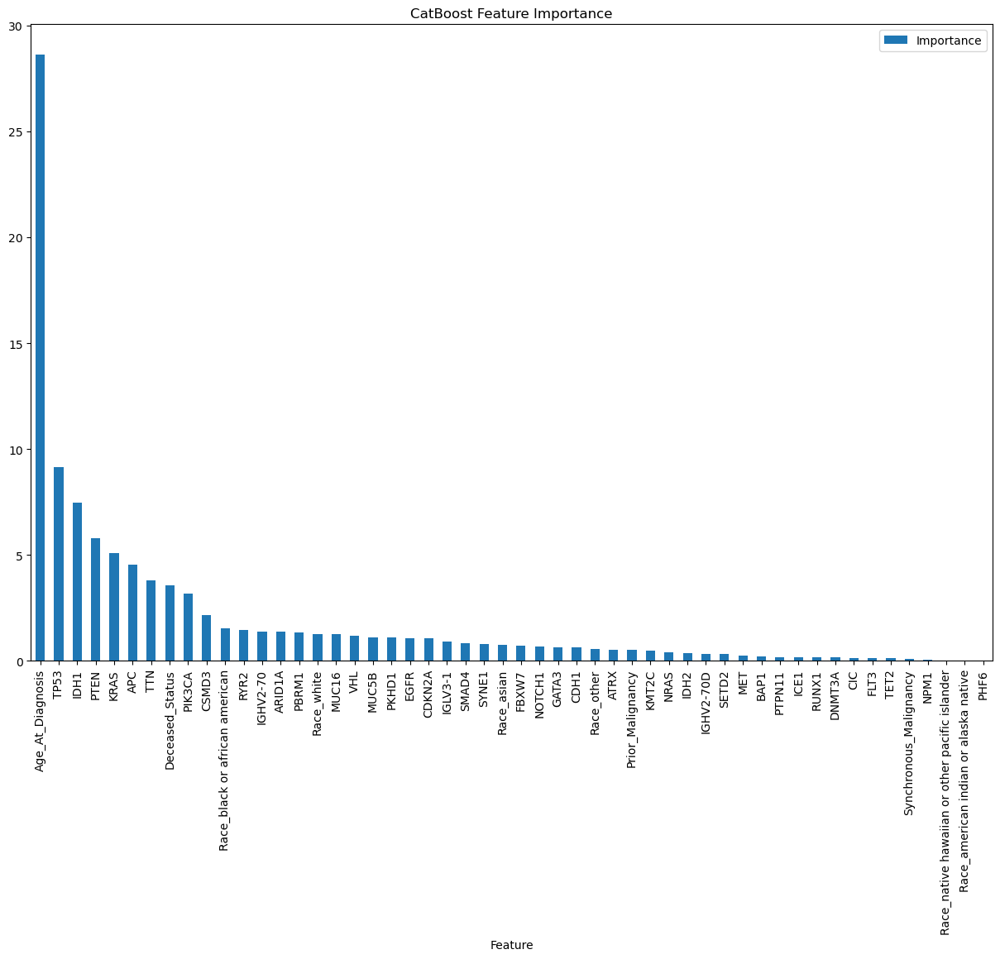

In [35]:
cat_feature_importance_df.plot(kind='bar', 
                                title='CatBoost Feature Importance', 
                                x='Feature', 
                                y='Importance', 
                                figsize=(15,10))

# Converting model to training job for deployment using joblib

In [36]:
import joblib

In [37]:
model_file_name = "tcga-catboost-classifier"
joblib.dump(cat_clf, model_file_name)

['tcga-catboost-classifier']

In [38]:
# Creating a sample testing csv to predict with the saved model
sample_test = cat_eval[0:5]
sample_test.head()

,Deceased_Status,Age_At_Diagnosis,Prior_Malignancy,Synchronous_Malignancy,TP53,PIK3CA,TTN,CDH1,GATA3,APC,...,PKHD1,ICE1,SMAD4,CDKN2A,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_native hawaiian or other pacific islander,Race_other,Race_white
1617,0,63.312328,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4952,0,58.882191,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2168,1,54.021919,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1090,0,48.657536,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,1
7757,0,50.230137,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1


In [39]:
sample_test.to_csv('tcga-catboost-test.csv', sep=',', index=False)

In [40]:
test_clf = joblib.load(model_file_name)

In [41]:
test_data = pd.read_csv('tcga-catboost-test.csv', sep=',')
test_data.head()

,Deceased_Status,Age_At_Diagnosis,Prior_Malignancy,Synchronous_Malignancy,TP53,PIK3CA,TTN,CDH1,GATA3,APC,...,PKHD1,ICE1,SMAD4,CDKN2A,Race_american indian or alaska native,Race_asian,Race_black or african american,Race_native hawaiian or other pacific islander,Race_other,Race_white
0,0,63.312330,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,58.882190,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,1,54.021920,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,48.657536,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,1
4,0,50.230137,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1


In [42]:
test_pred = test_clf.predict(test_data)
test_pred

array([[0],
       [2],
       [2],
       [2],
       [3]], dtype=int64)